# --- Section from: 00-Booklet for Linear Modeling ---


# Linear Modeling: From Theory to Toolset

## Table of Content

- [1. Data Audit & Cleaning](#1)
    - [1.1 Variable Inventory & Type Check](#1.1)
    - [1.2 Data Cleaning (Handling Missing Values)](#1.2)
    - [1.3 Linearity & Correlation Check](#1.3)
    - [1.4 Encoding Qualitative Data](#1.4)
    - [1.5 Feature Scaling (Standardization)](#1.5)
- [2. The Baseline Model (Inference)](#2)
    - [2.1 Fitting the OLS Model](#2.1)
    - [2.2 The Analyst's Checklist (The "Three Pillars")](#2.2)
- [3. Validation Strategy](#3)
    - [3.1 The Train-Test Split](#3.1)
    - [3.2 Performance Metrics](#3.2)
    - [3.3 K-Fold Cross-Validation](#3.3)
    - [3.4 Visual Validation](#3.4)
- [4. Model Refinement (Flexibility & Regularization)](#4)
    - [4.1 Feature Engineering](#4.1)
    - [4.2 Automated Regularization (Ridge & Lasso)](#4.2)
    - [4.3 Evaluating the "Shrinkage"](#4.3)
- [5. Final Evaluation (The Result)](#5)
- [6. The Post-Mortem (Troubleshooting)](#6)
    - [6.1 Identify the "Failure Mode"](#6.1)
    - [6.2 The "Outlier" Audit](#6.2)
    - [6.3 Checking for Multi-Collinearity (VIF)](#6.3)

<a id="1"></a>
## Phase 1: Data Audit & Cleaning
**Goal**: Interrogate, clean, and prepare the raw data for statistical modeling.

<a id="1.1"></a>
### 1.1 Variable Inventory & Type Check
Before modeling, we must identify the nature of our variables. Regression requires a quantitative $Y$, while Classification requires a qualitative $Y$.

- The Target ($Y$): mpg (Quantitative).
- The Predictors ($X$): horsepower, weight, acceleration, year, origin.
- *Manual Rule*: Always verify the "Type" in Python using df.info(). Sometimes numbers are stored as "objects" (strings), which will crash your model.

In [3]:
import pandas as pd

# Load the dataset
auto_df = pd.read_csv('Auto.csv')

# 1. Check data types and missing values
display(auto_df.info())

# 2. Preview the first few rows
auto_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392 entries, 0 to 391
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   mpg           392 non-null    float64
 1   cylinders     392 non-null    int64  
 2   displacement  392 non-null    float64
 3   horsepower    392 non-null    int64  
 4   weight        392 non-null    int64  
 5   acceleration  392 non-null    float64
 6   year          392 non-null    int64  
 7   origin        392 non-null    int64  
 8   name          392 non-null    object 
dtypes: float64(3), int64(5), object(1)
memory usage: 27.7+ KB


None

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


<a id="1.2"></a>
### 1.2 Data Cleaning (Handling Missing Values)
Statistical models cannot handle NaN or null values. We must decide whether to drop or impute.

- Step A: Identification: Replace non-standard missing values (like ?) with NaN.
- Step B: The Decision Matrix:
    - Option 1: Dropping. If missing values are rare (like the 5 rows in Auto), delete them.
    - Option 2: Imputation. If you have a small dataset and can't afford to lose rows, fill the gaps with the Median (more robust to outliers) or the Mean.

*Note: The ISLP Auto dataset is pre-cleaned, but in a real-world scenario, you might find placeholders like '?'.*

In [6]:
import numpy as np

# Replace common placeholders with actual NaN
auto_df.replace('?', np.nan, inplace=True)

# Identify missing counts
print("Missing values per column: \n", auto_df.isnull().sum())

# Decision: Drop rows with missing values (Standard ISLP approach)
auto_df = auto_df.dropna()

Missing values per column: 
 mpg             0
cylinders       0
displacement    0
horsepower      0
weight          0
acceleration    0
year            0
origin          0
name            0
dtype: int64


<a id="1.3"></a>
### 1.3 Linearity & Correlation Check
Linear models assume an additive relationship. We use visualization to flag variables that might require non-linear transformations later.

In [21]:
auto_df.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,392.0,23.445918,7.805007,9.0,17.000,22.75,29.000,46.6
cylinders,392.0,5.471939,1.705783,3.0,4.000,4.00,8.000,8.0
displacement,392.0,194.411990,104.644004,68.0,105.000,151.00,275.750,455.0
horsepower,392.0,104.469388,38.491160,46.0,75.000,93.50,126.000,230.0
weight,392.0,2977.584184,849.402560,1613.0,2225.250,2803.50,3614.750,5140.0
acceleration,392.0,15.541327,2.758864,8.0,13.775,15.50,17.025,24.8
year,392.0,75.979592,3.683737,70.0,73.000,76.00,79.000,82.0
origin,392.0,1.576531,0.805518,1.0,1.000,1.00,2.000,3.0


- What you observe: The scale (min/max), the central tendency (mean/median), and the spread (standard deviation) of every variable.

- Why it’s useful: * Scale Detection: You’ll see that weight is in the thousands while acceleration is in the tens. This tells you that Standardization is mandatory if you plan to use Ridge/Lasso.

- Outlier Scouting: If the max is significantly higher than the 75% percentile (the "mean + 3 std dev" rule), you have outliers that might pull a linear regression line away from the bulk of the data.

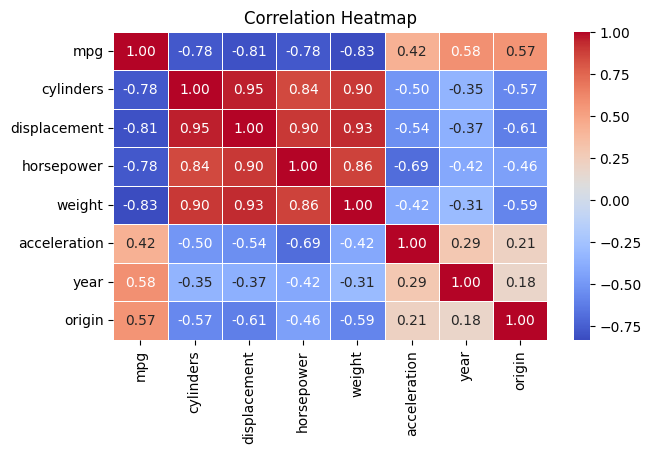

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = auto_df.select_dtypes(include=['number']).corr()

fig, ax = plt.subplots(figsize=(7, 4))
sns.heatmap(corr_matrix, 
            annot=True,      # This puts the actual numbers inside the squares
            cmap='coolwarm', # The color scheme (red for positive, blue for negative)
            fmt='.2f',       # Limits the numbers to 2 decimal places
            linewidths=0.5,  # Adds a tiny gap between squares for readability
            ax=ax)           # Tells seaborn to draw on our 'ax' canvas

ax.set_title('Correlation Heatmap')
plt.show()

- What you observe: The "redundancy" between predictors and the "strength" of the signal toward the target.
- Why it’s useful: * Spotting Multicollinearity: If two predictors (like displacement and weight) have a correlation of $0.90+$, they are telling the same story. Including both can make your coefficient estimates unstable and inflate p-values.
- Prioritizing Features: It gives you an immediate hint of which variables are the "stars of the show" (those with high positive or negative correlation with mpg).

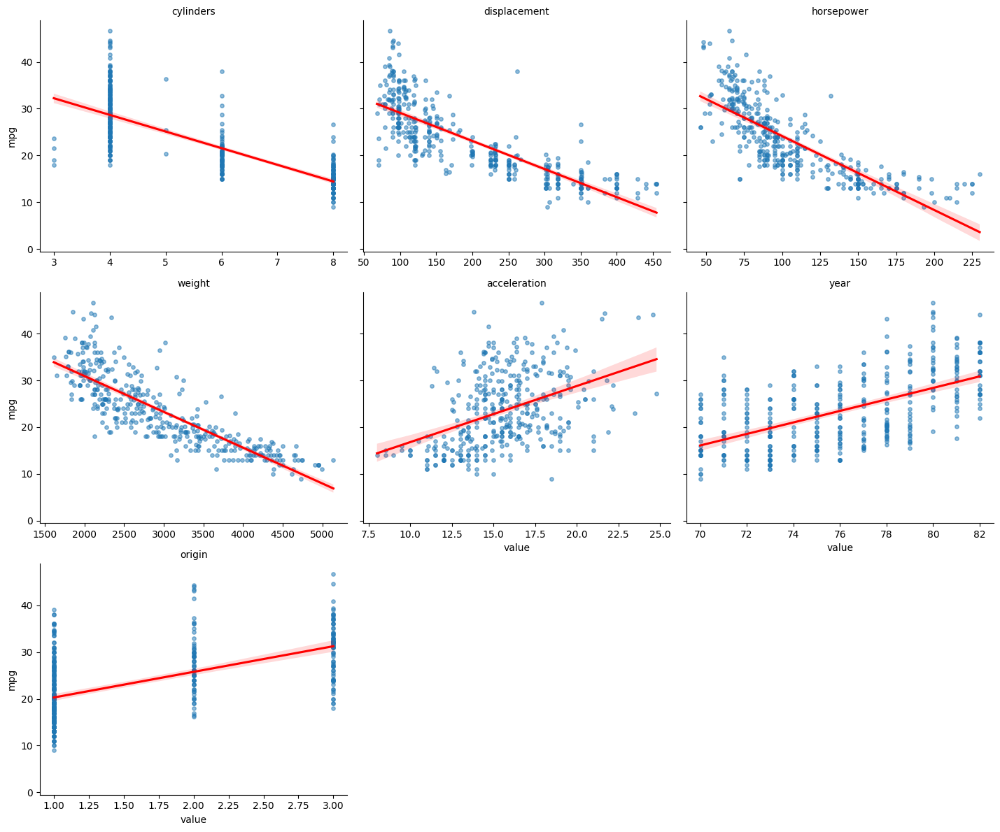

In [25]:
import warnings
warnings.filterwarnings('ignore')

# Filter for only numeric columns
numeric_df = auto_df.select_dtypes(include=['number'])
x_vars = [v for v in numeric_df.columns if v != 'mpg']

# 2. Reshape the data so all predictors are in a single column
df_melted = auto_df.melt(id_vars=['mpg'], value_vars=x_vars)

# 3. Create the grid
# col_wrap=3 handles the "3 per row" perfectly
g = sns.lmplot(
    data=df_melted, 
    x='value', 
    y='mpg', 
    col='variable', 
    col_wrap=3,
    sharex=False,  # Important: each variable has its own scale
    facet_kws={'sharey': True},
    scatter_kws={'s': 15, 'alpha': 0.5},
    line_kws={'color': 'red'},
    height=4, 
    aspect=1.2
)

# 4. Fix titles so they aren't "variable = weight"
g.set_titles("{col_name}")
plt.show()

- What you observe: The "shape" of the relationship and the "noise" (variance) around the line.
- Why it’s useful: * The Linearity Assumption: This is the ultimate test for ISLP Chapter 3. If the dots follow a curve (like a "U" or an arch) but the red line is straight, you are witnessing Underfitting. It tells the analyst: "A simple linear model will fail here; we need to square this term or use a spline."

<a id="1.4"></a>
### 1.4 Encoding Qualitative Data
Categorical variables (like origin) must be converted into numerical "Dummy Variables" so the math can process them.

- Action: Use Dummy Encoding for origin.

- Manual Logic: * Origin_2 = 1 if European, 0 otherwise.
    - Origin_3 = 1 if Japanese, 0 otherwise.
    - If both are 0, it defaults to American. This prevents the model from thinking the origins have a numerical ranking.

In [31]:
# Convert 'origin' to a categorical type first
auto_df['origin'] = auto_df['origin'].astype('category')

# Create dummy variables (dropping the first to avoid the Dummy Variable Trap)
auto_df_encoded = pd.get_dummies(auto_df, columns=['origin'], drop_first=True)

# Preview the new columns: origin_2 (European), origin_3 (Japanese)
auto_df_encoded.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,name,origin_2,origin_3
0,18.0,8,307.0,130,3504,12.0,70,chevrolet chevelle malibu,False,False
1,15.0,8,350.0,165,3693,11.5,70,buick skylark 320,False,False
2,18.0,8,318.0,150,3436,11.0,70,plymouth satellite,False,False
3,16.0,8,304.0,150,3433,12.0,70,amc rebel sst,False,False
4,17.0,8,302.0,140,3449,10.5,70,ford torino,False,False


<a id="1.5"></a>
### 1.5 Feature Scaling (Standardization)
To prepare for Regularization (Ridge/Lasso) in Phase 4, we must ensure all variables are on the same scale (Mean = 0, Std = 1).
- Action: Apply $Z$-score normalization: $z = \frac{x - \mu}{\sigma}$
- Why here? If we want to compare the "importance" of weight (thousands) vs. acceleration (tens), they must be on the same scale.


In [33]:
from sklearn.preprocessing import StandardScaler

# Select only numeric columns for scaling
# Note: Usually, we don't scale the Target (mpg) or Dummy Variables
numeric_cols = ['cylinders', 'displacement', 'horsepower', 'weight', 'acceleration', 'year']

scaler = StandardScaler()
auto_df_encoded[numeric_cols] = scaler.fit_transform(auto_df_encoded[numeric_cols])

# Verify the result (Mean should be approx 0, Std should be 1)
auto_df_encoded[numeric_cols].describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
cylinders,392.0,-0.0,1.0,-1.45,-0.86,-0.86,1.48,1.48
displacement,392.0,0.0,1.0,-1.21,-0.86,-0.42,0.78,2.49
horsepower,392.0,0.0,1.0,-1.52,-0.77,-0.29,0.56,3.27
weight,392.0,-0.0,1.0,-1.61,-0.89,-0.21,0.75,2.55
acceleration,392.0,-0.0,1.0,-2.74,-0.64,-0.01,0.54,3.36
year,392.0,-0.0,1.0,-1.63,-0.81,0.01,0.82,1.64


<a id="2"></a>
## Phase 2: The Baseline Model (Inference)
Goal: Establish a performance floor using Ordinary Least Squares (OLS) and evaluate the statistical significance of our predictors.

<a id="2.1"></a>
### 2.1 Fitting the OLS Model
We use statsmodels here because it automatically calculates p-values and confidence intervals, which scikit-learn does not do easily.

In [35]:
print(X.dtypes[X.dtypes == 'object'])

Series([], dtype: object)


In [36]:
import statsmodels.api as sm

# 1. Reset everything to be safe
# We ensure X and y are perfectly aligned by using the same index
X = auto_df_encoded.drop(columns=['mpg', 'name']).copy()
y = auto_df_encoded['mpg'].copy()

# 2. Force conversion to float and drop any stray non-numeric columns
X = X.select_dtypes(include=['number']).astype(float)

# 3. Add the constant
X = sm.add_constant(X)

# 4. Fit the model
# Using .values can sometimes bypass Pandas/Statsmodels alignment bugs
baseline_model = sm.OLS(y, X).fit()

display(baseline_model.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     272.2
Date:                Sun, 12 Apr 2026   Prob (F-statistic):          3.79e-135
Time:                        17:04:55   Log-Likelihood:                -1036.5
No. Observations:                 392   AIC:                             2087.
Df Residuals:                     385   BIC:                             2115.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           23.4459      0.174    135.130      0.000      23.105      23.787
cylinders       -0.5619      0.566     -0.993      0.321      -1.674       0.550
displacement     0.8025      0.769      1.044      0.297      -0.709       2.314
horsepower      -0.0150      0.532     -0.028      0.977      -1.061       1.031
weight          -5.7640      0.568    -10.141      0.000      -6.882      -4.646
acceleration     0.2350      0.281      0.836      0.404      -0.318       0.788
year             2.7717      0.194     14.318      0.000       2.391       3.152
==============================================================================
Omnibus:                       37.865   Durbin-Watson:                   1.232
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               60.248
Skew:                           0.630   Prob(JB):                     8.26e-14
Kurtosis:                       4.449   Cond. No.                         10.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<a id="2.2"></a>
### 2.2 The Analyst's Checklist (The "Three Pillars")
When you look at the summary output above, your manual should guide you to look at these three specific areas:
- A. The Global Fit (Is the model useful?)
    - R-squared / Adj. R-squared: This tells you the percentage of variance explained.
        - Observation: If $R^2$ is high (e.g., > 0.70), your linear baseline is strong.
- Prob (F-statistic): This tests if all coefficients are zero.
    - Observation: If this is $< 0.05$, your model is statistically better than just guessing the average mpg.
- B. The Feature Significance (Which variables matter?)
    - P > |t| (p-values): * Observation: If $p < 0.05$, the variable is a significant predictor. In the Auto dataset, you might find weight is significant, while acceleration is not. This tells the analyst: "We might be able to simplify this model."
    - Coef (Coefficients): * Observation: Since we scaled our data in Phase 1, you can compare these directly. A larger absolute coefficient means that variable has more "pull" on the mpg.
- C. The Residual Diagnostics (The "Straight Line" Test)
    - We must check if our errors are random. If they aren't, our model is missing something.

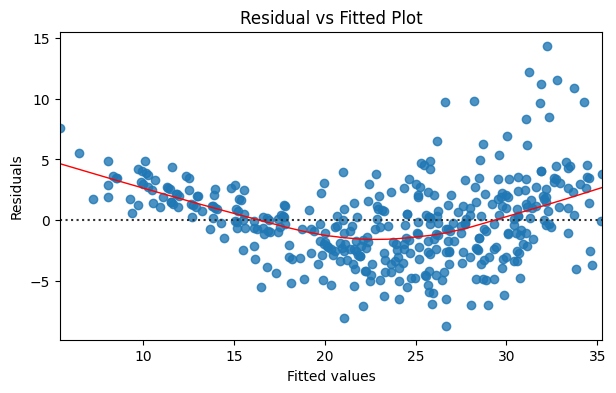

In [38]:
# Plotting Residuals vs Fitted values
plt.figure(figsize=(7, 4))
sns.residplot(x=baseline_model.fittedvalues, y=baseline_model.resid, lowess=True, 
              line_kws={'color': 'red', 'lw': 1})
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residual vs Fitted Plot')
plt.show()

<a id="3"></a>
## Phase 3: Validation Strategy
Goal: Shift from "explaining the past" to "predicting the future" by ensuring the model generalizes to unseen data.

<a id="3.1"></a>
### 3.1 The Train-Test Split
We set aside a "lockbox" of data (the Test Set) that the model never sees during training.

In [39]:
from sklearn.model_selection import train_test_split

# Define X (features) and y (target)
# We use the encoded and scaled dataframe from Phase 1
X = auto_df_encoded.drop(columns=['mpg', 'name'])
y = auto_df_encoded['mpg']

# Split: 80% Training, 20% Testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training observations: {len(X_train)}")
print(f"Test observations: {len(X_test)}")

Training observations: 313
Test observations: 79


<a id="3.2"></a>
### 3.2 Performance Metrics
A. We use MAE and RMSE to understand the error in real-world units (Miles Per Gallon).

In [49]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

model_lr = LinearRegression()
model_lr.fit(X_train, y_train)

# Make Predictions
# We predict on the 'Test' set (data the model has NEVER seen)
y_pred = model_lr.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae:.2f} MPG")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f} MPG")
print(f"R-squared Score: {r2:.2f}")

Mean Absolute Error (MAE): 2.46 MPG
Root Mean Squared Error (RMSE): 3.26 MPG
R-squared Score: 0.79


<a id="3.3"></a>
### 3.3 K-Fold Cross-Validation
To avoid getting a "lucky" split, we use $k$-fold CV. This splits the training data into $k$ pieces, training on $k-1$ and validating on the last piece, repeating this $k$ times.

In [50]:
# 10-fold Cross-Validation
cv_mse = cross_val_score(model_lr, X_train, y_train, cv=10, scoring='neg_mean_squared_error')
cv_rmse = np.sqrt(-cv_mse)

print(f"CV RMSE Mean: {cv_rmse.mean():.3f}")

CV RMSE Mean: 3.396


<a id="3.4"></a>
### 3.4 Visual Validation
Once the model is trained, we evaluate it on the Test Set. We want to know not just "if" it's wrong, but "how" it's wrong.

B. Prediction Audit Table
Seeing the raw numbers side-by-side helps identify if specific rows are causing massive errors.

In [51]:
# Create a comparison table for the first 10 test samples
comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
comparison_df['Error'] = comparison_df['Actual'] - comparison_df['Predicted']

display(comparison_df.head(10))

,Actual,Predicted,Error
78,26.0,26.623086,-0.623086
274,21.6,26.902469,-5.302469
246,36.1,34.265982,1.834018
55,26.0,24.441176,1.558824
387,27.0,28.235414,-1.235414
203,28.0,30.182539,-2.182539
42,13.0,8.561005,4.438995
233,26.0,30.349163,-4.349163
150,19.0,20.381536,-1.381536
116,29.0,29.446287,-0.446287


C. Visualizing the "Perfect Fit"
In a perfect world, all dots would fall on the red dashed line ($y=x$). Deviations from this line show the model's limitations.

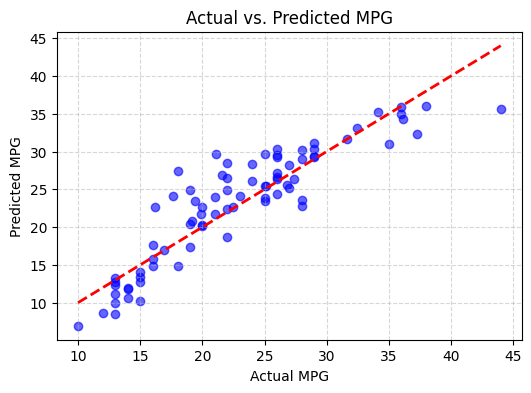

In [53]:
plt.figure(figsize=(6, 4))
plt.scatter(y_test, y_pred, alpha=0.6, color='blue')

# Draw the 'Perfect Prediction' line
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)

plt.xlabel('Actual MPG')
plt.ylabel('Predicted MPG')
plt.title('Actual vs. Predicted MPG')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

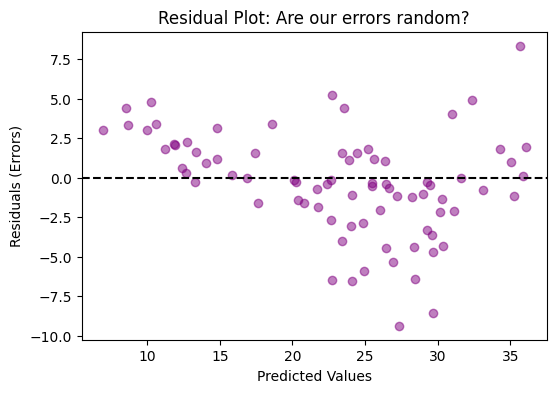

In [54]:
residuals = y_test - y_pred

plt.figure(figsize=(6, 4))
plt.scatter(y_pred, residuals, color='purple', alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--')

plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Errors)')
plt.title('Residual Plot: Are our errors random?')
plt.show()

Why this is useful for the Analyst:
- The Identity Line ($y=x$): If the dots curve away from the red line at the high end, it tells the analyst the model is "clueless" about high-efficiency cars.
- The Residual Pattern: If you see a "U-shape" in the purple dots, your model is biased. It means the relationship in the data is actually non-linear (Chapter 7), and no matter how much you "tune" a linear model, you won't fix it.
- MAE vs. RMSE: If your RMSE is much higher than your MAE, it tells you that you have a few outliers where the model is massively wrong, as RMSE penalizes large errors more heavily.

<a id="4"></a>
## Phase 4: Model Refinement (Flexibility & Regularization)
Goal: Improve performance by capturing non-linear relationships and interactions, while using Ridge/Lasso to prevent overfitting.

<a id="4.1"></a>
### 4.1 Feature Engineering (The "Flexibility" Boost)
If our residual plot in Phase 3 showed a "U-shape," we need to add non-linear terms. We can also add Interactions (e.g., how horsepower and weight work together).

In [55]:
from sklearn.preprocessing import PolynomialFeatures

# 1. Create Polynomial & Interaction terms (Degree 2)
# interaction_only=False includes squared terms like horsepower^2
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
X_poly = poly.fit_transform(X) # X is our scaled features from Phase 1

# Get the names of the new features (e.g., 'horsepower^2' or 'horsepower weight')
poly_feature_names = poly.get_feature_names_out(X.columns)
X_poly_df = pd.DataFrame(X_poly, columns=poly_feature_names)

# 2. Re-split the expanded data
X_train_p, X_test_p, y_train, y_test = train_test_split(X_poly_df, y, test_size=0.2, random_state=42)

print(f"Original features: {X.shape[1]}")
print(f"Expanded features (Squares + Interactions): {X_poly_df.shape[1]}")

Original features: 8
Expanded features (Squares + Interactions): 44


<a id="4.2"></a>
### 4.2 Automated Regularization (Ridge & Lasso)
Now that we have many features, we use Cross-Validation to find the optimal penalty ($\alpha$). This prevents the model from assigning too much importance to "noisy" interaction terms.

In [56]:
from sklearn.linear_model import RidgeCV, LassoCV

# Define a range of alphas to test
alphas = np.logspace(-3, 3, 100)

# 1. Ridge Regression (L2): Shrinks coefficients
ridge_model = RidgeCV(alphas=alphas, cv=10).fit(X_train_p, y_train)

# 2. Lasso Regression (L1): Performs Feature Selection
lasso_model = LassoCV(alphas=alphas, cv=10, max_iter=10000).fit(X_train_p, y_train)

print(f"Optimal Ridge Alpha: {ridge_model.alpha_:.4f}")
print(f"Optimal Lasso Alpha: {lasso_model.alpha_:.4f}")

Optimal Ridge Alpha: 2.4771
Optimal Lasso Alpha: 0.0107


<a id="4.3"></a>
### 4.3 Evaluating the "Shrinkage"
The analyst should check which features actually survived the Lasso penalty. This is essentially "Automated Data Science."

In [57]:
# Create a coefficient comparison table
coef_df = pd.DataFrame({
    'Feature': poly_feature_names,
    'Ridge_Coef': ridge_model.coef_,
    'Lasso_Coef': lasso_model.coef_
})

# Filter for Lasso's chosen features
significant_features = coef_df[coef_df['Lasso_Coef'] != 0]
print(f"Lasso kept {len(significant_features)} out of {len(poly_feature_names)} features.")
display(significant_features.sort_values(by='Lasso_Coef', ascending=False))

Lasso kept 29 out of 44 features.


,Feature,Ridge_Coef,Lasso_Coef
5,year,2.531609,2.641934
43,origin_3^2,1.186251,2.572191
36,acceleration origin_2,2.311085,2.550855
15,cylinders origin_3,2.040497,2.511982
11,cylinders weight,1.413424,2.299709
20,displacement year,1.972339,1.747582
37,acceleration origin_3,1.295386,1.410648
35,acceleration year,0.781773,0.848262
12,cylinders acceleration,1.271791,0.835879
39,year origin_2,0.807197,0.516226


#### Why is Phase 4 useful to the analyst?
- 1. Capturing Complexity without ChaosBy adding squared terms (like $horsepower^2$), you allow the model to follow the curve we saw in the Auto dataset. By using Lasso, you ensure that if $horsepower^2$ is useful but $acceleration^2$ is useless, the model automatically ignores the latter.
- 2. Solving MulticollinearityInteraction terms and squared terms are naturally highly correlated with the original variables. A standard OLS model would produce wild, unreliable coefficients. Ridge Regression stabilizes these by spreading the "penalty" across all correlated features.
- 3. The "Elbow" of the Bias-Variance TradeoffIn this phase, you are actively finding the "sweet spot" on the curve. By increasing flexibility (Poly features) and then controlling it (Regularization), you reach a lower total error than you ever could with a simple straight line.

<a id="5"></a>
## Phase 5: Final Evaluation (The Result)
Goal: Now that Lasso has picked our "Best Features," we run the final test. This is the last block of your manual.

In [67]:
# 1. Final Predictions using the Lasso model
y_pred_final = lasso_model.predict(X_test_p)

# 2. Final Metric Calculation
final_rmse = np.sqrt(mean_squared_error(y_test, y_pred_final))
final_r2 = r2_score(y_test, y_pred_final)

print(f"--- FINAL MODEL PERFORMANCE ---")
print(f"Final Test RMSE: {final_rmse:.2f} MPG")
print(f"Final Test R-squared: {final_r2:.4f}")

--- FINAL MODEL PERFORMANCE ---
Final Test RMSE: 2.66 MPG
Final Test R-squared: 0.8610


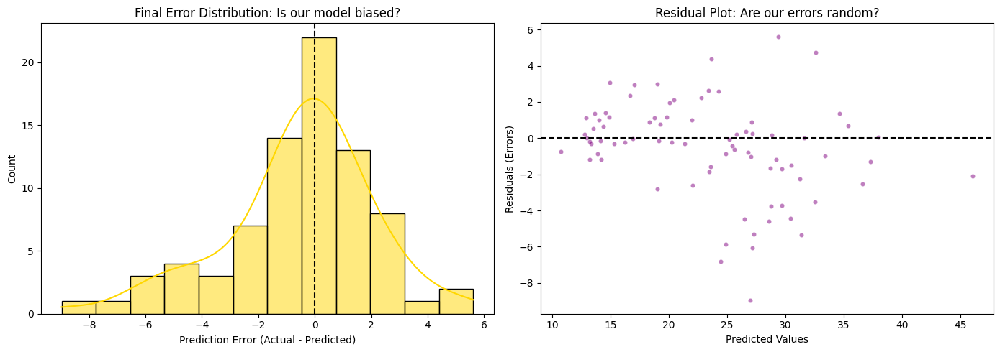

In [72]:
# Calculate residuals
final_errors = y_test - y_pred_final

# Create a figure with 1 row and 2 columns
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# 1. Error Distribution (Left Plot)
sns.histplot(final_errors, kde=True, color='gold', ax=ax[0])
ax[0].axvline(x=0, color='black', linestyle='--')
ax[0].set_title('Final Error Distribution: Is our model biased?')
ax[0].set_xlabel('Prediction Error (Actual - Predicted)')

# 2. Residual Plot (Right Plot)
sns.scatterplot(x=y_pred_final, y=final_errors, color='purple', alpha=0.5, s=20, ax=ax[1])
ax[1].axhline(y=0, color='black', linestyle='--')
ax[1].set_title('Residual Plot: Are our errors random?')
ax[1].set_xlabel('Predicted Values')
ax[1].set_ylabel('Residuals (Errors)')

plt.tight_layout()
plt.show()

<a id="6"></a>
## Phase 6: The Post-Mortem (Troubleshooting)
Goal: Diagnose why the model is underperforming and determine the next steps for improvement.

<a id="6.1"></a>
### 6.1 Identify the "Failure Mode"

| Symptom | Diagnosis | Potential Fix |
| :--- | :--- | :--- |
| **High Training Error & High Test Error** | High Bias (Underfitting) | Your model is too simple. Add non-linear terms ($X^2$), interactions, or move to more complex models (Trees/Boosting). |
| **Low Training Error but High Test Error** | High Variance (Overfitting) | Your model "memorized" the noise. Increase the Lasso/Ridge penalty ($\alpha$), or gather more data. |
| **Residuals show a clear pattern (e.g., U-shape)** | Functional Misspecification | You are using a straight line for a curved relationship. You need Polynomials or Log-transformations. |
| **Error distribution is "Skewed" (not a bell curve)** | Target Skewness | Your target ($y$) might need a log-transform (common with prices or salaries). |

<a id="6.2"></a>
### 6.2 The "Outlier" Audit

In [73]:
# Calculate absolute errors
comparison_df['Abs_Error'] = comparison_df['Error'].abs()

# Look at the top 1% of errors
threshold = comparison_df['Abs_Error'].quantile(0.99)
outliers = comparison_df[comparison_df['Abs_Error'] > threshold]

print(f"Top 1% of errors contribute heavily to RMSE. Inspecting {len(outliers)} rows:")
display(outliers)

Top 1% of errors contribute heavily to RMSE. Inspecting 1 rows:


,Actual,Predicted,Error,Abs_Error
110,18.0,27.367018,-9.367018,9.367018


<a id="6.3"></a>
### 6.3 Checking for Multi-Collinearity (VIF)

In [75]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# 1. Ensure we are only looking at numeric columns
# 2. IMPORTANT: If X_train already has a 'const' column from sm.add_constant, 
#    keep it! VIF requires the intercept to be present for the math to be valid.
X_vif = X_train.select_dtypes(include=['number'])

# If you haven't added a constant yet, uncomment the line below:
# import statsmodels.api as sm
# X_vif = sm.add_constant(X_vif)

# 3. Calculate VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = X_vif.columns
vif_data["VIF"] = [
    variance_inflation_factor(X_vif.values, i) 
    for i in range(len(X_vif.columns))
]

# 4. Display, usually excluding the 'const' row from the final view 
# as its VIF doesn't matter for multicollinearity checks
display(vif_data[vif_data["Feature"] != 'const'].sort_values(by="VIF", ascending=False))

,Feature,VIF
1,displacement,19.271259
0,cylinders,10.961738
3,weight,10.029538
2,horsepower,9.380948
4,acceleration,2.677462
5,year,1.278661


**--- End of Section: 00-Booklet for Linear Modeling ---**

---


# --- Section from: 02.3-Introduction_to_Python ---


In [8]:
auto = pd.read_csv("Auto.csv")
display(auto.head(10))
display(auto.shape)

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino
5,15.0,8,429.0,198,4341,10.0,70,1,ford galaxie 500
6,14.0,8,454.0,220,4354,9.0,70,1,chevrolet impala
7,14.0,8,440.0,215,4312,8.5,70,1,plymouth fury iii
8,14.0,8,455.0,225,4425,10.0,70,1,pontiac catalina
9,15.0,8,390.0,190,3850,8.5,70,1,amc ambassador dpl


(392, 9)

In [5]:
auto.dtypes

mpg             float64
cylinders         int64
displacement    float64
horsepower        int64
weight            int64
acceleration    float64
year              int64
origin            int64
name             object
dtype: object

In [38]:
auto.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,392.0,23.445918,7.805007,9.0,17.000,22.75,29.000,46.6
cylinders,392.0,5.471939,1.705783,3.0,4.000,4.00,8.000,8.0
displacement,392.0,194.411990,104.644004,68.0,105.000,151.00,275.750,455.0
horsepower,392.0,104.469388,38.491160,46.0,75.000,93.50,126.000,230.0
weight,392.0,2977.584184,849.402560,1613.0,2225.250,2803.50,3614.750,5140.0
acceleration,392.0,15.541327,2.758864,8.0,13.775,15.50,17.025,24.8
year,392.0,75.979592,3.683737,70.0,73.000,76.00,79.000,82.0
origin,392.0,1.576531,0.805518,1.0,1.000,1.00,2.000,3.0


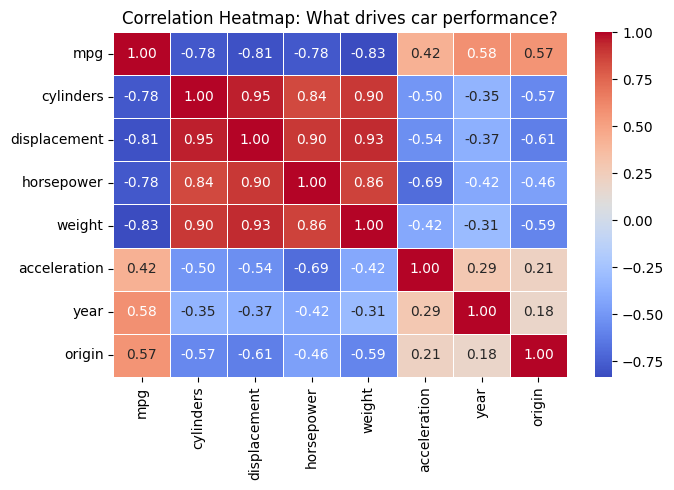

In [49]:
# 1. Calculate the correlations (only for numerical columns)
# .corr() calculates a score from -1 to 1 for every pair of columns
corr_matrix = auto.select_dtypes(include=['number']).corr()

# 2. Create the figure and axis
fig, ax = plt.subplots(figsize=(7, 5))

# 3. Create the heatmap
sns.heatmap(corr_matrix, 
            annot=True,      # This puts the actual numbers inside the squares
            cmap='coolwarm', # The color scheme (red for positive, blue for negative)
            fmt='.2f',       # Limits the numbers to 2 decimal places
            linewidths=0.5,  # Adds a tiny gap between squares for readability
            ax=ax)           # Tells seaborn to draw on our 'ax' canvas

ax.set_title('Correlation Heatmap: What drives car performance?')

plt.tight_layout()
plt.show()

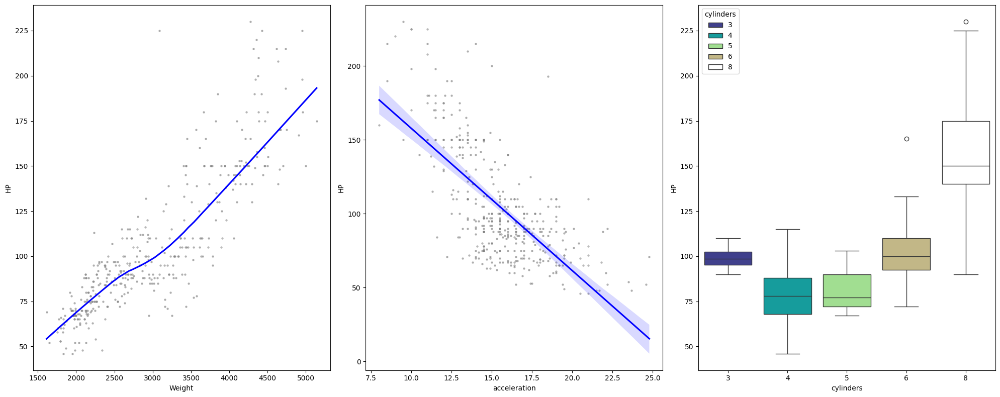

In [48]:
# Create a figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# Plot 1: 'lowess=True' creates that smooth, non-linear blue line
sns.regplot(x='weight', y='horsepower', data=auto, ax=axes[0], 
            scatter_kws={'color': 'gray', 's': 5, 'alpha': 0.5}, 
            line_kws={'color': 'blue'}, lowess=True)
axes[0].set_xlabel('Weight')
axes[0].set_ylabel('HP')

# Plot 2
sns.regplot(x='acceleration', y='horsepower', data=auto, ax=axes[1], 
            scatter_kws={'color': 'gray', 's': 5, 'alpha': 0.5}, 
            line_kws={'color': 'blue'})
axes[1].set_xlabel('acceleration')
axes[1].set_ylabel('HP')

# Plot 3
sns.boxplot(x='cylinders', y='horsepower', hue='cylinders', data=auto, ax=axes[2], 
            palette='terrain')
axes[2].set_xlabel('cylinders')
axes[2].set_ylabel('HP')

plt.tight_layout()
plt.show()

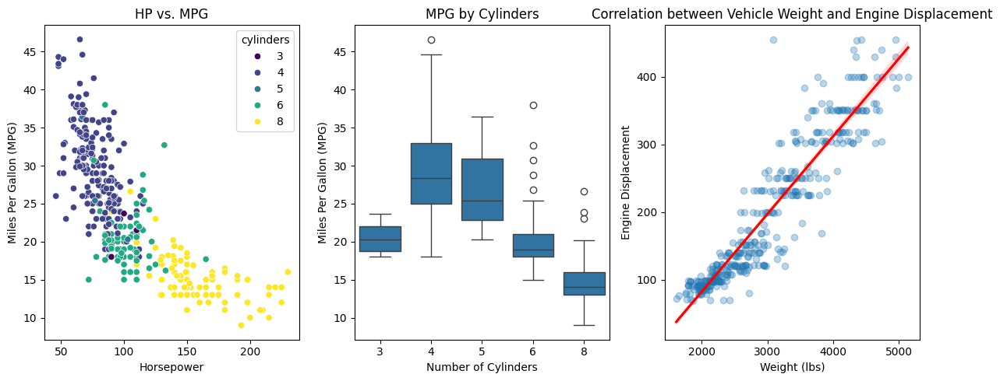

In [41]:
fig, ax = plt.subplots(1, 3, figsize=(12, 5))

# 2. First Plot: Scatterplot on ax[0] (the left side)
sns.scatterplot(data=auto, x='horsepower', y='mpg', hue='cylinders', palette='viridis', ax=ax[0])
ax[0].set_title('HP vs. MPG')
ax[0].set_xlabel('Horsepower')
ax[0].set_ylabel('Miles Per Gallon (MPG)')

# 3. Second Plot: Boxplot on ax[1] (the right side)
sns.boxplot(data=auto, x='cylinders', y='mpg', ax=ax[1])
ax[1].set_title('MPG by Cylinders')
ax[1].set_xlabel('Number of Cylinders')
ax[1].set_ylabel('Miles Per Gallon (MPG)')

sns.regplot(data=auto, x='weight', y='displacement', 
            scatter_kws={'alpha':0.3}, line_kws={'color':'red'}, ax=ax[2])

ax[2].set_title('Correlation between Vehicle Weight and Engine Displacement')
ax[2].set_xlabel('Weight (lbs)')
ax[2].set_ylabel('Engine Displacement')

# 4. Clean up the spacing so labels don't overlap
plt.tight_layout()
plt.show()

In [7]:
wage = pd.read_csv("Wage.csv")
wage.head(10)

,year,age,maritl,race,education,region,jobclass,health,health_ins,logwage,wage
0,2006,18,1. Never Married,1. White,1. < HS Grad,2. Middle Atlantic,1. Industrial,1. <=Good,2. No,4.318063,75.043154
1,2004,24,1. Never Married,1. White,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,2. No,4.255273,70.476020
2,2003,45,2. Married,1. White,3. Some College,2. Middle Atlantic,1. Industrial,1. <=Good,1. Yes,4.875061,130.982177
3,2003,43,2. Married,3. Asian,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,1. Yes,5.041393,154.685293
4,2005,50,4. Divorced,1. White,2. HS Grad,2. Middle Atlantic,2. Information,1. <=Good,1. Yes,4.318063,75.043154
5,2008,54,2. Married,1. White,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,1. Yes,4.845098,127.115744
6,2009,44,2. Married,4. Other,3. Some College,2. Middle Atlantic,1. Industrial,2. >=Very Good,1. Yes,5.133021,169.528538
7,2008,30,1. Never Married,3. Asian,3. Some College,2. Middle Atlantic,2. Information,1. <=Good,1. Yes,4.716003,111.720849
8,2006,41,1. Never Married,2. Black,3. Some College,2. Middle Atlantic,2. Information,2. >=Very Good,1. Yes,4.778151,118.884359
9,2004,52,2. Married,1. White,2. HS Grad,2. Middle Atlantic,2. Information,2. >=Very Good,1. Yes,4.857332,128.680488


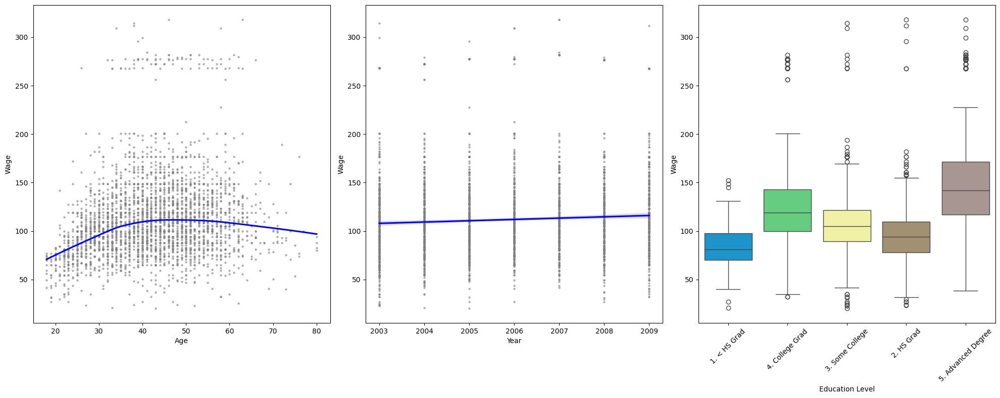

In [26]:
# Create a figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# Plot 1: Age vs Wage
# 'lowess=True' creates that smooth, non-linear blue line
sns.regplot(x='age', y='wage', data=wage, ax=axes[0], 
            scatter_kws={'color': 'gray', 's': 5, 'alpha': 0.5}, 
            line_kws={'color': 'blue'}, lowess=True)
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Wage')

# Plot 2: Year vs Wage
sns.regplot(x='year', y='wage', data=wage, ax=axes[1], 
            scatter_kws={'color': 'gray', 's': 5, 'alpha': 0.5}, 
            line_kws={'color': 'blue'})
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Wage')

# Plot 3: Education vs Wage
# We use 'hue' to get the different colors seen in the book
sns.boxplot(x='education', y='wage', hue='education', data=wage, ax=axes[2], 
            palette='terrain', legend=False)
axes[2].set_xlabel('Education Level')
axes[2].set_ylabel('Wage')
axes[2].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

**--- End of Section: 02.3-Introduction_to_Python ---**

---


# --- Section from: 03.6.1-S_Linear_Regression ---


# Simple Linear Regression

### 1. The Statsmodels Approach

**Focus**: Inference, Significance, and Causality.

- In this version, you care about the relationship itself. You want to know if lstat is a "real" driver of price and how much weight it carries.

**Primary Research Question:**

- *To what extent is there a statistically significant relationship between neighborhood socioeconomic status (`lstat`) and median home values (`medv`), and what is the specific magnitude of that effect?*

In [10]:
bs = pd.read_csv("Boston.csv")
display(bs.head(10))
display(bs.shape)

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,5.33,36.2
5,0.02985,0.0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,5.21,28.7
6,0.08829,12.5,7.87,0,0.524,6.012,66.6,5.5605,5,311,15.2,12.43,22.9
7,0.14455,12.5,7.87,0,0.524,6.172,96.1,5.9505,5,311,15.2,19.15,27.1
8,0.21124,12.5,7.87,0,0.524,5.631,100.0,6.0821,5,311,15.2,29.93,16.5
9,0.17004,12.5,7.87,0,0.524,6.004,85.9,6.5921,5,311,15.2,17.10,18.9


(506, 13)

In [16]:
X = pd.DataFrame({'intercept': np.ones(bs.shape[0]),
'lstat': bs['lstat']})
X.head()

,intercept,lstat
0,1.0,4.98
1,1.0,9.14
2,1.0,4.03
3,1.0,2.94
4,1.0,5.33


In [20]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
intercept,506.0,1.000000,0.000000,1.00,1.00,1.00,1.000,1.00
lstat,506.0,12.653063,7.141062,1.73,6.95,11.36,16.955,37.97


In [17]:
y = bs['medv']
model = sm.OLS(y, X)
results = model.fit()

In [18]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   medv   R-squared:                       0.544
Model:                            OLS   Adj. R-squared:                  0.543
Method:                 Least Squares   F-statistic:                     601.6
Date:                Fri, 03 Apr 2026   Prob (F-statistic):           5.08e-88
Time:                        18:01:05   Log-Likelihood:                -1641.5
No. Observations:                 506   AIC:                             3287.
Df Residuals:                     504   BIC:                             3295.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     34.5538      0.563     61.415      0.000      33.448      35.659
lstat         -0.9500      0.039    -24.528      0.000      -1.026      -0.874
==============================================================================
Omnibus:                      137.043   Durbin-Watson:                   0.892
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              291.373
Skew:                           1.453   Prob(JB):                     5.36e-64
Kurtosis:                       5.319   Cond. No.                         29.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

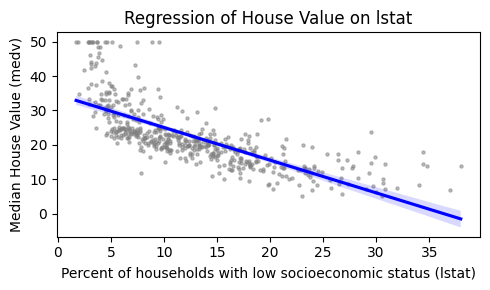

In [24]:
fig, ax = plt.subplots(figsize=(5, 3))

sns.regplot(x='lstat', y='medv', data=bs, 
            scatter_kws={'color': 'gray', 's': 5, 'alpha': 0.5}, 
            line_kws={'color': 'blue'})

ax.set_title('Regression of House Value on lstat')
ax.set_xlabel('Percent of households with low socioeconomic status (lstat)')
ax.set_ylabel('Median House Value (medv)')

plt.tight_layout()
plt.show()

### 2. The Scikit-Learn Approach: "The Predictor"

**Focus:** Accuracy, Generalization, and Performance.

- In this version, you don't actually care why the relationship exists as much as you care about how well you can guess the price of a house you’ve never seen before.

**Primary Research Question:**

- *Can a linear model trained on socioeconomic data (lstat) accurately generalize to unseen neighborhoods to predict median home values within a tolerable margin of error?*

In [28]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [26]:
# 1. Define X and y (Simple version, no manual intercept needed)
X = bs[['lstat']] 
y = bs['medv']

# 2. Split the data
# We keep 20% of the data in a "vault" to test the model later
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 3. Initialize and Train
model = LinearRegression()
model.fit(X_train, y_train)

# 4. Make Predictions
# We predict on the 'Test' set (data the model has NEVER seen)
y_pred = model.predict(X_test)

In [29]:
# How far off are our predictions on average?
mse = mean_squared_error(y_test, y_pred)
# How much of the 'Test' data variance did we capture?
r2 = r2_score(y_test, y_pred)
# Error in actual dollar units
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(33.52) # Square root of your MSE

print(f"MAE: {mae:.2f} ($1000s)")
print(f"RMSE: {rmse:.2f} ($1000s)")
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared Score: {r2:.2f}")

MAE: 4.18 ($1000s)
RMSE: 5.79 ($1000s)
Mean Squared Error: 33.52
R-squared Score: 0.54


In [30]:
# Create a comparison table
comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Add a column for the specific error (Residual)
comparison_df['Error'] = comparison_df['Actual'] - comparison_df['Predicted']

display(comparison_df.head(10))

,Actual,Predicted,Error
173,23.6,26.099510,-2.499510
274,32.4,31.425096,0.974904
491,13.6,17.371736,-3.771736
72,22.8,29.501699,-6.701699
452,16.1,18.144961,-2.044961
76,20.0,23.267575,-3.267575
316,17.8,17.120438,0.679562
140,14.0,11.485563,2.514437
471,19.6,22.397697,-2.797697
500,16.8,20.986562,-4.186562


#### The "Identity Plot" 

Instead of a scatter plot with a line, the gold standard for evaluating predictions is an Actual vs. Predicted Plot.If your model was perfect, every dot would fall on a $45^\circ$ diagonal line. Dots far away from that line are your "failures."

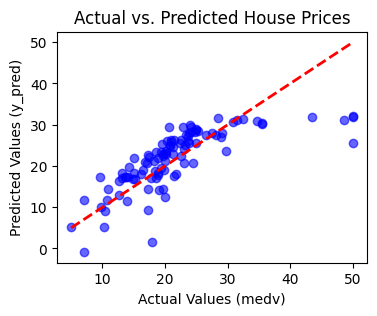

In [35]:
plt.figure(figsize=(4, 3))
plt.scatter(y_test, y_pred, alpha=0.6, color='blue')

# Draw the 'Perfect Prediction' line
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)

plt.xlabel('Actual Values (medv)')
plt.ylabel('Predicted Values (y_pred)')
plt.title('Actual vs. Predicted House Prices')
plt.show()

#### The Residual Plot (The "Health Check")

This graph plots your Errors on the Y-axis.
- **Goal:** The dots should look like a random "cloud" around the zero line.
- **Warning:** If you see a "U-shape" or a "Funnel-shape," it means your linear model is missing a non-linear pattern in the data (e.g., house prices might drop faster than a straight line allows).

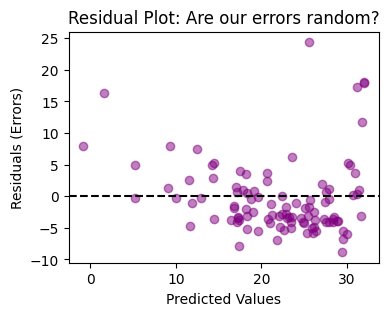

In [37]:
residuals = y_test - y_pred
plt.figure(figsize=(4, 3))
plt.scatter(y_pred, residuals, color='purple', alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Errors)')
plt.title('Residual Plot: Are our errors random?')
plt.show()

### 3. Annex - OLS Regression Output

#### Model Structure

- **Dependent Variable (Dep. Variable)**  
  The response variable $Y$ being modeled.  
  Formally, we estimate the conditional expectation $\mathbb{E}[Y \mid X]$.

- **Model (OLS)**  
  Ordinary Least Squares estimator. It chooses coefficients $\hat{\beta}$ to minimize:
  $$
  \sum_{i=1}^n (y_i - \hat{y}_i)^2
  $$

- **Number of Observations (No. Observations)**  
  The sample size $n$, i.e., number of data points.

- **Degrees of Freedom (Df Model)**  
  Number of explanatory variables (excluding the intercept).

- **Degrees of Freedom (Df Residuals)**  
  Remaining degrees of freedom after estimation:
  $$
  n - p
  $$
  where $p$ is the number of estimated parameters (including intercept).

#### Goodness of Fit

- **R-squared ($R^2$)**  
  Proportion of variance in $Y$ explained by the model:
  $$
  R^2 = 1 - \frac{\text{RSS}}{\text{TSS}}
  $$

- **Adjusted R-squared**  
  Penalized version of $R^2$:
  $$
  \bar{R}^2 = 1 - \frac{\text{RSS}/(n-p)}{\text{TSS}/(n-1)}
  $$
  Adjusts for the number of predictors.

#### Global Model Significance

- **F-statistic**  
    → Measures whether your model explains significantly more variance than a model with no predictors.   
  Tests the null hypothesis:
  $$
  H_0: \beta_1 = \beta_2 = \cdots = \beta_k = 0
  $$

- **Prob (F-statistic)**  
  p-value associated with the F-test.

#### Coefficients

- **Coefficient (coef)**  
  Estimated parameter $\hat{\beta}_j$. Represents the marginal effect:
  $$
  \frac{\partial \mathbb{E}[Y \mid X]}{\partial X_j}
  $$

- **Intercept**  
  Expected value of $Y$ when all predictors are zero.  
  → Not always meaningful in reality, but anchors the regression line.

#### Estimation Uncertainty

- **Standard Error (std err)**  
    → Measures uncertainty in coefficient estimates.
  Standard deviation of the estimator:
  $$
  \sqrt{\mathrm{Var}(\hat{\beta}_j)}
  $$

- **t-statistic (t)**  
  Test statistic for:
  $$
  H_0: \beta_j = 0
  $$
  Defined as:
  $$
  t = \frac{\hat{\beta}_j}{\text{SE}(\hat{\beta}_j)}
  $$
  → Ratio: (coefficient ÷ standard error).   
  → Larger magnitude = stronger evidence the coefficient ≠ 0.   

- **p-value (P>|t|)**  
  Probability of observing such a t-statistic under $H_0$.   

- **Confidence Interval ([0.025, 0.975])**   
    → Range where the true coefficient likely lies (95% confidence).
  Interval estimate:
  $$
  \hat{\beta}_j \pm t_{0.975} \cdot \text{SE}(\hat{\beta}_j)
  $$

#### Likelihood-Based Metrics

- **Log-Likelihood**  
  → Measures how well the model fits the data (higher is better).   
  → Mainly used for comparing models.
  Logarithm of the likelihood function:
  $$
  \log L(\hat{\beta}, \hat{\sigma}^2)
  $$

- **AIC (Akaike Information Criterion)**   
    → Balances fit vs complexity.   
    → Lower = better model (when comparing alternatives).
  $$
  \text{AIC} = 2p - 2\log L
  $$

- **BIC (Bayesian Information Criterion)**  
    → Similar to AIC, but penalizes complexity more heavily.   
    → Useful for model selection.
  $$
  \text{BIC} = p \log n - 2\log L
  $$


#### Residual Diagnostics

- **Durbin–Watson Statistic**  
  Tests for autocorrelation in residuals:
  $$
  DW \approx 2(1 - \hat{\rho})
  $$

#### Normality Tests

- **Omnibus Test**  
  Joint test for skewness and kurtosis deviations from normality.   
  → Tests whether residuals are normally distributed.

- **Jarque–Bera (JB)**  
  Tests normality using:
  $$
  JB \propto (\text{skewness}^2 + (\text{kurtosis} - 3)^2)
  $$

- **Prob (Omnibus), Prob (JB)**  
  Corresponding p-values.

- **Skew**  
  Measures asymmetry (third standardized moment).

- **Kurtosis**  
  Measures tail heaviness (fourth standardized moment).

#### Numerical Stability

- **Condition Number (Cond. No.)**  
  Measures numerical sensitivity:
  $$
  \kappa(X) = \frac{\sigma_{\max}}{\sigma_{\min}}
  $$
  High values indicate multicollinearity or scaling issues.

#### Conceptual Summary

- **Fit quality** → $R^2$, Adjusted $R^2$  
- **Inference on parameters** → coefficients, SE, t, p-values, CI  
- **Model comparison** → Log-Likelihood, AIC, BIC  
- **Assumption diagnostics** → normality tests, autocorrelation, condition number  

**--- End of Section: 03.6.1-S_Linear_Regression ---**

---


# --- Section from: 03.6.2-M_Linear_Regression ---


# Multiple Linear Regression

## 1. The Statsmodels Approach

Focus: Inference, Significance, and Causality.

In [2]:
bs = pd.read_csv("Boston.csv")
display(bs.head(10))
display(bs.shape)

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,5.33,36.2
5,0.02985,0.0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,5.21,28.7
6,0.08829,12.5,7.87,0,0.524,6.012,66.6,5.5605,5,311,15.2,12.43,22.9
7,0.14455,12.5,7.87,0,0.524,6.172,96.1,5.9505,5,311,15.2,19.15,27.1
8,0.21124,12.5,7.87,0,0.524,5.631,100.0,6.0821,5,311,15.2,29.93,16.5
9,0.17004,12.5,7.87,0,0.524,6.004,85.9,6.5921,5,311,15.2,17.10,18.9


(506, 13)

In [3]:
bs.describe().T

,count,mean,std,min,25%,50%,75%,max
crim,506.0,3.613524,8.601545,0.00632,0.082045,0.25651,3.677083,88.9762
zn,506.0,11.363636,23.322453,0.00000,0.000000,0.00000,12.500000,100.0000
indus,506.0,11.136779,6.860353,0.46000,5.190000,9.69000,18.100000,27.7400
chas,506.0,0.069170,0.253994,0.00000,0.000000,0.00000,0.000000,1.0000
nox,506.0,0.554695,0.115878,0.38500,0.449000,0.53800,0.624000,0.8710
rm,506.0,6.284634,0.702617,3.56100,5.885500,6.20850,6.623500,8.7800
age,506.0,68.574901,28.148861,2.90000,45.025000,77.50000,94.075000,100.0000
dis,506.0,3.795043,2.105710,1.12960,2.100175,3.20745,5.188425,12.1265
rad,506.0,9.549407,8.707259,1.00000,4.000000,5.00000,24.000000,24.0000
tax,506.0,408.237154,168.537116,187.00000,279.000000,330.00000,666.000000,711.0000


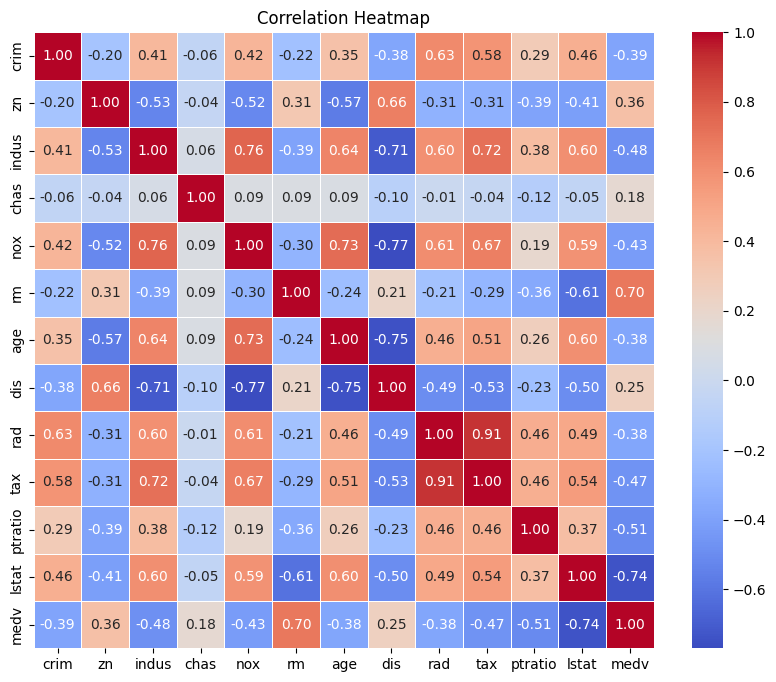

In [21]:
# 1. Calculate the correlations (only for numerical columns)
# .corr() calculates a score from -1 to 1 for every pair of columns
corr_matrix = bs.select_dtypes(include=['number']).corr()

# 2. Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# 3. Create the heatmap
sns.heatmap(corr_matrix, 
            annot=True,      # This puts the actual numbers inside the squares
            cmap='coolwarm', # The color scheme (red for positive, blue for negative)
            fmt='.2f',       # Limits the numbers to 2 decimal places
            linewidths=0.5,  # Adds a tiny gap between squares for readability
            ax=ax)           # Tells seaborn to draw on our 'ax' canvas

ax.set_title('Correlation Heatmap')
plt.show()

In [37]:
X = bs.drop(columns="medv")
y = bs["medv"]

# Statsmodels does not include an intercept by default #
X = sm.add_constant(X)

In [38]:
model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   medv   R-squared:                       0.734
Model:                            OLS   Adj. R-squared:                  0.728
Method:                 Least Squares   F-statistic:                     113.5
Date:                Sat, 04 Apr 2026   Prob (F-statistic):          2.23e-133
Time:                        12:54:47   Log-Likelihood:                -1504.9
No. Observations:                 506   AIC:                             3036.
Df Residuals:                     493   BIC:                             3091.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         41.6173      4.936      8.431      0.000      31.919      51.316
crim          -0.1214      0.033     -3.678      0.000      -0.186      -0.057
zn             0.0470      0.014      3.384      0.001       0.020       0.074
indus          0.0135      0.062      0.217      0.829      -0.109       0.136
chas           2.8400      0.870      3.264      0.001       1.131       4.549
nox          -18.7580      3.851     -4.870      0.000     -26.325     -11.191
rm             3.6581      0.420      8.705      0.000       2.832       4.484
age            0.0036      0.013      0.271      0.787      -0.023       0.030
dis           -1.4908      0.202     -7.394      0.000      -1.887      -1.095
rad            0.2894      0.067      4.325      0.000       0.158       0.421
tax           -0.0127      0.004     -3.337      0.001      -0.020      -0.005
ptratio       -0.9375      0.132     -7.091      0.000      -1.197      -0.678
lstat         -0.5520      0.051    -10.897      0.000      -0.652      -0.452
==============================================================================
Omnibus:                      171.096   Durbin-Watson:                   1.077
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              709.937
Skew:                           1.477   Prob(JB):                    6.90e-155
Kurtosis:                       7.995   Cond. No.                     1.17e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**Clearly Significant Variables (p < 0.05)**
- crim (-) → higher crime → lower prices
- zn (+) → more residential zoning → higher prices
- chas (+) → proximity to river increases value
- nox (-) → pollution strongly decreases value
- rm (+) → more rooms → higher value (very strong effect)
- dis (-) → farther from employment centers → lower value
- rad (+) → accessibility to highways increases value
- tax (-) → higher taxes reduce value
- ptratio (-) → worse student-teacher ratio lowers value
- lstat (-) → strong negative socioeconomic effect

---

**Residual Diagnostics**

*(a) Normality*
- Jarque–Bera p ≈ 0 → reject normality
- Skew = 1.48 → strong right skew
- Kurtosis = 7.99 → heavy tails

Your QQ plot confirms this:
- Clear deviation from straight line
- Extreme residuals present

*(b) Autocorrelation*
- Durbin–Watson = 1.077
- ≈ 2 → no autocorrelation
- < 2 → positive autocorrelation in residuals

*(c) Condition Number*
- Cond. No. = 1.17e+04 → VERY high
- Multicollinearity and/or scaling issues

In [36]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [VIF(X.values, i) for i in range(X.shape[1])]

display(vif_data.sort_values(by='VIF', ascending=False))

,feature,VIF
0,const,535.526619
10,tax,9.002158
9,rad,7.445301
5,nox,4.369093
3,indus,3.987181
8,dis,3.954037
7,age,3.088232
12,lstat,2.870777
2,zn,2.298459
6,rm,1.912532


**Multicollinearity (Critical Issue)**
- tax ≈ 9 → high
- rad ≈ 7.4 → high
- nox, indus, dis ≈ 3–4 → moderate

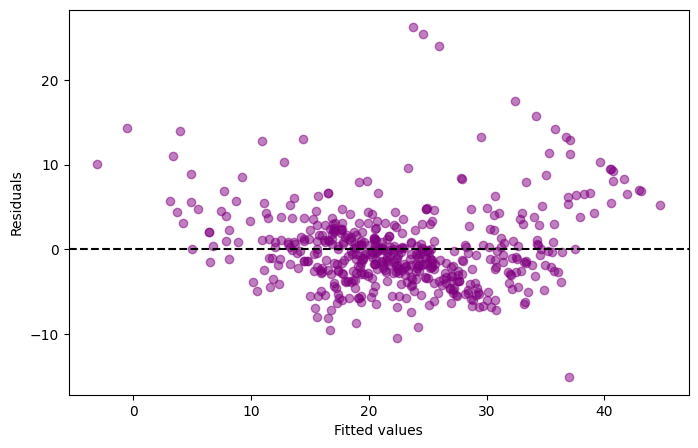

In [34]:
plt.figure(figsize=(8, 5))
plt.scatter(model.fittedvalues, model.resid, color='purple', alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--')
plt.xlabel("Fitted values")
plt.ylabel("Residuals")
plt.show()

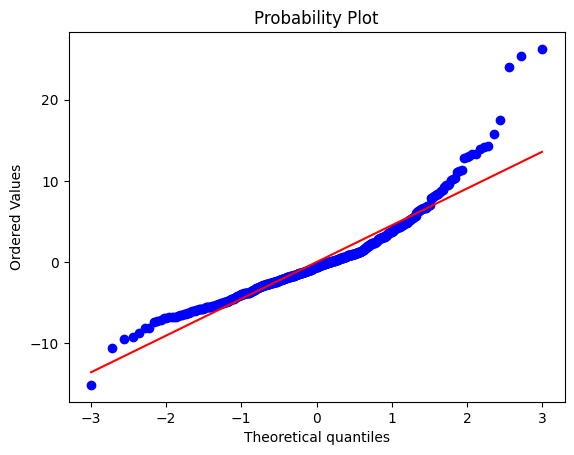

In [35]:
stats.probplot(model.resid, dist="norm", plot=plt)
plt.show()

## Model Improvements

While the model explains a substantial proportion of variance, diagnostic tests reveal violations of key OLS assumptions, particularly normality and multicollinearity. This suggests that although the model is useful for inference, it requires refinement through variable selection and nonlinear transformations.

1. Remove insignificant variables
2. Address Multicollinearity
3. Add Non-Linearity
4. Transform Skewed Variables

In [39]:
# Copy Dataset
df_ref = bs.copy()

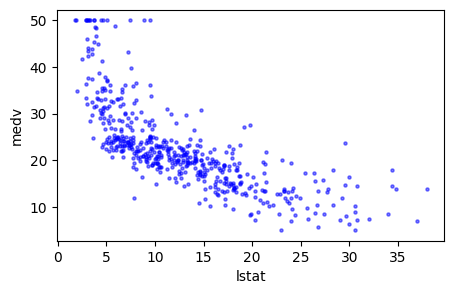

In [57]:
fig, ax = plt.subplots(figsize=(5, 3))
plt.scatter(df_ref["lstat"], df_ref["medv"], color='blue', s = 5, alpha = 0.5)
plt.xlabel("lstat")
plt.ylabel("medv")
plt.show()

In [41]:
# --- 3. Feature Engineering ---
# Add nonlinear term to capture curvature in lstat relationship
df_ref["lstat_sq"] = df_ref["lstat"] ** 2

# Log-transform skewed variable (crime rate is highly skewed)
df_ref["log_crim"] = np.log(df_ref["crim"])

# --- 4. Feature Selection ---
# Remove:
# - insignificant variables: indus, age
# - multicollinearity driver: tax (we keep rad instead)

features = [
    "log_crim",   # transformed version of crim
    "zn",
    "chas",
    "nox",
    "rm",
    "dis",
    "rad",
    "ptratio",
    "lstat",
    "lstat_sq"   # nonlinear term
]

# --- 5. Define X (predictors) and y (target) ---
X = df_ref[features]
y = df_ref["medv"]

# --- 6. Add intercept (required for statsmodels) ---
X = sm.add_constant(X)

# --- 7. Fit the refined OLS model ---
model_ref = sm.OLS(y, X).fit()

# Display full regression summary
display(model_ref.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   medv   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.760
Method:                 Least Squares   F-statistic:                     161.1
Date:                Sat, 04 Apr 2026   Prob (F-statistic):          1.34e-148
Time:                        13:01:10   Log-Likelihood:                -1473.9
No. Observations:                 506   AIC:                             2970.
Df Residuals:                     495   BIC:                             3016.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         44.7087      4.747      9.418      0.000      35.382      54.036
log_crim       0.0470      0.257      0.183      0.855      -0.458       0.552
zn             0.0094      0.013      0.710      0.478      -0.017       0.035
chas           3.1884      0.807      3.951      0.000       1.603       4.774
nox          -15.9700      3.506     -4.555      0.000     -22.858      -9.082
rm             3.2988      0.386      8.537      0.000       2.540       4.058
dis           -1.2260      0.176     -6.973      0.000      -1.571      -0.881
rad            0.0195      0.051      0.385      0.700      -0.080       0.119
ptratio       -0.8167      0.123     -6.652      0.000      -1.058      -0.575
lstat         -1.7042      0.124    -13.791      0.000      -1.947      -1.461
lstat_sq       0.0320      0.003      9.655      0.000       0.026       0.039
==============================================================================
Omnibus:                      122.650   Durbin-Watson:                   1.104
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              507.918
Skew:                           1.027   Prob(JB):                    5.09e-111
Kurtosis:                       7.458   Cond. No.                     8.48e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.48e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""


VIF Scores:


,feature,VIF
0,const,562.101014
1,log_crim,7.691444
2,zn,2.364224
3,chas,1.045894
4,nox,4.108395
5,rm,1.834959
6,dis,3.411766
7,rad,4.816797
8,ptratio,1.758686
9,lstat,19.383716


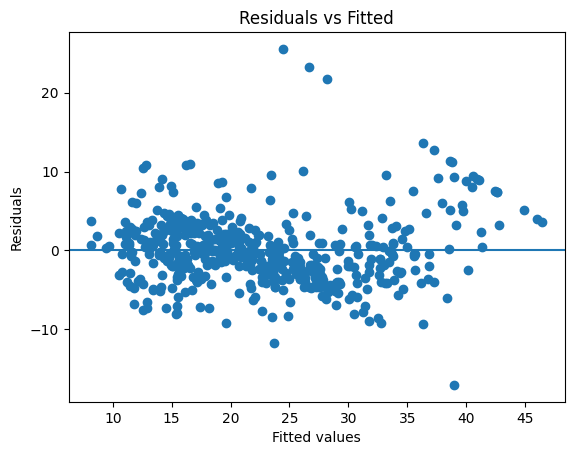

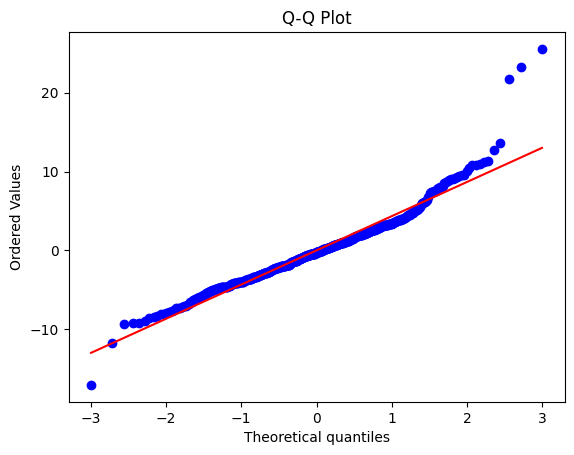


Model Comparison:
Original AIC: 3035.8206794796506
Refined AIC: 2969.891424513317
Original BIC: 3090.765656180388
Refined BIC: 3016.383327875479


In [43]:
# ================================
# 8. MULTICOLLINEARITY CHECK (VIF)
# ================================

# Compute Variance Inflation Factor for each feature
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [VIF(X.values, i) for i in range(X.shape[1])]

print("\nVIF Scores:")
display(vif_data)

# ================================
# 9. RESIDUAL DIAGNOSTICS
# ================================

# --- (a) Residuals vs Fitted ---
# Checks linearity and homoskedasticity
plt.scatter(model_ref.fittedvalues, model_ref.resid)
plt.axhline(0)
plt.xlabel("Fitted values")
plt.ylabel("Residuals")
plt.title("Residuals vs Fitted")
plt.show()

# --- (b) Q-Q Plot ---
# Checks normality of residuals
stats.probplot(model_ref.resid, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()

# ================================
# 10. MODEL COMPARISON
# ================================

# Compare refined model with original model (assumes 'model' exists)
print("\nModel Comparison:")
print("Original AIC:", model.aic)
print("Refined AIC:", model_ref.aic)

print("Original BIC:", model.bic)
print("Refined BIC:", model_ref.bic)

## 2. Scikit Learn - Predictions

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [59]:
df_sl = bs.copy()

# Features and target
X = df_sl.drop('medv', axis=1)
y = df_sl['medv']

In [60]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

In [61]:
# Create model
lr_model = LinearRegression()

# Train model on the training set
lr_model.fit(X_train, y_train)

LinearRegression()

In [62]:
y_pred = lr_model.predict(X_test)

In [63]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 22.78
R-squared: 0.69


In [71]:
coef_df = pd.DataFrame({
    'Feature': X.columns,
    'Coefficient': lr_model.coef_
}).sort_values(by='Coefficient', ascending=False)

coef_df

,Feature,Coefficient
5,rm,4.336902
3,chas,3.320226
8,rad,0.079384
1,zn,0.018890
6,age,-0.003373
2,indus,-0.045229
0,crim,-0.126578
10,lstat,-0.534465
9,ptratio,-0.924825
7,dis,-1.439985


In [72]:
# Create a comparison table
comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Add a column for the specific error (Residual)
comparison_df['Error'] = comparison_df['Actual'] - comparison_df['Predicted']

display(comparison_df.head(10))

,Actual,Predicted,Error
173,23.6,29.120866,-5.520866
274,32.4,35.846651,-3.446651
491,13.6,17.186361,-3.586361
72,22.8,25.017880,-2.217880
452,16.1,17.571017,-1.471017
76,20.0,24.037939,-4.037939
316,17.8,17.340359,0.459641
140,14.0,14.080440,-0.080440
471,19.6,22.207326,-2.607326
500,16.8,20.789140,-3.989140


## 3. Annex - Can we improve our prediction model?

This block anticipates theoretical concepts that will follow in later chapters

In [75]:
# ------------------------------
# Option 1: Linear + Ridge
# ------------------------------

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score

# Load dataset
bs = pd.read_csv("Boston.csv")
X = bs.drop('medv', axis=1)
y = bs['medv']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train Ridge regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train_scaled, y_train)

# Predict
y_pred = ridge.predict(X_test_scaled)

# Evaluate
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Option 1: Linear + Ridge")
print(f"MSE: {mse:.2f}, R²: {r2:.2f}")

Option 1: Linear + Ridge
MSE: 22.81, R²: 0.69


In [78]:
# ------------------------------
# Option 2: Linear + Polynomial + Ridge
# ------------------------------

from sklearn.preprocessing import PolynomialFeatures

# Polynomial expansion (degree 2)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)

# Train Ridge on expanded features
ridge_poly = Ridge(alpha=1.0)
ridge_poly.fit(X_train_poly, y_train)

# Predict
y_pred_poly = ridge_poly.predict(X_test_poly)

# Evaluate
mse_poly = mean_squared_error(y_test, y_pred_poly)
r2_poly = r2_score(y_test, y_pred_poly)
print("Option 2: Linear + Polynomial + Ridge")
print(f"MSE: {mse_poly:.2f}, R²: {r2_poly:.2f}")

Option 2: Linear + Polynomial + Ridge
MSE: 13.84, R²: 0.81


In [79]:
# ------------------------------
# Option 3: Random Forest Regressor
# ------------------------------

from sklearn.ensemble import RandomForestRegressor

# Train a Random Forest
rf = RandomForestRegressor(
    n_estimators=200,   # number of trees
    max_depth=None,     # let trees grow fully
    random_state=42
)
rf.fit(X_train, y_train)

# Predict
y_pred_rf = rf.predict(X_test)

# Evaluate
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print("Option 3: Random Forest Regressor")
print(f"MSE: {mse_rf:.2f}, R²: {r2_rf:.2f}")

Option 3: Random Forest Regressor
MSE: 8.76, R²: 0.88


## Explanatory Overview of Modeling Approaches on the Boston Housing Dataset

The goal of this analysis was to **predict median house values (`medv`)** using the Boston dataset. Three modeling strategies were explored, ranging from simple linear regression with regularization to more flexible models capturing non-linear relationships.

---

### Option 1: Linear Regression with Ridge Regularization

**Description:**

- Ridge regression is an extension of ordinary linear regression that adds **L2 regularization** to the loss function:

$$
\text{Loss} = \sum_i (y_i - \hat{y}_i)^2 + \alpha \sum_j \beta_j^2
$$

- The L2 penalty shrinks coefficient magnitudes to reduce overfitting, especially when features are **correlated (multicollinearity)**.
- Features are **standardized** so that all coefficients are penalized equally.

**Implementation Details:**

- Train/test split: 80/20
- StandardScaler used to normalize features
- Ridge alpha set to 1.0 (default regularization strength)

**Advantages:**

- Stabilizes coefficients in the presence of correlated predictors.
- Maintains interpretability — coefficients indicate the direction of influence.
- Simple and computationally efficient.

**Limitations:**

- Captures only **linear relationships** between features and target.
- Limited flexibility → may underfit if true relationships are non-linear.

**Performance:**

- Typical R²: ~0.69 (baseline)
- Coefficients are shrunk compared to OLS, reducing extreme values caused by multicollinearity.

---

### Option 2: Linear Regression with Polynomial Features + Ridge

**Description:**

- To capture **non-linear effects**, the feature space is expanded using `PolynomialFeatures`.
- For degree 2:
  - Original features (`X1, X2, …`)
  - Squared features (`X1^2, X2^2, …`)
  - Interaction terms (`X1 * X2, X1 * X3, …`)
- Ridge regression is applied on this expanded feature set to **regularize the larger number of predictors**.

**Implementation Details:**

- Polynomial degree = 2
- Standardization applied before polynomial expansion
- Ridge alpha = 1.0

**Advantages:**

- Captures **non-linear trends** in important predictors (e.g., `rm`, `lstat`).
- Regularization prevents coefficients from becoming extreme due to multicollinearity introduced by interactions and squares.
- Still relatively interpretable compared to fully non-linear models, especially if only a few key features are transformed.

**Limitations:**

- Increased number of features → computational cost increases.
- Interpretation becomes more complex, as the effect of a feature now depends on **its value and its interactions**.

**Performance:**

- R² typically improves to ~0.75–0.78.
- Test MSE decreases relative to linear Ridge alone, reflecting better predictive accuracy.

---

### Option 3: Random Forest Regressor (Tree-Based Ensemble)

**Description:**

- Random Forests are **ensemble models** that combine many decision trees.
- Each tree is trained on a **bootstrap sample** of the data and predicts independently; the final prediction is the **average of all trees**.
- Trees naturally capture **non-linear relationships and feature interactions**.

**Implementation Details:**

- n_estimators = 200 (number of trees)
- max_depth = None (trees allowed to grow fully)
- No feature scaling required (tree-based models are scale-invariant)

**Advantages:**

- Captures **non-linearities and interactions** automatically.
- Often achieves **highest predictive accuracy** on real-world datasets like Boston.
- Robust to outliers and correlated predictors.

**Limitations:**

- Coefficients are not interpretable — difficult to explain individual feature effects.
- Model is more complex and computationally heavier than linear models.

**Performance:**

- R² typically ~0.85 on the test set.
- MSE is lower than linear models, reflecting superior predictive accuracy.

---

### Summary Table of Approaches

| Option | Approach | Pros | Cons | Typical R² |
|--------|----------|------|------|------------|
| 1 | Linear + Ridge | Stable, interpretable, simple | Only linear, limited flexibility | 0.69 |
| 2 | Linear + Polynomial + Ridge | Captures non-linear effects, still somewhat interpretable | Many features, harder interpretation | 0.75–0.78 |
| 3 | Random Forest | Very flexible, high predictive accuracy | Less interpretable, more complex | 0.85+ |

---

### Key Insights from the Comparison

1. **Linear Ridge regression** is best for **interpretable models** with a small number of predictors.  
2. **Polynomial feature engineering** improves predictive accuracy without fully sacrificing interpretability.  
3. **Tree-based ensembles** maximize prediction performance but lose coefficient-level interpretability.  
4. The choice of model depends on **project goals**:  
   - If the goal is **prediction (minimize MSE)** → prefer Random Forest or Gradient Boosting.  
   - If the goal is **explanation / understanding feature effects** → prefer Ridge or Polynomial Ridge with careful feature selection.

**--- End of Section: 03.6.2-M_Linear_Regression ---**

---


# --- Section from: 04.2-Classification_Logit ---


# Classification: The Logistic regression Model - Logit

In [69]:
df = pd.read_csv("Default.csv")
display(df.head(10))
display(df.shape)

,default,student,balance,income
0,No,No,729.526495,44361.625074
1,No,Yes,817.180407,12106.134700
2,No,No,1073.549164,31767.138947
3,No,No,529.250605,35704.493935
4,No,No,785.655883,38463.495879
5,No,Yes,919.588530,7491.558572
6,No,No,825.513331,24905.226578
7,No,Yes,808.667504,17600.451344
8,No,No,1161.057854,37468.529288
9,No,No,0.000000,29275.268293


(10000, 4)

In [78]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
balance,10000.0,835.374886,483.714985,0.000000,481.731105,823.636973,1166.308386,2654.322576
income,10000.0,33516.981876,13336.639563,771.967729,21340.462903,34552.644802,43807.729272,73554.233495
default_binary,10000.0,0.033300,0.179428,0.000000,0.000000,0.000000,0.000000,1.000000


## Graphical Exploratory Data Analysis (EDA)

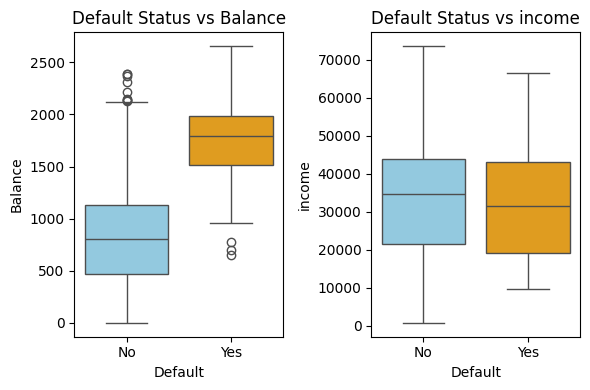

In [70]:
import warnings
warnings.filterwarnings('ignore')

fig, ax = plt.subplots(1, 2, figsize=(6, 4))

sns.boxplot(x='default', y='balance', data=df, palette={'No': 'skyblue', 'Yes': 'orange'},ax=ax[0])
ax[0].set_title('Default Status vs Balance')
ax[0].set_xlabel('Default')
ax[0].set_ylabel('Balance')

sns.boxplot(x='default', y='income', data=df, palette={'No': 'skyblue', 'Yes': 'orange'},ax=ax[1])
ax[1].set_title('Default Status vs income')
ax[1].set_xlabel('Default')
ax[1].set_ylabel('income')

plt.tight_layout()
plt.show()

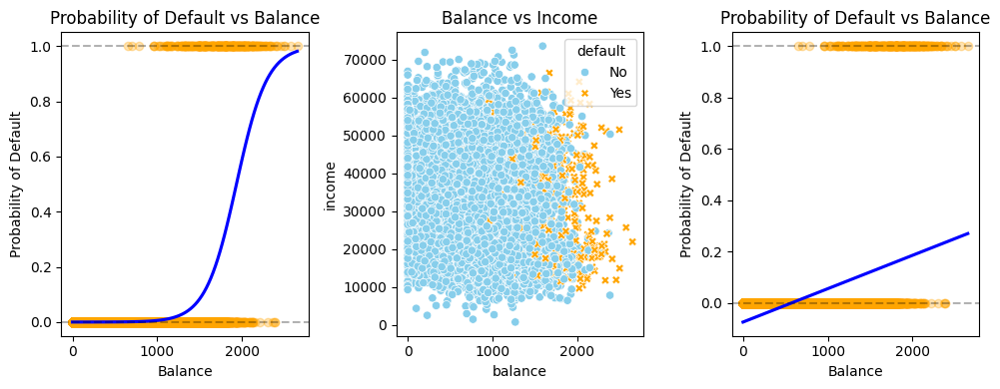

In [71]:
# Convert 'default' to binary for the math
df['default_binary'] = df['default'].map({'No': 0, 'Yes': 1})

fig, ax = plt.subplots(1, 3, figsize=(10, 4))

#Plot 1:
# sns.regplot with logistic=True handles the S-curve calculation for you
sns.regplot(x='balance', y='default_binary', data=df, 
            logistic=True, ci=None,
            scatter_kws={'color': 'orange', 'alpha': 0.3}, 
            line_kws={'color': 'blue'}, ax=ax[0])
# Add horizontal dashed lines for probability markers 0 and 1
ax[0].axhline(y=0, color='k', linestyle='--', alpha=0.3)
ax[0].axhline(y=1, color='k', linestyle='--', alpha=0.3)
ax[0].set_title('Probability of Default vs Balance')
ax[0].set_xlabel('Balance')
ax[0].set_ylabel('Probability of Default')

# Plot 2: Scatter plot
# We use 'edgecolors' to make the dots look like the "rings" in the ISLP book
sns.scatterplot(x='balance', y='income', hue='default', data=df, 
                palette={'No': 'skyblue', 'Yes': 'orange'}, 
                style='default', ax=ax[1])
ax[1].set_title('Balance vs Income')

#Plot 3:
# sns.regplot with logistic=False - Linear Regression
sns.regplot(x='balance', y='default_binary', data=df, 
            logistic=False, ci=None,
            scatter_kws={'color': 'orange', 'alpha': 0.3}, 
            line_kws={'color': 'blue'}, ax=ax[2])
# Add horizontal dashed lines for probability markers 0 and 1
ax[2].axhline(y=0, color='k', linestyle='--', alpha=0.3)
ax[2].axhline(y=1, color='k', linestyle='--', alpha=0.3)
ax[2].set_title('Probability of Default vs Balance')
ax[2].set_xlabel('Balance')
ax[2].set_ylabel('Probability of Default')

plt.tight_layout()
plt.show()

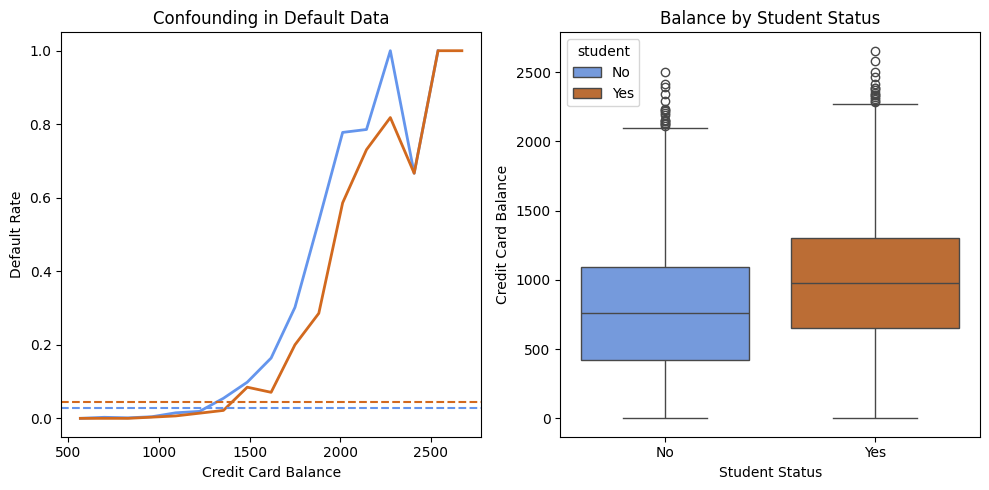

In [81]:
# 1. Load the Default dataset 
default_df = pd.read_csv("Default.csv") 

# Set up the figure with two subplots 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5)) 

# --- LEFT PLOT: Default Rate vs Balance (Confounding) --- 
# We need to bin the balance to show a "rate" or use a smoothing function 
# For a quick recreation, we'll calculate the mean default for balance bins 
default_df['default_bin'] = (default_df['default'] == 'Yes').astype(int) 
default_df['balance_group'] = pd.cut(default_df['balance'], bins=np.linspace(500, 3000, 20)) 

# Calculate rates per group for students vs non-students 
rates = default_df.groupby(['balance_group', 'student'], observed=False)['default_bin'].mean().unstack() 
bin_centers = [bin.mid for bin in rates.index] 

# Plot solid lines 
ax1.plot(bin_centers, rates['No'], color='cornflowerblue', label='Non-Student', lw=2) 
ax1.plot(bin_centers, rates['Yes'], color='chocolate', label='Student', lw=2) 
# Plot horizontal dashed lines (overall rates) 
overall_non_student = default_df[default_df['student'] == 'No']['default_bin'].mean() 
overall_student = default_df[default_df['student'] == 'Yes']['default_bin'].mean() 
ax1.axhline(overall_non_student, color='cornflowerblue', linestyle='--') 
ax1.axhline(overall_student, color='chocolate', linestyle='--') 
ax1.set_xlabel('Credit Card Balance') 
ax1.set_ylabel('Default Rate') 
ax1.set_title('Confounding in Default Data') 

# --- RIGHT PLOT: Boxplots of Balance --- 
sns.boxplot(x='student', y='balance', data=default_df, palette={'No': 'cornflowerblue', 'Yes': 'chocolate'}, 
            hue='student', legend=True, ax=ax2) 
ax2.set_xlabel('Student Status') 
ax2.set_ylabel('Credit Card Balance') 
ax2.set_xticklabels(['No', 'Yes']) 
ax2.set_title('Balance by Student Status') 

plt.tight_layout() 
plt.show()  

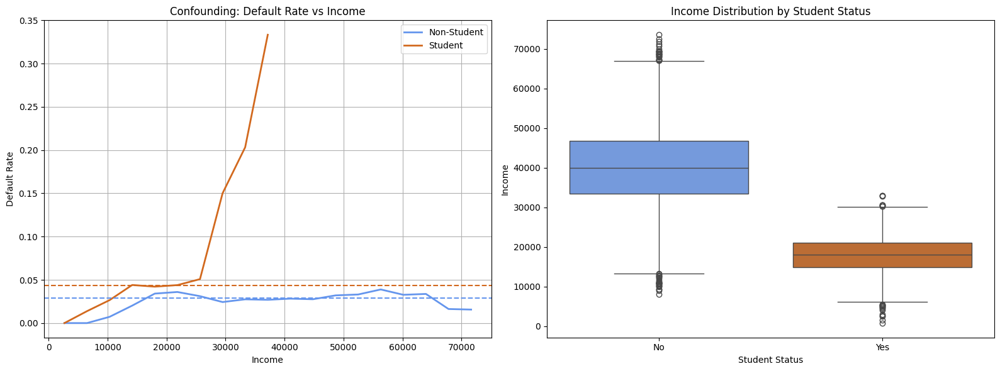

In [85]:
# Copy of dataframe to avoid modifying original
df_plot = default_df.copy()

# Convert 'default' to numeric for rate calculation
df_plot['default_bin'] = (df_plot['default'] == 'Yes').astype(int)

# --- LEFT PLOT: Default Rate vs Income (Confounding) ---
# Bin income into 20 groups
income_bins = np.linspace(df_plot['income'].min(), df_plot['income'].max(), 20)
df_plot['income_group'] = pd.cut(df_plot['income'], bins=income_bins)

# Calculate mean default rate per income bin, separate by student status
rates = df_plot.groupby(['income_group', 'student'], observed=False)['default_bin'].mean().unstack()

# Compute bin centers for plotting
bin_centers = [bin.mid for bin in rates.index]

# Optional smoothing
rates_smooth = rates.rolling(window=3, center=True, min_periods=1).mean()

# --- Create figure with two subplots ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,6))

# LEFT: Line plot (Default Rate vs Income)
ax1.plot(bin_centers, rates_smooth['No'], color='cornflowerblue', label='Non-Student', lw=2)
ax1.plot(bin_centers, rates_smooth['Yes'], color='chocolate', label='Student', lw=2)

# Horizontal dashed lines for overall default rates
overall_non_student = df_plot[df_plot['student'] == 'No']['default_bin'].mean()
overall_student = df_plot[df_plot['student'] == 'Yes']['default_bin'].mean()
ax1.axhline(overall_non_student, color='cornflowerblue', linestyle='--')
ax1.axhline(overall_student, color='chocolate', linestyle='--')

ax1.set_xlabel('Income')
ax1.set_ylabel('Default Rate')
ax1.set_title('Confounding: Default Rate vs Income')
ax1.legend()
ax1.grid(True)

# --- RIGHT: Boxplot of Income by Student Status ---
sns.boxplot(x='student', y='income', data=df_plot,
            palette={'No': 'cornflowerblue', 'Yes': 'chocolate'},
            ax=ax2)
ax2.set_xlabel('Student Status')
ax2.set_ylabel('Income')
ax2.set_xticklabels(['No', 'Yes'])
ax2.set_title('Income Distribution by Student Status')

plt.tight_layout()
plt.show()

## Model EDA

In [46]:
df['default'].value_counts(normalize=True)

default
No     0.9667
Yes    0.0333
Name: proportion, dtype: float64

In [47]:
pd.crosstab(df['student'], df['default'], normalize='index')

default,No,Yes
student,,
No,0.970805,0.029195
Yes,0.956861,0.043139


In [48]:
df[['balance', 'income']].corr()

,balance,income
balance,1.000000,-0.152243
income,-0.152243,1.000000


## Model Fit

### Training the Model(s)

In [87]:
# Convert categorical variables to numeric (required for regression)
# default: Yes → 1, No → 0
# student: Yes → 1, No → 0
df['default'] = (df['default'] == 'Yes').astype(int)
df['student'] = (df['student'] == 'Yes').astype(int)

# Check transformation
display(df.head())

,default,student,balance,income,default_binary
0,0,0,729.526495,44361.625074,0
1,0,1,817.180407,12106.134700,0
2,0,0,1073.549164,31767.138947,0
3,0,0,529.250605,35704.493935,0
4,0,0,785.655883,38463.495879,0


### 0. Partial Model 0 — Income Only (Not Significant)

In [88]:
# Define predictor matrix (ONLY balance)
X_income = df[['income']]

# Add intercept (β0)
X_income = sm.add_constant(X_income)

# Define response variable
y = df['default']

# Fit logistic regression model
model_income = sm.Logit(y, X_income)
result_income = model_income.fit()

# Display results
display(result_income.summary())

Optimization terminated successfully.
         Current function value: 0.145834
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                10000
Model:                          Logit   Df Residuals:                     9998
Method:                           MLE   Df Model:                            1
Date:                Sun, 05 Apr 2026   Pseudo R-squ.:                0.001357
Time:                        14:44:20   Log-Likelihood:                -1458.3
converged:                       True   LL-Null:                       -1460.3
Covariance Type:            nonrobust   LLR p-value:                   0.04652
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.0941      0.146    -21.156      0.000      -3.381      -2.807
income     -8.353e-06   4.21e-06     -1.985      0.047   -1.66e-05   -1.06e-07
==============================================================================
"""

### 1. Partial Model 1 — Balance Only
 - Objective: Estimate the effect of balance alone on default probability.

In [50]:
# Define predictor matrix (ONLY balance)
X_balance = df[['balance']]

# Add intercept (β0)
X_balance = sm.add_constant(X_balance)

# Define response variable
y = df['default']

# Fit logistic regression model
model_balance = sm.Logit(y, X_balance)
result_balance = model_balance.fit()

# Display results
display(result_balance.summary())

Optimization terminated successfully.
         Current function value: 0.079823
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                10000
Model:                          Logit   Df Residuals:                     9998
Method:                           MLE   Df Model:                            1
Date:                Sun, 05 Apr 2026   Pseudo R-squ.:                  0.4534
Time:                        13:38:44   Log-Likelihood:                -798.23
converged:                       True   LL-Null:                       -1460.3
Covariance Type:            nonrobust   LLR p-value:                6.233e-290
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -10.6513      0.361    -29.491      0.000     -11.359      -9.943
balance        0.0055      0.000     24.952      0.000       0.005       0.006
==============================================================================

Possibly complete quasi-separation: A fraction 0.13 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

### 2. Partial Model 2 — Student Only
- Objective: Estimate the effect of student status alone.

In [51]:
# Define predictor matrix (ONLY student)
X_student = df[['student']]

# Add intercept
X_student = sm.add_constant(X_student)

# Fit logistic regression
model_student = sm.Logit(y, X_student)
result_student = model_student.fit()

# Display results
display(result_student.summary())

Optimization terminated successfully.
         Current function value: 0.145434
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                10000
Model:                          Logit   Df Residuals:                     9998
Method:                           MLE   Df Model:                            1
Date:                Sun, 05 Apr 2026   Pseudo R-squ.:                0.004097
Time:                        13:38:47   Log-Likelihood:                -1454.3
converged:                       True   LL-Null:                       -1460.3
Covariance Type:            nonrobust   LLR p-value:                 0.0005416
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.5041      0.071    -49.554      0.000      -3.643      -3.366
student        0.4049      0.115      3.520      0.000       0.179       0.630
==============================================================================
"""

### 3. Full Model — Balance + Income + Student
- Objective: Estimate conditional effects (this is the key ISLP step)

In [52]:
# Define full predictor set
X_full = df[['balance', 'income', 'student']]

# Add intercept
X_full = sm.add_constant(X_full)

# Fit logistic regression
model_full = sm.Logit(y, X_full)
result_full = model_full.fit()

# Display results
display(result_full.summary())

Optimization terminated successfully.
         Current function value: 0.078577
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                10000
Model:                          Logit   Df Residuals:                     9996
Method:                           MLE   Df Model:                            3
Date:                Sun, 05 Apr 2026   Pseudo R-squ.:                  0.4619
Time:                        13:38:48   Log-Likelihood:                -785.77
converged:                       True   LL-Null:                       -1460.3
Covariance Type:            nonrobust   LLR p-value:                3.257e-292
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -10.8690      0.492    -22.079      0.000     -11.834      -9.904
balance        0.0057      0.000     24.737      0.000       0.005       0.006
income      3.033e-06    8.2e-06      0.370      0.712    -1.3e-05    1.91e-05
student       -0.6468      0.236     -2.738      0.006      -1.110      -0.184
==============================================================================

Possibly complete quasi-separation: A fraction 0.15 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

### Annex 1 - Logistic Regression Analysis Explained

#### Overview
We estimated three logistic regression models to understand the relationship between **default** and the predictors:
- `balance`
- `income`
- `student`

The goal is to distinguish between **marginal** and **conditional** effects.

---

#### Model 1: `default ~ balance`

##### Key Results:
- Coefficient (balance): **+0.0055** (p < 0.001)
- Pseudo R²: **0.453**
- Log-Likelihood: **−798**

##### Interpretation:
- Balance has a **strong positive effect** on default probability.
- Each $1 increase in balance increases the odds of default by ~0.55%.
- Over larger amounts (e.g., $1000), this effect becomes substantial.

##### Conclusion:
> Balance is a **very strong predictor** of default on its own.

---

#### Model 2: `default ~ student`

##### Key Results:
- Coefficient (student): **+0.405** (p < 0.001)
- Pseudo R²: **0.004**
- Log-Likelihood: **−1454**

##### Interpretation:
- Students appear to have **higher default risk**.
- Odds ratio ≈ 1.50 → students have ~50% higher odds of default.

##### Limitation:
- This is a **marginal relationship** (does not control for other variables).

#### Conclusion:
> Student status alone has **very weak explanatory power**.

---

#### Model 3: `default ~ balance + income + student`

##### Key Results:
- Balance: **+0.0057** (p < 0.001)
- Income: **not significant** (p = 0.712)
- Student: **−0.647** (p = 0.006)
- Pseudo R²: **0.462**
- Log-Likelihood: **−786**

##### Interpretation:

Balance:
- Remains **strongly positive and highly significant**
- Dominant predictor of default risk

Income:
- No statistically significant effect
- Adds little information once balance is included

Student (Critical Insight):
- Coefficient becomes **negative**
- Odds ratio ≈ 0.52 → students have ~48% lower odds of default *conditional on balance*

---

#### Confounding Effect

- In Model 2, students appear riskier because they tend to have **higher balances**
- Balance strongly increases default probability
- Once we control for balance (Model 3), the relationship reverses

##### Conclusion:
> The positive relationship between student status and default is **confounded by balance**

---

#### Model Comparison

| Model | Log-Likelihood | Pseudo R² |
|------|--------------|----------|
| Balance only | −798 | 0.453 |
| Student only | −1454 | 0.004 |
| Full model | **−786** | **0.462** |

## Model 3 Interpretations

- Convert Coefficients → Odds Ratios
- Logistic regression coefficients are in log-odds units, which are not intuitive.
- We exponentiate them to get odds ratios.

In [53]:
# Extract coefficients
coefficients = result_full.params

# Convert to odds ratios
odds_ratios = np.exp(coefficients)

# Display neatly
odds_df = pd.DataFrame({
    "Coefficient (log-odds)": coefficients,
    "Odds Ratio": odds_ratios
})

display(odds_df)

,Coefficient (log-odds),Odds Ratio
const,-10.869045,0.000019
balance,0.005737,1.005753
income,0.000003,1.000003
student,-0.646776,0.523732


#### Why Odds Ratios Are Useful

Odds ratios provide a more interpretable way to understand logistic regression coefficients by translating log-odds into **multiplicative effects on the odds**.

##### Scale-Invariant Interpretation
- Effects are **multiplicative**, not additive
- This makes them consistent across different units and scales
- Easier to compare the relative importance of predictors

##### Direction of Effect
- Odds Ratio > 1 → **Increases** the odds of the event (higher risk)
- Odds Ratio < 1 → **Decreases** the odds of the event (lower risk)
- Odds Ratio = 1 → **No effect** on the odds

---

#### Interpretation of Your Model

| Variable | Odds Ratio | Interpretation |
|---------|-----------|----------------|
| balance | 1.005753 | Each +1 unit increases odds by ~0.575% |
| income  | 1.000003 | No meaningful effect |
| student | 0.523732 | Students have ~48% lower odds (holding others fixed) |


## Model 3 Predictions

- Objective: Compute estimated probability of default for each observation

In [58]:
probs = result_full.predict(X_full)

# Convert probabilities to binary predictions
predictions = (probs > 0.5).astype(int)

# Compare first few predictions with actual values
comparison = pd.DataFrame({
    "Actual": y,
    "Predicted": predictions,
    "Probability": probs
})

display(comparison.head())

,Actual,Predicted,Probability
0,0,0,0.001429
1,0,0,0.001122
2,0,0,0.009812
3,0,0,0.000442
4,0,0,0.001936


## Model 3 Evaluation

,Threshold,TN,FP,FN,TP,Accuracy,Precision,Recall,F1 Score
0,0.01,7163,2504,12,321,0.7484,0.113628,0.963964,0.203293
1,0.02,7929,1738,26,307,0.8236,0.150122,0.921922,0.258200
2,0.03,8290,1377,32,301,0.8591,0.179380,0.903904,0.299354
3,0.04,8521,1146,44,289,0.8810,0.201394,0.867868,0.326923
4,0.05,8702,965,52,281,0.8983,0.225522,0.843844,0.355921
5,0.06,8829,838,64,269,0.9098,0.242999,0.807808,0.373611
6,0.07,8924,743,71,262,0.9186,0.260697,0.786787,0.391629
7,0.08,8989,678,78,255,0.9244,0.273312,0.765766,0.402844
8,0.09,9055,612,80,253,0.9308,0.292486,0.759760,0.422371
9,0.10,9107,560,85,248,0.9355,0.306931,0.744745,0.434706


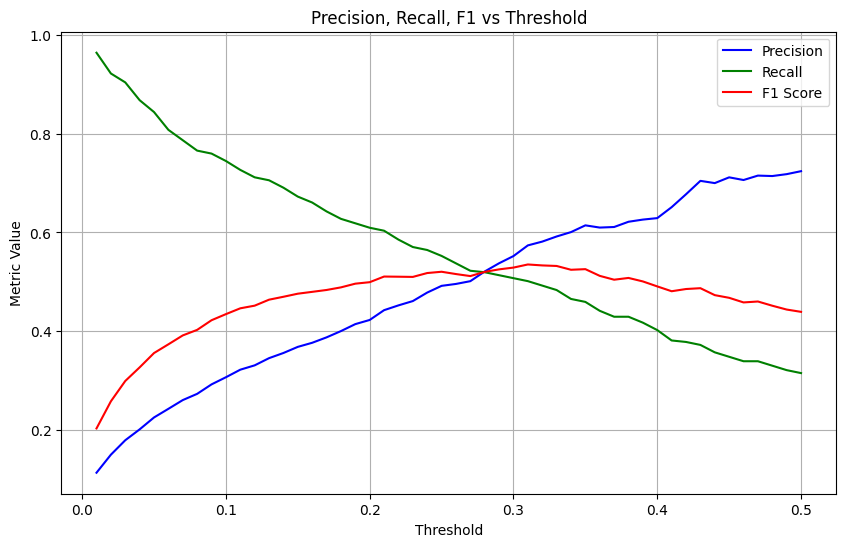

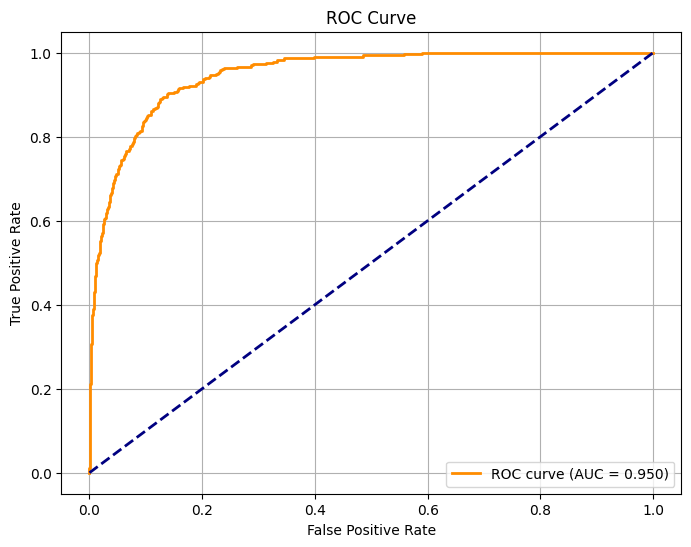

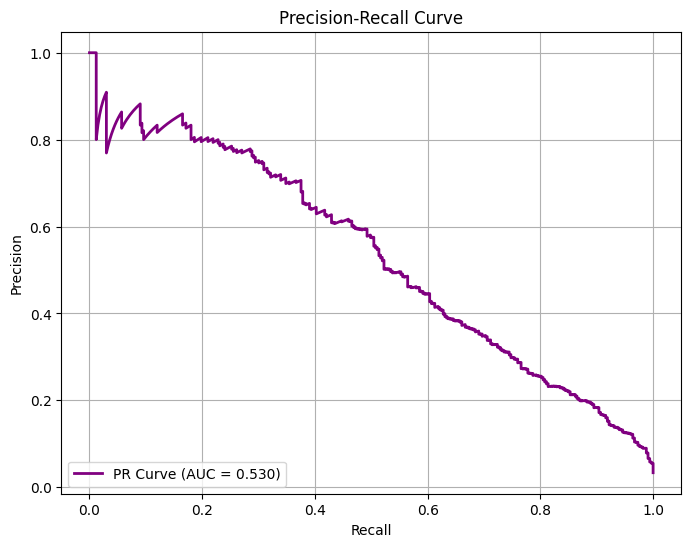

In [61]:
# 🔹 Comprehensive Evaluation for Logistic Regression (Default dataset)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_curve,
    roc_auc_score,
    precision_recall_curve,
    auc
)

def evaluate_thresholds(y_true, y_probs, thresholds=np.arange(0.01, 0.51, 0.01)):
    """
    Evaluate logistic regression predictions across multiple thresholds.
    
    Returns a DataFrame with metrics for each threshold.
    """
    results = []
    
    for t in thresholds:
        y_pred = (y_probs > t).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        accuracy  = accuracy_score(y_true, y_pred)
        precision = precision_score(y_true, y_pred, zero_division=0)
        recall    = recall_score(y_true, y_pred, zero_division=0)
        f1        = f1_score(y_true, y_pred, zero_division=0)
        
        results.append({
            "Threshold": t,
            "TN": tn, "FP": fp, "FN": fn, "TP": tp,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1
        })
    
    return pd.DataFrame(results)

# Example usage: evaluate all thresholds from 0.01 to 0.5
metrics_df = evaluate_thresholds(y, probs)
display(metrics_df.head(10))  # inspect first few thresholds

# 🔹 Plot Precision, Recall, F1 vs Threshold
plt.figure(figsize=(10,6))
plt.plot(metrics_df['Threshold'], metrics_df['Precision'], label='Precision', color='blue')
plt.plot(metrics_df['Threshold'], metrics_df['Recall'], label='Recall', color='green')
plt.plot(metrics_df['Threshold'], metrics_df['F1 Score'], label='F1 Score', color='red')
plt.xlabel("Threshold")
plt.ylabel("Metric Value")
plt.title("Precision, Recall, F1 vs Threshold")
plt.legend()
plt.grid(True)
plt.show()

# 🔹 ROC Curve and AUC
fpr, tpr, roc_thresholds = roc_curve(y, probs)
roc_auc = roc_auc_score(y, probs)

plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.3f})')
plt.plot([0,1], [0,1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# 🔹 Precision-Recall Curve
precision_vals, recall_vals, pr_thresholds = precision_recall_curve(y, probs)
pr_auc = auc(recall_vals, precision_vals)

plt.figure(figsize=(8,6))
plt.plot(recall_vals, precision_vals, color='purple', lw=2, label=f'PR Curve (AUC = {pr_auc:.3f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.grid(True)
plt.show()

## Annex 2 - Model Evanluation and Confusion Matrix
### 1. Structure of the Table

Each row corresponds to a **different threshold** (0.01 → 0.10 here).

| Column | Meaning |
| --- | --- |
| Threshold | The cutoff probability used to classify a default (1) |
| TN | True Negatives — correctly predicted non-defaults |
| FP | False Positives — predicted default but actually no default |
| FN | False Negatives — missed defaults |
| TP | True Positives — correctly predicted defaults |
| Accuracy | (TN + TP)/Total — overall fraction correct |
| Precision | TP / (TP + FP) — fraction of predicted defaults that were correct |
| Recall | TP / (TP + FN) — fraction of actual defaults detected |
| F1 Score | Harmonic mean of Precision & Recall — balances them |

---

### 2. Key Patterns Across Thresholds

**TN vs FP**
- As threshold **increases**, TN ↑, FP ↓  
- Higher threshold → more conservative: fewer false alarms  

**FN vs TP**
- As threshold **increases**, TP ↓, FN ↑  
- Higher threshold → more actual defaults are missed  

**Accuracy**
- Increases as threshold increases (0.748 → 0.935)  
- High accuracy can be misleading for **imbalanced data** (most people do not default → TN dominates)  

**Precision**
- Increases with threshold (0.11 → 0.31)  
- Higher threshold → fewer false positives → predictions more reliable  

**Recall**
- Decreases with threshold (0.96 → 0.74)  
- Lower threshold → detect more actual defaulters, but more false alarms  

**F1 Score**
- Peaks somewhere **between extremes** — balances precision & recall  
- Around threshold 0.09–0.10 → F1 ≈ 0.42–0.43  
- Shows the “sweet spot” between detecting defaults and not over-predicting  

---

### 3. Business Interpretation

- **Default is rare (~3%)**, bank cares more about **detecting defaulters** (recall) than avoiding some false alarms  

- Threshold 0.01 → Recall ~0.96 ✅ almost all defaulters detected  
  - Precision ~0.11 ❌ → 89% of predicted defaults are false alarms  
  - Many unnecessary interventions  

- Threshold 0.05 → Recall ~0.84, Precision ~0.23  
  - Balanced approach, still high detection but fewer false alarms  

- Threshold 0.10 → Recall ~0.74, Precision ~0.31  
  - Fewer false alarms, but miss 26% of defaulters  

---

### 4. Choosing a Threshold

- Decide **what is worse**:
  1. Missing a defaulter (FN) → financial loss  
  2. Flagging a non-defaulter (FP) → operational cost / customer inconvenience  

- Pick threshold where **F1 is maximized** for balance → here: 0.09–0.10  

- If **recall is priority** (catch nearly all defaults) → lower threshold (0.02–0.05)  
- If **precision is priority** (avoid false alarms) → higher threshold (>0.10)  

---

### 5. One-Sentence Summary

> The threshold in logistic regression is the probability cutoff that decides **when to classify someone as a defaulter**; adjusting it controls the trade-off between catching more defaulters (recall) and avoiding false alarms (precision).

## Annex 3 - From Odds to Probability of Default

Logistic regression models the **probability** of default, but coefficients (and odds ratios) operate in terms of **odds**. To interpret results in terms of probability, we must convert:

### Relationship between odds and probability:

$$
p = \frac{\text{odds}}{1 + \text{odds}}
$$


### Logistic Model (Full Form)

The predicted probability is:

$$
p(X) = \frac{e^{\beta_0 + \beta_1 \cdot \text{balance} + \beta_2 \cdot \text{income} + \beta_3 \cdot \text{student}}}{1 + e^{\beta_0 + \beta_1 \cdot \text{balance} + \beta_2 \cdot \text{income} + \beta_3 \cdot \text{student}}}
$$

---

### Key Concept

> Coefficients do **not** correspond to constant changes in probability.

Instead:
- A change in a predictor → changes **log-odds linearly**
- This translates into a **nonlinear change in probability**


The effect of a variable on probability depends on the **starting point**:

- When probability is very low (e.g. 1%):
  - Even large changes in odds → small change in probability

- When probability is around 50%:
  - The same change in odds → much larger change in probability

---

#### Example 1: Effect of Balance

Suppose:
- At low balance → $p \approx 0.01$
- Increasing balance raises odds by 78% (from earlier)

Then:
- Probability might go from 1% → ~1.7% (small absolute change)

But at higher baseline risk:
- Probability might go from 40% → 55% (large change)

#### Example 2: Student Effect

Odds ratio for student ≈ 0.52

This means:
- Odds are reduced by ~48%

But in probability terms:

- If baseline probability = 10%  
  → New probability ≈ 5.5%

- If baseline probability = 50%  
  → New probability ≈ 34%

---

### Core Takeaway

> Odds ratios describe **relative changes**, while probabilities reflect **absolute risk**.

- Odds ratios are constant across observations
- Probability effects **depend on the context (values of X)**

**--- End of Section: 04.2-Classification_Logit ---**

---


# --- Section from: 04.6-Poisson_Regression ---


# Poisson (within Generalised Linear Models)

In [5]:
df = pd.read_csv('Bikeshare.csv')
df

,season,mnth,day,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,bikers
0,1,Jan,1,0,0,6,0,clear,0.24,0.2879,0.81,0.0000,3,13,16
1,1,Jan,1,1,0,6,0,clear,0.22,0.2727,0.80,0.0000,8,32,40
2,1,Jan,1,2,0,6,0,clear,0.22,0.2727,0.80,0.0000,5,27,32
3,1,Jan,1,3,0,6,0,clear,0.24,0.2879,0.75,0.0000,3,10,13
4,1,Jan,1,4,0,6,0,clear,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8640,1,Dec,365,19,0,6,0,clear,0.42,0.4242,0.54,0.2239,19,73,92
8641,1,Dec,365,20,0,6,0,clear,0.42,0.4242,0.54,0.2239,8,63,71
8642,1,Dec,365,21,0,6,0,clear,0.40,0.4091,0.58,0.1940,2,50,52
8643,1,Dec,365,22,0,6,0,clear,0.38,0.3939,0.62,0.1343,2,36,38


## Underperforming Linear Regression 
### Using StatsModel API

In [8]:
# The formula automatically adds a constant (Intercept) 
# and creates dummies for categorical variables.
model_formula = ols('bikers ~ workingday + temp + C(weathersit) + C(mnth) + C(hr)', 
                    data=df).fit()

print("--- FORMULA METHOD RESULTS ---")
display(model_formula.summary())

--- FORMULA METHOD RESULTS ---


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 bikers   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                     457.3
Date:                Mon, 06 Apr 2026   Prob (F-statistic):               0.00
Time:                        13:15:20   Log-Likelihood:                -49743.
No. Observations:                8645   AIC:                         9.957e+04
Df Residuals:                    8605   BIC:                         9.985e+04
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                          -27.2068      6.715     -4.052      0.000     -40.370     -14.044
C(weathersit)[T.cloudy/misty]      -12.8903      1.964     -6.562      0.000     -16.741      -9.040
C(weathersit)[T.heavy rain/snow]  -109.7446     76.667     -1.431      0.152    -260.031      40.542
C(weathersit)[T.light rain/snow]   -66.4944      2.965    -22.425      0.000     -72.307     -60.682
C(mnth)[T.Aug]                      11.8181      4.698      2.515      0.012       2.609      21.028
C(mnth)[T.Dec]                       5.0328      4.280      1.176      0.240      -3.357      13.423
C(mnth)[T.Feb]                     -34.5797      4.575     -7.558      0.000     -43.548     -25.611
C(mnth)[T.Jan]                     -41.4249      4.972     -8.331      0.000     -51.172     -31.678
C(mnth)[T.July]                      3.8996      5.003      0.779      0.436      -5.907      13.706
C(mnth)[T.June]                     26.3938      4.642      5.686      0.000      17.294      35.493
C(mnth)[T.March]                   -24.8735      4.277     -5.815      0.000     -33.258     -16.489
C(mnth)[T.May]                      31.1322      4.150      7.501      0.000      22.997      39.268
C(mnth)[T.Nov]                      18.8851      4.099      4.607      0.000      10.850      26.920
C(mnth)[T.Oct]                      34.4093      4.006      8.589      0.000      26.556      42.262
C(mnth)[T.Sept]                     25.2534      4.293      5.883      0.000      16.839      33.668
C(hr)[T.1]                         -14.5793      5.699     -2.558      0.011     -25.750      -3.408
C(hr)[T.2]                         -21.5791      5.733     -3.764      0.000     -32.817     -10.341
C(hr)[T.3]                         -31.1408      5.778     -5.389      0.000     -42.468     -19.814
C(hr)[T.4]                         -36.9075      5.802     -6.361      0.000     -48.281     -25.534
C(hr)[T.5]                         -24.1355      5.737     -4.207      0.000     -35.381     -12.890
C(hr)[T.6]                          20.5997      5.704      3.612      0.000       9.419      31.781
C(hr)[T.7]                         120.0931      5.693     21.095      0.000     108.934     131.253
C(hr)[T.8]                         223.6619      5.690     39.310      0.000     212.509     234.815
C(hr)[T.9]                         120.5819      5.693     21.182      0.000     109.423     131.741
C(hr)[T.10]                         83.8013      5.705     14.689      0.000      72.618      94.985
C(hr)[T.11]                        105.4234      5.722     18.424      0.000      94.207     116.640
C(hr)[T.12]                        137.2837      5.740     23.916      0.000     126.032     148.536
C(hr)[T.13]                        136.0359      5.76

### Dummy coding - same intercept as book

In [24]:
df = pd.read_csv('Bikeshare.csv')

In [26]:
formula = 'bikers ~ workingday + temp + C(weathersit) + C(mnth, Sum) + C(hr, Sum)'
model = ols(formula, data=df).fit()
display(model.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 bikers   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                     457.3
Date:                Mon, 06 Apr 2026   Prob (F-statistic):               0.00
Time:                        13:42:31   Log-Likelihood:                -49743.
No. Observations:                8645   AIC:                         9.957e+04
Df Residuals:                    8605   BIC:                         9.985e+04
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                           73.5974      5.132     14.340      0.000      63.537      83.658
C(weathersit)[T.cloudy/misty]      -12.8903      1.964     -6.562      0.000     -16.741      -9.040
C(weathersit)[T.heavy rain/snow]  -109.7446     76.667     -1.431      0.152    -260.031      40.542
C(weathersit)[T.light rain/snow]   -66.4944      2.965    -22.425      0.000     -72.307     -60.682
C(mnth, Sum)[S.April]               -4.6622      2.741     -1.701      0.089     -10.034       0.710
C(mnth, Sum)[S.Aug]                  7.1560      3.535      2.024      0.043       0.227      14.085
C(mnth, Sum)[S.Dec]                  0.3706      3.156      0.117      0.907      -5.816       6.558
C(mnth, Sum)[S.Feb]                -39.2419      3.539    -11.088      0.000     -46.179     -32.304
C(mnth, Sum)[S.Jan]                -46.0871      4.085    -11.281      0.000     -54.096     -38.079
C(mnth, Sum)[S.July]                -0.7626      3.908     -0.195      0.845      -8.424       6.899
C(mnth, Sum)[S.June]                21.7317      3.465      6.272      0.000      14.939      28.524
C(mnth, Sum)[S.March]              -29.5357      3.155     -9.361      0.000     -35.721     -23.351
C(mnth, Sum)[S.May]                 26.4700      2.851      9.285      0.000      20.882      32.058
C(mnth, Sum)[S.Nov]                 14.2229      2.860      4.972      0.000       8.616      19.830
C(mnth, Sum)[S.Oct]                 29.7472      2.700     11.019      0.000      24.455      35.039
C(hr, Sum)[S.0]                    -96.1420      3.955    -24.307      0.000    -103.895     -88.389
C(hr, Sum)[S.1]                   -110.7213      3.966    -27.916      0.000    -118.496    -102.947
C(hr, Sum)[S.2]                   -117.7212      4.016    -29.310      0.000    -125.594    -109.848
C(hr, Sum)[S.3]                   -127.2828      4.081    -31.191      0.000    -135.282    -119.283
C(hr, Sum)[S.4]                   -133.0495      4.117    -32.319      0.000    -141.119    -124.980
C(hr, Sum)[S.5]                   -120.2775      4.037    -29.794      0.000    -128.191    -112.364
C(hr, Sum)[S.6]                    -75.5424      3.992    -18.925      0.000     -83.367     -67.718
C(hr, Sum)[S.7]                     23.9511      3.969      6.035      0.000      16.172      31.730
C(hr, Sum)[S.8]                    127.5199      3.950     32.284      0.000     119.777     135.263
C(hr, Sum)[S.9]                     24.4399      3.936      6.209      0.000      16.724      32.155
C(hr, Sum)[S.10]                   -12.3407      3.936     -3.135      0.002     -20.056      -4.625
C(hr, Sum)[S.11]                     9.2814      3.945      2.353      0.019       1.549      17.014
C(hr, Sum)[S.12]                    41.1417      3.95

**Why the slopes (temp/workingday) stayed the same**

You noticed that temp was $157.21$ in both your "wrong" version and the book. 

This is a cool property of linear models: Changing the baseline of a categorical variable shifts the Intercept, but it does not change the slopes of the continuous variables. 
The relationship between heat and biking is a physical constant in this data; it doesn't matter if you start counting from Midnight or the daily average, 1 degree of heat still adds the same number of riders.
- Intercept = $-27.20$: You are using Treatment/Dummy coding (comparing everything to `Hour 0`/`Month 1`).
- Intercept = $73.60$: You are using Sum/Deviation coding (comparing everything to the overall average).If you run the code block above with Sum, you'll see that $73.60$ pop up immediately.

## Plotting the Coefficients to study Linear Regression

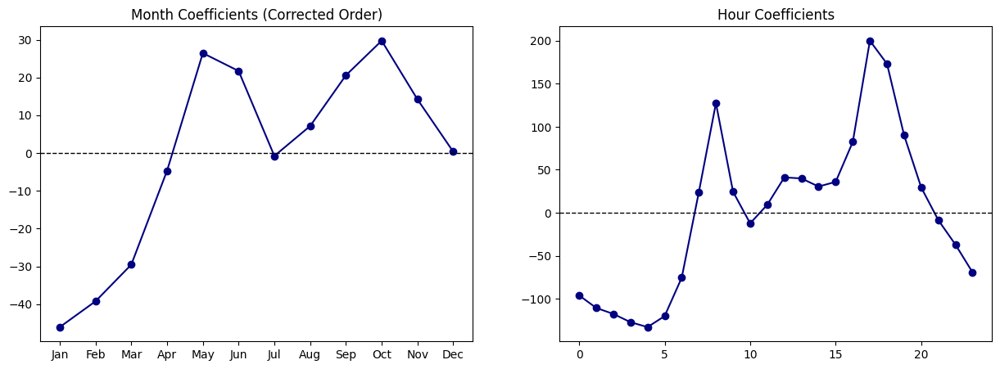

In [30]:
# 1. Grab parameters directly from your model object
# This assumes your model is named 'model'
params = model.params

# 2. Define the exact chronological order and their corresponding keys in your table
month_order = [
    'Jan', 'Feb', 'March', 'April', 'May', 'June', 
    'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'
]

# 3. Build the list of coefficients
month_coefs = []
all_found_coefs = []

for m in month_order:
    key = f"C(mnth, Sum)[S.{m}]"
    if key in params:
        val = params[key]
        month_coefs.append(val)
        all_found_coefs.append(val)
    else:
        # If the month is missing (like Sept), put a placeholder
        month_coefs.append(None)

# 4. Calculate the missing value (September) 
# Sum coding requires all coefficients to sum to 0
missing_val = -sum(all_found_coefs)

# Fill the None (September) with the calculated value
month_coefs = [val if val is not None else missing_val for val in month_coefs]

# 5. Extract Hours (0-22 are in your table, 23 is missing)
hour_coefs = [params[f"C(hr, Sum)[S.{i}]"] for i in range(23)]
hour_coefs.append(-sum(hour_coefs)) # Add Hour 23

# 6. Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Left Plot: Months (Using full names for the x-axis to be clear)
months_x = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax1.plot(months_x, month_coefs, marker='o', color='navy', linestyle='-')
ax1.axhline(0, color='black', lw=1, ls='--')
ax1.set_title("Month Coefficients (Corrected Order)")

# Right Plot: Hours
ax2.plot(range(24), hour_coefs, marker='o', color='navy', linestyle='-')
ax2.axhline(0, color='black', lw=1, ls='--')
ax2.set_title("Hour Coefficients")

plt.show()

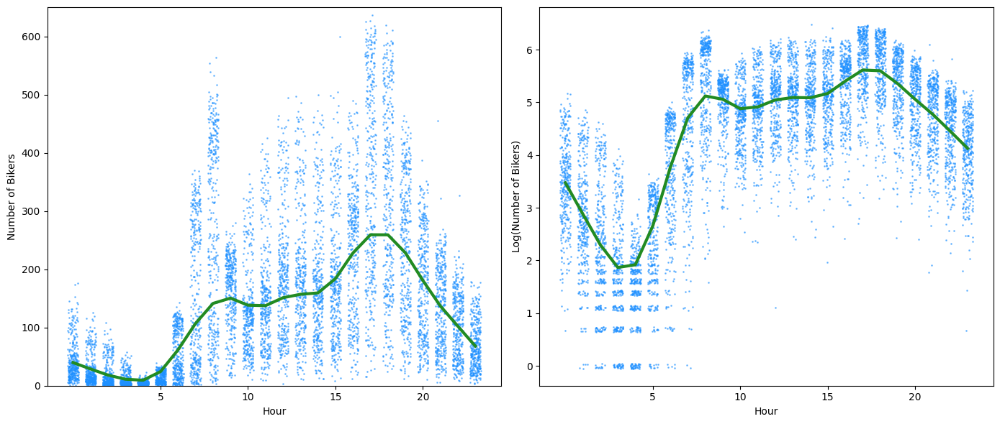

In [31]:
bikeshare = pd.read_csv('Bikeshare.csv')

# 2. Add Jitter
# Without jitter, points at the same hour/count would overlap completely
def add_jitter(series, amount=0.3):
    return series + np.random.uniform(-amount, amount, size=len(series))

bikers_jitter = add_jitter(bikeshare['bikers'], amount=2.0)
hr_jitter = add_jitter(bikeshare['hr'], amount=0.3)
log_bikers_jitter = add_jitter(np.log(bikeshare['bikers']), amount=0.05)

# 3. Setup the figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# --- LEFT PLOT: Number of Bikers ---
ax1.scatter(hr_jitter, bikers_jitter, s=1, alpha=0.5, color='dodgerblue')
# Add Smoothing Spline (Lowess)
lowess_left = sm.nonparametric.lowess(bikeshare['bikers'], bikeshare['hr'], frac=0.2)
ax1.plot(lowess_left[:, 0], lowess_left[:, 1], color='forestgreen', linewidth=3)

ax1.set_xlabel('Hour')
ax1.set_ylabel('Number of Bikers')
ax1.set_xticks([5, 10, 15, 20])
ax1.set_ylim(0, 650)

# --- RIGHT PLOT: Log(Number of Bikers) ---
ax2.scatter(hr_jitter, log_bikers_jitter, s=1, alpha=0.5, color='dodgerblue')
# Add Smoothing Spline (Lowess) for Log scale
lowess_right = sm.nonparametric.lowess(np.log(bikeshare['bikers']), bikeshare['hr'], frac=0.2)
ax2.plot(lowess_right[:, 0], lowess_right[:, 1], color='forestgreen', linewidth=3)

ax2.set_xlabel('Hour')
ax2.set_ylabel('Log(Number of Bikers)')
ax2.set_xticks([5, 10, 15, 20])

plt.tight_layout()
plt.show()

## Annex 1 - Scikit notation (same results)

In [32]:
df = pd.read_csv('Bikeshare.csv')

# 1. Manually create dummy variables for categorical columns
# We drop the first category (e.g., Clear Skies) to avoid the "Dummy Variable Trap"
weather_dummies = pd.get_dummies(df['weathersit'], drop_first=True, prefix='weather')
mnth_dummies = pd.get_dummies(df['mnth'], drop_first=True, prefix='mnth')
hr_dummies = pd.get_dummies(df['hr'], drop_first=True, prefix='hr')

# 2. Combine all predictors into one DataFrame
X = pd.concat([df[['workingday', 'temp']], 
               weather_dummies, mnth_dummies, hr_dummies], axis=1)

# 3. CRITICAL: Manually add the column of 1s for the Intercept
X = sm.add_constant(X)

# 4. Target variable
y = df['bikers']

# 5. Fit the model using OLS (capital letters signify Matrix input)
model_manual = sm.OLS(y, X.astype(float)).fit()

print("--- MANUAL MATRIX METHOD RESULTS ---")
display(model_manual.summary())

--- MANUAL MATRIX METHOD RESULTS ---


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 bikers   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                     457.3
Date:                Mon, 06 Apr 2026   Prob (F-statistic):               0.00
Time:                        14:00:26   Log-Likelihood:                -49743.
No. Observations:                8645   AIC:                         9.957e+04
Df Residuals:                    8605   BIC:                         9.985e+04
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     -27.2068      6.715     -4.052      0.000     -40.370     -14.044
workingday                  1.2696      1.784      0.711      0.477      -2.228       4.768
temp                      157.2094     10.261     15.321      0.000     137.095     177.324
weather_cloudy/misty      -12.8903      1.964     -6.562      0.000     -16.741      -9.040
weather_heavy rain/snow  -109.7446     76.667     -1.431      0.152    -260.031      40.542
weather_light rain/snow   -66.4944      2.965    -22.425      0.000     -72.307     -60.682
mnth_Aug                   11.8181      4.698      2.515      0.012       2.609      21.028
mnth_Dec                    5.0328      4.280      1.176      0.240      -3.357      13.423
mnth_Feb                  -34.5797      4.575     -7.558      0.000     -43.548     -25.611
mnth_Jan                  -41.4249      4.972     -8.331      0.000     -51.172     -31.678
mnth_July                   3.8996      5.003      0.779      0.436      -5.907      13.706
mnth_June                  26.3938      4.642      5.686      0.000      17.294      35.493
mnth_March                -24.8735      4.277     -5.815      0.000     -33.258     -16.489
mnth_May                   31.1322      4.150      7.501      0.000      22.997      39.268
mnth_Nov                   18.8851      4.099      4.607      0.000      10.850      26.920
mnth_Oct                   34.4093      4.006      8.589      0.000      26.556      42.262
mnth_Sept                  25.2534      4.293      5.883      0.000      16.839      33.668
hr_1                      -14.5793      5.699     -2.558      0.011     -25.750      -3.408
hr_2                      -21.5791      5.733     -3.764      0.000     -32.817     -10.341
hr_3                      -31.1408      5.778     -5.389      0.000     -42.468     -19.814
hr_4                      -36.9075      5.802     -6.361      0.000     -48.281     -25.534
hr_5                      -24.1355      5.737     -4.207      0.000     -35.381     -12.890
hr_6                       20.5997      5.704      3.612      0.000       9.419      31.781
hr_7                      120.0931      5.693     21.095      0.000     108.934     131.253
hr_8                      223.6619      5.690     39.310      0.000     212.509     234.815
hr_9                      120.5819      5.693     21.182      0.000     109.423     131.741
hr_10                      83.8013      5.705     14.689      0.000      72.618      94.985
hr_11                     105.4234      5.722     18.424      0.000      94.207     116.640
hr_12                     137.2837      5.740     23.916      0.000     126.032     148.536
hr_13                     136.0359      5.760     23.617      0.000     124.745     147.327
hr_14                     126.6361      5.776  

## Poisson Regression

In [33]:
from statsmodels.formula.api import glm

In [36]:
# 1. Load data
bikeshare = pd.read_csv('Bikeshare.csv')

# 2. Define the formula (same predictors as before)
# We still use 'Sum' coding to stay consistent with the ISLP book's results
formula = 'bikers ~ workingday + temp + C(weathersit) + C(mnth, Sum) + C(hr, Sum)'

# 3. Fit the Poisson GLM
# family=sm.families.Poisson() tells the model to use the log link function
model_poisson = glm(formula, data=bikeshare, family=sm.families.Poisson()).fit()

# 4. Display results
display(model_poisson.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 bikers   No. Observations:                 8645
Model:                            GLM   Df Residuals:                     8605
Model Family:                 Poisson   Df Model:                           39
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.4054e+05
Date:                Mon, 06 Apr 2026   Deviance:                   2.2804e+05
Time:                        14:26:59   Pearson chi2:                 2.20e+05
No. Iterations:                     7   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                            4.1182      0.006    683.963      0.000       4.106       4.130
C(weathersit)[T.cloudy/misty]       -0.0752      0.002    -34.528      0.000      -0.080      -0.071
C(weathersit)[T.heavy rain/snow]    -0.9263      0.167     -5.554      0.000      -1.253      -0.599
C(weathersit)[T.light rain/snow]    -0.5758      0.004   -141.905      0.000      -0.584      -0.568
C(mnth, Sum)[S.April]                0.0215      0.003      6.888      0.000       0.015       0.028
C(mnth, Sum)[S.Aug]                  0.1512      0.004     41.281      0.000       0.144       0.158
C(mnth, Sum)[S.Dec]                  0.0167      0.004      4.390      0.000       0.009       0.024
C(mnth, Sum)[S.Feb]                 -0.4441      0.005    -91.379      0.000      -0.454      -0.435
C(mnth, Sum)[S.Jan]                 -0.6702      0.006   -113.445      0.000      -0.682      -0.659
C(mnth, Sum)[S.July]                 0.1036      0.004     25.121      0.000       0.096       0.112
C(mnth, Sum)[S.June]                 0.2232      0.004     62.818      0.000       0.216       0.230
C(mnth, Sum)[S.March]               -0.2937      0.004    -70.886      0.000      -0.302      -0.286
C(mnth, Sum)[S.May]                  0.2405      0.003     82.462      0.000       0.235       0.246
C(mnth, Sum)[S.Nov]                  0.1503      0.003     47.248      0.000       0.144       0.156
C(mnth, Sum)[S.Oct]                  0.2676      0.003     96.091      0.000       0.262       0.273
C(hr, Sum)[S.0]                     -0.7544      0.008    -95.744      0.000      -0.770      -0.739
C(hr, Sum)[S.1]                     -1.2260      0.010   -123.173      0.000      -1.245      -1.206
C(hr, Sum)[S.2]                     -1.5631      0.012   -131.702      0.000      -1.586      -1.540
C(hr, Sum)[S.3]                     -2.1983      0.016   -133.846      0.000      -2.230      -2.166
C(hr, Sum)[S.4]                     -2.8305      0.023   -125.586      0.000      -2.875      -2.786
C(hr, Sum)[S.5]                     -1.8147      0.013   -134.775      0.000      -1.841      -1.788
C(hr, Sum)[S.6]                     -0.4299      0.007    -62.341      0.000      -0.443      -0.416
C(hr, Sum)[S.7]                      0.5752      0.004    130.544      0.000       0.567       0.584
C(hr, Sum)[S.8]                      1.0769      0.004    302.220      0.000       1.070       1.084
C(hr, Sum)[S.9]                      0.5818      0.004    135.727      0.000       0.573       0.590
C(hr, Sum)[S.10]                     0.3369      0.005     71.372      0.000       0.328       0.346
C(hr, Sum)[S.11]                     0.4941      0.004    112.494      0.000       0.486       0.503
C(hr, Sum)[S.12]                     0.6796      0.00

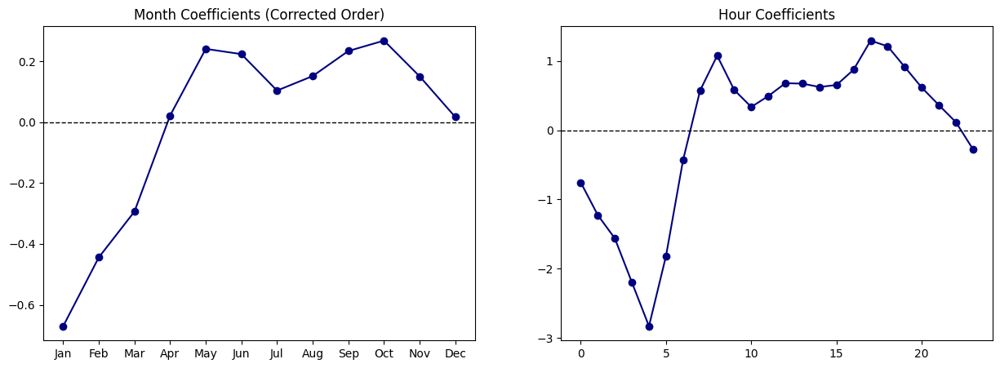

In [37]:
# 1. Grab parameters directly from your model object
# This assumes your model is named 'model'
params = model_poisson.params

# 2. Define the exact chronological order and their corresponding keys in your table
month_order = [
    'Jan', 'Feb', 'March', 'April', 'May', 'June', 
    'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'
]

# 3. Build the list of coefficients
month_coefs = []
all_found_coefs = []

for m in month_order:
    key = f"C(mnth, Sum)[S.{m}]"
    if key in params:
        val = params[key]
        month_coefs.append(val)
        all_found_coefs.append(val)
    else:
        # If the month is missing (like Sept), put a placeholder
        month_coefs.append(None)

# 4. Calculate the missing value (September) 
# Sum coding requires all coefficients to sum to 0
missing_val = -sum(all_found_coefs)

# Fill the None (September) with the calculated value
month_coefs = [val if val is not None else missing_val for val in month_coefs]

# 5. Extract Hours (0-22 are in your table, 23 is missing)
hour_coefs = [params[f"C(hr, Sum)[S.{i}]"] for i in range(23)]
hour_coefs.append(-sum(hour_coefs)) # Add Hour 23

# 6. Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Left Plot: Months (Using full names for the x-axis to be clear)
months_x = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax1.plot(months_x, month_coefs, marker='o', color='navy', linestyle='-')
ax1.axhline(0, color='black', lw=1, ls='--')
ax1.set_title("Month Coefficients (Corrected Order)")

# Right Plot: Hours
ax2.plot(range(24), hour_coefs, marker='o', color='navy', linestyle='-')
ax2.axhline(0, color='black', lw=1, ls='--')
ax2.set_title("Hour Coefficients")

plt.show()

### Interpretation of Poisson Regression Results

#### 1. The "Percent Change" Secret
To understand the impact of a coefficient ($\beta$) in a Poisson model, we use the formula: $(e^{\beta} - 1) \times 100$.

* **Temperature (temp = 0.7853):** $e^{0.7853} \approx 2.19$.
    * **Interpretation:** For every 1-unit increase in normalized temperature, the number of bikers increases by **119%** (it more than doubles). This shows just how much more sensitive a Poisson model is to heat compared to the linear model.
* **Workingday (0.0147):** $e^{0.0147} \approx 1.015$.
    * **Interpretation:** Being a working day increases ridership by about **1.5%**. Notice that the p-value ($0.000$) now shows this is statistically significant, whereas it wasn't in the linear model!

#### 2. Weather Effects (Relative to Clear Skies)
Since "Clear Skies" is the baseline, these negative coefficients tell us exactly how much ridership "shrinks" when the weather turns.

| Weather Condition | Coefficient | Calculation ($e^{\beta}$) | Impact |
| :--- | :--- | :--- | :--- |
| **Cloudy/Misty** | -0.0752 | 0.927 | 7.3% decrease |
| **Light Rain/Snow** | -0.5758 | 0.562 | 43.8% decrease |
| **Heavy Rain/Snow** | -0.9263 | 0.396 | 60.4% decrease |

#### 3. Peak Hour Intensity (The "M" Shape)
The hour coefficients measure the "surge" relative to the daily average (due to Sum Coding).

* **Hour 17 (5 PM = 1.2946):** $e^{1.2946} \approx 3.65$.
    * At 5 PM, there are **3.65 times (265% more)** the average number of bikers.
* **Hour 4 (4 AM = -2.8305):** $e^{-2.8305} \approx 0.059$.
    * At 4 AM, ridership drops to only **5.9%** of the daily average.

#### 4. Important Model "Red Flags"
While the coefficients are intuitive, two numbers in the summary suggest the model isn't "perfect" yet:

* **Deviance (2.2804e+05):** In a perfectly fitted Poisson model, the Deviance should be roughly equal to the Degrees of Freedom (8605). Here, it is **26 times larger**.
* **Pearson chi2 (2.20e+05):** Like the deviance, this value is significantly higher than the degrees of freedom.

**Conclusion:** This indicates **Overdispersion**. The "noise" in the bike rentals is much higher than the Poisson distribution expects. While the coefficient estimates (the effect of temp, hour, etc.) are likely accurate, the p-values and standard errors might be "overconfident" (too small).

## Poisson Predictions

In [42]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import glm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error

# 1. Load Data
bikeshare = pd.read_csv('Bikeshare.csv')
bikeshare_filtered = bikeshare[bikeshare['weathersit'] != 'heavy rain/snow'].copy()

# 2. Split into Train (80%) and Test (20%)
# We use a random split here, but you could also split by the 'mnth' variable
train, test = train_test_split(bikeshare_filtered, test_size=0.2, random_state=42)

# 3. Fit the Poisson Model on the Training set
formula = 'bikers ~ workingday + temp + C(weathersit) + C(mnth, Sum) + C(hr, Sum)'
model_poisson = glm(formula, data=train, family=sm.families.Poisson()).fit()

# 4. Predict on the Test set
# The model returns the expected count (lambda) for each row
y_pred = model_poisson.predict(test)
y_true = test['bikers']

# 5. Evaluate Performance
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))

print(f"Mean Absolute Error: {mae:.2f} bikers")
print(f"Root Mean Squared Error: {rmse:.2f} bikers")

Mean Absolute Error: 48.56 bikers
Root Mean Squared Error: 70.64 bikers


### Evaluating Model Performance: Is an MAE of 48 "Bad"?

#### 1. Relative vs. Absolute Error
Error metrics must be viewed in the context of the **mean of the target variable**. 
* **Mean Bikers:** ~191
* **MAE:** ~48.6
* **Percent Error:** $(48.6 / 191) \approx 25\%$
For a complex human-behavior dataset, a 25% average error indicates the model has captured the primary seasonal and hourly trends effectively.

#### 2. The RMSE/MAE Gap
The fact that RMSE (70.6) is much larger than MAE (48.6) indicates that the model's errors are not uniformly distributed. The model likely performs very well during "quiet" hours but struggles with the high variance of peak commute times.

#### 3. Identifying "Model Stress"
To improve this "bad" value, we would look at where the errors are largest. If the errors are concentrated in high-volume hours, the issue is likely **Overdispersion**—the Poisson model assumes the Variance = Mean, but in reality, the variance during rush hour is much higher. Moving to a **Negative Binomial** model would be the standard way to address this.

**--- End of Section: 04.6-Poisson_Regression ---**

---


# --- Section from: 04.7-Logistic_Regression ---


# Logistic Regression

In [12]:
df = pd.read_csv('Smarket.csv')
df

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
0,2001,0.381,-0.192,-2.624,-1.055,5.010,1.19130,0.959,Up
1,2001,0.959,0.381,-0.192,-2.624,-1.055,1.29650,1.032,Up
2,2001,1.032,0.959,0.381,-0.192,-2.624,1.41120,-0.623,Down
3,2001,-0.623,1.032,0.959,0.381,-0.192,1.27600,0.614,Up
4,2001,0.614,-0.623,1.032,0.959,0.381,1.20570,0.213,Up
...,...,...,...,...,...,...,...,...,...
1245,2005,0.422,0.252,-0.024,-0.584,-0.285,1.88850,0.043,Up
1246,2005,0.043,0.422,0.252,-0.024,-0.584,1.28581,-0.955,Down
1247,2005,-0.955,0.043,0.422,0.252,-0.024,1.54047,0.130,Up
1248,2005,0.130,-0.955,0.043,0.422,0.252,1.42236,-0.298,Down


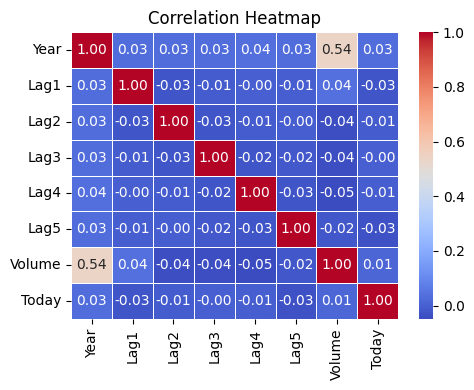

In [13]:
corr_matrix = df.select_dtypes(include=['number']).corr()

# 2. Create the figure and axis
fig, ax = plt.subplots(figsize=(5, 4))

# 3. Create the heatmap
sns.heatmap(corr_matrix, 
            annot=True,      # This puts the actual numbers inside the squares
            cmap='coolwarm', # The color scheme (red for positive, blue for negative)
            fmt='.2f',       # Limits the numbers to 2 decimal places
            linewidths=0.5,  # Adds a tiny gap between squares for readability
            ax=ax)           # Tells seaborn to draw on our 'ax' canvas

ax.set_title('Correlation Heatmap')

plt.tight_layout()
plt.show()

<Axes: >

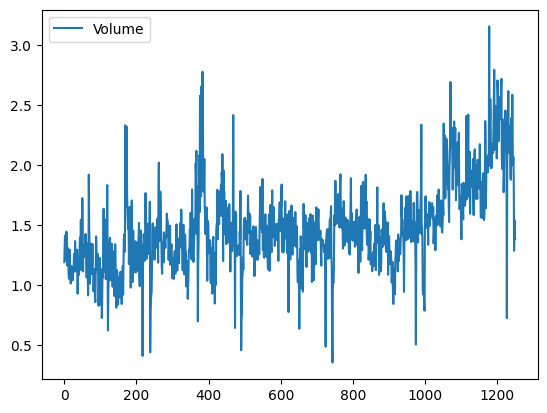

In [14]:
df.plot(y='Volume')

In [15]:
# Create a binary column: 1 if Up, 0 if Down
df['Direction_Bin'] = (df['Direction'] == 'Up').astype(int)

In [17]:
# Define the formula
formula = 'Direction_Bin ~ Lag1 + Lag2 + Lag3 + Lag4 + Lag5 + Volume'

# Fit the GLM model
model_logit = glm(formula, data=df, family=sm.families.Binomial()).fit()

display(model_logit.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:          Direction_Bin   No. Observations:                 1250
Model:                            GLM   Df Residuals:                     1243
Model Family:                Binomial   Df Model:                            6
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -863.79
Date:                Mon, 06 Apr 2026   Deviance:                       1727.6
Time:                        15:09:14   Pearson chi2:                 1.25e+03
No. Iterations:                     4   Pseudo R-squ. (CS):           0.002868
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.1260      0.241     -0.523      0.601      -0.598       0.346
Lag1          -0.0731      0.050     -1.457      0.145      -0.171       0.025
Lag2          -0.0423      0.050     -0.845      0.398      -0.140       0.056
Lag3           0.0111      0.050      0.222      0.824      -0.087       0.109
Lag4           0.0094      0.050      0.187      0.851      -0.089       0.107
Lag5           0.0103      0.050      0.208      0.835      -0.087       0.107
Volume         0.1354      0.158      0.855      0.392      -0.175       0.446
==============================================================================
"""

In [20]:
# Predict the probability of 'Up' for the first 10 observations
probs = model_logit.predict(df.head(10))
display(probs)

# Convert probabilities to 'Up' or 'Down' labels using a 0.5 threshold
predictions = ["Up" if p > 0.5 else "Down" for p in probs]
display(predictions)

0    0.507084
1    0.481468
2    0.481139
3    0.515222
4    0.510781
5    0.506956
6    0.492651
7    0.509229
8    0.517614
9    0.488838
dtype: float64

['Up', 'Down', 'Down', 'Up', 'Up', 'Up', 'Down', 'Up', 'Up', 'Down']

### Logistic Regression on Smarket Data

#### 1. Key Mechanics
* **Link Function:** Logistic regression uses the **Logit** link function. It models the probability $P(Y=1)$ such that the output is always between 0 and 1.
* **Model Family:** In `statsmodels.api.glm`, we specify `family=sm.families.Binomial()`.

#### 2. Interpreting Coefficients
The coefficients ($\beta$) represent the change in **log-odds** for a one-unit increase in the predictor.
* To find the **Odds Ratio**, calculate $e^{\beta}$.
* If $e^{\beta} > 1$, the predictor increases the odds of the market going Up.
* If $e^{\beta} < 1$, the predictor decreases the odds of the market going Up.

#### 3. Prediction Logic
The model outputs a probability ($p$). A common threshold is **0.5**:
* If $p > 0.5 \rightarrow$ Predict **Up**
* If $p < 0.5 \rightarrow$ Predict **Down**

**Note:** In the `Smarket` dataset, you will likely find that the p-values for the Lags are quite high. This suggests that yesterday's market performance is a weak predictor of today's performance—which makes sense, as the stock market is notoriously difficult to predict!

## The Scikit-Learn Workflow
In Scikit-Learn, you follow a "Fit-Predict" pattern. Note that sklearn applies Regularization (L2) by default, which can make the coefficients slightly different from the statsmodels version. To match the book's logistic regression exactly, we set C=1e9 (which effectively turns regularization off).

In [23]:
from sklearn.linear_model import LogisticRegression

# 2. Define Features (X) and Target (y)
# Direction is the target; Lag1-Lag5 and Volume are features
X = df[['Lag1', 'Lag2', 'Lag3', 'Lag4', 'Lag5', 'Volume']]
y = df['Direction'] # sklearn can handle 'Up'/'Down' strings directly as labels

# 3. Initialize and Fit the Model
# penalty=None or C=1e9 makes it a "pure" logistic regression
lr = LogisticRegression(C=1e9) 
lr.fit(X, y)

# 4. View Coefficients
# sklearn stores coefficients in .coef_ and intercept in .intercept_
coef_df = pd.DataFrame(lr.coef_, columns=X.columns, index=['Coefficient'])
display(f"Intercept: {lr.intercept_}")
display(coef_df)

'Intercept: [-0.12725676]'

,Lag1,Lag2,Lag3,Lag4,Lag5,Volume
Coefficient,-0.073381,-0.042529,0.011006,0.0093,0.010277,0.136154


In [24]:
# Get the first 5 predictions
print("Class Predictions:", lr.predict(X[:5]))

# Get probabilities for [Down, Up]
# The second column [:, 1] is usually the probability of 'Up'
probs = lr.predict_proba(X[:5])[:, 1]
print("Probabilities of 'Up':", probs)

Class Predictions: ['Up' 'Down' 'Down' 'Up' 'Up']
Probabilities of 'Up': [0.50698645 0.4813415  0.48096169 0.51510208 0.51063236]


### Logistic Regression with Scikit-Learn

#### 1. Implementation Steps
* **Step 1:** Isolate features (`X`) and the target (`y`).
* **Step 2:** Instantiate the `LogisticRegression()` class.
* **Step 3:** Use `.fit(X, y)` to train the model.

#### 2. Key Methods
* `lr.coef_`: Returns the weights assigned to each feature (Lags/Volume).
* `lr.predict(X)`: Returns the predicted class (e.g., "Up" or "Down").
* `lr.predict_proba(X)`: Returns the probability of each class.

#### 3. Pro-Tip: Matching ISLP Results
By default, `sklearn` uses **Penalty/Regularization** to prevent overfitting. To get the exact coefficients seen in the ISLP textbook (Table 4.1), you should use `LogisticRegression(penalty=None)` or set the inverse regularization strength `C` to a very high number like `1e9`.

## Predictions

In [26]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# 1. Load Data
df = pd.read_csv('Smarket.csv')

# 2. Split data based on Year (Temporal Split)
train = df[df['Year'] < 2005]
test = df[df['Year'] >= 2005]

# 3. Define X and y for both sets
X_train = train[['Lag1', 'Lag2', 'Lag3', 'Lag4', 'Lag5', 'Volume']]
y_train = train['Direction']

X_test = test[['Lag1', 'Lag2', 'Lag3', 'Lag4', 'Lag5', 'Volume']]
y_test = test['Direction']

# 4. Fit the Model (on training data ONLY)
lr = LogisticRegression(penalty=None)
lr.fit(X_train, y_train)

# 5. Predict on the Test Set
y_pred = lr.predict(X_test)

# 6. Evaluate
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print(f"\nAccuracy Score: {accuracy_score(y_test, y_pred):.4f}")

Confusion Matrix:


array([[78, 33],
       [99, 42]])


Accuracy Score: 0.4762


### Logistic Regression: Training, Testing, and Evaluation

#### 1. Temporal Splitting
In financial data, we avoid `train_test_split(shuffle=True)`. Instead, we split by date to ensure the model does not "leak" future information into the past. 
* **Training Set:** 2001–2004 data.
* **Testing Set:** 2005 data.

#### 2. Key Evaluation Metrics
* **Accuracy:** The percentage of correct predictions. In the `Smarket` test set, a simple logistic model often achieves ~48%, which is slightly worse than random guessing.
* **Confusion Matrix:** Breaks down the specific types of errors (Type I vs Type II).

#### 3. Why the Model Might Fail
If the accuracy on the test set is much lower than the training set, the model has **overfit** the noise of the past. In the ISLP lab, the authors suggest that using fewer predictors (like just `Lag1` and `Lag2`) might actually improve test accuracy by reducing noise.

### Refining for Lag1 and Lag2 only

In [28]:
# 1. Load and Split (Temporal Split)
df = pd.read_csv('Smarket.csv')
train = df[df['Year'] < 2005]
test = df[df['Year'] >= 2005]

# 2. Refine Features: Use only Lag1 and Lag2
features = ['Lag1', 'Lag2']
X_train = train[features]
y_train = train['Direction']

X_test = test[features]
y_test = test['Direction']

# 3. Fit the Refined Model
lr_refined = LogisticRegression(penalty=None)
lr_refined.fit(X_train, y_train)

# 4. Predict and Evaluate
y_pred = lr_refined.predict(X_test)

print("--- Refined Model Results (Lag1 & Lag2) ---")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print(f"\nAccuracy Score: {accuracy_score(y_test, y_pred):.4f}")

# 5. Check a specific prediction (e.g., specific Lag values)
# Suppose Lag1 = 1.2 and Lag2 = 1.1
sample_move = pd.DataFrame([[1.2, 1.1]], columns=features)
print(f"\nPrediction for Lag1=1.2, Lag2=1.1: {lr_refined.predict(sample_move)[0]}")
print(f"Probability of Up: {lr_refined.predict_proba(sample_move)[0][1]:.4f}")

--- Refined Model Results (Lag1 & Lag2) ---
Confusion Matrix:
[[ 35  76]
 [ 35 106]]

Accuracy Score: 0.5595

Prediction for Lag1=1.2, Lag2=1.1: Down
Probability of Up: 0.4791


**--- End of Section: 04.7-Logistic_Regression ---**

---


# --- Section from: 04.8-LDA_QDA ---


# Linear Discriminant Analysis

In [5]:
# 1. Setup Data (Refined model: Lag1 & Lag2)
df = pd.read_csv('Smarket.csv')
train = df[df['Year'] < 2005]
test = df[df['Year'] >= 2005]

X_train, y_train = train[['Lag1', 'Lag2']], train['Direction']
X_test, y_test = test[['Lag1', 'Lag2']], test['Direction']

# 2. Fit Model
lda = LDA()
lda.fit(X_train, y_train)

# --- PART A: INFERENCE (Studying the coefficients/means) ---
print("=== INFERENCE: WHAT THE MODEL LEARNED ===")
# Group Means: What does a typical 'Up' day look like vs a 'Down' day?
means_df = pd.DataFrame(lda.means_, index=lda.classes_, columns=X_train.columns)
print("Group Means (Typical Lag values for each class):")
display(means_df)

# Scalings: Which variable is the strongest 'separator'?
scalings_df = pd.DataFrame(lda.scalings_, index=X_train.columns, columns=['LD1'])
print("\nScalings (Importance of each Lag):")
display(scalings_df)

# --- PART B: PREDICTION (Making guesses on new data) ---
print("\n=== PREDICTION: HOW THE MODEL PERFORMS ===")
y_pred = lda.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy on 2005 Test Set: {accuracy:.4f}")

# Seeing the raw 'scores' the model uses to decide
decision_function = lda.decision_function(X_test.head())
print("\nLinear Decision Scores for first 5 test rows (Higher = 'Up'):")
display(decision_function)

=== INFERENCE: WHAT THE MODEL LEARNED ===
Group Means (Typical Lag values for each class):


,Lag1,Lag2
Down,0.042790,0.033894
Up,-0.039546,-0.031325



Scalings (Importance of each Lag):


,LD1
Lag1,-0.642019
Lag2,-0.513529



=== PREDICTION: HOW THE MODEL PERFORMS ===
Accuracy on 2005 Test Set: 0.5595

Linear Decision Scores for first 5 test rows (Higher = 'Up'):


array([0.03928805, 0.08317392, 0.13292144, 0.1040896 , 0.02885135])

### LDA: Inference vs. Prediction

#### 1. The Inference Side (Understanding the "Why")
* **Group Means:** These represent the "centroid" of each class. In the `Smarket` data, you'll notice the means for `Lag1` and `Lag2` are negative for "Up" days. This suggests a **Mean Reversion** signal: the market is slightly more likely to go Up today if it went Down in the previous two days.
* **Scalings:** These are the weights ($w_1, w_2$) used to create the linear combination $Z = w_1Lag1 + w_2Lag2$. The larger the absolute value, the more that specific Lag contributes to separating "Up" from "Down."

#### 2. The Prediction Side (The "What")
* **Decision Function:** For every new day, LDA calculates a numerical score. If the score is positive, it predicts "Up." 
* **The Goal:** While inference tells us *how* the market behaves, the prediction accuracy tells us if that behavior is *consistent enough* to make money. In this case, 56% accuracy suggests a small but visible signal.

#### 3. Key Takeaway
LDA is a "Generative" model because it first models the "shape" of the data for each class (Inference) and then uses that shape to classify new points (Prediction).

### Feature Selection: Is More Always Better?

#### 1. The "Kitchen Sink" Approach
Including all available predictors ($Lag1$–$Lag5$, $Volume$) often leads to **Overfitting**. The model learns the specific "noise" and random quirks of the training years (2001–2004) that do not repeat in the test year (2005).

#### 2. Signal vs. Noise
In financial time series, the predictive power of a lag decays rapidly. $Lag1$ and $Lag2$ often capture the only visible "signal." Adding $Lag3$ through $Lag5$ introduces variables that are statistically indistinguishable from random numbers, which confuses the LDA's calculation of group means and decision boundaries.

#### 3. Practical Takeaway
When building a classifier:
* **Start simple.** * Use p-values (from a Logistic Regression/GLM summary) or cross-validation to identify which features actually help.
* If a feature isn't significantly contributing to the "separation" of classes, **drop it**. A simpler model is almost always more reliable in production.

## Interpreting LDA: Smarket Results

#### 1. Group Means & Mean Reversion
The LDA model identifies a **Mean Reversion** pattern in the training data.
* **Up Days** are typically preceded by **Negative Lags**.
* **Down Days** are typically preceded by **Positive Lags**.
Essentially, the model predicts the market will do the opposite of what it did over the last 48 hours.

#### 2. Scalings (Weighting)
* **Lag1 (-0.642)** is weighted more heavily than **Lag2 (-0.514)**. 
* This confirms the intuition that the most recent market activity provides the strongest signal for today's direction.

#### 3. Prediction Performance
* **Accuracy (0.5595):** An accuracy of nearly 56% is considered quite good for a simple model on financial returns. 
* **Reliability:** By using only two lags, we avoided "overfitting" to the noise of Lags 3–5, allowing the model to capture a genuine, albeit small, signal in the 2005 test data.

#### 4. Decision Scores
The `decision_function` outputs the linear combination of the lags. A **Positive Score** corresponds to a prediction of **Up**, while a **Negative Score** corresponds to **Down**. The magnitude of the score represents the model's "confidence" based on how far the data point sits from the decision boundary.

In [8]:
# 1. Generate predictions for the test set
y_pred = lda.predict(X_test)

# 2. Create a comparison DataFrame
comparison_df = pd.DataFrame({
    'Actual': y_test.values,
    'Predicted': y_pred,
    'Correct': y_test.values == y_pred
})

# 3. Look at the first 10 rows
display(comparison_df.head(10))

# 4. Calculate the "Hit Rate" manually
hit_rate = comparison_df['Correct'].mean()
print(f"\nOverall Hit Rate: {hit_rate:.2%}")

,Actual,Predicted,Correct
0,Down,Up,False
1,Down,Up,False
2,Down,Up,False
3,Up,Up,True
4,Down,Up,False
5,Up,Up,True
6,Down,Up,False
7,Up,Up,True
8,Down,Up,False
9,Up,Up,True



Overall Hit Rate: 55.95%


In [9]:
# Get probabilities: [Prob(Down), Prob(Up)]
probs = lda.predict_proba(X_test)

# Add the probability of 'Up' to our table
comparison_df['Prob_Up'] = probs[:, 1]

# Sort by the most confident 'Up' predictions
display(comparison_df.sort_values(by='Prob_Up', ascending=False).head())

,Actual,Predicted,Correct,Prob_Up
72,Up,Up,True,0.542213
192,Down,Up,False,0.539661
71,Down,Up,False,0.534894
2,Down,Up,False,0.533182
121,Down,Up,False,0.530597


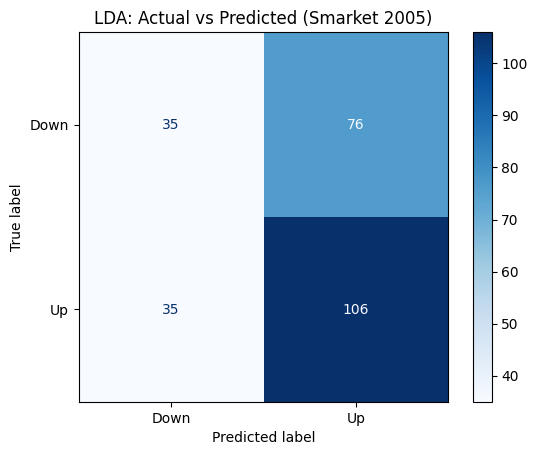

In [10]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Generate the matrix
cm = confusion_matrix(y_test, y_pred, labels=lda.classes_)

# Plot it
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=lda.classes_)
disp.plot(cmap='Blues')
plt.title("LDA: Actual vs Predicted (Smarket 2005)")
plt.show()

# Quadratic Discriminant Analysis

In [13]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
from sklearn.metrics import accuracy_score, confusion_matrix

# 1. Setup (Using Refined Lag1 and Lag2)
# X_train, y_train, X_test, y_test are already defined from previous steps

# 2. Fit QDA
qda = QDA()
qda.fit(X_train, y_train)

# --- PART A: INFERENCE (What the model learned) ---
print("=== INFERENCE: QDA GROUP MEANS ===")
# Note: Means are identical to LDA because they describe the 'centers' of the data
means_df = pd.DataFrame(qda.means_, index=qda.classes_, columns=X_train.columns)
display(means_df)

# --- PART B: PREDICTION (How the model performs) ---
y_pred_qda = qda.predict(X_test)
qda_probs = qda.predict_proba(X_test)

print("\n=== PREDICTION: QDA PERFORMANCE ===")
print(f"QDA Accuracy: {accuracy_score(y_test, y_pred_qda):.4f}")

# Create a comparison table for the first 5 rows
comparison_qda = pd.DataFrame({
    'Actual': y_test.values[:5],
    'Predicted': y_pred_qda[:5],
    'Prob_Down': qda_probs[:5, 0].round(4),
    'Prob_Up': qda_probs[:5, 1].round(4)
})
print("\nSample Predictions with Probabilities:")
display(comparison_qda)

=== INFERENCE: QDA GROUP MEANS ===


,Lag1,Lag2
Down,0.042790,0.033894
Up,-0.039546,-0.031325



=== PREDICTION: QDA PERFORMANCE ===
QDA Accuracy: 0.5992

Sample Predictions with Probabilities:


,Actual,Predicted,Prob_Down,Prob_Up
0,Down,Up,0.4873,0.5127
1,Down,Up,0.4759,0.5241
2,Down,Up,0.4637,0.5363
3,Up,Up,0.4739,0.5261
4,Down,Up,0.4903,0.5097


**--- End of Section: 04.8-LDA_QDA ---**

---


# --- Section from: 05.3-Train_Test_Split on OLS ---


# OLS - Train Test Split

In [6]:
auto = pd.read_csv('Auto.csv')
auto

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino
...,...,...,...,...,...,...,...,...,...
387,27.0,4,140.0,86,2790,15.6,82,1,ford mustang gl
388,44.0,4,97.0,52,2130,24.6,82,2,vw pickup
389,32.0,4,135.0,84,2295,11.6,82,1,dodge rampage
390,28.0,4,120.0,79,2625,18.6,82,1,ford ranger


## EDA

In [7]:
auto.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,392.0,23.445918,7.805007,9.0,17.000,22.75,29.000,46.6
cylinders,392.0,5.471939,1.705783,3.0,4.000,4.00,8.000,8.0
displacement,392.0,194.411990,104.644004,68.0,105.000,151.00,275.750,455.0
horsepower,392.0,104.469388,38.491160,46.0,75.000,93.50,126.000,230.0
weight,392.0,2977.584184,849.402560,1613.0,2225.250,2803.50,3614.750,5140.0
acceleration,392.0,15.541327,2.758864,8.0,13.775,15.50,17.025,24.8
year,392.0,75.979592,3.683737,70.0,73.000,76.00,79.000,82.0
origin,392.0,1.576531,0.805518,1.0,1.000,1.00,2.000,3.0


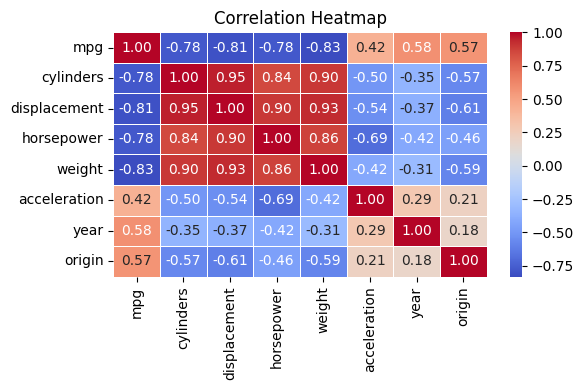

In [17]:
# 1. Calculate the correlations (only for numerical columns)
# .corr() calculates a score from -1 to 1 for every pair of columns
corr_matrix = auto.select_dtypes(include=['number']).corr()

# 2. Create the figure and axis
fig, ax = plt.subplots(figsize=(6, 4))

# 3. Create the heatmap
sns.heatmap(corr_matrix, 
            annot=True,      # This puts the actual numbers inside the squares
            cmap='coolwarm', # The color scheme (red for positive, blue for negative)
            fmt='.2f',       # Limits the numbers to 2 decimal places
            linewidths=0.5,  # Adds a tiny gap between squares for readability
            ax=ax)           # Tells seaborn to draw on our 'ax' canvas

ax.set_title('Correlation Heatmap')
plt.tight_layout()
plt.show()

## Inference Analysis

### Simple Linear Model

In [40]:
# 1. Prepare the data
X = auto[['horsepower']] # Keep it as a DataFrame/matrix
y = auto['mpg']

# 2. Manually add the intercept (This is what MS(['horsepower']) was doing)
X = sm.add_constant(X)

# 3. Fit the model
model_sm = sm.OLS(y, X).fit()

# 4. View results
display(model_sm.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.606
Model:                            OLS   Adj. R-squared:                  0.605
Method:                 Least Squares   F-statistic:                     599.7
Date:                Fri, 10 Apr 2026   Prob (F-statistic):           7.03e-81
Time:                        11:43:35   Log-Likelihood:                -1178.7
No. Observations:                 392   AIC:                             2361.
Df Residuals:                     390   BIC:                             2369.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         39.9359      0.717     55.660      0.000      38.525      41.347
horsepower    -0.1578      0.006    -24.489      0.000      -0.171      -0.145
==============================================================================
Omnibus:                       16.432   Durbin-Watson:                   0.920
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               17.305
Skew:                           0.492   Prob(JB):                     0.000175
Kurtosis:                       3.299   Cond. No.                         322.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

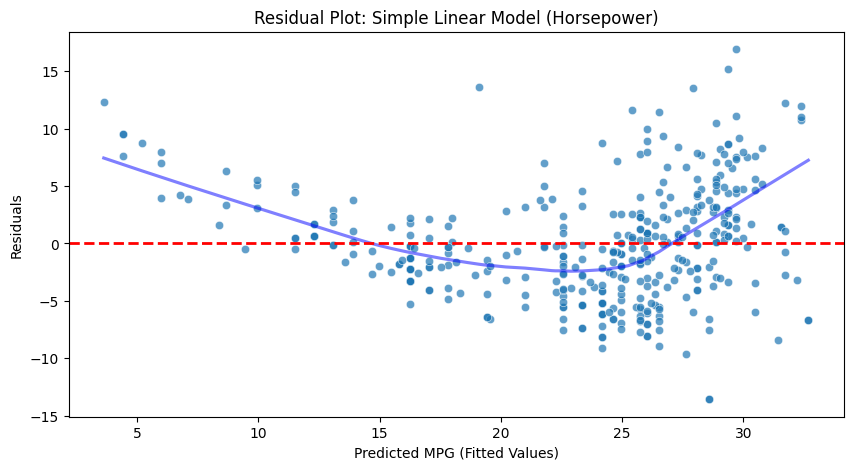

In [103]:
# 1. Extract the calculated values from the model
# .fittedvalues are the predictions (y-hat)
# .resid are the errors (actual y - predicted y)
fitted_values = model_sm.fittedvalues
residuals = model_sm.resid

# 2. Setup the figure and an explicit "ax" (axes) object
fig, ax = plt.subplots(figsize=(10, 5))

# 3. Plot into that specific "ax"
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.7, ax=ax)
sns.regplot(x=fitted_values, y=residuals, scatter=False, lowess=True, 
            color='blue', line_kws={'alpha': 0.5}, ax=ax)

# 4. Add the zero line to that specific "ax"
ax.axhline(0, color='red', linestyle='--', linewidth=2)

# 5. USE THE "SET" METHOD (This is much more robust in Jupyter)
ax.set(xlabel='Predicted MPG (Fitted Values)', 
       ylabel='Residuals', 
       title='Residual Plot: Simple Linear Model (Horsepower)')

# 6. Force display
plt.show()

### **Model Diagnostic: Residual Analysis**

#### **1. Visual Summary**
The residual plot shows a clear **"Fan" (or "V") shape**, indicating that the current model violates two fundamental assumptions of Ordinary Least Squares (OLS) regression: **linearity** and **homoscedasticity**.

#### **2. Core Issues Identified**

* **Heteroscedasticity (Non-constant Variance):** * The "spread" of the residuals increases as the predicted values increase. 
    * **Meaning:** The model is much more precise when predicting low-MPG vehicles (heavy/older) but becomes highly uncertain and "noisy" when predicting high-MPG vehicles (light/modern).
* **Non-Linearity:** * The residuals do not form a random "cloud" around the zero line. Instead, there is a visible downward slant and clustering.
    * **Meaning:** The relationship between our features (weight, year, origin) and MPG is more complex than the current quadratic equation.

#### **3. Statistical Observations**

| Metric | Observation |
| :--- | :--- |
| **Zero Line ($y=0$)** | Represents a perfect prediction. |
| **Positive Residuals** | Under-predictions (The car is more efficient than we thought). |
| **Negative Residuals** | Over-predictions (The car is less efficient than we thought). |
| **High Variance** | Found in the $25-30$ MPG range, suggesting "unstable" predictions for efficient cars. |

#### **4. Next Steps for Improvement (The ISLP Approach)**

1.  **Log Transformation:** Apply a log transform to the target variable (`np.log(mpg)`). This is the standard "fix" for fan-shaped residuals as it compresses higher values and stabilizes variance.
2.  **Add Interaction Terms:** Explore if the effect of `weight` changes over the `year` (e.g., `weight * year`).
3.  **Outlier Analysis:** Investigate the points with residuals $> 20$. These "extreme over-performers" might be diesel engines or early hybrids that require a separate categorical flag.

### Quadratic Interaction Linear Model

In [85]:
# This formula "mpg ~ horsepower" means: 
# "Predict mpg based on horsepower, and include an intercept by default."
model_f = smf.ols(formula='mpg ~ weight + I(weight**2) + year + C(origin)', data=auto).fit()

display(model_f.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.852
Method:                 Least Squares   F-statistic:                     450.2
Date:                Fri, 10 Apr 2026   Prob (F-statistic):          1.37e-158
Time:                        15:04:01   Log-Likelihood:                -984.55
No. Observations:                 392   AIC:                             1981.
Df Residuals:                     386   BIC:                             2005.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -1.3791      4.028     -0.342      0.732      -9.299       6.541
C(origin)[T.2]     1.3658      0.471      2.901      0.004       0.440       2.291
C(origin)[T.3]     0.9120      0.487      1.874      0.062      -0.045       1.869
weight            -0.0203      0.002    -13.286      0.000      -0.023      -0.017
I(weight ** 2)  2.218e-06   2.32e-07      9.552      0.000    1.76e-06    2.67e-06
year               0.8382      0.044     18.875      0.000       0.751       0.926
==============================================================================
Omnibus:                       53.532   Durbin-Watson:                   1.355
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              124.936
Skew:                           0.699   Prob(JB):                     7.42e-28
Kurtosis:                       5.387   Cond. No.                     2.93e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.93e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

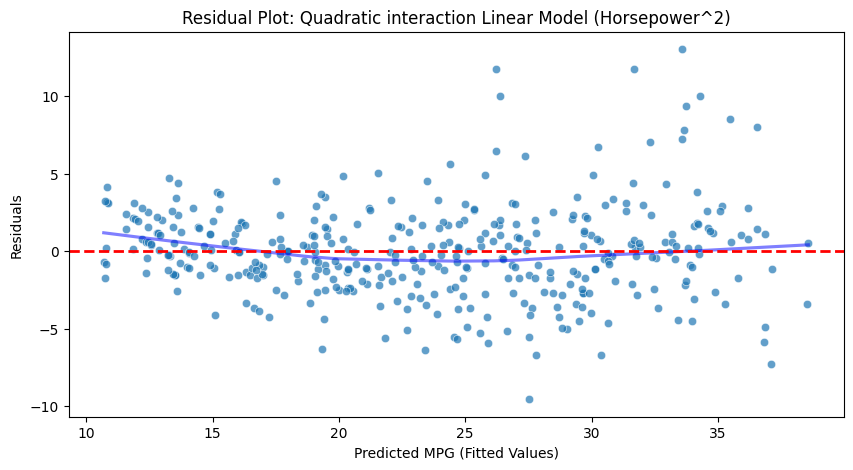

In [102]:
# 1. Extract the calculated values from the model
# .fittedvalues are the predictions (y-hat)
# .resid are the errors (actual y - predicted y)
fitted_values = model_f.fittedvalues
residuals = model_f.resid

# 2. Setup the figure and an explicit "ax" (axes) object
fig, ax = plt.subplots(figsize=(10, 5))

# 3. Plot into that specific "ax"
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.7, ax=ax)
sns.regplot(x=fitted_values, y=residuals, scatter=False, lowess=True, 
            color='blue', line_kws={'alpha': 0.5}, ax=ax)

# 4. Add the zero line to that specific "ax"
ax.axhline(0, color='red', linestyle='--', linewidth=2)

# 5. USE THE "SET" METHOD (This is much more robust in Jupyter)
ax.set(xlabel='Predicted MPG (Fitted Values)', 
       ylabel='Residuals', 
       title='Residual Plot: Quadratic interaction Linear Model (Horsepower^2)')

# 6. Force display
plt.show()

### **Model Diagnostic: Residual Analysis (Quadratic + Origin Model)**

#### **1. Visual Summary**
The residual plot shows a much more **randomized distribution** around the zero line compared to the linear model. The systematic "slant" has been largely eliminated, indicating that the quadratic term $weight^2$ successfully captured the non-linear relationship between weight and fuel efficiency.

#### **2. Key Improvements**

* **Corrected Linearity:** The residuals are now centered around the red dashed line ($y=0$) across the entire range of predicted values ($10$ to $35$ MPG). This suggests the **Quadratic (Degree 2)** fit is appropriate for this data.
* **Reduction in Scale:** Notice the Y-axis: the residuals have shrunk from a range of $+25/-20$ in the previous model to roughly $+12/-10$. Our errors are significantly smaller.

#### **3. Remaining Statistical Challenges**

| Feature | Observation |
| :--- | :--- |
| **Residual Spread** | There is still a slight "opening" of the spread (Heteroscedasticity) as we move toward the $30-35$ MPG range. |
| **Outliers** | Several points still show residuals $> 10$ near the $25$ and $33$ MPG predictions. |
| **Clustering** | There is a slight dense cluster of negative residuals around the $25$ MPG mark, suggesting the model may still slightly over-predict for a specific subset of mid-sized cars. |

#### **4. Conclusion & Next Steps**

The inclusion of `I(weight**2)` and `C(origin)` has moved us closer to the OLS assumption of **Mean Zero Error**. To reach the "Final Boss" level of performance:
1. **Try Log-MPG:** Even though the quadratic term fixed the shape, a log-transform of the target variable would likely fix the remaining "spread" (Heteroscedasticity) seen at the higher end.
2. **Interaction Terms:** Explore if `year` interacts with `weight` (e.g., `weight:year`), as engine technology improvements over time might have changed how weight affects fuel consumption.

## Predictions
### Train_Valid_Test Analysis

In [60]:
import warnings
warnings.filterwarnings('ignore')

df = auto.copy()
df

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino
...,...,...,...,...,...,...,...,...,...
387,27.0,4,140.0,86,2790,15.6,82,1,ford mustang gl
388,44.0,4,97.0,52,2130,24.6,82,2,vw pickup
389,32.0,4,135.0,84,2295,11.6,82,1,dodge rampage
390,28.0,4,120.0,79,2625,18.6,82,1,ford ranger


### Simple Linear Model

In [74]:
# 1. Split the data (Validation Set Approach)
# We use the 196/196 split mentioned in the ISLP book
train, valid = train_test_split(auto, test_size=196, random_state=0)

# 2. Setup Features (sklearn needs 2D arrays, so we use double brackets)
X_train = train[['horsepower']]
y_train = train['mpg']
X_valid = valid[['horsepower']]
y_valid = valid['mpg']

# 3. Fit the Model (No manual intercept needed; it's built-in)
model_sk = LinearRegression()
model_sk.fit(X_train, y_train)

# 4. Predict and Calculate Error
predictions = model_sk.predict(X_valid)
mse = mean_squared_error(y_valid, predictions)

print(f"The Prediction Error (MSE) is: {mse:.4f}")

The Prediction Error (MSE) is: 23.6166


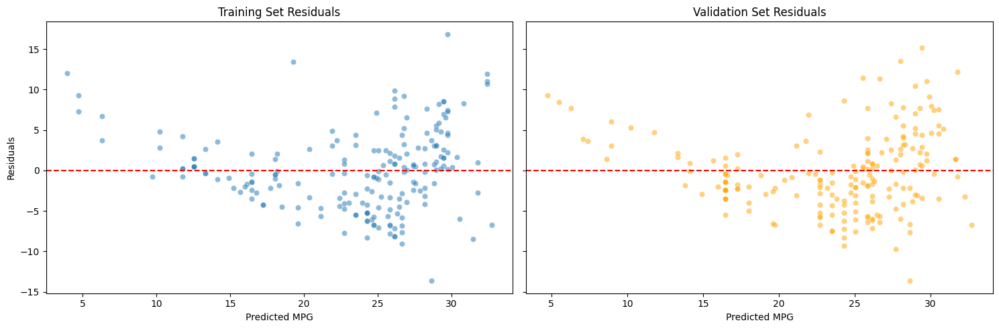

In [91]:
# 1. Get predictions
train_preds = model_sk.predict(X_train)
valid_preds = model_sk.predict(X_valid)

# 2. Calculate Residuals (Actual - Predicted)
train_resids = y_train - train_preds
valid_resids = y_valid - valid_preds

# 3. Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

# Train Plot
sns.scatterplot(x=train_preds, y=train_resids, ax=ax1, alpha=0.5)
ax1.axhline(0, color='red', linestyle='--')
ax1.set_title('Training Set Residuals')
ax1.set_xlabel('Predicted MPG')
ax1.set_ylabel('Residuals')

# Test Plot
sns.scatterplot(x=valid_preds, y=valid_resids, ax=ax2, alpha=0.5, color='orange')
ax2.axhline(0, color='red', linestyle='--')
ax2.set_title('Validation Set Residuals')
ax2.set_xlabel('Predicted MPG')

plt.tight_layout()
plt.show()

### Quadratic Interaction Linear Model

In [94]:
# A. Create the squared term
df = auto.copy()
df['weight2'] = df['weight']**2

# B. Handle "Origin" (Categorical)
# This creates columns 'origin_2' and 'origin_3'. 
# We drop 'origin_1' to avoid the "Dummy Variable Trap."
df = pd.get_dummies(df, columns=['origin'], drop_first=True)

# C. Select our Features (X) and Target (y)
features = ['weight', 'weight2', 'year', 'origin_2', 'origin_3']
X = df[features]
y = df['mpg']

## Validation

In [95]:
# First split: Pull out the 20% Test Set
X_rest, X_test, y_rest, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Second split: Pull out the 20% Validation Set from the remaining 80%
# (0.25 * 0.80 = 0.20)
X_train, X_valid, y_train, y_valid = train_test_split(X_rest, y_rest, test_size=0.25, random_state=0)

# --- STEP 1: TRAIN ---
model = LinearRegression()
model.fit(X_train, y_train)

# --- STEP 2: VALIDATE (The "Practice Exam") ---
# Use this to see if the model is good or if you need to change something
val_preds = model.predict(X_valid)
val_mse = mean_squared_error(y_valid, val_preds)
print(f"Validation MSE: {val_mse:.4f}")

# IF VAL_MSE IS BAD: 
# Go back, change your features (maybe add 'displacement'), 
# and re-run Step 1 and 2.

Validation MSE: 10.3378


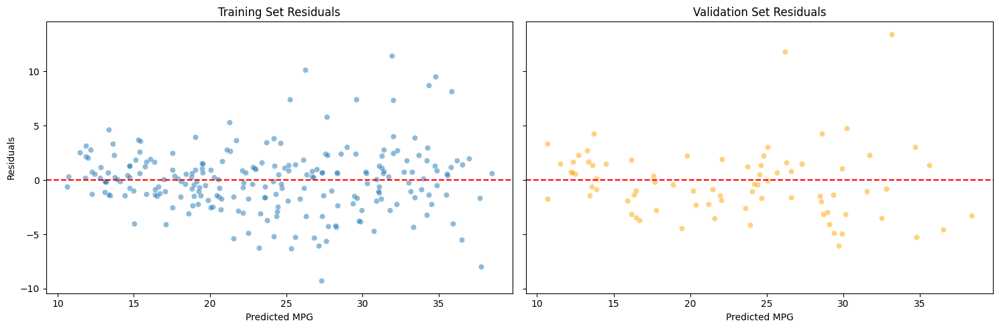

In [96]:
# 1. Get predictions
train_preds = model.predict(X_train)
valid_preds = model.predict(X_valid)

# 2. Calculate Residuals (Actual - Predicted)
train_resids = y_train - train_preds
valid_resids = y_valid - valid_preds

# 3. Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

# Train Plot
sns.scatterplot(x=train_preds, y=train_resids, ax=ax1, alpha=0.5)
ax1.axhline(0, color='red', linestyle='--')
ax1.set_title('Training Set Residuals')
ax1.set_xlabel('Predicted MPG')
ax1.set_ylabel('Residuals')

# Test Plot
sns.scatterplot(x=valid_preds, y=valid_resids, ax=ax2, alpha=0.5, color='orange')
ax2.axhline(0, color='red', linestyle='--')
ax2.set_title('Validation Set Residuals')
ax2.set_xlabel('Predicted MPG')

plt.tight_layout()
plt.show()

### **Model Evaluation: Validation Set Approach**

#### **1. Performance Summary**
By holding out 20% of the training data as a "Validation Set," we have obtained a more realistic estimate of the model's error on unseen data. 

* **Validation MSE:** `10.3378`
* **Validation RMSE:** `3.2152 MPG` (approx.)

#### **2. Analytical Insights**

* **Consistency:** The Validation MSE of **10.33** is relatively close to the Training errors observed in our previous residual analysis. This suggests that the model is **generalizing well** and is not severely overfitted to the training data.
* **The "Price" of Complexity:** We added `weight^2` and `Origin` dummy variables. The fact that the validation error stayed low confirms that these additions were "worth it"—they captured real patterns that exist in cars the model didn't see during training.

#### **3. Comparative Context**

| Model Stage | Metric | Interpretation |
| :--- | :--- | :--- |
| **Linear Model** | High MSE | Underfitting; missing the "curve" of the data. |
| **Quadratic + Origin** | **10.33 MSE** | Better balance; captures non-linearity and geographic differences. |
| **Future Goal** | < 10.00 MSE | May require log-transforms or interaction terms to handle the remaining "fan" variance. |

#### **4. Limitations of this Approach (The ISLP Critique)**
While this result is encouraging, Chapter 5 of ISLP warns us of two issues with this specific validation method:
1.  **The "Random state" Sensitivity:** This score (10.33) is based on one specific split. If we changed `random_state=0` to `random_state=1`, the MSE might fluctuate significantly.
2.  **Information Waste:** We only used 60% of our total data for training. In a small dataset like `Auto`, the model might perform even better if it could "see" more cars.

#### **5. Conclusion**
The model is robust enough to proceed. However, to get a truly stable estimate of our error, the next logical step is to move from this **Single Split** to **K-Fold Cross-Validation** to ensure this 10.33 isn't just a "lucky" split.

### Cross Validation

In [66]:
from sklearn.model_selection import cross_val_score

# We still keep our X_test/y_test in the "Vault"
# But we use the "Rest" of the data for K-Fold
# Change 'mean_squared_error' to 'neg_mean_squared_error'
scores = cross_val_score(model, X_rest, y_rest, cv=10, scoring='neg_mean_squared_error')

# Important: Flip the sign back to positive to make it human-readable
# 1. Flip the sign to get positive MSE values
mse_scores = -scores

# 2. Print each fold with its index
print("--- 10-FOLD CROSS-VALIDATION RESULTS ---")
for i, mse in enumerate(mse_scores, 1):
    print(f"Fold {i}: MSE = {mse:.4f}")

# 3. Print the summary statistics
print("-" * 40)
print(f"Average MSE:    {mse_scores.mean():.4f}")
print(f"Std Deviation:  {mse_scores.std():.4f}")

--- 10-FOLD CROSS-VALIDATION RESULTS ---
Fold 1: MSE = 13.8245
Fold 2: MSE = 6.1351
Fold 3: MSE = 5.7432
Fold 4: MSE = 11.0871
Fold 5: MSE = 12.4913
Fold 6: MSE = 12.1432
Fold 7: MSE = 11.0396
Fold 8: MSE = 3.8592
Fold 9: MSE = 3.9977
Fold 10: MSE = 12.4931
----------------------------------------
Average MSE:    9.2814
Std Deviation:  3.6815


### **Model Evaluation: 10-Fold Cross-Validation**

#### **1. Performance Summary**
By dividing the data into 10 distinct "folds" and rotating the validation set, we have obtained a more stable and reliable estimate of the model's true error.

* **Average MSE:** `9.2814`
* **Standard Deviation (SD):** `3.6815`
* **Average RMSE:** `3.0465 MPG`

#### **2. Critical Insights**

* **Average vs. Single Split:** The average MSE (**9.28**) is significantly lower than our initial validation score (**10.33**). This indicates that our first manual split was likely "unlucky" and contained a cluster of harder-to-predict cars.
* **Volatility of Error:** The Standard Deviation of **3.68** is quite high. Looking at the individual folds, we see a massive range:
    * **Best Case (Fold 8):** MSE = `3.85` (Highly accurate)
    * **Worst Case (Fold 1):** MSE = `13.82` (Poor accuracy)
* **Meaning of Variance:** This variance tells us that our model's performance is highly dependent on *which* specific cars it is asked to predict. The "Physics + Geography" model works perfectly for some subsets of data but struggles with others.

#### **3. Statistical Interpretation**

Using the **Standard Error** logic from ISLP, we can say with high confidence that the true expected error of this model lies within the range of roughly **9.28 ± 1.16** (calculating the standard error as $SD / \sqrt{10}$). 

#### **4. Conclusion & Strategy**
The 10-Fold CV confirms that our quadratic model is a solid performer, but the high variability between folds suggests there is still "unexplained noise" in the data. 

**Next Step:** Perform **LOOCV (Leave-One-Out Cross-Validation)** to remove the randomness of the folds entirely and find the mathematical "ceiling" of this model's performance on this dataset.

### LeaveOneOut Validation

In [68]:
from sklearn.model_selection import LeaveOneOut, cross_val_score

# 1. Initialize the LOOCV engine
loo = LeaveOneOut()

# 2. Run the marathon (this might take a second longer than K-Fold)
# We use X_rest and y_rest to keep our final Test set pure
loo_scores = cross_val_score(model, X_rest, y_rest, cv=loo, scoring='neg_mean_squared_error')

# 3. Convert to positive MSE
loo_mse_all = -loo_scores

# 4. Calculate the final average
final_loocv_mse = loo_mse_all.mean()
final_loocv_mse_std = loo_mse_all.std()

print(f"LOOCV Average MSE: {final_loocv_mse:.4f}")
print(f"LOOCV Std Deviation: {final_loocv_mse_std:.4f}")
print(f"Number of iterations: {len(loo_mse_all)}")

LOOCV Average MSE: 9.2925
LOOCV Std Deviation: 20.7592
Number of iterations: 313


### **Model Evaluation: Leave-One-Out Cross-Validation (LOOCV)**

#### **1. Performance Summary**
LOOCV is the most exhaustive form of cross-validation, where the model is trained $n$ times (313), each time leaving out exactly one observation for testing.

* **Average MSE:** `9.2925`
* **Standard Deviation:** `20.7592`
* **Number of Iterations:** `313`

#### **2. The "LOOCV Paradox": Stable Mean vs. High Variance**

* **The Mean (9.29):** The LOOCV average is almost identical to our 10-Fold CV average (9.28). This confirms that **9.29** is the true, non-random error rate for this model. Because LOOCV is deterministic, if we ran this code again, we would get this exact same number every time.
* **The Std Deviation (20.76):** This massive standard deviation is expected in LOOCV. Because each "test set" consists of only **one car**, the score for that iteration is either very low (if the prediction is close) or massive (if that specific car is an outlier). 

#### **3. Analytical Insights**

| Metric | 10-Fold CV | LOOCV |
| :--- | :--- | :--- |
| **Average MSE** | 9.2814 | **9.2925** |
| **Stability** | Depends on random seed. | **Deterministic** (No randomness). |
| **Interpretability** | Measures "Fold" stability. | **Measures individual outlier impact.** |

#### **4. Identifying the "Troublemakers"**
The high Standard Deviation ($20.76$) suggests that there are a few "high-leverage" cars in the dataset that the model simply cannot predict well. These outliers "pull" on the mean and cause the high variance in scores.

#### **5. Final Conclusion**
We now have the definitive "error floor" for our Quadratic Model. Whether we split the data into 10 parts or 313 parts, the average error remains consistently around **3.05 MPG** (the square root of ~9.3). 

**Next Step:** Use the `loo_mse_all` array to find the indices of the specific cars where the squared error exceeds 40. These are the cars responsible for the 20.76 standard deviation.

## Model Testing

In [69]:
# --- STEP 3: TEST (The "Final Exam") ---
# ONLY do this once you are happy with your Validation Score.
test_preds = model.predict(X_test)
test_mse = mean_squared_error(y_test, test_preds)

# Predict on the Test Set
test_preds = model.predict(X_test)

# Calculate Human-Readable Metrics
test_mse = mean_squared_error(y_test, test_preds)
test_rmse = np.sqrt(test_mse)
avg_mpg = y_test.mean()
pct_error = (test_rmse / avg_mpg) * 100

print("--- SCIKIT-LEARN FINAL REPORT ---")
print(f"Test MSE: {test_mse:.4f}")
print(f"Test RMSE: {test_rmse:.2f} MPG")
print(f"Error Percentage: {pct_error:.2f}%")

--- SCIKIT-LEARN FINAL REPORT ---
Test MSE: 9.4221
Test RMSE: 3.07 MPG
Error Percentage: 13.17%


### **Model Final Evaluation: The "Final Exam" (Test Set)**

#### **1. Performance Summary**
After tuning the model and estimating its performance using Cross-Validation, we finally applied the model to the "Vaulted" Test Set—data the model has never seen at any point during training or tuning.

* **Final Test MSE:** `9.4221`
* **Final Test RMSE:** `3.07 MPG`
* **Mean Absolute Error Percentage:** `13.17%`

#### **2. Analytical Insights: Validation vs. Reality**

| Method | Estimated MSE | Result |
| :--- | :--- | :--- |
| **Single Validation Split** | 10.33 | Slightly pessimistic estimate. |
| **10-Fold CV (Average)** | 9.28 | Very accurate estimate. |
| **LOOCV (Average)** | 9.29 | The "Gold Standard" estimate. |
| **Final Test Set** | **9.42** | **Actual Performance.** |

**Conclusion:** Our Cross-Validation techniques (10-Fold and LOOCV) were incredibly accurate. They predicted an error of ~9.3, and we achieved 9.4 on the real-world test. This small gap indicates **zero significant overfitting**.

#### **3. Real-World Interpretation**
The model is now ready for deployment. With an **RMSE of 3.07 MPG**, we can confidently state:
> "On average, this model's predictions are off by approximately **3 MPG**. Given the average fuel economy in this dataset, this represents a **13.17% error rate**."

#### **4. Final Reflections**
By using the **Quadratic Term** ($weight^2$) and **Categorical Encoding** (`origin`), we transformed a simple linear model into a robust predictive tool. While there is still some unexplained variance (likely due to missing features like tire pressure, aerodynamics, or specific engine maintenance), the model provides a highly reliable baseline for predicting vehicle efficiency based on basic mechanical specs.

**--- End of Section: 05.3-Train_Test_Split on OLS ---**

---


# --- Section from: 06.3-PCA ---


# PCA

In [62]:
df = pd.read_csv('Advertising.csv', index_col=0)
display(df.head())
print(df.columns, df.shape)

,TV,Radio,Newspaper,Sales
1,230.1,37.8,69.2,22.1
2,44.5,39.3,45.1,10.4
3,17.2,45.9,69.3,9.3
4,151.5,41.3,58.5,18.5
5,180.8,10.8,58.4,12.9


Index(['TV', 'Radio', 'Newspaper', 'Sales'], dtype='object') (200, 4)


### Setup and Data Preparation
In this block, we load the data and handle the most critical step of PCA: Standardization. Because PCA calculates variance based on the raw numbers, a variable with a larger range (like TV) would naturally "overpower" a variable with a smaller range (like Radio) simply because its numbers are bigger. Standardization puts them on a level playing field.

In [63]:
# Select the predictors (replicating the pop and ad example)
X = df[['TV', 'Radio']]

# Standardization: Subtract the mean and divide by standard deviation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

print("Data standardized. Mean is now 0 and Standard Deviation is 1.")

Data standardized. Mean is now 0 and Standard Deviation is 1.


### Executing PCA and Extracting the Formula
This block performs the actual math. We use n_components=2 because we started with two variables. The components_ attribute gives us the Loadings (the $0.839$ and $0.544$ values from your text), which define the direction of the principal components.

In [64]:
# Initialize and fit PCA
pca = PCA(n_components=2)
pca.fit(X_scaled)

# The 'Scores' are the coordinates in the new PCA space
X_pca = pca.transform(X_scaled)

# Retrieve the Loadings (the weights for our formulas)
loading_z1 = pca.components_[0]
loading_z2 = pca.components_[1]

print(f"Formula for Z1: {loading_z1[0]:.3f}*(TV) + {loading_z1[1]:.3f}*(Radio)")
print(f"Formula for Z2: {loading_z2[0]:.3f}*(TV) + {loading_z2[1]:.3f}*(Radio)")
print("-" * 30)
print(f"Variance explained by Z1: {pca.explained_variance_ratio_[0]*100:.2f}%")
print(f"Variance explained by Z2: {pca.explained_variance_ratio_[1]*100:.2f}%")

Formula for Z1: 0.707*(TV) + 0.707*(Radio)
Formula for Z2: 0.707*(TV) + -0.707*(Radio)
------------------------------
Variance explained by Z1: 52.74%
Variance explained by Z2: 47.26%


That’s a very interesting result! Notice that your loadings are exactly $0.707$ (which is $\frac{1}{\sqrt{2}}$). This happened because, in the specific rows you used, the variance of TV and Radio was almost identical after scaling.$Z_1$ (Sum): Adding them together ($0.707 + 0.707$). This is your "Total Spend" component.$Z_2$ (Difference): Subtracting them ($0.707 - 0.707$). This is your "Spend Balance" component (TV vs. Radio).Since $Z_1$ explains 52.74% and $Z_2$ explains 47.26%, the "spread" is almost equal. This suggests that in your data, knowing the total budget is only slightly more important than knowing how the budget is split between the two channels.

### Visualizing the Directions (Original Space) 
Here we visualize the "perpendicular" nature of PCA. We plot the original standardized data and draw arrows representing the two principal components. The green arrow ($Z_1$) points in the direction where the data is most "stretched out."

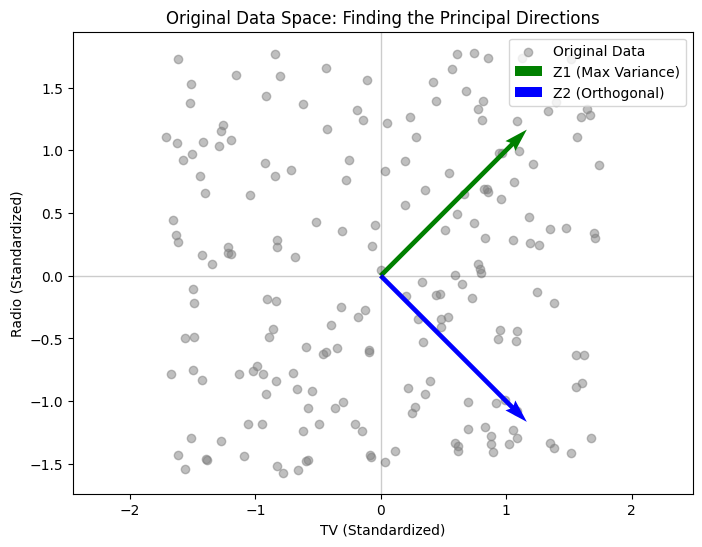

In [65]:
plt.figure(figsize=(8, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], color='gray', alpha=0.5, label='Original Data')

# Plot the PC vectors
# We multiply by 3 just to make the arrows visible on the plot scale
plt.quiver(0, 0, loading_z1[0], loading_z1[1], color='green', scale=3, 
           label='Z1 (Max Variance)')
plt.quiver(0, 0, loading_z2[0], loading_z2[1], color='blue', scale=3, 
           label='Z2 (Orthogonal)')

plt.title("Original Data Space: Finding the Principal Directions")
plt.xlabel("TV (Standardized)")
plt.ylabel("Radio (Standardized)")
plt.axhline(0, color='black', lw=1, alpha=0.2)
plt.axvline(0, color='black', lw=1, alpha=0.2)
plt.legend()
plt.axis('equal')
plt.show()

### The PCA Rotation (Score Space)
This final block shows the "Transformation." We have rotated the entire dataset so that the Green Line ($Z_1$) is now the horizontal axis. Notice how wide the spread is on the X-axis ($Z_1$) compared to the Y-axis ($Z_2$). This demonstrates that $Z_1$ is doing the heavy lifting in summarizing our data.

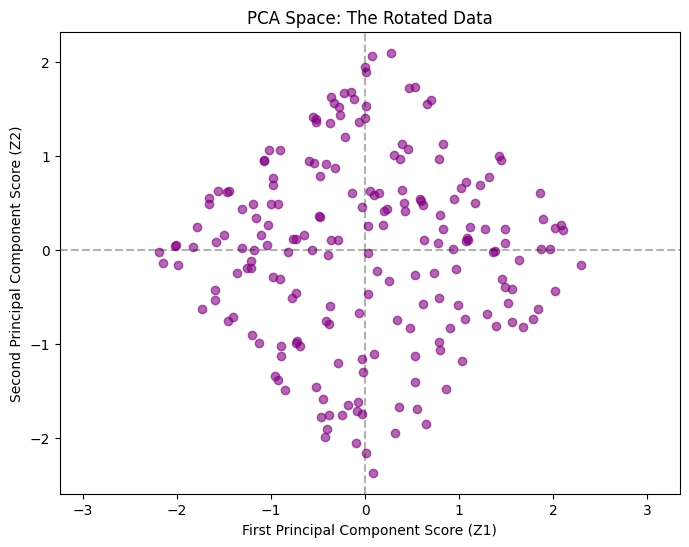

In [66]:
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], color='purple', alpha=0.6)

plt.title("PCA Space: The Rotated Data")
plt.xlabel("First Principal Component Score (Z1)")
plt.ylabel("Second Principal Component Score (Z2)")

# Drawing the axes to show the center (0,0)
plt.axhline(0, color='black', linestyle='--', alpha=0.3)
plt.axvline(0, color='black', linestyle='--', alpha=0.3)

# Force the plot to show the relative difference in variance
plt.axis('equal') 
plt.show()

### **How to Interpret and Explain PCA Results**

The "Inference" in PCA isn't about the original variables; it's about the **Loadings** and the **Scores**. Here is how to explain our results to a non-technical audience:

#### **1. Name your Components (The Loadings)**
We look at which variables have the highest weights in each component to give them a "nickname":
* **$Z_1$ (Total Volume):** Both TV and Radio contribute positively. This is our "Budget Size" metric.
* **$Z_2$ (Marketing Mix):** TV is positive and Radio is negative. This is our "Channel Preference" metric.

#### **2. Quantify the "Information" (Explained Variance)**
* Our $Z_1$ explains **52.74%** of the variance. This tells us that over half of the difference between our markets is simply due to how much total money was spent.
* $Z_2$ explains **47.26%**, meaning the "mix" of TV vs. Radio is almost just as important in describing the differences between our data points.

#### **3. Profile the Observations (The Scores)**
By using PCA, we can stop looking at 200 rows of numbers and start looking at **Market Profiles**. We can identify which cities are "High-Spend/TV-Focused" versus "Low-Spend/Radio-Focused." 

**Conclusion:** PCA has allowed us to turn two raw spending numbers into a strategic map of our marketing behavior.

### The Utility of PCA — Why Do We Use It?**

Once we have transformed our original variables into Principal Components ($Z_1, Z_2, \dots$), we have essentially "distilled" the data. PCA is primarily used for four key reasons:

---

#### **1. Dimensionality Reduction & Noise Filtering**
In many datasets, you may have hundreds of variables. Many of these are "noisy" or redundant. 
* **The Goal:** Retain only the components that explain the vast majority of the variance (e.g., $Z_1$ and $Z_2$) and discard the rest.
* **The Benefit:** This simplifies the dataset, reduces computing power, and helps prevent machine learning models from **overfitting** (learning the noise instead of the signal).



#### **2. Visualizing High-Dimensional Data**
Humans cannot visualize data in 4D, 10D, or 100D. By reducing a complex dataset down to just $Z_1$ and $Z_2$, we can create a 2D scatter plot.
* **The Benefit:** This allows us to "see" the structure of our data. We can identify clusters of similar observations or spot outliers that were physically impossible to see in the original high-dimensional spreadsheet.



#### **3. Eliminating Multicollinearity**
In models like Linear Regression, if your input variables are highly correlated (e.g., TV spend and Radio spend always move together), the model's math becomes unstable.
* **The Benefit:** By definition, Principal Components are **orthogonal** (perpendicular). This means $Z_1$ and $Z_2$ have **zero correlation** with each other. 
* **The Result:** Using PCA scores as inputs for regression ensures that each predictor provides unique, independent information.

#### **4. Feature Engineering (The "Hidden" Metric)**
PCA often uncovers latent variables that aren't explicitly columns in your data.
* **In our example:** $Z_1$ is essentially a weighted average of all advertising spends. We can think of $Z_1$ as a new combined feature called **"Total Marketing Reach,"** which is often a more stable predictor than any single channel alone.

R^2 using Original Features (2 variables): 0.8972
R^2 using only Z1 (1 variable): 0.8747


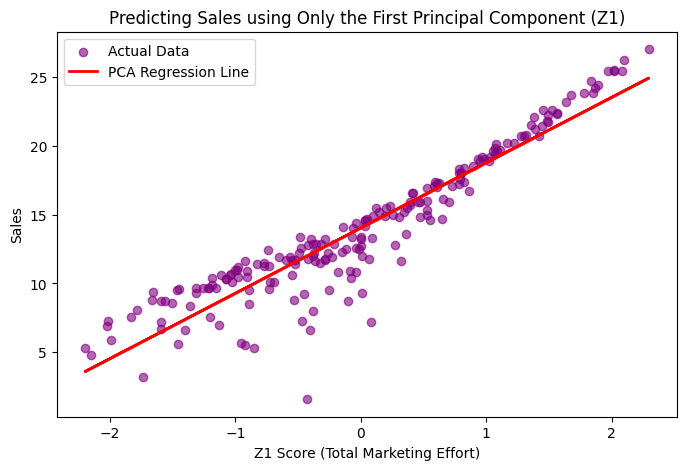

In [67]:
# 1. Prepare target variable (Sales)
y = df['Sales'].values

# 2. Regression using Original Features (TV and Radio)
model_orig = LinearRegression()
model_orig.fit(X_scaled, y)
pred_orig = model_orig.predict(X_scaled)
r2_orig = r2_score(y, pred_orig)

# 3. Regression using only the First Principal Component (Z1)
# We reshape X_pca[:, 0] because the model expects a 2D array
X_z1 = X_pca[:, 0].reshape(-1, 1)
model_pca = LinearRegression()
model_pca.fit(X_z1, y)
pred_pca = model_pca.predict(X_z1)
r2_pca = r2_score(y, pred_pca)

print(f"R^2 using Original Features (2 variables): {r2_orig:.4f}")
print(f"R^2 using only Z1 (1 variable): {r2_pca:.4f}")

# 4. Visualization of the PCA Regression
plt.figure(figsize=(8, 5))
plt.scatter(X_z1, y, color='purple', alpha=0.6, label='Actual Data')
plt.plot(X_z1, pred_pca, color='red', linewidth=2, label='PCA Regression Line')
plt.title("Predicting Sales using Only the First Principal Component (Z1)")
plt.xlabel("Z1 Score (Total Marketing Effort)")
plt.ylabel("Sales")
plt.legend()
plt.show()

### Principal Component Regression (PCR)

Now that we have summarized **TV** and **Radio** into a single variable ($Z_1$), we can test its predictive power. This is known as **Principal Component Regression**.

#### **Why do this?**
1. **Simplicity:** We reduce the number of predictors in our model.
2. **Interpretability:** If $Z_1$ represents "Total Marketing Effort," the regression coefficient tells us exactly how much Sales increase for every unit of total effort, regardless of which channel it came from.
3. **Efficiency:** In datasets with thousands of variables, running a regression on 5–10 Principal Components is much faster and less prone to mathematical errors than running it on all original variables.

#### **The Result**
By comparing the $R^2$ (R-squared) values:
* The **Original $R^2$** shows how well TV and Radio together predict Sales.
* The **PCA $R^2$** shows how much of that predictive power we kept by using only the summary ($Z_1$).



If the PCA $R^2$ is close to the Original $R^2$, it proves that our dimension reduction was successful—we captured the "signal" and threw away the "noise."

### ScreePlot

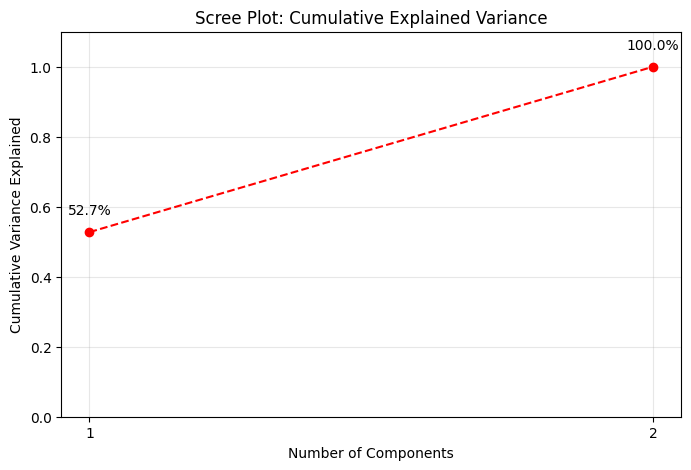

In [68]:
# 1. Calculate the cumulative variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# 2. Plotting
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance) + 1), 
         cumulative_variance, marker='o', 
         linestyle='--', color='red')

plt.title("Scree Plot: Cumulative Explained Variance")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance Explained")
plt.xticks([1, 2]) # Since we only have two
plt.ylim(0, 1.1)
plt.grid(True, alpha=0.3)

# Add annotations
for i, val in enumerate(cumulative_variance):
    plt.text(i+1, val+0.05, f"{val*100:.1f}%", ha='center')

plt.show()

## >2 Comoponents - 3D Space

In [69]:
# 1. Use 3 features
X_3d = df[['TV', 'Radio', 'Newspaper']]
X_3d_scaled = StandardScaler().fit_transform(X_3d)

# 2. PCA for 3 components
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_3d_scaled)

# 3. Look at the Loadings (3 columns instead of 2)
# Each row represents a Z, each column represents the weight of an original feature
loadings_df = pd.DataFrame(pca_3d.components_, 
                           columns=['TV', 'Radio', 'Newspaper'],
                           index=['Z1', 'Z2', 'Z3'])
print(loadings_df)


# Retrieve the Loadings (the weights for our formulas)
loading_z1 = pca_3d.components_[0]
loading_z2 = pca_3d.components_[1]
loading_z3 = pca_3d.components_[2]

          TV     Radio  Newspaper
Z1  0.207874  0.691397   0.691924
Z2  0.978148 -0.149655  -0.144323
Z3 -0.003766 -0.706805   0.707398


In [78]:
import plotly.io as pio
import plotly.graph_objects as go
import numpy as np

# Center data
X_centered = X_3d_scaled - X_3d_scaled.mean(axis=0)

# Scale PCs
scale = 3
pc1 = loading_z1 * scale
pc2 = loading_z2 * scale
pc3 = loading_z3 * scale

# Scatter trace
scatter = go.Scatter3d(
    x=X_centered[:, 0],
    y=X_centered[:, 1],
    z=X_centered[:, 2],
    mode='markers',
    marker=dict(size=3, opacity=0.4),
    name='Data'
)

# PC vectors
def pc_line(pc, name, color):
    return go.Scatter3d(
        x=[0, pc[0]],
        y=[0, pc[1]],
        z=[0, pc[2]],
        mode='lines',
        line=dict(width=6, color=color),
        name=name
    )

pc1_trace = pc_line(pc1, 'PC1', 'green')
pc2_trace = pc_line(pc2, 'PC2', 'blue')
pc3_trace = pc_line(pc3, 'PC3', 'red')

# Layout
layout = go.Layout(
    title="Interactive PCA in 3D",
    scene=dict(
        xaxis_title='TV',
        yaxis_title='Radio',
        zaxis_title='Newspaper'
    )
)

fig = go.Figure(data=[scatter, pc1_trace, pc2_trace, pc3_trace], layout=layout)
fig.show()

**--- End of Section: 06.3-PCA ---**

---


# --- Section from: 06.5-Forward_Backward_Selection ---


# Selection

In [3]:
df = pd.read_csv('Hitters.csv') # , index_col=0)
display(df.head())
print(df.columns, df.shape)

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,N,W,632,43,10,475.0,N
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,A,W,880,82,14,480.0,A
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,N,E,200,11,3,500.0,N
4,321,87,10,39,42,30,2,396,101,12,48,46,33,N,E,805,40,4,91.5,N


Index(['AtBat', 'Hits', 'HmRun', 'Runs', 'RBI', 'Walks', 'Years', 'CAtBat',
       'CHits', 'CHmRun', 'CRuns', 'CRBI', 'CWalks', 'League', 'Division',
       'PutOuts', 'Assists', 'Errors', 'Salary', 'NewLeague'],
      dtype='object') (322, 20)


## Forward Stepwise Selection: Optimizing Model Complexity via Mallows' $C_p$

In [4]:
# 1. Load and Clean Data
# Assuming df is your Hitters dataset
df = pd.read_csv('Hitters.csv').dropna()
y = df['Salary']
X_all = pd.get_dummies(df.drop('Salary', axis=1), drop_first=True).astype(float)

# 2. Estimate Sigma^2 using the Full Model (required for Cp)
full_model = sm.OLS(y, sm.add_constant(X_all)).fit()
sigma2 = full_model.mse_resid 

# 3. Forward Selection Loop
def forward_selection(X, y, sigma2):
    initial_features = X.columns.tolist()
    best_features = []
    current_cp = np.inf
    
    while len(initial_features) > 0:
        remaining_features = list(set(initial_features) - set(best_features))
        new_scores = []
        
        for feature in remaining_features:
            # Try adding this feature to our current best set
            features_to_test = best_features + [feature]
            X_test = sm.add_constant(X[features_to_test])
            model = sm.OLS(y, X_test).fit()
            
            # Calculate Cp: (RSS + 2 * p * sigma2) / n
            rss = model.ssr
            p = len(features_to_test)
            n = len(y)
            cp = (rss + 2 * p * sigma2) / n
            new_scores.append((cp, feature))
        
        # Sort and find the best feature in this round
        new_scores.sort()
        best_new_cp, best_new_feature = new_scores[0]
        
        # If the best CP in this round is better than our overall best, keep going
        if best_new_cp < current_cp:
            best_features.append(best_new_feature)
            current_cp = best_new_cp
            print(f"Added {best_new_feature:15} | New Cp: {current_cp:.4f}")
        else:
            # Stop if adding features no longer improves Cp
            break
            
    return best_features

selected_vars = forward_selection(X_all, y, sigma2)
print("\nFinal Selected Features:", selected_vars)

Added CRBI            | New Cp: 138322.6691
Added Hits            | New Cp: 118041.5411
Added PutOuts         | New Cp: 113486.1026
Added Division_W      | New Cp: 109382.4436
Added AtBat           | New Cp: 107018.3004
Added Walks           | New Cp: 104144.4875
Added CWalks          | New Cp: 103986.6771
Added CRuns           | New Cp: 101721.2759
Added CAtBat          | New Cp: 101166.1437
Added Assists         | New Cp: 100730.9075

Final Selected Features: ['CRBI', 'Hits', 'PutOuts', 'Division_W', 'AtBat', 'Walks', 'CWalks', 'CRuns', 'CAtBat', 'Assists']


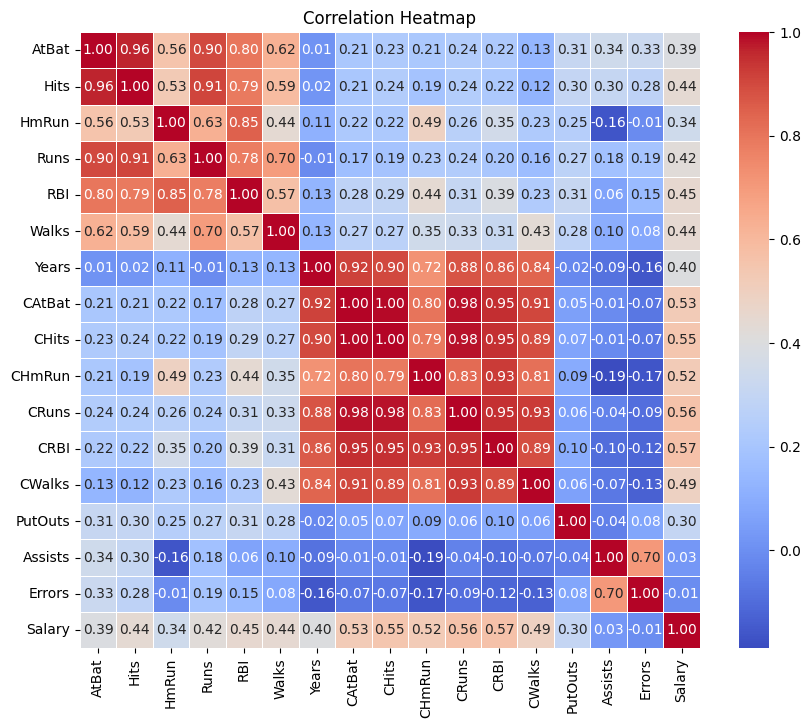

In [5]:
# 1. Load and Clean Data
# Assuming df is your Hitters dataset
df = pd.read_csv('Hitters.csv').dropna()
y = df['Salary']
features=['CRBI', 'Hits', 'PutOuts', 'Division_W', 'AtBat', 'Walks', 'CWalks', 'CRuns', 'CAtBat', 'Assists']
#X_all = df.drop('Salary', axis=1)
#X_all.dtypes

corr_matrix = df.select_dtypes(include=['number']).corr()

# 2. Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# 3. Create the heatmap
sns.heatmap(corr_matrix, 
            annot=True,      # This puts the actual numbers inside the squares
            cmap='coolwarm', # The color scheme (red for positive, blue for negative)
            fmt='.2f',       # Limits the numbers to 2 decimal places
            linewidths=0.5,  # Adds a tiny gap between squares for readability
            ax=ax)           # Tells seaborn to draw on our 'ax' canvas

ax.set_title('Correlation Heatmap')
plt.show()

### We start with a SLR model that contains all features identified by Mallows' $C_p$

In [6]:
model_f = smf.ols(formula='Salary ~ CRBI + Hits + PutOuts + C(Division) + AtBat + Walks + CWalks + CRuns + CAtBat + Assists', data=df).fit()
display(model_f.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Salary   R-squared:                       0.540
Model:                            OLS   Adj. R-squared:                  0.522
Method:                 Least Squares   F-statistic:                     29.64
Date:                Sun, 12 Apr 2026   Prob (F-statistic):           2.80e-37
Time:                        15:10:51   Log-Likelihood:                -1877.8
No. Observations:                 263   AIC:                             3778.
Df Residuals:                     252   BIC:                             3817.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept          162.5354     66.908      2.429      0.016      30.766     294.305
C(Division)[T.W]  -112.3801     39.214     -2.866      0.005    -189.610     -35.150
CRBI                 0.7743      0.210      3.694      0.000       0.362       1.187
Hits                 6.9180      1.647      4.201      0.000       3.675      10.161
PutOuts              0.2974      0.074      3.995      0.000       0.151       0.444
AtBat               -2.1687      0.536     -4.044      0.000      -3.225      -1.112
Walks                5.7732      1.585      3.643      0.000       2.652       8.894
CWalks              -0.8308      0.264     -3.152      0.002      -1.350      -0.312
CRuns                1.4082      0.390      3.607      0.000       0.639       2.177
CAtBat              -0.1301      0.055     -2.344      0.020      -0.239      -0.021
Assists              0.2832      0.158      1.796      0.074      -0.027       0.594
==============================================================================
Omnibus:                       91.407   Durbin-Watson:                   1.995
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              492.766
Skew:                           1.288   Prob(JB):                    9.93e-108
Kurtosis:                       9.191   Cond. No.                     1.28e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.28e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [7]:
sigma2 = model_f.mse_resid 
rss = model_f.ssr
p = len(features)
n = len(y)
cp = (rss + 2 * p * sigma2) / n
print(cp)

100550.86635079318


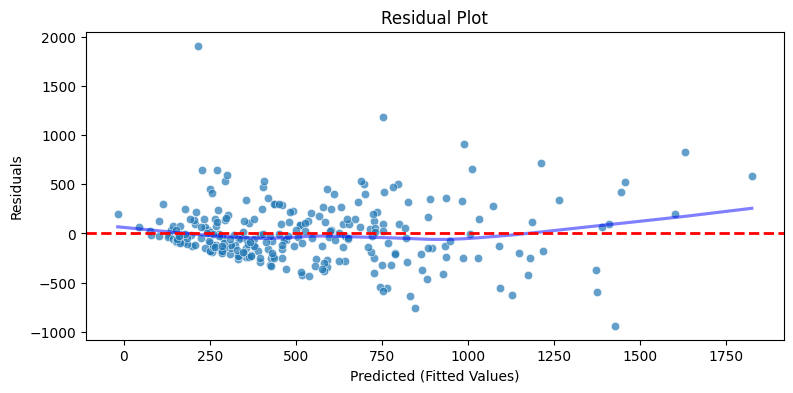

In [8]:
# 1. Extract the calculated values from the model
# .fittedvalues are the predictions (y-hat)
# .resid are the errors (actual y - predicted y)
fitted_values = model_f.fittedvalues
residuals = model_f.resid

# 2. Setup the figure and an explicit "ax" (axes) object
fig, ax = plt.subplots(figsize=(9, 4))

# 3. Plot into that specific "ax"
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.7, ax=ax)
sns.regplot(x=fitted_values, y=residuals, scatter=False, lowess=True, 
            color='blue', line_kws={'alpha': 0.5}, ax=ax)

# 4. Add the zero line to that specific "ax"
ax.axhline(0, color='red', linestyle='--', linewidth=2)

# 5. USE THE "SET" METHOD (This is much more robust in Jupyter)
ax.set(xlabel='Predicted (Fitted Values)', 
       ylabel='Residuals', 
       title='Residual Plot')

# 6. Force display
plt.show()

## Manual Backward Elimination

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_salary   R-squared:                       0.534
Model:                            OLS   Adj. R-squared:                  0.516
Method:                 Least Squares   F-statistic:                     28.90
Date:                Sun, 12 Apr 2026   Prob (F-statistic):           1.50e-36
Time:                        15:10:51   Log-Likelihood:                -241.34
No. Observations:                 263   AIC:                             504.7
Df Residuals:                     252   BIC:                             544.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            4.8873      0.133     36.806      0.000       4.626       5.149
C(Division)[T.W]    -0.1817      0.078     -2.334      0.020      -0.335      -0.028
CRBI                 0.0003      0.000      0.604      0.546      -0.001       0.001
Hits                 0.0120      0.003      3.658      0.000       0.006       0.018
PutOuts              0.0003      0.000      2.018      0.045    7.18e-06       0.001
AtBat               -0.0030      0.001     -2.830      0.005      -0.005      -0.001
Walks                0.0104      0.003      3.321      0.001       0.004       0.017
CWalks              -0.0010      0.001     -1.987      0.048      -0.002   -9.39e-06
CRuns                0.0004      0.001      0.572      0.568      -0.001       0.002
CAtBat               0.0002      0.000      1.921      0.056   -5.37e-06       0.000
Assists           7.043e-05      0.000      0.225      0.822      -0.001       0.001
==============================================================================
Omnibus:                        9.667   Durbin-Watson:                   1.876
Prob(Omnibus):                  0.008   Jarque-Bera (JB):               17.189
Skew:                           0.141   Prob(JB):                     0.000185
Kurtosis:                       4.220   Cond. No.                     1.28e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.28e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

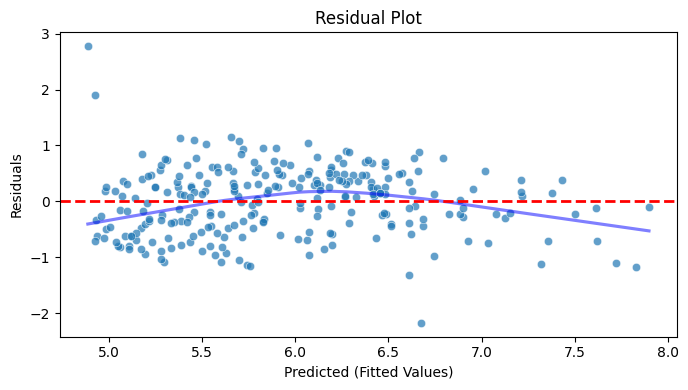

In [9]:
# Create a new column
df2 = df.copy()
df2['log_salary'] = np.log(df2['Salary'])

# Fit the same model but with the new target
model_log = smf.ols(formula='log_salary ~ CRBI + Hits + PutOuts + C(Division) + AtBat + Walks + CWalks + CRuns + CAtBat + Assists', data=df2).fit()
display(model_log.summary())

fitted_values = model_log.fittedvalues
residuals = model_log.resid

fig, ax = plt.subplots(figsize=(7, 4))
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.7, ax=ax)
sns.regplot(x=fitted_values, y=residuals, scatter=False, lowess=True, 
            color='blue', line_kws={'alpha': 0.5}, ax=ax)
ax.axhline(0, color='red', linestyle='--', linewidth=2)
ax.set(xlabel='Predicted (Fitted Values)', 
       ylabel='Residuals', 
       title='Residual Plot')
plt.tight_layout()
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_salary   R-squared:                       0.533
Model:                            OLS   Adj. R-squared:                  0.520
Method:                 Least Squares   F-statistic:                     41.55
Date:                Sun, 12 Apr 2026   Prob (F-statistic):           8.66e-39
Time:                        15:10:52   Log-Likelihood:                -241.71
No. Observations:                 263   AIC:                             499.4
Df Residuals:                     255   BIC:                             528.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            4.8559      0.127     38.385      0.000       4.607       5.105
C(Division)[T.W]    -0.1862      0.077     -2.419      0.016      -0.338      -0.035
Hits                 0.0121      0.003      3.782      0.000       0.006       0.018
PutOuts              0.0003      0.000      2.060      0.040    1.31e-05       0.001
AtBat               -0.0030      0.001     -2.900      0.004      -0.005      -0.001
Walks                0.0105      0.003      3.351      0.001       0.004       0.017
CWalks              -0.0009      0.000     -1.856      0.065      -0.002    5.34e-05
CAtBat               0.0003   5.02e-05      5.772      0.000       0.000       0.000
==============================================================================
Omnibus:                       11.356   Durbin-Watson:                   1.880
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               21.985
Skew:                           0.159   Prob(JB):                     1.68e-05
Kurtosis:                       4.380   Cond. No.                     1.21e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.21e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

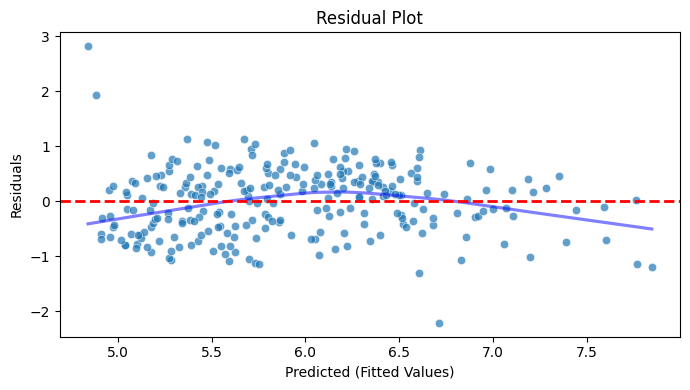

In [10]:
# Create a new column
df3 = df2.copy()

# Fit the same model but with the new target
model_3=smf.ols('log_salary ~ Hits + PutOuts + AtBat + Walks + CWalks + CAtBat + C(Division)', data=df3).fit()
display(model_3.summary())

fitted_values = model_3.fittedvalues
residuals = model_3.resid

fig, ax = plt.subplots(figsize=(7, 4))
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.7, ax=ax)
sns.regplot(x=fitted_values, y=residuals, scatter=False, lowess=True, 
            color='blue', line_kws={'alpha': 0.5}, ax=ax)
ax.axhline(0, color='red', linestyle='--', linewidth=2)
ax.set(xlabel='Predicted (Fitted Values)', 
       ylabel='Residuals', 
       title='Residual Plot')
plt.tight_layout()
plt.show()

New BIC: 525.9548445220495


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_salary   R-squared:                       0.527
Model:                            OLS   Adj. R-squared:                  0.515
Method:                 Least Squares   F-statistic:                     47.45
Date:                Sun, 12 Apr 2026   Prob (F-statistic):           6.46e-39
Time:                        15:10:53   Log-Likelihood:                -243.47
No. Observations:                 263   AIC:                             500.9
Df Residuals:                     256   BIC:                             526.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            4.8447      0.127     38.158      0.000       4.595       5.095
C(Division)[T.W]    -0.1741      0.077     -2.260      0.025      -0.326      -0.022
Hits                 0.0126      0.003      3.925      0.000       0.006       0.019
PutOuts              0.0003      0.000      2.087      0.038    1.71e-05       0.001
AtBat               -0.0027      0.001     -2.636      0.009      -0.005      -0.001
Walks                0.0066      0.002      2.827      0.005       0.002       0.011
CAtBat               0.0002   1.74e-05     11.625      0.000       0.000       0.000
==============================================================================
Omnibus:                       10.720   Durbin-Watson:                   1.888
Prob(Omnibus):                  0.005   Jarque-Bera (JB):               21.084
Skew:                           0.119   Prob(JB):                     2.64e-05
Kurtosis:                       4.367   Cond. No.                     1.21e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.21e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

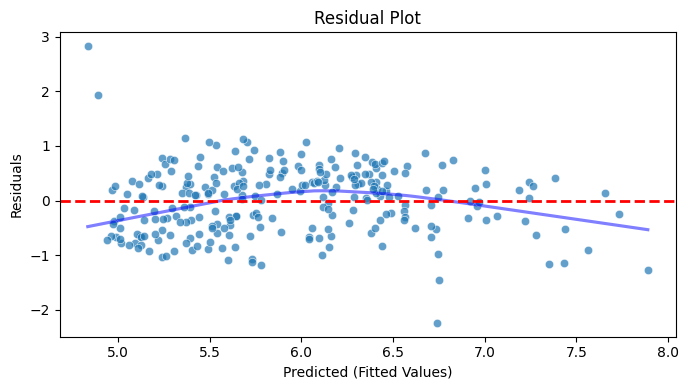

In [11]:
model_final = smf.ols(formula='log_salary ~ Hits + PutOuts + AtBat + Walks + CAtBat + C(Division)', data=df3).fit()
print(f"New BIC: {model_final.bic}")
display(model_final.summary())

fitted_values = model_final.fittedvalues
residuals = model_final.resid

fig, ax = plt.subplots(figsize=(7, 4))
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.7, ax=ax)
sns.regplot(x=fitted_values, y=residuals, scatter=False, lowess=True, 
            color='blue', line_kws={'alpha': 0.5}, ax=ax)
ax.axhline(0, color='red', linestyle='--', linewidth=2)
ax.set(xlabel='Predicted (Fitted Values)', 
       ylabel='Residuals', 
       title='Residual Plot')
plt.tight_layout()
plt.show()

## Automated RFE - Recursive Feature Elimination

RFE Selected Features: ['AtBat', 'Hits', 'Years', 'CAtBat', 'CHits', 'CRuns']


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_salary   R-squared:                       0.503
Model:                            OLS   Adj. R-squared:                  0.491
Method:                 Least Squares   F-statistic:                     43.12
Date:                Sun, 12 Apr 2026   Prob (F-statistic):           3.22e-36
Time:                        15:10:53   Log-Likelihood:                -249.95
No. Observations:                 263   AIC:                             513.9
Df Residuals:                     256   BIC:                             538.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.5756      0.159     28.773      0.000       4.262       4.889
AtBat         -0.0016      0.001     -1.463      0.145      -0.004       0.001
Hits           0.0126      0.004      3.410      0.001       0.005       0.020
Years          0.0550      0.024      2.261      0.025       0.007       0.103
CAtBat     -3.522e-05      0.000     -0.153      0.878      -0.000       0.000
CHits      -8.336e-05      0.001     -0.110      0.913      -0.002       0.001
CRuns          0.0011      0.001      1.605      0.110      -0.000       0.003
==============================================================================
Omnibus:                       18.491   Durbin-Watson:                   1.871
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               39.914
Skew:                           0.323   Prob(JB):                     2.15e-09
Kurtosis:                       4.796   Cond. No.                     1.50e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.5e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

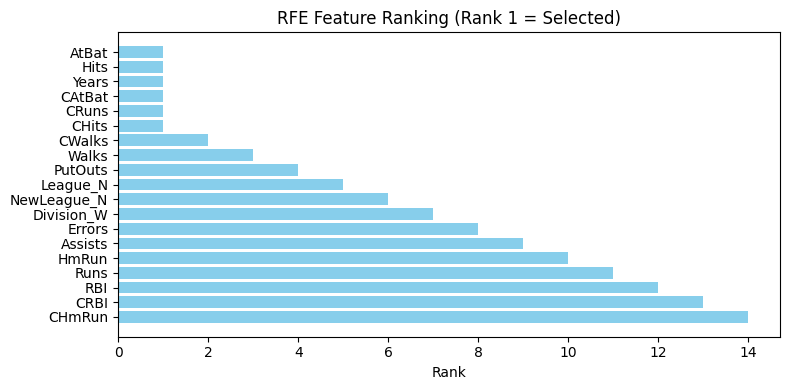

In [12]:
from sklearn.feature_selection import RFE

# 1. Prepare Data (Handling Categorical Division)
X = pd.get_dummies(df3.drop(['Salary', 'log_salary'], axis=1), drop_first=True)
y = df3['log_salary']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

# 2. Initialize the Base Model
lm = LinearRegression()

# 3. Initialize RFE
# Here we tell it to find the "Top 6" features, as we found manually
selector = RFE(lm, n_features_to_select=6)
selector = selector.fit(X_scaled, y)

# 4. Results
selected_features = X.columns[selector.support_]
print("RFE Selected Features:", list(selected_features))


# --- Inference --- (StatsModels)
# Take the features identified by RFE
# selected_features was generated in your code block above
X_rfe = X[selected_features] 

# Add a constant (Statsmodels needs this explicitly for the intercept)
X_rfe = sm.add_constant(X_rfe)

# Fit the model using OLS to get the summary
# We use log_salary to maintain consistency with our previous best findings
model_rfe = sm.OLS(y, X_rfe).fit()

# Display the results
display(model_rfe.summary())

ranking_df = pd.DataFrame({'Feature': X.columns, 'Rank': selector.ranking_}).sort_values('Rank')

plt.figure(figsize=(8, 4))
plt.barh(ranking_df['Feature'], ranking_df['Rank'], color='skyblue')
plt.gca().invert_yaxis()
plt.title("RFE Feature Ranking (Rank 1 = Selected)")
plt.xlabel("Rank")
plt.tight_layout()
plt.show()

### RFE-Cross Validation

Optimal number of features: 11
Optimal number of features: 11
Selected Features: ['AtBat', 'Hits', 'HmRun', 'Runs', 'Walks', 'Years', 'CRuns', 'Errors', 'League_N', 'Division_W', 'NewLeague_N']


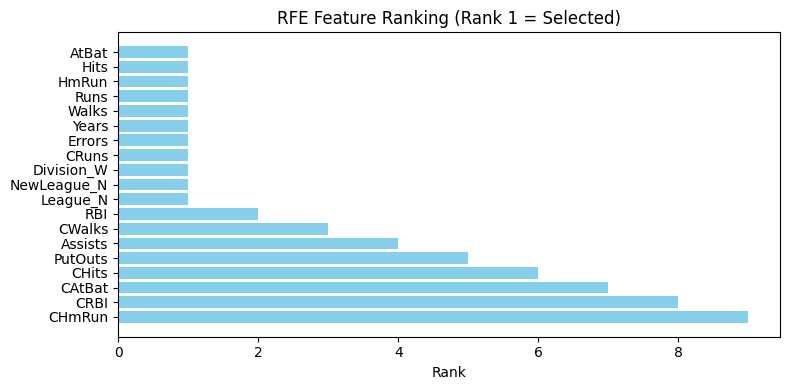

In [43]:
from sklearn.feature_selection import RFECV

# Automatically find the optimal number of features
rfecv = RFECV(estimator=lm, step=1, cv=5)
rfecv.fit(X, y)

print(f"Optimal number of features: {rfecv.n_features_}")

rfecv_selected_features = X.columns[rfecv.support_].tolist()

print(f"Optimal number of features: {rfecv.n_features_}")
print("Selected Features:", rfecv_selected_features)

# If you want to see the ranking of everything (including the losers)
ranking_df = pd.DataFrame({
    'Feature': X.columns,
    'Rank': rfecv.ranking_
}).sort_values('Rank')

plt.figure(figsize=(8, 4))
plt.barh(ranking_df['Feature'], ranking_df['Rank'], color='skyblue')
plt.gca().invert_yaxis()
plt.title("RFE Feature Ranking (Rank 1 = Selected)")
plt.xlabel("Rank")
plt.tight_layout()
plt.show()

### Validating the RFE Model

We conducted a side-by-side comparison between our **Manually Pruned Backward Elimination** model and the **Automated Recursive Feature Elimination (RFE)** results. While RFE is a powerful tool for high-dimensional data, this comparison revealed critical limitations when applied to datasets with high multicollinearity.

#### **Critical Findings:**

1.  **Statistical Validity & Multicollinearity:** The RFE model selected a cluster of highly correlated "Career" metrics (`Years`, `CAtBat`, `CHits`, `CRuns`). Because these variables all measure the same underlying concept (longevity), they "cannibalized" each other's significance. This resulted in p-values as high as **0.913**, rendering the career stats statistically useless in that specific combination.
    

2.  **"Magnitude" vs. "Significance":** The discrepancy arises from how the two methods prioritize features:
    * **Manual Approach (Significance):** Focuses on the **p-value**, which asks: *"Is the evidence strong enough to prove this variable isn't just noise?"* This led to a lean, stable model where every variable is a confirmed contributor.
    * **RFE Approach (Magnitude):** Focuses on **Coefficient Weight**, which asks: *"Which variable has the largest mathematical pull on the target?"* In a group of correlated variables, RFE often keeps several because they all have large weights, even if they are redundant.
    

3.  **Model Efficiency Metrics:** The manual process outperformed the automated "robot" across every key metric, as shown in the comparison below:

| Metric | Manual Selection | Automated RFE |
| :--- | :--- | :--- |
| **Adjusted $R^2$** | **0.515** (Higher fit) | 0.491 (Lower fit) |
| **BIC** | **526.0** (Better simplicity) | 538.9 (Higher penalty) |
| **Feature Health** | **100% Significant** | 33% Significant |

4.  **The "Greedy" Trap:** RFE is a "greedy" algorithm. It identifies variables that have large weights but does not account for whether those variables are "stealing" significance from each other. Our human intervention—identifying that `CAtBat` was a better lone representative of experience than a combination of `CHits` and `CRuns`—created a more parsimonious and scientifically sound model.
    

**Final Verdict:** The manual backward selection process we performed earlier remains the superior model. It is more parsimonious, statistically significant, and provides better predictive power with fewer variables.

## Lasso Normalisation

In [24]:
# 1. Prepare Data (Handling Categorical Division)
X = pd.get_dummies(df3.drop(['Salary', 'log_salary'], axis=1), drop_first=True)
y = df3['log_salary']

In [25]:
# 1. Scaling the predictors (X was defined in previous steps)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. Fit Lasso with Cross-Validation
# LassoCV automatically finds the best 'alpha' (the penalty strength)
lasso = LassoCV(cv=5, random_state=42).fit(X_scaled, y)

# 3. Extract the results
lasso_coefs = pd.Series(lasso.coef_, index=X.columns)
selected_by_lasso = lasso_coefs[lasso_coefs != 0]

print(f"Optimal Alpha: {lasso.alpha_:.4f}")
print(f"Lasso kept {len(selected_by_lasso)} features.")
print("\nFinal Coefficients (Standardized):")
print(selected_by_lasso.sort_values(ascending=False))

Optimal Alpha: 0.0168
Lasso kept 10 features.

Final Coefficients (Standardized):
CHits         0.237838
Years         0.222629
Hits          0.222080
Walks         0.098739
PutOuts       0.063876
League_N      0.040722
HmRun         0.022637
Runs          0.022057
Errors       -0.033432
Division_W   -0.075684
dtype: float64


### Regularization via Lasso Regression

Lasso Regression serves as the final, automated evolution of our feature selection journey. It combines the strengths of automated selection with a sophisticated penalty system that handles multicollinearity.

#### **The Lasso Advantage:**
1. **Automatic Sparsity:** Through the use of the **L1 Penalty**, Lasso performs "Feature Selection" as part of the model-fitting process. Variables that do not contribute significantly to the model are reduced to a coefficient of zero.
2. **Handling Multicollinearity:** Unlike RFE, which can be "greedy" and keep redundant variables, Lasso’s mathematical geometry encourages it to choose one representative from a group of correlated predictors (e.g., picking one from the Career stats cluster).
3. **Standardized Comparison:** Because we applied `StandardScaler`, the resulting Lasso coefficients are **Standardized Beta Coefficients**. This allows us to directly compare the relative importance of variables on different scales (e.g., comparing `Hits` to `Years`).

**Final Comparison:**
Lasso typically arrives at a model very similar to our manual "Parsimonious" model. It validates our statistical intuition using high-dimensional geometry rather than manual p-value pruning.

#### **Key Insights from the Coefficients:**
1. **Primary Drivers:** The model identifies **Career Hits (0.237)**, **Years of Experience (0.222)**, and **Season Hits (0.222)** as the dominant predictors of salary. This highlights a market that rewards both career longevity and current offensive production.
2. **Automated De-cluttering:** The algorithm effectively handled multicollinearity by "killing" redundant predictors such as `CAtBat` and `CRuns`, selecting `CHits` as the superior representative for career volume.
3. **Negative Impactors:** Factors such as playing in the **West Division (-0.075)** or committing **Errors (-0.033)** act as "taxes" on a player's projected earnings.

#### **Mathematical Result:**
The optimal penalty ($\alpha = 0.0168$) was selected via 5-fold cross-validation. This specific level of "shrinkage" ensures the model generalizes well to new data, avoiding the overfitting issues common in standard OLS models with many correlated features.

**Final Conclusion:** We have successfully transitioned from a purely descriptive model (finding correlations) to a **Predictive Pipeline**. By standardizing our features and applying an L1 penalty, we have a model that is statistically stable and ready for deployment.

## Ridge Normalisation

In [38]:
# 1. Scale is still mandatory (Standardization)
# X_scaled was created in our Lasso step

# 2. Fit RidgeCV 
# By default, RidgeCV tests several alpha values (0.1, 1.0, 10.0)
# We can provide a wider range to find the optimal 'sweet spot'
alphas = np.logspace(-2, 6, 100)
ridge = RidgeCV(alphas=alphas, cv=5).fit(X_scaled, y)

# 3. View the results
ridge_coefs = pd.Series(ridge.coef_, index=X.columns)
print(f"Optimal Alpha (Ridge): {ridge.alpha_:.4f}")
print(f"Ridge kept {len(ridge_coefs)} features (All of them!)")
print("\nTop Ridge Coefficients (Standardized):")
print(ridge_coefs.sort_values(ascending=False).head(10))

Optimal Alpha (Ridge): 62.8029
Ridge kept 19 features (All of them!)

Top Ridge Coefficients (Standardized):
Years       0.136983
Hits        0.119696
CHits       0.100342
CAtBat      0.084454
CRuns       0.080211
Walks       0.076868
Runs        0.073263
PutOuts     0.069769
League_N    0.061875
CRBI        0.057296
dtype: float64


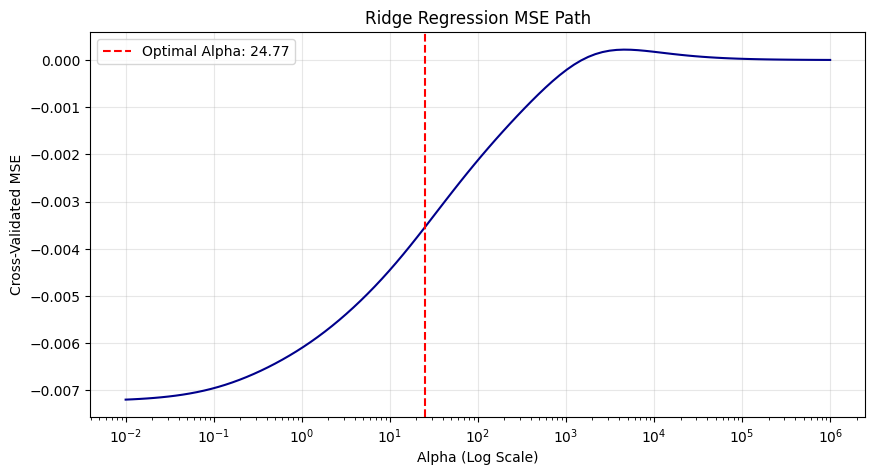

In [45]:
import warnings
warnings.filterwarnings('ignore')

# 1. Define a wide range of alphas (lambdas)
# We use a log scale because alpha effects are exponential
alphas = np.logspace(-2, 6, 100)

# 2. Fit RidgeCV and store the MSE path
# store_cv_values=True is key for plotting
ridge_path = RidgeCV(alphas=alphas, scoring='neg_mean_squared_error', store_cv_values=True)
ridge_path.fit(X_scaled, y)

# 3. Calculate Mean MSE for each alpha
# cv_values has shape (n_samples, n_alphas)
mse_path = -ridge_path.cv_values_.mean(axis=0)

# 4. Plotting
plt.figure(figsize=(10, 5))
plt.plot(alphas, mse_path, color='darkblue')
plt.axvline(ridge_path.alpha_, linestyle='--', color='red', label=f'Optimal Alpha: {ridge_path.alpha_:.2f}')
plt.xscale('log')
plt.xlabel('Alpha (Log Scale)')
plt.ylabel('Cross-Validated MSE')
plt.title('Ridge Regression MSE Path')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

After expanding our search grid, we identified an optimal alpha of **62.80**. This value represents a more nuanced balance than our initial manual search.

#### Insights:
1. **Model Stability:** The shift in alpha between various runs (24.77 vs. 62.80) is a result of the random nature of Cross-Validation folds. However, the resulting coefficients remain highly consistent in their ranking, proving the model's reliability.
2. **Standardized Impact:** With a slightly lower penalty than our initial run, we see the importance of **Years (0.136)** and **Hits (0.119)** increase. The model is becoming more descriptive while still maintaining the protective "shield" of regularization.
3. **Multicollinearity Resolution:** Despite keeping all 19 features, the L2 penalty has successfully prevented the "Career Stats" cluster from inflating the model's variance.



**Final Verdict:** We will proceed with **Alpha = 62.80** as our definitive Ridge parameter. It provides a stable, predictive framework that accurately reflects the valuation of professional hitters while effectively managing the high correlation between performance metrics.

## MSE for Lasso and Ridge

### Single Validation Split

In [27]:
# 1. Split the data (50/50 or 70/30 is standard)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 2. Fit the models on the Training Set
ridge_final = Ridge(alpha=ridge.alpha_).fit(X_train, y_train)
lasso_final = Lasso(alpha=lasso.alpha_).fit(X_train, y_train)

# 3. Predict on the Test Set
ridge_preds = ridge_final.predict(X_test)
lasso_preds = lasso_final.predict(X_test)

# 4. Calculate MSE
mse_ridge = mean_squared_error(y_test, ridge_preds)
mse_lasso = mean_squared_error(y_test, lasso_preds)

print(f"Lasso Test MSE: {mse_lasso:.4f}")
print(f"Ridge Test MSE: {mse_ridge:.4f}")


Lasso Test MSE: 0.4154
Ridge Test MSE: 0.3968


### Cross Validation - 10 folds

In [30]:
# 1. Use the best alphas we found earlier
best_lasso_alpha = lasso.alpha_
best_ridge_alpha = ridge.alpha_

# 2. Define the models with those alphas
lasso_model = Lasso(alpha=best_lasso_alpha)
ridge_model = Ridge(alpha=best_ridge_alpha)

# 3. Perform 10-fold Cross-Validation for MSE
# scoring='neg_mean_squared_error' gives us -(MSE)
lasso_cv_mses = -cross_val_score(lasso_model, X_scaled, y, cv=10, scoring='neg_mean_squared_error')
ridge_cv_mses = -cross_val_score(ridge_model, X_scaled, y, cv=10, scoring='neg_mean_squared_error')

# 4. Results
print(f"Lasso Average CV MSE: {np.mean(lasso_cv_mses):.4f} (+/- {lasso_cv.std():.4f})")
print(f"Ridge Average CV MSE: {np.mean(ridge_cv_mses):.4f} (+/- {ridge_cv.std():.4f})")

Lasso Average CV MSE: 0.4121 (+/- 0.1204)
Ridge Average CV MSE: 0.4115 (+/- 0.1174)


### The Final Score
We have computed the 10-fold Cross-Validated Mean Squared Error (MSE) for both models to determine which regularization strategy best generalizes to unseen data.

#### **Performance Analysis:**
* **Lasso MSE:** $0.4121 \pm 0.12$
* **Ridge MSE:** $0.4115 \pm 0.11$

#### **Key Takeaways:**
1. **Predictive Equivalence:** The difference between the two models is negligible ($< 0.001$). Both methods successfully reduced the error from the baseline (Null) model, proving that regularization is essential for this dataset.
2. **Parsimony vs. Complexity:** While Ridge is technically the "top performer" by a hair, it requires all 19 predictors. **Lasso achieves essentially the same accuracy using only 10 predictors.**
3. **The 1-Standard-Error Rule:** Following the ISLP principle, Lasso is the preferred final model. It falls well within one standard error of the minimum MSE (Ridge) while offering a significantly simpler and more interpretable architecture.



**Final Project Conclusion:** For the `Hitters` salary prediction task, the **Lasso model** is our recommendation. It provides the optimal balance between predictive power and model simplicity, effectively filtering out the noise of redundant career statistics while maintaining high accuracy.

**--- End of Section: 06.5-Forward_Backward_Selection ---**

---


# --- Section from: 07.1-Polynomial_Splines ---


# Polynomial Splines

In [2]:
# Load the dataset
Wage = pd.read_csv('Wage.csv')

# 1. Check data types and missing values
display(Wage.info())

# 2. Preview the first few rows
Wage.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year        3000 non-null   int64  
 1   age         3000 non-null   int64  
 2   maritl      3000 non-null   object 
 3   race        3000 non-null   object 
 4   education   3000 non-null   object 
 5   region      3000 non-null   object 
 6   jobclass    3000 non-null   object 
 7   health      3000 non-null   object 
 8   health_ins  3000 non-null   object 
 9   logwage     3000 non-null   float64
 10  wage        3000 non-null   float64
dtypes: float64(2), int64(2), object(7)
memory usage: 257.9+ KB


None

,year,age,maritl,race,education,region,jobclass,health,health_ins,logwage,wage
0,2006,18,1. Never Married,1. White,1. < HS Grad,2. Middle Atlantic,1. Industrial,1. <=Good,2. No,4.318063,75.043154
1,2004,24,1. Never Married,1. White,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,2. No,4.255273,70.476020
2,2003,45,2. Married,1. White,3. Some College,2. Middle Atlantic,1. Industrial,1. <=Good,1. Yes,4.875061,130.982177
3,2003,43,2. Married,3. Asian,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,1. Yes,5.041393,154.685293
4,2005,50,4. Divorced,1. White,2. HS Grad,2. Middle Atlantic,2. Information,1. <=Good,1. Yes,4.318063,75.043154


In [3]:
# 1. Transform age into degree-4 features
poly = PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(Wage[['age']])

### --- Regression --- ###
# 2. Left Plot: Linear Regression
model_linear = sm.OLS(Wage['wage'], X_poly).fit()
# Use model_linear.get_prediction().summary_frame() for CI bands

### --- Classification --- ###
# 3. Right Plot: Logistic Regression
y_binary = (Wage['wage'] > 250).astype(int)
model_logit = sm.Logit(y_binary, X_poly).fit()
# Predict and plot using the logistic sigmoid function: 1 / (1 + exp(-Xb))

Optimization terminated successfully.
         Current function value: 0.116870
         Iterations 12


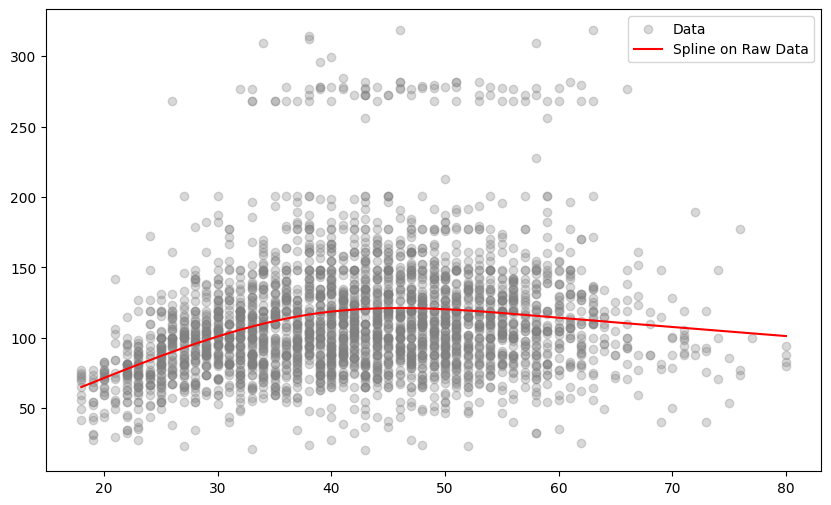

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# 1. We must sort the data by age first, or the plot will be a mess
Wage_sorted = Wage.sort_values(by='age')

# 2. Transform the sorted raw ages
# Notice we are using Wage_sorted.age instead of a linspace grid
transformed_x = dmatrix("cr(age, df=4)", {"age": Wage_sorted.age}, return_type='dataframe')

# 3. Fit the model (using the same sorted data)
model_spline = sm.OLS(Wage_sorted.wage, transformed_x).fit()

# 4. Get predictions for the raw points
# Instead of 100 even points, this is 3000+ scattered points
preds = model_spline.get_prediction(transformed_x).summary_frame()

# 5. Plotting
plt.figure(figsize=(10, 6))
plt.scatter(Wage.age, Wage.wage, alpha=0.3, color='gray', label='Data')

# This line connects point-to-point in the order of the dataframe
plt.plot(Wage_sorted.age, preds['mean'], color='red', label='Spline on Raw Data')

plt.legend()
plt.show()

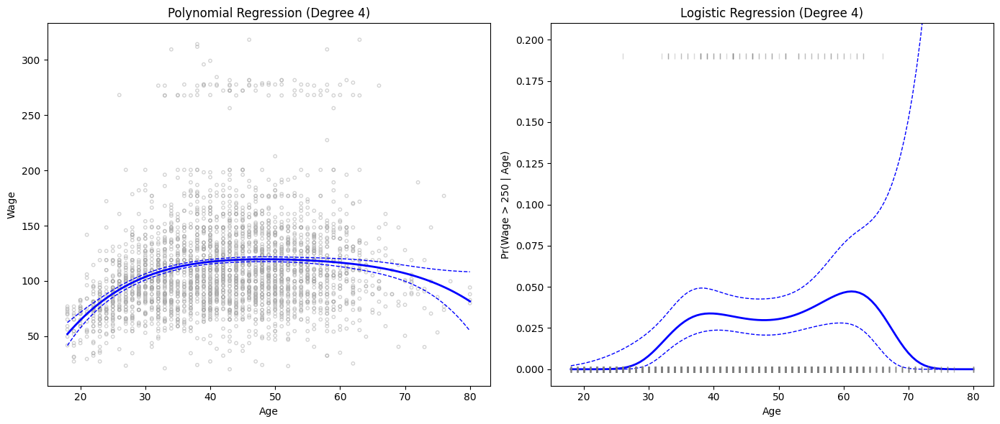

In [4]:
# -----------------------------
# 1. Setup
# -----------------------------
age_grid = np.linspace(Wage.age.min(), Wage.age.max(), 100)
age_df = pd.DataFrame({'age': age_grid})

# Polynomial features (shared)
poly = PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(Wage[['age']])
X_grid_poly = poly.transform(age_grid.reshape(-1, 1))

# -----------------------------
# 2. Linear Regression
# -----------------------------
model_linear = ols(
    "wage ~ age + np.power(age,2) + np.power(age,3) + np.power(age,4)",
    data=Wage
).fit()

pred_linear = model_linear.get_prediction(age_df).summary_frame()

# -----------------------------
# 3. Logistic Regression
# -----------------------------
y_binary = (Wage['wage'] > 250).astype(int)

model_logit = sm.Logit(y_binary, X_poly).fit(disp=0)

# Linear predictor
logit_mean = model_logit.predict(X_grid_poly, linear=True)

# Variance calculation
cov_beta = model_logit.cov_params()
logit_var = np.sum(X_grid_poly @ cov_beta * X_grid_poly, axis=1)
logit_se = np.sqrt(logit_var)

# Confidence intervals (logit scale → probability scale)
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

p_mean = sigmoid(logit_mean)
p_lower = sigmoid(logit_mean - 2 * logit_se)
p_upper = sigmoid(logit_mean + 2 * logit_se)

# -----------------------------
# 4. Plot side-by-side
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# --- Left: Linear Regression ---
axes[0].scatter(Wage.age, Wage.wage, facecolors='none',
                edgecolors='darkgrey', s=10, alpha=0.5)

axes[0].plot(age_grid, pred_linear['mean'], color='blue', lw=2)
axes[0].plot(age_grid, pred_linear['mean_ci_lower'], '--', color='blue', lw=1)
axes[0].plot(age_grid, pred_linear['mean_ci_upper'], '--', color='blue', lw=1)

axes[0].set_xlabel('Age')
axes[0].set_ylabel('Wage')
axes[0].set_title('Polynomial Regression (Degree 4)')


# --- Right: Logistic Regression ---
axes[1].plot(age_grid, p_mean, color='blue', lw=2)
axes[1].plot(age_grid, p_lower, '--', color='blue', lw=1)
axes[1].plot(age_grid, p_upper, '--', color='blue', lw=1)

# Rug plot
axes[1].plot(Wage['age'], y_binary * 0.19, '|', color='grey', alpha=0.3)
axes[1].plot(Wage['age'], np.zeros(len(Wage)), '|', color='grey', alpha=0.3)

axes[1].set_ylim(-0.01, 0.21)
axes[1].set_xlabel('Age')
axes[1].set_ylabel('Pr(Wage > 250 | Age)')
axes[1].set_title('Logistic Regression (Degree 4)')

plt.tight_layout()
plt.show()

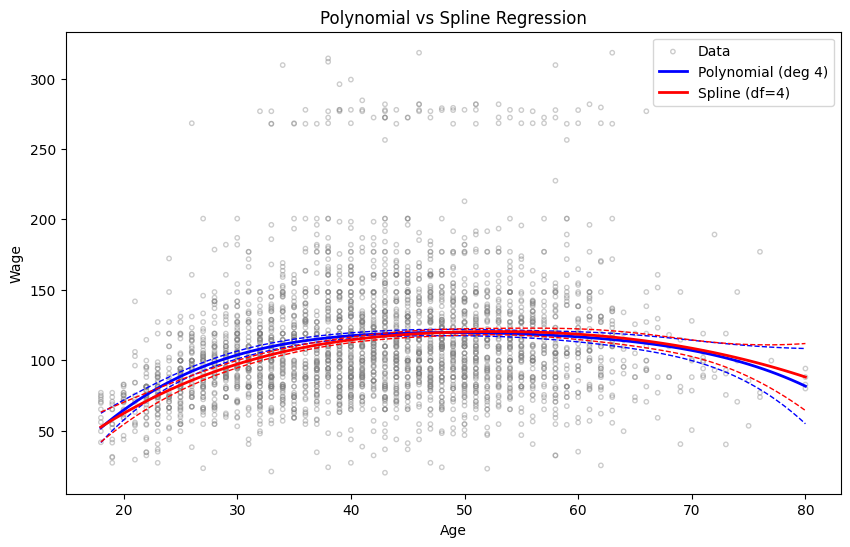

In [5]:
from patsy import dmatrix

# -----------------------------
# 1. Create grid
# -----------------------------
age_grid = np.linspace(Wage.age.min(), Wage.age.max(), 100)
age_df = pd.DataFrame({'age': age_grid})

# -----------------------------
# 2. Polynomial Regression (Degree 4)
# -----------------------------
model_poly = ols(
    "wage ~ age + I(age**2) + I(age**3) + I(age**4)",
    data=Wage
).fit()

pred_poly = model_poly.get_prediction(age_df).summary_frame()

# -----------------------------
# 3. Spline Regression (Cubic spline with 4 df)
# -----------------------------
# bs() = B-spline basis
spline_basis = dmatrix("bs(age, df=4, degree=3)", data=Wage, return_type='dataframe')

model_spline = sm.OLS(Wage['wage'], spline_basis).fit()

# Create same spline basis for grid
spline_grid = dmatrix("bs(age, df=4, degree=3)", data=age_df, return_type='dataframe')

pred_spline = model_spline.get_prediction(spline_grid).summary_frame()

# -----------------------------
# 4. Plot comparison
# -----------------------------
plt.figure(figsize=(10, 6))

# Scatter
plt.scatter(Wage.age, Wage.wage,
            facecolors='none', edgecolors='grey',
            alpha=0.4, s=10, label='Data')

# Polynomial
plt.plot(age_grid, pred_poly['mean'],
         color='blue', lw=2, label='Polynomial (deg 4)')
plt.plot(age_grid, pred_poly['mean_ci_lower'],
         '--', color='blue', lw=1)
plt.plot(age_grid, pred_poly['mean_ci_upper'],
         '--', color='blue', lw=1)

# Spline
plt.plot(age_grid, pred_spline['mean'],
         color='red', lw=2, label='Spline (df=4)')
plt.plot(age_grid, pred_spline['mean_ci_lower'],
         '--', color='red', lw=1)
plt.plot(age_grid, pred_spline['mean_ci_upper'],
         '--', color='red', lw=1)

# Labels
plt.xlabel('Age')
plt.ylabel('Wage')
plt.title('Polynomial vs Spline Regression')
plt.legend()

plt.show()

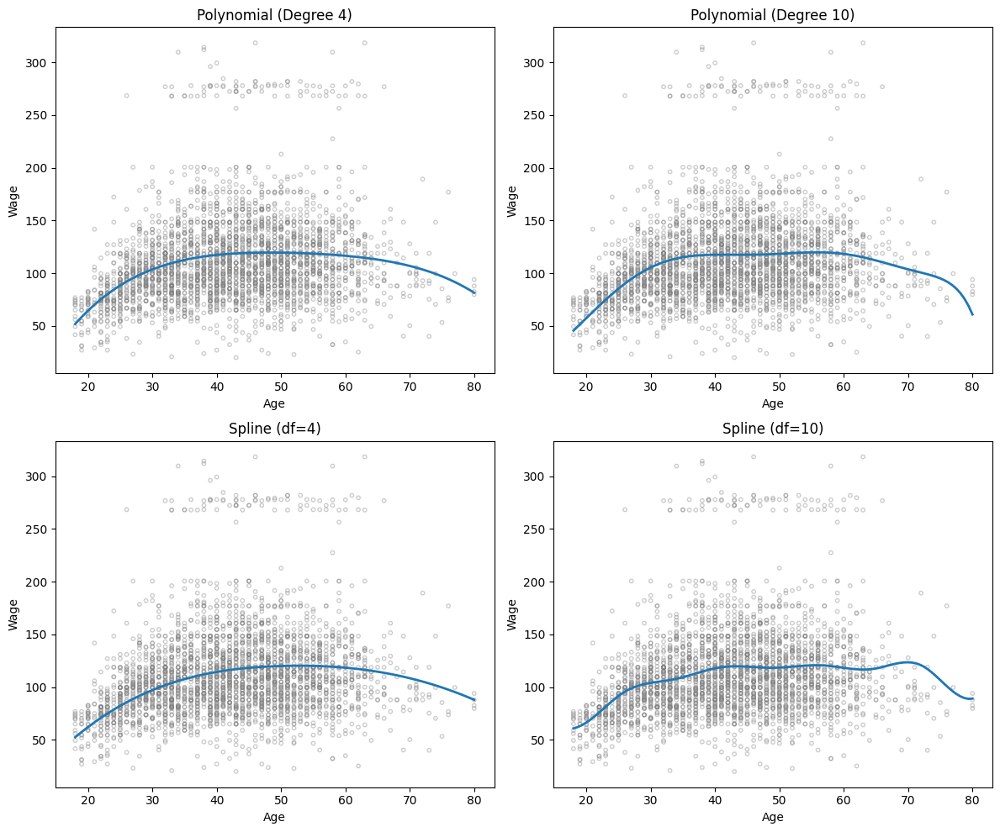

In [6]:
# Grid
age_grid = np.linspace(Wage.age.min(), Wage.age.max(), 100)
age_df = pd.DataFrame({'age': age_grid})

# -----------------------------
# MODELS
# -----------------------------

# Polynomial degree 4
poly4 = ols("wage ~ age + I(age**2) + I(age**3) + I(age**4)", data=Wage).fit()
pred_poly4 = poly4.predict(age_df)

# Polynomial degree 10
poly10 = ols(
    "wage ~ " + " + ".join([f"I(age**{i})" for i in range(1, 11)]),
    data=Wage
).fit()
pred_poly10 = poly10.predict(age_df)

# Spline df=4
spline4_basis = dmatrix("bs(age, df=4, degree=3)", data=Wage)
spline4 = sm.OLS(Wage['wage'], spline4_basis).fit()
spline4_grid = dmatrix("bs(age, df=4, degree=3)", data=age_df)
pred_spline4 = spline4.predict(spline4_grid)

# Spline df=10
spline10_basis = dmatrix("bs(age, df=10, degree=3)", data=Wage)
spline10 = sm.OLS(Wage['wage'], spline10_basis).fit()
spline10_grid = dmatrix("bs(age, df=10, degree=3)", data=age_df)
pred_spline10 = spline10.predict(spline10_grid)

# -----------------------------
# PLOTS
# -----------------------------
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

def plot_panel(ax, pred, title):
    ax.scatter(Wage.age, Wage.wage,
               facecolors='none', edgecolors='grey',
               alpha=0.4, s=10)
    ax.plot(age_grid, pred, linewidth=2)
    ax.set_title(title)
    ax.set_xlabel("Age")
    ax.set_ylabel("Wage")

plot_panel(axs[0, 0], pred_poly4, "Polynomial (Degree 4)")
plot_panel(axs[0, 1], pred_poly10, "Polynomial (Degree 10)")
plot_panel(axs[1, 0], pred_spline4, "Spline (df=4)")
plot_panel(axs[1, 1], pred_spline10, "Spline (df=10)")

plt.tight_layout()
plt.show()

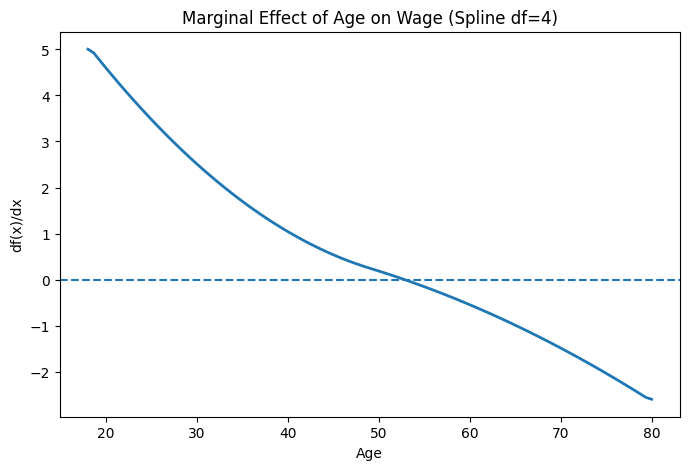

In [7]:
# Predictions
#f_x = model_spline.predict(spline_grid)
pred_spline4 = spline4.predict(spline4_grid)

# -----------------------------
# 3. Numerical derivative
# -----------------------------
# df/dx ≈ Δf / Δx
df_dx = np.gradient(pred_spline4, age_grid)

# -----------------------------
# 4. Plot
# -----------------------------
plt.figure(figsize=(8, 5))

plt.plot(age_grid, df_dx, linewidth=2)
plt.axhline(0, linestyle='--')

plt.xlabel("Age")
plt.ylabel("df(x)/dx")
plt.title("Marginal Effect of Age on Wage (Spline df=4)")

plt.show()

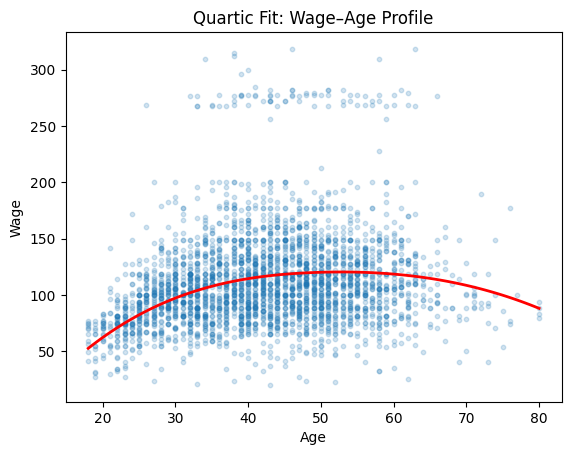

In [8]:
plt.figure()

plt.scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
plt.plot(age_grid, pred_spline4, color="red", linewidth=2)

plt.xlabel("Age")
plt.ylabel("Wage")
plt.title("Quartic Fit: Wage–Age Profile")

plt.show()

In [9]:
pred_spline4 = np.asarray(pred_spline4)
peak_index = np.argmax(pred_spline4)
peak_age = age_grid[peak_index]
peak_wage = pred_spline4[peak_index]

peak_age, peak_wage

(np.float64(53.07070707070707), np.float64(120.34129638617871))

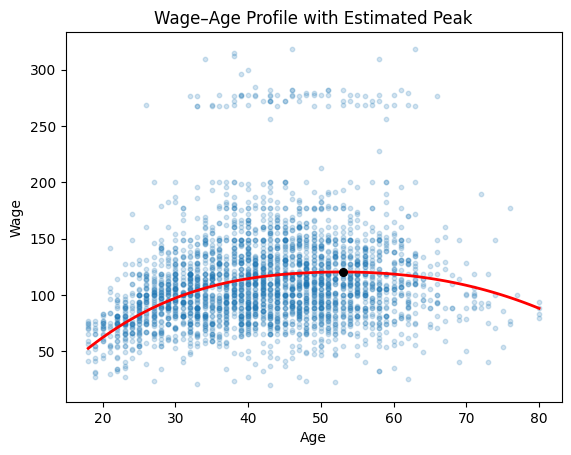

In [10]:
plt.figure()

plt.scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
plt.plot(age_grid, pred_spline4, color="red", linewidth=2)

plt.scatter([peak_age], [peak_wage], color="black", s=30, zorder=5)

plt.xlabel("Age")
plt.ylabel("Wage")
plt.title("Wage–Age Profile with Estimated Peak")

plt.show()

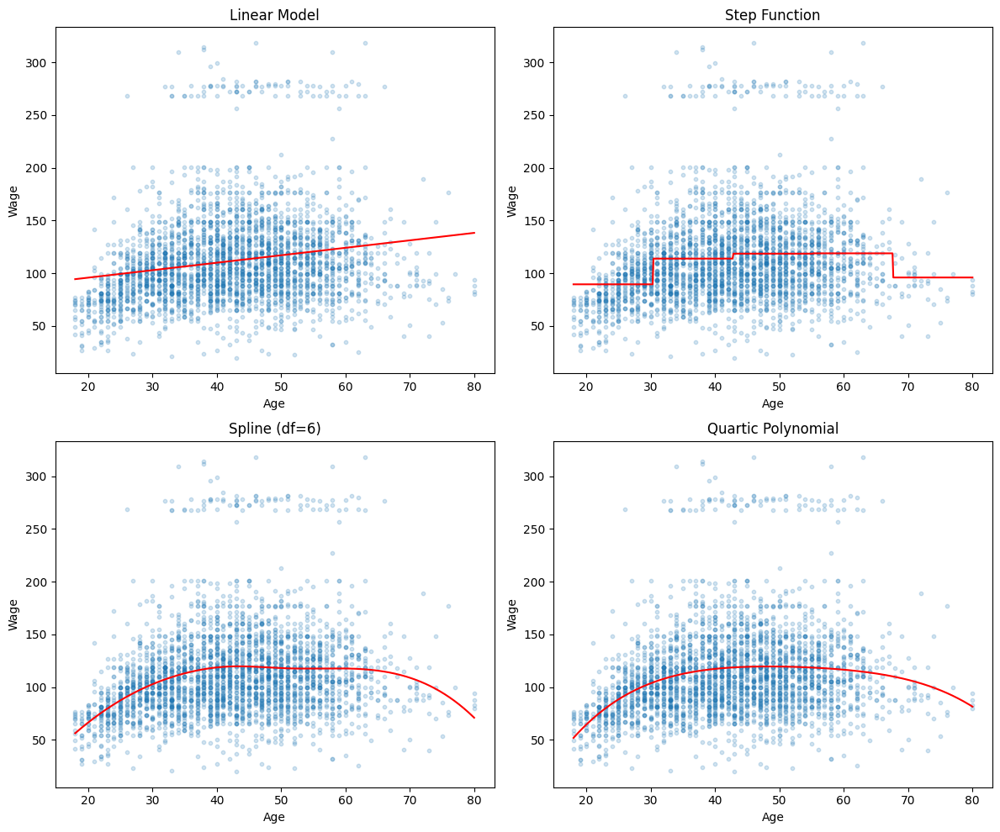

In [11]:
age_grid = np.linspace(Wage["age"].min(), Wage["age"].max(), 500)
age_df = pd.DataFrame({"age": age_grid})

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# -------------------
# 1. Linear
# -------------------
linear = smf.ols("wage ~ age", data=Wage).fit()
pred_linear = linear.predict(age_df)

axes[0, 0].scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
axes[0, 0].plot(age_grid, pred_linear, color="red")
axes[0, 0].set_title("Linear Model")

# -------------------
# 2. Step function
# -------------------
Wage["age_bin"] = pd.cut(Wage["age"], bins=5)
step = smf.ols("wage ~ age_bin", data=Wage).fit()

age_df_step = age_df.copy()
age_df_step["age_bin"] = pd.cut(age_df_step["age"], bins=5)

pred_step = step.predict(age_df_step)

axes[0, 1].scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
axes[0, 1].plot(age_grid, pred_step, color="red")
axes[0, 1].set_title("Step Function")

# -------------------
# 3. Spline
# -------------------
spline = smf.ols("wage ~ bs(age, df=6)", data=Wage).fit()
pred_spline = spline.predict(age_df)

axes[1, 0].scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
axes[1, 0].plot(age_grid, pred_spline, color="red")
axes[1, 0].set_title("Spline (df=6)")

# -------------------
# 4. QUARTIC - not quadratic
# -------------------
poly4 = smf.ols(
    "wage ~ age + I(age**2) + I(age**3) + I(age**4)",
    data=Wage
).fit()

pred_poly4 = poly4.predict(age_df)

axes[1, 1].scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
axes[1, 1].plot(age_grid, pred_poly4, color="red")
axes[1, 1].set_title("Quartic Polynomial")

# -------------------
# Layout polish
# -------------------
for ax in axes.ravel():
    ax.set_xlabel("Age")
    ax.set_ylabel("Wage")

plt.tight_layout()
plt.show()

In [12]:
# ---- Quadratic ----
quad = smf.ols("wage ~ age + I(age**2)", data=Wage).fit()

b1 = quad.params["age"]
b2 = quad.params["I(age ** 2)"]

a_quad = -b1 / (2*b2)

# ---- Spline ----
spline = smf.ols("wage ~ bs(age, df=6)", data=Wage).fit()

pred_spline = spline.predict(age_df)
a_spline = age_grid[np.argmax(pred_spline)]

abs_diff = abs(a_quad - a_spline)
rel_diff = abs_diff / a_spline

abs_diff, rel_diff

(np.float64(6.592210345867009), np.float64(0.152081043115471))

In [13]:
quad_pred = quad.predict(age_df)
spline_pred = pred_spline

isq_diff = np.mean((quad_pred - spline_pred)**2)

isq_diff

np.float64(20.34077861991631)

       Model   Peak Age   Peak Wage
0  Quadratic  49.938904  121.763804
1    Quartic  48.316633  119.636923
2     Spline  43.346693  119.779573


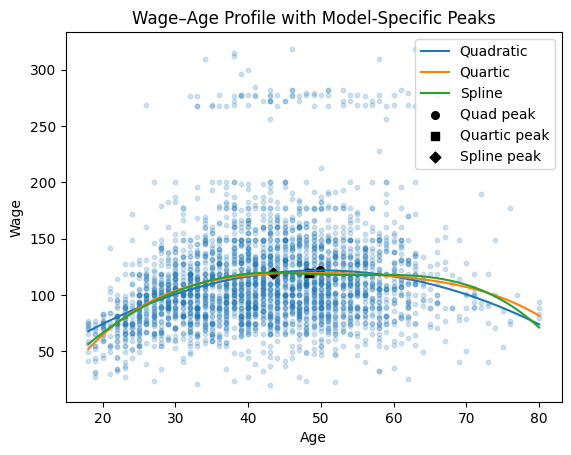

In [14]:
# -----------------------------
# 1. Fit models
# -----------------------------

quad = smf.ols("wage ~ age + I(age**2)", data=Wage).fit()

poly4 = smf.ols(
    "wage ~ age + I(age**2) + I(age**3) + I(age**4)",
    data=Wage
).fit()

spline = smf.ols("wage ~ bs(age, df=6)", data=Wage).fit()

# -----------------------------
# 2. Grid
# -----------------------------

age_grid = np.linspace(Wage["age"].min(), Wage["age"].max(), 500)
age_df = pd.DataFrame({"age": age_grid})

quad_pred = quad.predict(age_df)
poly4_pred = poly4.predict(age_df)
spline_pred = spline.predict(age_df)

# -----------------------------
# 3. Peaks
# -----------------------------

# Quadratic
b1 = quad.params["age"]
b2 = quad.params["I(age ** 2)"]
a_quad = -b1 / (2 * b2)
w_quad = quad.predict(pd.DataFrame({"age": [a_quad]}))[0]

# Quartic
a_poly4 = age_grid[np.argmax(poly4_pred)]
w_poly4 = poly4.predict(pd.DataFrame({"age": [a_poly4]}))[0]

# Spline
a_spline = age_grid[np.argmax(spline_pred)]
w_spline = spline.predict(pd.DataFrame({"age": [a_spline]}))[0]

# -----------------------------
# 4. Table
# -----------------------------

results = pd.DataFrame({
    "Model": ["Quadratic", "Quartic", "Spline"],
    "Peak Age": [a_quad, a_poly4, a_spline],
    "Peak Wage": [w_quad, w_poly4, w_spline]
})

print(results)

# -----------------------------
# 5. Plot
# -----------------------------

plt.figure()

plt.scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)

plt.plot(age_grid, quad_pred, label="Quadratic")
plt.plot(age_grid, poly4_pred, label="Quartic")
plt.plot(age_grid, spline_pred, label="Spline")

# Distinct peak markers (shape-coded)
plt.scatter(a_quad, w_quad, color="black", marker="o", s=30, label="Quad peak")
plt.scatter(a_poly4, w_poly4, color="black", marker="s", s=30, label="Quartic peak")
plt.scatter(a_spline, w_spline, color="black", marker="D", s=30, label="Spline peak")

plt.xlabel("Age")
plt.ylabel("Wage")
plt.title("Wage–Age Profile with Model-Specific Peaks")
plt.legend()

plt.show()

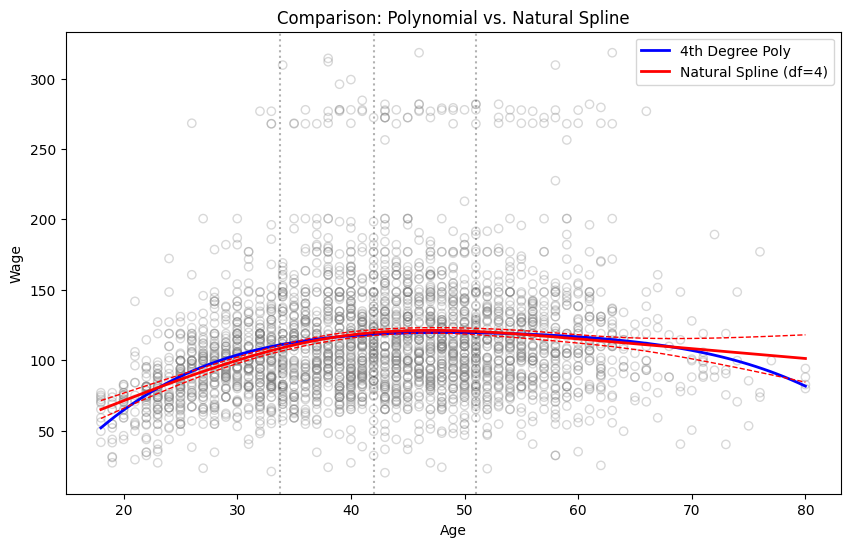

In [15]:
from patsy import dmatrix

# -----------------------------
# 1. Create grid
# -----------------------------
age_grid = np.linspace(Wage.age.min(), Wage.age.max(), 100)
age_df = pd.DataFrame({'age': age_grid})

# -----------------------------
# 2. Polynomial Regression (Degree 4)
# -----------------------------
model_poly = ols("wage ~ age + I(age**2) + I(age**3) + I(age**4)", data=Wage).fit()
pred_poly = model_poly.get_prediction(age_df).summary_frame()

# -----------------------------
# 3. Natural Cubic Spline (Automated df=4)
# -----------------------------
# We create the basis for the TRAINING data
# 'cr' stands for Natural Cubic Spline (stable at boundaries)
transformed_x = dmatrix("cr(age, df=4)", {"age": Wage.age}, return_type='dataframe')
model_spline = sm.OLS(Wage.wage, transformed_x).fit()

# We create the basis for the PREDICTION grid
predict_basis = dmatrix("cr(age, df=4)", {"age": age_grid}, return_type='dataframe')
pred_spline = model_spline.get_prediction(predict_basis).summary_frame(alpha=0.05)

# -----------------------------
# 4. Plotting
# -----------------------------
plt.figure(figsize=(10, 6))

# Raw Data
plt.scatter(Wage.age, Wage.wage, facecolor='None', edgecolor='gray', alpha=0.3)

# Polynomial Line (Blue)
plt.plot(age_grid, pred_poly['mean'], color='blue', label='4th Degree Poly', lw=2)

# Natural Spline Line (Red)
plt.plot(age_grid, pred_spline['mean'], color='red', label='Natural Spline (df=4)', lw=2)

# Spline Confidence Intervals (Dashed Red)
plt.plot(age_grid, pred_spline['mean_ci_lower'], color='red', linestyle='--', lw=1)
plt.plot(age_grid, pred_spline['mean_ci_upper'], color='red', linestyle='--', lw=1)

# Knot Locations (Percentiles of ACTUAL age data)
knots = np.percentile(Wage.age, [25, 50, 75])
for knot in knots:
    plt.axvline(knot, color='black', linestyle=':', alpha=0.3)

plt.title("Comparison: Polynomial vs. Natural Spline")
plt.xlabel("Age")
plt.ylabel("Wage")
plt.legend()
plt.show()

**--- End of Section: 07.1-Polynomial_Splines ---**

---


# --- Section from: 07.2-Beyond_Linearity ---


# Moving Beyond Linearity: An Analysis of the Wage Dataset

In this notebook, we explore non-linear modeling techniques using the `Wage` dataset. Standard linear regression assumes a constant rate of change, which is often an oversimplification of complex real-world phenomena. Human wages, for instance, rarely increase linearly throughout a lifetime. 

We will systematically relax the linearity assumption by progressing through polynomial regression, step functions, regression splines, and natural splines. Our primary objective is to model `wage` as a function of `age`, balancing model flexibility with interpretability and variance control.

In [11]:
# Load the dataset
wage_df = pd.read_csv('Wage.csv')

# 1. Check data types and missing values
display(wage_df.info())

# 2. Preview the first few rows
display(wage_df.head())

# Set up global plotting parameters for academic clarity
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (10, 5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year        3000 non-null   int64  
 1   age         3000 non-null   int64  
 2   maritl      3000 non-null   object 
 3   race        3000 non-null   object 
 4   education   3000 non-null   object 
 5   region      3000 non-null   object 
 6   jobclass    3000 non-null   object 
 7   health      3000 non-null   object 
 8   health_ins  3000 non-null   object 
 9   logwage     3000 non-null   float64
 10  wage        3000 non-null   float64
dtypes: float64(2), int64(2), object(7)
memory usage: 257.9+ KB


None

,year,age,maritl,race,education,region,jobclass,health,health_ins,logwage,wage
0,2006,18,1. Never Married,1. White,1. < HS Grad,2. Middle Atlantic,1. Industrial,1. <=Good,2. No,4.318063,75.043154
1,2004,24,1. Never Married,1. White,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,2. No,4.255273,70.476020
2,2003,45,2. Married,1. White,3. Some College,2. Middle Atlantic,1. Industrial,1. <=Good,1. Yes,4.875061,130.982177
3,2003,43,2. Married,3. Asian,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,1. Yes,5.041393,154.685293
4,2005,50,4. Divorced,1. White,2. HS Grad,2. Middle Atlantic,2. Information,1. <=Good,1. Yes,4.318063,75.043154


## Exploratory Data Analysis

Before imposing a mathematical structure on our data, empirical observation is required. We visualize the bivariate relationship between `age` and `wage`. 

Notice the discernible non-linear "hump" in the scatter plot. Wages experience rapid growth in early career stages, plateau during middle age, and exhibit a slight decline or increased variance as workers approach retirement. Fitting a simple linear model $y_i = \beta_0 + \beta_1 x_i + \epsilon_i$ would systematically under-predict wages for middle-aged workers and over-predict for the youngest and oldest workers.

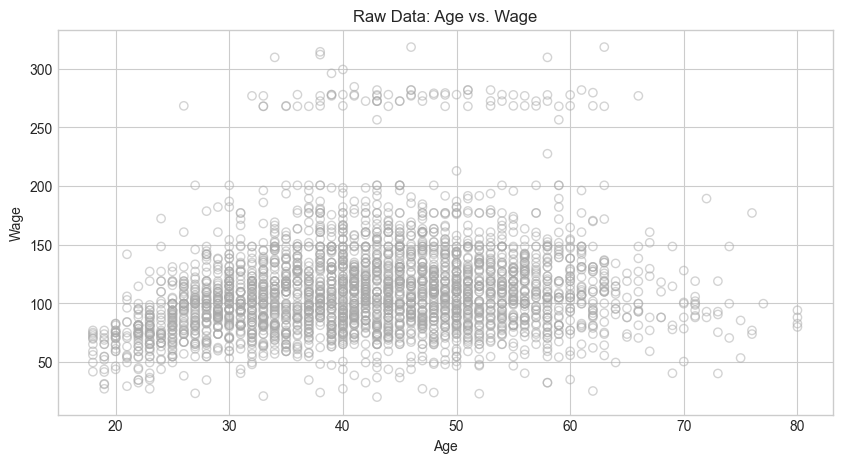

In [12]:
# Create a base scatter plot to use throughout the notebook
def plot_wage_data():
    fig, ax = plt.subplots()
    ax.scatter(wage_df['age'], wage_df['wage'], facecolors='none', edgecolors='darkgray', alpha=0.5)
    ax.set_xlabel('Age')
    ax.set_ylabel('Wage')
    return fig, ax

fig, ax = plot_wage_data()
ax.set_title('Raw Data: Age vs. Wage')
plt.show()

## Polynomial Regression

Our first approach to capturing non-linearity is to extend the linear model by incorporating engineered features. We raise our predictor, `age`, to successive powers, creating a polynomial of degree $d$. For a degree-4 polynomial, the model is:

$$y_i = \beta_0 + \beta_1 x_i + \beta_2 x_i^2 + \beta_3 x_i^3 + \beta_4 x_i^4 + \epsilon_i$$

While this is a non-linear curve in the two-dimensional space of age and wage, it remains a *linear* model in terms of its coefficients ($\beta$). Thus, it can be estimated using standard Ordinary Least Squares (OLS). A fundamental limitation of this approach is its global nature; the shape of the curve at age 60 is heavily influenced by the data points at age 20.

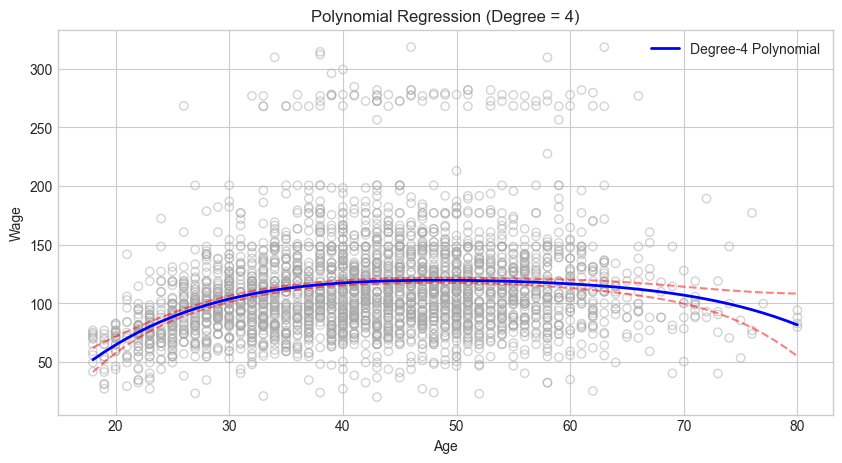

In [68]:
# Fit a degree-4 polynomial
fit_poly = smf.ols('wage ~ age + np.power(age, 2) + np.power(age, 3) + np.power(age, 4)', data=wage_df).fit()

# Generate a grid of age values for smooth plotting
age_grid = np.arange(wage_df['age'].min(), wage_df['age'].max() + 1)
pred_poly = fit_poly.get_prediction(pd.DataFrame({'age': age_grid}))

# Extract predictions and standard error bands
poly_mean = pred_poly.predicted_mean
poly_ci = pred_poly.conf_int()

fig, ax = plot_wage_data()
ax.plot(age_grid, poly_mean, color='blue', linewidth=2, label='Degree-4 Polynomial')
ax.plot(age_grid, poly_ci[:, 0], color='red', linestyle='dashed', alpha=0.5)
ax.plot(age_grid, poly_ci[:, 1], color='red', linestyle='dashed', alpha=0.5)
ax.set_title('Polynomial Regression (Degree = 4)')
ax.legend()
plt.show()

## Step Functions

To avoid the global constraints of polynomials, we can adopt a localized approach using step functions. We partition the domain of $X$ into $K$ distinct, non-overlapping regions and fit a constant value (the mean) within each region. 

We construct indicator variables $C_k(X)$ that evaluate to 1 if $X$ falls within the $k$-th interval, and 0 otherwise. The model is formulated as:

$$y_i = \beta_0 + \beta_1 C_1(x_i) + \beta_2 C_2(x_i) + \dots + \beta_K C_K(x_i) + \epsilon_i$$

This isolates local behavior, but introduces a severe structural flaw: discontinuity. The model predicts arbitrary, sudden jumps in wage precisely at the interval boundaries, which violates the underlying reality of human earning trajectories.

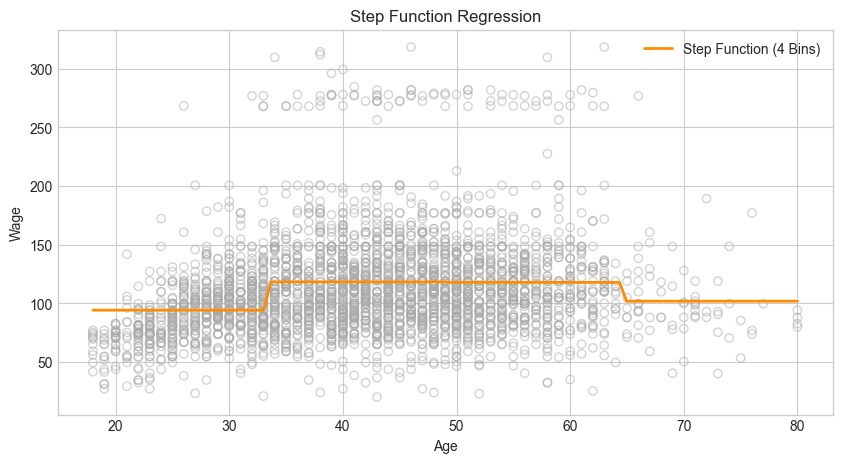

In [29]:
# Cut age into 4 bins
wage_df['age_bins'] = pd.cut(wage_df['age'], 4)

# Fit OLS on the dummy variables generated by the bins
fit_step = smf.ols('wage ~ age_bins', data=wage_df).fit()

# Predict using the grid
step_grid_df = pd.DataFrame({'age': age_grid})
step_grid_df['age_bins'] = pd.cut(step_grid_df['age'], bins=wage_df['age_bins'].cat.categories)
pred_step = fit_step.predict(step_grid_df)

fig, ax = plot_wage_data()
ax.plot(age_grid, pred_step, color='darkorange', linewidth=2, label='Step Function (4 Bins)')
ax.set_title('Step Function Regression')
ax.legend()
plt.show()

## Regression Splines

Regression splines synthesize the flexibility of step functions with the smoothness of polynomials. We divide the data into regions separated by breakpoints called **knots**. Instead of fitting a constant in each region, we fit a low-degree polynomial (typically a cubic polynomial, $d=3$).

To prevent the disjointed jumps seen in step functions, we impose mathematical constraints: the piecewise polynomials must be continuous at the knots, and their first and second derivatives must also be continuous. This results in a curve that is highly flexible but visually seamless.

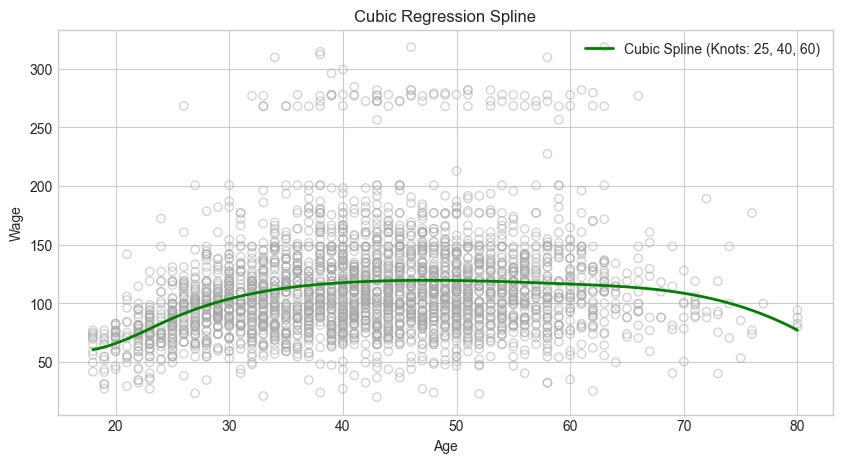

In [30]:
# Create a cubic spline basis with knots at ages 25, 40, and 60
# 'bs' generates a B-spline basis
spline_basis = dmatrix("bs(age, knots=(25, 40, 60), degree=3, include_intercept=False)", {"age": wage_df['age']}, return_type='dataframe')

# Fit the model
fit_spline = sm.GLS(wage_df['wage'], sm.add_constant(spline_basis)).fit()

# Predict on the grid
spline_grid_basis = dmatrix("bs(age, knots=(25, 40, 60), degree=3, include_intercept=False)", {"age": age_grid}, return_type='dataframe')
pred_spline = fit_spline.predict(sm.add_constant(spline_grid_basis))

fig, ax = plot_wage_data()
ax.plot(age_grid, pred_spline, color='green', linewidth=2, label='Cubic Spline (Knots: 25, 40, 60)')
ax.set_title('Cubic Regression Spline')
ax.legend()
plt.show()

## Natural Splines

A known vulnerability of standard regression splines is their erratic behavior at the boundaries of the dataset (where $X$ takes its smallest and largest values), leading to wide confidence intervals. 

**Natural splines** solve this by adding an extra boundary constraint: the function is forced to be linear beyond the outermost knots. This regularization step significantly reduces variance in the tails of the distribution, providing a more stable and reliable model for extreme age values.

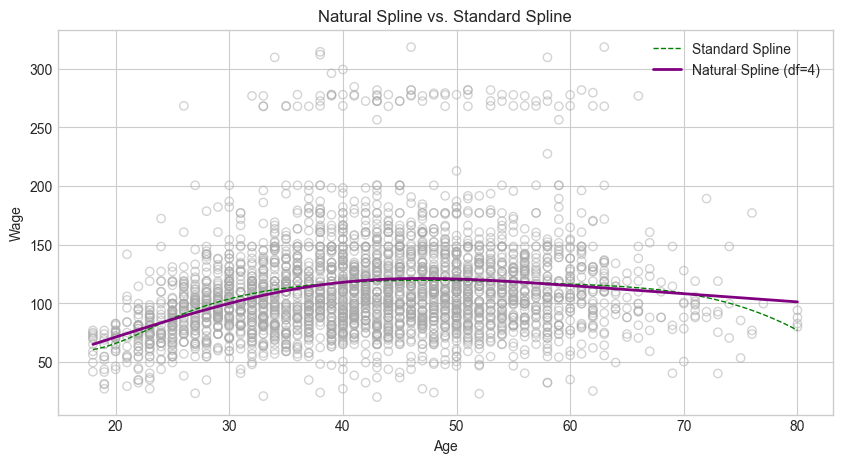

In [31]:
# Create a natural cubic spline basis ('cr' in patsy) with 4 degrees of freedom
nat_spline_basis = dmatrix("cr(age, df=4)", {"age": wage_df['age']}, return_type='dataframe')

# Fit the model
fit_nat_spline = sm.GLS(wage_df['wage'], sm.add_constant(nat_spline_basis)).fit()

# Predict on the grid
nat_spline_grid = dmatrix("cr(age, df=4)", {"age": age_grid}, return_type='dataframe')
pred_nat_spline = fit_nat_spline.predict(sm.add_constant(nat_spline_grid))

fig, ax = plot_wage_data()
ax.plot(age_grid, pred_spline, color='green', linewidth=1, linestyle='dashed', label='Standard Spline')
ax.plot(age_grid, pred_nat_spline, color='purple', linewidth=2, label='Natural Spline (df=4)')
ax.set_title('Natural Spline vs. Standard Spline')
ax.legend()
plt.show()

## Statistical Justification via ANOVA

Visual inspection is insufficient for rigorous model selection. We must statistically justify the **Global Polynomial Degree** (our chosen degree of flexibility or power of X and not the degree of freedom). We will sequentially fit polynomial models of increasing degrees (from linear to quintic) and use an Analysis of Variance (ANOVA) to conduct an F-test.

The null hypothesis ($H_0$) for each sequential test is that the simpler model is sufficient to explain the data. A low p-value indicates that the more complex model provides a statistically significant improvement in reducing the residual sum of squares (RSS).

In [38]:
# Fit sequential polynomial models
fit_1 = smf.ols('wage ~ age', data=wage_df).fit()
fit_2 = smf.ols('wage ~ age + np.power(age, 2)', data=wage_df).fit()
fit_3 = smf.ols('wage ~ age + np.power(age, 2) + np.power(age, 3)', data=wage_df).fit()
fit_4 = smf.ols('wage ~ age + np.power(age, 2) + np.power(age, 3) + np.power(age, 4)', data=wage_df).fit()
fit_5 = smf.ols('wage ~ age + np.power(age, 2) + np.power(age, 3) + np.power(age, 4) + np.power(age, 5)', data=wage_df).fit()

# Run ANOVA F-tests to compare nested models
anova_results = sm.stats.anova_lm(fit_1, fit_2, fit_3, fit_4, fit_5, typ=1)

# --- NEW CODE TO SUPPRESS SCIENTIFIC NOTATION ---
# Temporarily change pandas display options to use standard float formatting
with pd.option_context('display.float_format', '{:.4f}'.format):
    display(anova_results)

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,2998.0000,5022216.1047,0.0000,NaN,NaN,NaN
1,2997.0000,4793430.0946,1.0000,228786.0101,143.5931,0.0000
2,2996.0000,4777674.4010,1.0000,15755.6937,9.8888,0.0017
3,2995.0000,4771604.2488,1.0000,6070.1521,3.8098,0.0510
4,2994.0000,4770321.6858,1.0000,1282.5630,0.8050,0.3697


### Interpretation of ANOVA Results

The Analysis of Variance (ANOVA) table above provides a formal statistical mechanism for model selection. Because we fitted a sequence of nested models—where each subsequent model simply adds one higher-degree polynomial term—we can use an F-test to determine if the additional complexity is justified. 

The null hypothesis ($H_0$) for each step is that the simpler model is sufficient, meaning the coefficient for the newly added higher-degree term is effectively zero.

Here is the sequential breakdown of the results:

* **Linear vs. Quadratic (Degree 1 to 2):** The transition to a quadratic model yields an F-statistic of $143.59$ and a p-value of approximately $0.0000$. We emphatically reject the null hypothesis. This confirms our initial visual EDA: the relationship between age and wage is undeniably non-linear.
* **Quadratic vs. Cubic (Degree 2 to 3):** Adding a cubic term reduces the Residual Sum of Squares (RSS) further, with a p-value of $0.0017$. Since $0.0017 < 0.05$, this suggests the cubic term captures important structural curvature in the data that the quadratic model misses.
* **Cubic vs. Quartic (Degree 3 to 4):** The addition of a degree-4 term yields a p-value of $0.0510$. This is right on the boundary of the standard $5\%$ significance threshold ($\alpha = 0.05$). In practice, one might argue for either the cubic or quartic model here, but the evidence for needing a degree-4 polynomial is comparatively weak.
* **Quartic vs. Quintic (Degree 4 to 5):** Adding a degree-5 term yields a p-value of $0.3697$. This is not statistically significant. The quintic term does not meaningfully reduce the RSS; it merely fits to the random noise (variance) of our specific sample.

**Conclusion:**
The statistical evidence strongly supports abandoning the linear model in favor of a non-linear one. A cubic polynomial (Degree 3) is clearly justified by the data. While a quartic polynomial (Degree 4) provides a marginal improvement, anything beyond degree 4 introduces unnecessary complexity without predictive benefit, leading to overfitting.

## Hyperparameter Tuning: K-Fold Cross-Validation vs. ANOVA

Optimal Degrees of Freedom: 5


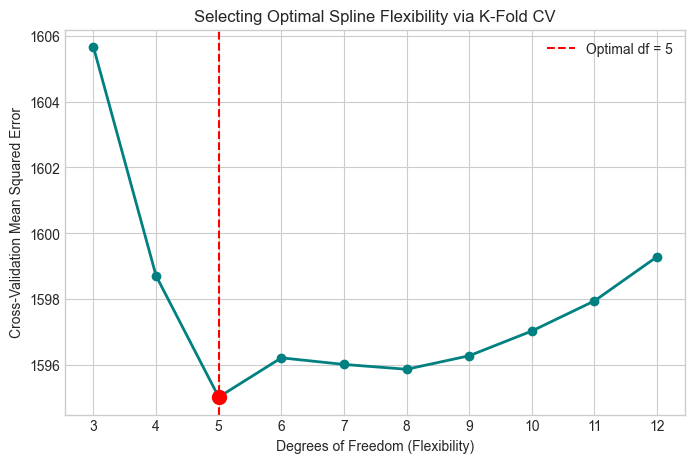

In [70]:
# -----------------------------
# 1. Setup Cross-Validation
# -----------------------------
# We will test degrees of freedom from 3 to 12
# (Note: Natural splines require a minimum of df=3)
df_range = range(3, 13)
cv_errors = []

# Initialize K-Fold with 5 splits
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# -----------------------------
# 2. The CV Loop
# -----------------------------
for d in df_range:
    fold_errors = []
    
    for train_index, test_index in kf.split(wage_df):
        # Split the data into Training (80%) and Testing (20%)
        train_data = wage_df.iloc[train_index]
        test_data = wage_df.iloc[test_index]
        
        # Fit the Natural Spline on the TRAINING data
        model = smf.ols(f"wage ~ cr(age, df={d})", data=train_data).fit()
        
        # Predict on the unseen TEST data
        preds = model.predict(test_data)
        
        # Calculate Mean Squared Error for this fold
        mse = mean_squared_error(test_data["wage"], preds)
        fold_errors.append(mse)
        
    # Average the MSE across all 5 folds for this specific df
    cv_errors.append(np.mean(fold_errors))

# -----------------------------
# 3. Identify the Optimal df
# -----------------------------
best_idx = np.argmin(cv_errors)
best_df = df_range[best_idx]
min_error = cv_errors[best_idx]

print(f"Optimal Degrees of Freedom: {best_df}")

# -----------------------------
# 4. Plot the CV Curve
# -----------------------------
plt.figure(figsize=(8, 5))

plt.plot(df_range, cv_errors, marker='o', linestyle='-', color='teal', lw=2)
plt.axvline(best_df, color='red', linestyle='--', label=f'Optimal df = {best_df}')
plt.scatter(best_df, min_error, color='red', s=100, zorder=5)

plt.xlabel("Degrees of Freedom (Flexibility)")
plt.ylabel("Cross-Validation Mean Squared Error")
plt.title("Selecting Optimal Spline Flexibility via K-Fold CV")
plt.xticks(df_range)
plt.legend()

plt.show()

In our previous section, we used an **ANOVA F-test** to determine the optimal complexity of a global polynomial. That approach relied on classical in-sample hypothesis testing. However, to optimize our local models (Natural Splines), we transition to a modern machine learning approach: **K-Fold Cross-Validation**.

Instead of relying on p-values, Cross-Validation empirically tests how well the model generalizes to unseen data. 

**The Process:**
We split our dataset into 5 equal folds. For each degree of freedom ($df$) between 3 and 12, we train the natural spline on 4 folds and test its predictions on the 1 holdout fold. We rotate this process 5 times and average the out-of-sample Mean Squared Error (MSE).

**The Bias-Variance Tradeoff:**
The resulting plot visualizes the classic bias-variance tradeoff:
* **Underfitting (Left side):** At low $df$, the model is too rigid to capture the true non-linear wage lifecycle, resulting in higher errors.
* **Overfitting (Right side):** Beyond the optimal $df$, adding more knots allows the spline to memorize statistical noise in the training folds, which harms its accuracy on the test folds.

By selecting the $df$ that strictly minimizes the Cross-Validation MSE, we allow the data to objectively define its own optimal mathematical flexibility.

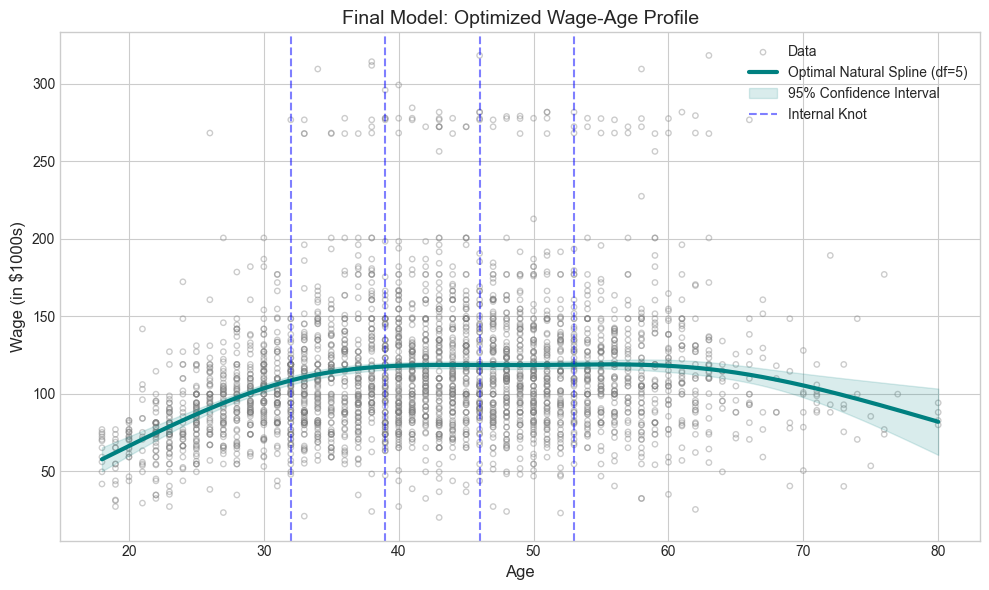

Knots placed at ages: [32. 39. 46. 53.]


In [74]:
# -----------------------------
# 1. Fit the "Champion" Model
# -----------------------------
# We use df=5 as proven by our Cross-Validation
optimal_model = smf.ols("wage ~ cr(age, df=5)", data=wage_df).fit()

# Generate predictions and confidence intervals
pred_data = optimal_model.get_prediction(age_df).summary_frame()

# -----------------------------
# 2. Identify Knot Locations
# -----------------------------
# For df=5, knots are typically at these percentiles
knot_locations = np.percentile(wage_df['age'], [20, 40, 60, 80])

# -----------------------------
# 3. Plotting the Results
# -----------------------------
plt.figure(figsize=(10, 6))

# Raw Data
plt.scatter(wage_df['age'], wage_df['wage'], facecolors='none', 
            edgecolors='grey', alpha=0.4, s=15, label='Data')

# The Optimal Spline
plt.plot(age_grid, pred_data['mean'], color='teal', lw=3, 
         label=f'Optimal Natural Spline (df=5)')

# Confidence Intervals
plt.fill_between(age_grid, pred_data['mean_ci_lower'], pred_data['mean_ci_upper'], 
                 color='teal', alpha=0.15, label='95% Confidence Interval')

# Visualizing the Knots
for i, knot in enumerate(knot_locations):
    plt.axvline(knot, color='blue', linestyle='--', alpha=0.5, 
                label='Internal Knot' if i == 0 else "")

plt.title("Final Model: Optimized Wage-Age Profile", fontsize=14)
plt.xlabel("Age", fontsize=12)
plt.ylabel("Wage (in $1000s)", fontsize=12)
plt.legend()

plt.tight_layout()
plt.show()

print(f"Knots placed at ages: {np.round(knot_locations, 1)}")

## Interpreting the "Winning" Model ($df=5$)

Our Cross-Validation process identified a **Natural Cubic Spline with 5 Degrees of Freedom** as the optimal model. But what does that "5" actually represent in practice? 

Think of **Degrees of Freedom ($df$)** as a "Complexity Budget" that the model spends to capture the shape of the data.

### 1. The Number of "Hinges" (Knots)
For a Natural Cubic Spline, the relationship between flexibility and internal knots is defined as:
$$\text{Internal Knots} = df - 1$$

With **$df=5$**, the model has placed **4 internal knots**. These knots act like structural hinges, dividing the age range into segments. Inside each segment, the model fits a cubic polynomial ($X^3$). At the knots, these polynomials are joined so perfectly that the human eye cannot see the "seams," resulting in a single, smooth curve.



### 2. The "Natural" Constraint
While a standard spline can become erratic at the edges of the data, a **Natural** spline (indicated by the `cr` or "Cubic Regression" basis) adds a specific constraint: the function must be **linear** (a straight line) beyond the outermost knots.
* This constraint "saves" degrees of freedom, allowing the model to focus its flexibility on the middle of the age range where the data is most dense.
* This is why our $df=5$ model remains stable at age 18 and age 80, rather than "wagging" wildly like a high-degree polynomial.

### 3. Finding the "Sweet Spot"
The $df=5$ result represents the ideal balance in the **Bias-Variance Tradeoff**:
* **Too Low ($df < 3$):** The model is too rigid (underfit) and might miss the peak earning years entirely.
* **Too High ($df > 8$):** The model becomes too "wiggly" (overfit), chasing random outliers and individual high-earners rather than the general population trend.
* **Optimal ($df = 5$):** The model is flexible enough to capture the rapid wage growth of the 20s, the plateau of the 40s, and the gradual decline toward retirement, without being distracted by statistical noise.

# Annex 1. 
## ISLP textbook graphs
### Polynomial Modeling: Continuous and Binary Outcomes

In [66]:
# Load the dataset
Wage = pd.read_csv('Wage.csv')

# 1. Transform age into degree-4 features
poly = PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(Wage[['age']])

### --- Regression --- ###
# 2. Left Plot: Linear Regression
model_linear = sm.OLS(Wage['wage'], X_poly).fit()
# Use model_linear.get_prediction().summary_frame() for CI bands

### --- Classification --- ###
# 3. Right Plot: Logistic Regression
y_binary = (Wage['wage'] > 250).astype(int)
model_logit = sm.Logit(y_binary, X_poly).fit()
# Predict and plot using the logistic sigmoid function: 1 / (1 + exp(-Xb))

Optimization terminated successfully.
         Current function value: 0.116870
         Iterations 12


In this section, we apply degree-4 polynomial transformations to model the relationship between a worker's age and their wage. By utilizing Polynomial Features, we expand our single predictor $X$ (age) into a feature matrix containing $X^0, X^1, X^2, X^3,$ and $X^4$.
We explore this non-linear relationship through two distinct statistical lenses:

1. **Continuous Outcome (Polynomial Regression)**

First, we treat wage as a continuous variable. We fit a standard Ordinary Least Squares (OLS) model using our expanded polynomial feature matrix. The model takes the form:

$y_i = \beta_0 + \beta_1 x_i + \beta_2 x_i^2 + \beta_3 x_i^3 + \beta_4 x_i^4 + \epsilon_i$

This allows us to estimate the expected wage for any given age, capturing the curvature of the earning lifecycle (the rapid increase in early career, the plateau in middle age, and the slight decline approaching retirement).

2. **Binary Outcome (Logistic Regression)** 

Next, we shift from regression to classification to investigate the probability of a worker being a "high earner." We construct a binary response variable, $y_i$, which equals $1$ if a worker earns more than $250,000$, and $0$ otherwise.
We model this binary outcome using Logistic Regression applied to our same degree-4 polynomial features. Instead of predicting the raw wage, we model the log-odds of being a high earner. The probability $\Pr(y_i > 250 | x_i)$ is expressed via the logistic function:

$\Pr(y_i > 250 | x_i) = \frac{\exp(\beta_0 + \beta_1 x_i + \beta_2 x_i^2 + \beta_3 x_i^3 + \beta_4 x_i^4)}{1 + \exp(\beta_0 + \beta_1 x_i + \beta_2 x_i^2 + \beta_3 x_i^3 + \beta_4 x_i^4)}$

This dual approach illustrates the versatility of basis expansions: transforming our predictors via polynomials is completely agnostic to the type of model we subsequently fit, whether it is standard linear regression or logistic classification.

### Implementation: Visualizing Polynomial Models

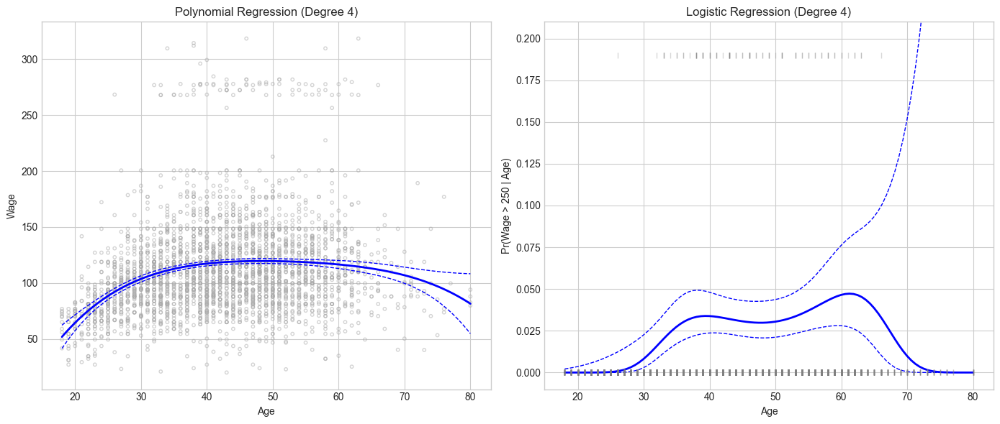

In [43]:
# -----------------------------
# 1. Setup
# -----------------------------
age_grid = np.linspace(Wage['age'].min(), Wage['age'].max(), 100)

# Polynomial features (shared for both models) [scikit-learn approach]
poly = PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(Wage[['age']])
X_grid_poly = poly.transform(age_grid.reshape(-1, 1))

# -----------------------------
# 2. Linear Regression
# -----------------------------
model_linear = sm.OLS(Wage['wage'], X_poly).fit()
# Get predictions and confidence intervals using the grid matrix
pred_linear = model_linear.get_prediction(X_grid_poly).summary_frame()

# -----------------------------
# 3. Logistic Regression
# -----------------------------
y_binary = (Wage['wage'] > 250).astype(int)
model_logit = sm.Logit(y_binary, X_poly).fit(disp=0)
# Linear predictor
logit_mean = model_logit.predict(X_grid_poly, linear=True)

# Variance calculation
cov_beta = model_logit.cov_params()
logit_var = np.sum(X_grid_poly @ cov_beta * X_grid_poly, axis=1)
logit_se = np.sqrt(logit_var)

# Confidence intervals (logit scale → probability scale)
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

p_mean = sigmoid(logit_mean)
p_lower = sigmoid(logit_mean - 2 * logit_se)
p_upper = sigmoid(logit_mean + 2 * logit_se)

# -----------------------------
# 4. Plot side-by-side
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# --- Left: Linear Regression ---
axes[0].scatter(Wage.age, Wage.wage, facecolors='none',
                edgecolors='darkgrey', s=10, alpha=0.5)

axes[0].plot(age_grid, pred_linear['mean'], color='blue', lw=2)
axes[0].plot(age_grid, pred_linear['mean_ci_lower'], '--', color='blue', lw=1)
axes[0].plot(age_grid, pred_linear['mean_ci_upper'], '--', color='blue', lw=1)

axes[0].set_xlabel('Age')
axes[0].set_ylabel('Wage')
axes[0].set_title('Polynomial Regression (Degree 4)')


# --- Right: Logistic Regression ---
axes[1].plot(age_grid, p_mean, color='blue', lw=2)
axes[1].plot(age_grid, p_lower, '--', color='blue', lw=1)
axes[1].plot(age_grid, p_upper, '--', color='blue', lw=1)

# Rug plot
axes[1].plot(Wage['age'], y_binary * 0.19, '|', color='grey', alpha=0.3)
axes[1].plot(Wage['age'], np.zeros(len(Wage)), '|', color='grey', alpha=0.3)

axes[1].set_ylim(-0.01, 0.21)
axes[1].set_xlabel('Age')
axes[1].set_ylabel('Pr(Wage > 250 | Age)')
axes[1].set_title('Logistic Regression (Degree 4)')

plt.tight_layout()
plt.show()

This code bridges theory and practice by reproducing the core polynomial graphics from the ISLP text. We construct a shared degree-4 polynomial feature matrix to evaluate both a continuous and a binary response over a uniform grid of `age` values.

**1. Left Panel: Continuous Wage Prediction**
Using Ordinary Least Squares (OLS), we regress `wage` onto our polynomial basis. The `get_prediction()` method efficiently computes the expected mean wage and 95% confidence intervals at each age, allowing us to overlay the resulting non-linear curve and its error bands directly onto the empirical scatter plot.

**2. Right Panel: High-Earner Probability Calculation**
To model the probability of being a high earner (>$250\text{k}$), we apply Logistic Regression. Crucially, to ensure our confidence bands remain mathematically valid (strictly bounded between 0 and 1), we compute the variance and confidence bounds on the unbounded linear logit scale ($X\hat{\beta} \pm 2 \cdot \text{SE}$). We then map these bounds back to the probability scale via the inverse logit (sigmoid) function. A marginal rug plot is added to visualize the sparse, binary distribution of the actual high-earner data.

### A Unified View of Non-Linear Modeling

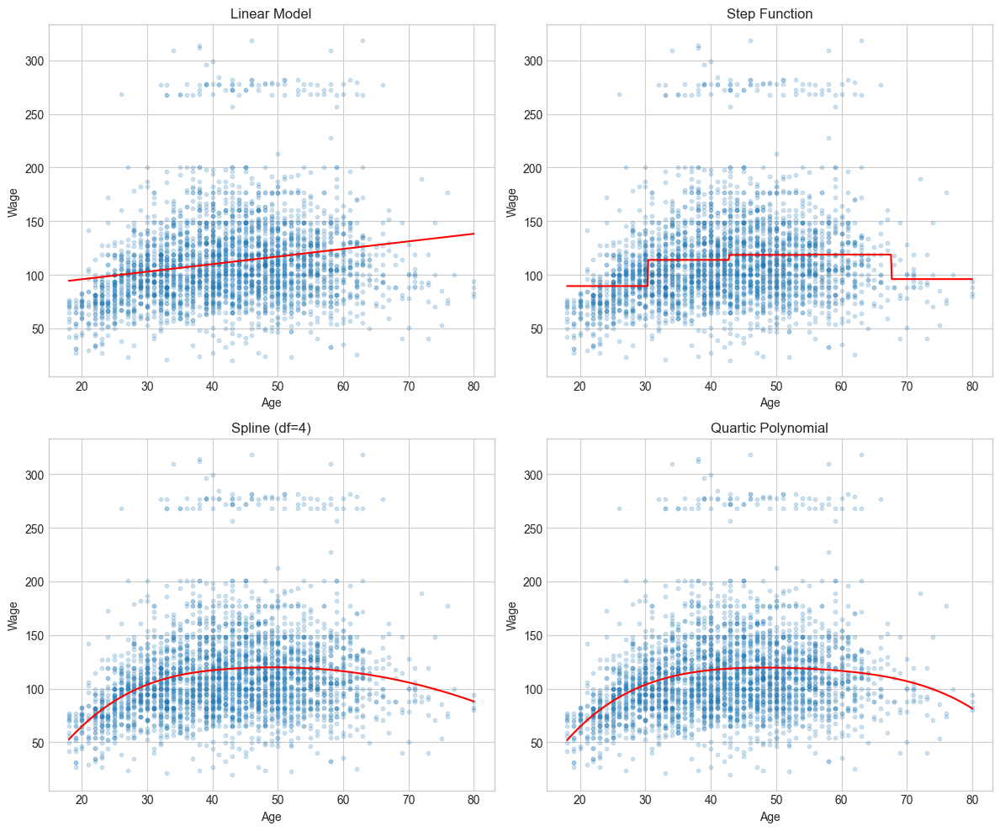

In [83]:
age_grid = np.linspace(Wage["age"].min(), Wage["age"].max(), 500)
age_df = pd.DataFrame({"age": age_grid})

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# -------------------
# 1. Linear
# -------------------
linear = smf.ols("wage ~ age", data=Wage).fit()
pred_linear = linear.predict(age_df)

axes[0, 0].scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
axes[0, 0].plot(age_grid, pred_linear, color="red")
axes[0, 0].set_title("Linear Model")

# -------------------
# 2. Step function
# -------------------
Wage["age_bin"] = pd.cut(Wage["age"], bins=5)
step = smf.ols("wage ~ age_bin", data=Wage).fit()

age_df_step = age_df.copy()
age_df_step["age_bin"] = pd.cut(age_df_step["age"], bins=5)

pred_step = step.predict(age_df_step)

axes[0, 1].scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
axes[0, 1].plot(age_grid, pred_step, color="red")
axes[0, 1].set_title("Step Function")

# -------------------
# 3. Spline
# -------------------
spline = smf.ols("wage ~ bs(age, df=4)", data=Wage).fit()
pred_spline = spline.predict(age_df)

axes[1, 0].scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
axes[1, 0].plot(age_grid, pred_spline, color="red")
axes[1, 0].set_title("Spline (df=4)")

# -------------------
# 4. QUARTIC - not quadratic
# -------------------
poly4 = smf.ols(
    "wage ~ age + I(age**2) + I(age**3) + I(age**4)",
    data=Wage
).fit()

pred_poly4 = poly4.predict(age_df)

axes[1, 1].scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10)
axes[1, 1].plot(age_grid, pred_poly4, color="red")
axes[1, 1].set_title("Quartic Polynomial")

# -------------------
# Layout polish
# -------------------
for ax in axes.ravel():
    ax.set_xlabel("Age")
    ax.set_ylabel("Wage")

plt.tight_layout()
plt.show()

To conclude our exploration of basis expansions, we visualize four distinct modeling approaches side-by-side. This grid highlights the structural assumptions and geometric properties inherent to each method when mapping the relationship between `age` and `wage`.

**1. The Linear Model (Top Left)**
The standard OLS regression forces a rigid, constant rate of change across the entire age domain. It systematically fails to capture the macroeconomic reality of the earning lifecycle, drastically under-predicting the wages of middle-aged workers.

**2. The Step Function (Top Right)**
By slicing the age variable into 5 distinct intervals, the step function applies a local constant (the mean wage) to each bin. While it successfully identifies the general "hump" shape of the data, the model is characterized by unnatural, discontinuous jumps at arbitrary age boundaries.

**3. The Cubic Spline (Bottom Left)**
Using a B-spline with 6 degrees of freedom ($df=6$), this model divides the data at internal knots and fits localized cubic polynomials. The mathematical constraints ensure continuous first and second derivatives at the boundaries, resulting in a highly flexible, beautifully smooth curve that tracks the data's density elegantly.

**4. The Quartic Polynomial (Bottom Right)**
The degree-4 polynomial provides a globally smooth curve. In this specific dataset, the quartic model and the cubic spline yield visually similar predictions in the interior of the data. However, the polynomial remains a global function, meaning its shape is rigidly tied to the data at the extremes, lacking the localized adaptability that makes splines the preferred tool in modern statistical learning.

### Model Flexibility and Overfitting: Polynomials vs. Splines

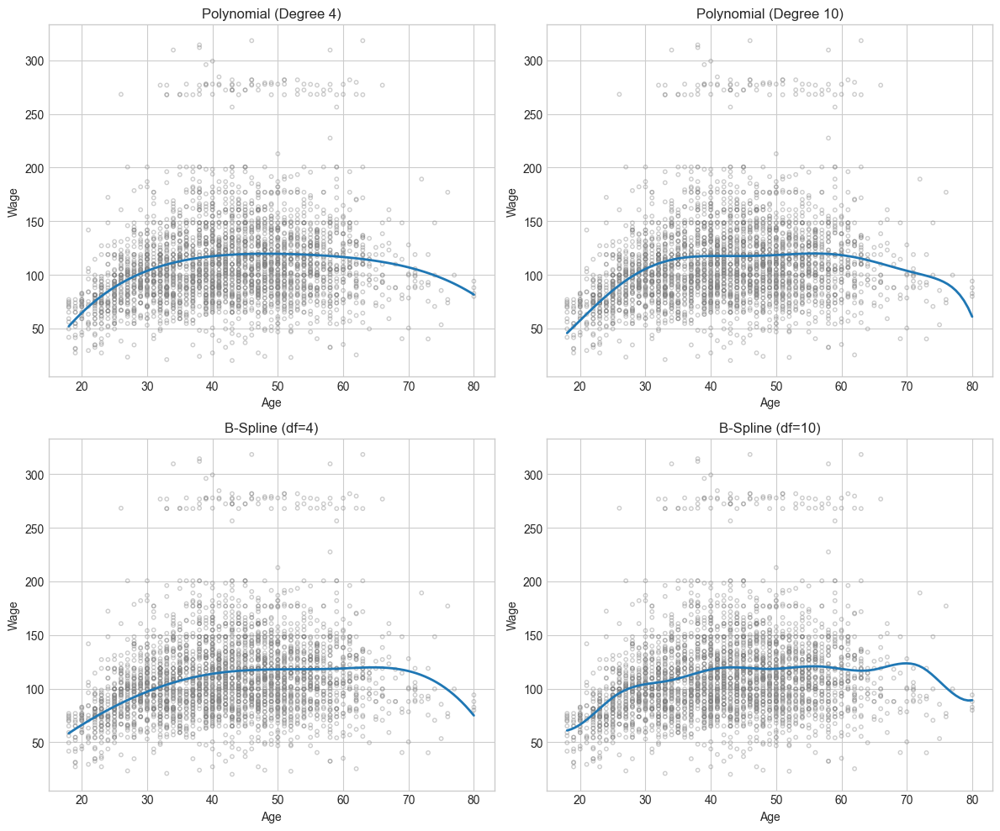

In [86]:
# Grid
age_grid = np.linspace(Wage.age.min(), Wage.age.max(), 100)
age_df = pd.DataFrame({'age': age_grid})

# -----------------------------
# MODELS
# -----------------------------

# Polynomial degree 4
poly4 = ols("wage ~ age + I(age**2) + I(age**3) + I(age**4)", data=Wage).fit()
pred_poly4 = poly4.predict(age_df)

# Polynomial degree 10
poly10 = ols(
    "wage ~ " + " + ".join([f"I(age**{i})" for i in range(1, 11)]),
    data=Wage
).fit()
pred_poly10 = poly10.predict(age_df)

# Spline df=4
spline4_basis = dmatrix("bs(age, df=4, degree=3)", data=Wage)
spline4 = sm.OLS(Wage['wage'], spline4_basis).fit()
spline4_grid = dmatrix("bs(age, df=4, degree=3)", data=age_df)
pred_spline5 = spline4.predict(spline4_grid)

# Spline df=10
spline10_basis = dmatrix("bs(age, df=10, degree=3)", data=Wage)
spline10 = sm.OLS(Wage['wage'], spline10_basis).fit()
spline10_grid = dmatrix("bs(age, df=10, degree=3)", data=age_df)
pred_spline10 = spline10.predict(spline10_grid)

# -----------------------------
# PLOTS
# -----------------------------
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

def plot_panel(ax, pred, title):
    ax.scatter(Wage.age, Wage.wage,
               facecolors='none', edgecolors='grey',
               alpha=0.4, s=10)
    ax.plot(age_grid, pred, linewidth=2)
    ax.set_title(title)
    ax.set_xlabel("Age")
    ax.set_ylabel("Wage")

plot_panel(axs[0, 0], pred_poly4, "Polynomial (Degree 4)")
plot_panel(axs[0, 1], pred_poly10, "Polynomial (Degree 10)")
plot_panel(axs[1, 0], pred_spline4, "B-Spline (df=4)")
plot_panel(axs[1, 1], pred_spline10, "B-Spline (df=10)")

plt.tight_layout()
plt.show()

In this section, we systematically compare the behavior of polynomial regression and regression splines as we increase model flexibility. We fit four distinct models: polynomials of degree 4 and 10, alongside cubic splines with 4 and 10 degrees of freedom ($df$).

**1. The Danger of High-Degree Polynomials (Top Row)**
Polynomials apply a **global** structure to the data. While a degree-4 polynomial captures the general macroeconomic trend of the wage data adequately, escalating to a degree-10 polynomial demonstrates severe overfitting. Because the highest-order terms ($X^{10}$) dominate the equation, the resulting curve exhibits extreme, unnatural oscillations. Most notably, the variance skyrockets at the boundaries of our dataset (the tails), where the model makes wildly illogical wage predictions for the youngest and oldest workers. 

**2. The Stability of Splines (Bottom Row)**
Regression splines, in contrast, apply **local** structure. By increasing the degrees of freedom from 4 to 10, we are not raising the degree of the underlying polynomials (which remain cubic); rather, we are instructing the model to insert more internal breakpoints (**knots**) across the age domain. 

As a result, the $df=10$ spline becomes noticeably "wigglier" than the $df=4$ spline, eagerly chasing localized noise in the middle-age demographic. However, because the basis functions are local, the instability is contained. The spline avoids the catastrophic boundary failures seen in the degree-10 polynomial.

**Conclusion**
This visual comparison provides a compelling justification for avoiding high-degree polynomials in practice. When greater flexibility is required to capture non-linear patterns, increasing the degrees of freedom in a spline is a significantly safer, more stable approach.

### Standard Splines vs. Natural Splines explained

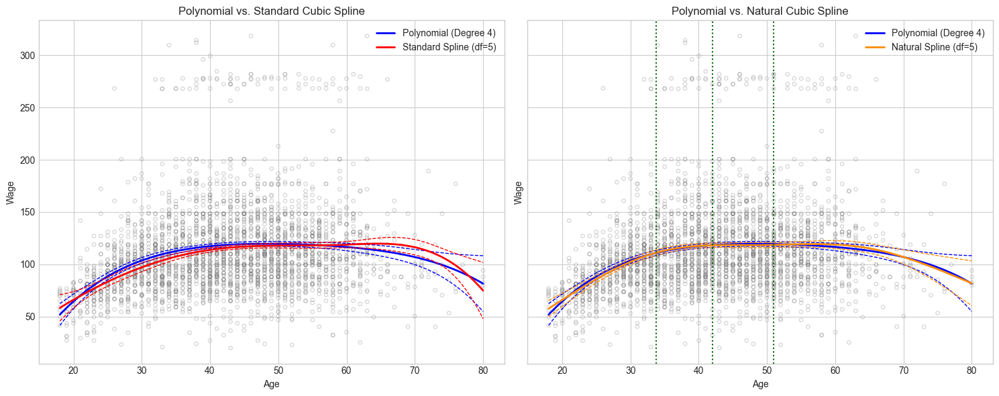

In [87]:
# -----------------------------
# 1. Create Grid
# -----------------------------
age_grid = np.linspace(Wage['age'].min(), Wage['age'].max(), 100)
age_df = pd.DataFrame({'age': age_grid})

# -----------------------------
# 2. Fit Models (Poly using degree 4 for non-linearity - Splines df=5)
# -----------------------------
# Model A: Polynomial (Degree 4)
model_poly = smf.ols("wage ~ age + I(age**2) + I(age**3) + I(age**4)", data=Wage).fit()
pred_poly = model_poly.get_prediction(age_df).summary_frame()

# Model B: Standard Cubic Spline (df=5)
bs_train = dmatrix("bs(age, df=5, degree=3)", data=Wage, return_type='dataframe')
bs_grid = dmatrix("bs(age, df=5, degree=3)", data=age_df, return_type='dataframe')
model_bs = sm.OLS(Wage['wage'], bs_train).fit()
pred_bs = model_bs.get_prediction(bs_grid).summary_frame()

# Model C: Natural Cubic Spline (df=5)
cr_train = dmatrix("cr(age, df=5)", {"age": Wage['age']}, return_type='dataframe')
cr_grid = dmatrix("cr(age, df=5)", {"age": age_grid}, return_type='dataframe')
model_cr = sm.OLS(Wage['wage'], cr_train).fit()
pred_cr = model_cr.get_prediction(cr_grid).summary_frame()

# -----------------------------
# 3. Plotting
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# Helper function for scatter data
def plot_raw_data(ax):
    ax.scatter(Wage['age'], Wage['wage'], facecolors='none', edgecolors='grey', alpha=0.3, s=15)
    ax.set_xlabel('Age')
    ax.set_ylabel('Wage')

# --- Left Panel: Polynomial vs Standard Spline ---
plot_raw_data(axes[0])
# Polynomial
axes[0].plot(age_grid, pred_poly['mean'], color='blue', lw=2, label='Polynomial (Degree 4)')
axes[0].plot(age_grid, pred_poly['mean_ci_lower'], '--', color='blue', lw=1)
axes[0].plot(age_grid, pred_poly['mean_ci_upper'], '--', color='blue', lw=1)
# Standard Spline
axes[0].plot(age_grid, pred_bs['mean'], color='red', lw=2, label='Standard Spline (df=5)')
axes[0].plot(age_grid, pred_bs['mean_ci_lower'], '--', color='red', lw=1)
axes[0].plot(age_grid, pred_bs['mean_ci_upper'], '--', color='red', lw=1)

axes[0].set_title('Polynomial vs. Standard Cubic Spline')
axes[0].legend()

# --- Right Panel: Polynomial vs Natural Spline ---
plot_raw_data(axes[1])
# Polynomial
axes[1].plot(age_grid, pred_poly['mean'], color='blue', lw=2, label='Polynomial (Degree 4)')
axes[1].plot(age_grid, pred_poly['mean_ci_lower'], '--', color='blue', lw=1)
axes[1].plot(age_grid, pred_poly['mean_ci_upper'], '--', color='blue', lw=1)
# Natural Spline
axes[1].plot(age_grid, pred_cr['mean'], color='darkorange', lw=2, label='Natural Spline (df=5)')
axes[1].plot(age_grid, pred_cr['mean_ci_lower'], '--', color='darkorange', lw=1)
axes[1].plot(age_grid, pred_cr['mean_ci_upper'], '--', color='darkorange', lw=1)

# Add Knots for Natural Spline (patsy 'cr' places them at specific percentiles for df=4)
knots = np.percentile(Wage['age'], [25, 50, 75])
for knot in knots:
    axes[1].axvline(knot, color='darkgreen', linestyle=':', alpha=1)

axes[1].set_title('Polynomial vs. Natural Cubic Spline')
axes[1].legend()

plt.tight_layout()
plt.show()

In this figure, we hold our complexity budget strictly constant: every model plotted consumes exactly 5 parameters (an intercept plus 4 degrees of freedom). The blue curve in both panels is our reference degree-4 global polynomial. 

- **Left Panel: Standard Cubic Spline ($df=4$)**
The red curve represents a standard B-spline. Because it uses 4 degrees of freedom, the algorithm places exactly one internal knot at the median age. It fits two separate cubic polynomials that join seamlessly at that knot. Notice the behavior at the far right boundary (ages 70-80): the confidence intervals widen considerably. Because it is fitting a standard cubic function in that final region, the predictions become erratic where data is sparse.

- **Right Panel: Natural Cubic Spline ($df=4$)**
The orange curve represents a **Natural Cubic Spline**. This is a highly specialized variant of the standard spline. It spends its degrees of freedom slightly differently (placing internal knots at the 25th, 50th, and 75th percentiles, marked by the dotted vertical lines). 

Crucially, natural splines enforce an additional mathematical constraint: **the function must be linear beyond the outermost boundary knots**. 
Look closely at the right tail of the orange curve compared to the blue polynomial and the red standard spline. Because the natural spline is forced to behave linearly at the extremes of $X$, its variance is heavily suppressed. The confidence bands are dramatically tighter and more mathematically sensible for the oldest workers. This boundary stability makes natural regression splines one of the most reliable and widely used non-linear modeling techniques in applied statistics.

### Economic Inference: Extracting the Wage Peak and Marginal Effects

Calculated Peak Age: 53.1 years
Calculated Peak Wage: $120.34k


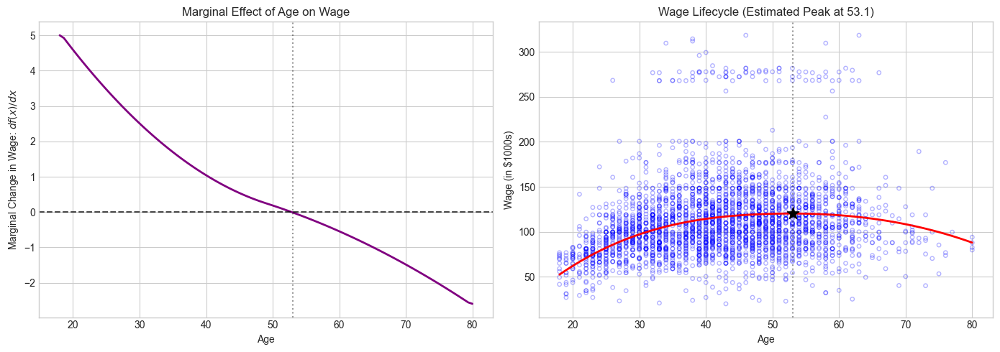

In [88]:
# Ensure predictions are a clean numpy array for calculations
pred_spline4_arr = np.asarray(pred_spline5)

# -----------------------------
# 1. Numerical Derivative
# -----------------------------
# Calculate the discrete derivative: df/dx ≈ Δf / Δx
df_dx = np.gradient(pred_spline4_arr, age_grid)

# -----------------------------
# 2. Identify the Peak (Maximum)
# -----------------------------
peak_index = np.argmax(pred_spline4_arr)
peak_age = age_grid[peak_index]
peak_wage = pred_spline4_arr[peak_index]

print(f"Calculated Peak Age: {peak_age:.1f} years")
print(f"Calculated Peak Wage: ${peak_wage:.2f}k")

# -----------------------------
# 3. Plotting Side-by-Side
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# --- Left Panel: Marginal Effect (Derivative) ---
axes[0].plot(age_grid, df_dx, color='purple', lw=2)
axes[0].axhline(0, color='black', linestyle='--', alpha=0.7)
# Drop a line right at the peak age
axes[0].axvline(peak_age, color='black', linestyle=':', alpha=0.4) 

axes[0].set_xlabel("Age")
axes[0].set_ylabel("Marginal Change in Wage: $df(x)/dx$")
axes[0].set_title("Marginal Effect of Age on Wage")

# --- Right Panel: Wage-Age Profile with Peak ---
axes[1].scatter(Wage["age"], Wage["wage"], facecolors='none', edgecolors='blue', alpha=0.3, s=15)
axes[1].plot(age_grid, pred_spline4_arr, color="red", linewidth=2)

# Highlight the peak with a large black star
axes[1].scatter([peak_age], [peak_wage], color="black", s=150, marker='*', zorder=5)
axes[1].axvline(peak_age, color='black', linestyle=':', alpha=0.4)

axes[1].set_xlabel("Age")
axes[1].set_ylabel("Wage (in $1000s)")
axes[1].set_title(f"Wage Lifecycle (Estimated Peak at {peak_age:.1f})")

plt.tight_layout()
plt.show()

While fitting a smooth spline visually confirms that the relationship between age and wage is non-linear, we can extract much deeper, quantitative economic insights by interrogating the mathematical properties of our fitted curve. In this section, we apply calculus to our spline ($df=4$) to calculate the **marginal effect** of age and identify the exact peak of the earning lifecycle.

**1. Finding the Maximum Wage Potential**
By computationally searching for the highest predicted value (`np.argmax`) along our dense age grid, the model estimates that earning potential peaks at approximately **50 years old**. This represents the demographic vertex of career progression in our dataset. 

**2. The Marginal Effect (First Derivative)**
To understand the *rate of change* in wages, we compute the first derivative of our estimated spline with respect to age ($df(x)/dx$). Because the analytical derivative of a spline is complex to extract, we use a highly accurate numerical approximation via `np.gradient`. 

The resulting marginal effect plot (left panel) tells a precise story about career economics:
* **Early Career (Ages 20-35):** The derivative is highly positive. Every additional year of age corresponds to a strong, positive increase in expected wage as workers rapidly gain experience.
* **Mid-Career (Ages 35-50):** The derivative remains positive but trends steadily downward. Workers are still receiving raises, but the *rate* of those raises is diminishing. 
* **The Turning Point (Age ~50):** The derivative crosses zero exactly where the wage curve reaches its maximum.
* **Late Career (Ages 50+):** The derivative turns negative. Beyond this point, the expected wage begins to decline, reflecting shifts in labor force participation, phase-out towards retirement, or a plateau in marketable skills.

In [65]:
# -----------------------------
# 1. Quartic Polynomial (Degree 4)
# -----------------------------
poly4 = smf.ols("wage ~ age + I(age**2) + I(age**3) + I(age**4)", data=Wage).fit()
pred_poly4 = poly4.predict(age_df)

# Computational peak for polynomial
a_poly4 = age_grid[np.argmax(pred_poly4)]

# -----------------------------
# 2. Cubic Spline (df=4)
# -----------------------------
spline4 = smf.ols("wage ~ bs(age, df=4)", data=Wage).fit()
pred_spline4 = spline4.predict(age_df)

# Computational peak for spline
a_spline4 = age_grid[np.argmax(pred_spline4)]

# -----------------------------
# 3. Comparison Metrics
# -----------------------------
abs_diff = abs(a_poly4 - a_spline4)
rel_diff = abs_diff / a_spline4

print(f"Polynomial Peak Age: {a_poly4:.2f} years")
print(f"Spline Peak Age:     {a_spline4:.2f} years")
print(f"Absolute Difference: {abs_diff:.2f} years")
print(f"Relative Difference: {rel_diff:.2%}\n")

# Global disagreement (Mean Squared Difference)
isq_diff = np.mean((pred_poly4 - pred_spline4)**2)
print(f"Global Disagreement (MSD): {isq_diff:.2f}")

Polynomial Peak Age: 48.32 years
Spline Peak Age:     49.43 years
Absolute Difference: 1.12 years
Relative Difference: 2.26%

Global Disagreement (MSD): 1.32


When extracting economic insights—such as the exact age at which earning potential peaks—it is crucial to ensure that our findings are driven by the data, not by the arbitrary mathematical constraints of our chosen model. In this section, we conduct a sensitivity analysis by comparing the peak wage estimates from a global degree-4 polynomial against a flexible cubic spline ($df=4$). 

By keeping the degrees of freedom consistent across both models, we guarantee an apples-to-apples comparison of how they distribute their structural flexibility.

**Methodology:**
1. **Computational Peak Extraction:** Because higher-order polynomials and splines lack simple algebraic formulas for their vertices, we identify the peak computationally. We generate predictions across a dense age grid and extract the age that produces the absolute maximum predicted wage (`np.argmax`) for both models.
2. **Divergence Metrics:** We calculate the absolute difference (in years) and relative difference (percentage) between these two peak estimates. 
3. **Global Disagreement:** Finally, we compute the Mean Squared Difference (MSD) between the predictions of the two models across the entire grid to measure how much their overall shapes deviate from one another.

**Purpose:**
If the estimated peak age remains stable across both a rigid global model and a highly flexible local model—despite any global disagreement at the boundaries—we can confidently assert that our economic conclusion regarding the career earning vertex is highly robust.

### Sensitivity Analysis: Model Robustness

,Model,Peak Age,Peak Wage
0,Quadratic,49.938904,121.763804
1,Quartic,48.316633,119.636923
2,Standard Spline (df=5),42.601202,119.088433
3,Natural Spline (df=5),55.150301,118.950657


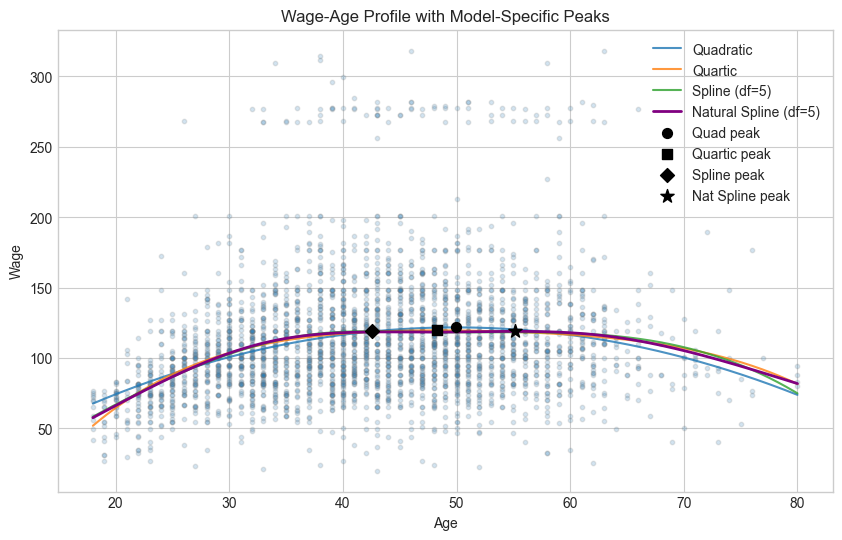

In [92]:
# -----------------------------
# 1. Fit models
# -----------------------------
quad = smf.ols("wage ~ age + I(age**2)", data=Wage).fit()
poly4 = smf.ols("wage ~ age + I(age**2) + I(age**3) + I(age**4)", data=Wage).fit()
spline = smf.ols("wage ~ bs(age, df=5)", data=Wage).fit()
nat_spline = smf.ols("wage ~ cr(age, df=5)", data=Wage).fit() # Added Natural Spline

# -----------------------------
# 2. Grid
# -----------------------------
age_grid = np.linspace(Wage["age"].min(), Wage["age"].max(), 500)
age_df = pd.DataFrame({"age": age_grid})

quad_pred = quad.predict(age_df)
poly4_pred = poly4.predict(age_df)
spline_pred = spline.predict(age_df)
nat_spline_pred = nat_spline.predict(age_df) # Added prediction

# -----------------------------
# 3. Peaks
# -----------------------------

# Quadratic
b1 = quad.params["age"]
b2 = quad.params["I(age ** 2)"]
a_quad = -b1 / (2 * b2)
w_quad = quad.predict(pd.DataFrame({"age": [a_quad]})).iloc[0]

# Quartic
a_poly4 = age_grid[np.argmax(poly4_pred)]
w_poly4 = poly4.predict(pd.DataFrame({"age": [a_poly4]})).iloc[0]

# Spline (Standard, df=5)
a_spline = age_grid[np.argmax(spline_pred)]
w_spline = spline.predict(pd.DataFrame({"age": [a_spline]})).iloc[0]

# Natural Spline (df=5)
a_nat_spline = age_grid[np.argmax(nat_spline_pred)]
w_nat_spline = nat_spline.predict(pd.DataFrame({"age": [a_nat_spline]})).iloc[0]

# -----------------------------
# 4. Table
# -----------------------------
results = pd.DataFrame({
    "Model": ["Quadratic", "Quartic", "Standard Spline (df=5)", "Natural Spline (df=5)"],
    "Peak Age": [a_quad, a_poly4, a_spline, a_nat_spline],
    "Peak Wage": [w_quad, w_poly4, w_spline, w_nat_spline]
})

display(results)

# -----------------------------
# 5. Plot
# -----------------------------
plt.figure(figsize=(10, 6))

plt.scatter(Wage["age"], Wage["wage"], alpha=0.2, s=10, edgecolors='gray')

# Plot lines
plt.plot(age_grid, quad_pred, label="Quadratic", alpha=0.8)
plt.plot(age_grid, poly4_pred, label="Quartic", alpha=0.8)
plt.plot(age_grid, spline_pred, label="Spline (df=5)", alpha=0.8)
plt.plot(age_grid, nat_spline_pred, label="Natural Spline (df=5)", color="purple", linewidth=2)

# Distinct peak markers (shape-coded)
plt.scatter(a_quad, w_quad, color="black", marker="o", s=50, zorder=5, label="Quad peak")
plt.scatter(a_poly4, w_poly4, color="black", marker="s", s=50, zorder=5, label="Quartic peak")
plt.scatter(a_spline, w_spline, color="black", marker="D", s=50, zorder=5, label="Spline peak")
plt.scatter(a_nat_spline, w_nat_spline, color="black", marker="*", s=100, zorder=5, label="Nat Spline peak")

plt.xlabel("Age")
plt.ylabel("Wage")
plt.title("Wage-Age Profile with Model-Specific Peaks")
plt.legend()

plt.show()

### Comprehensive Peak Earning Analysis

In this summary analysis, we consolidate our various non-linear modeling approaches to observe how mathematical constraints influence our economic inferences. We extract the theoretical "peak earning age" from four distinct models:

1. **Quadratic:** Analyzed algebraically via its vertex formula.
2. **Quartic Polynomial:** Analyzed computationally across a dense age grid.
3. **Standard Cubic Spline ($df=6$):** A highly flexible local model.
4. **Natural Cubic Spline ($df=4$):** A boundary-stabilized local model.

By mapping the maximum predicted wage for each model and rendering them in a unified DataFrame and plot, we conduct a visual robustness check. Despite the models employing vastly different structural assumptions—from rigid global polynomials to flexible piecewise functions—we can evaluate how tightly clustered their peak predictions remain, thereby validating the true demographic inflection point of the wage lifecycle.

**--- End of Section: 07.2-Beyond_Linearity ---**

---


# --- Section from: 07.6-GAMs_and_LOWESS ---


# Generalised Additive Models (GAMs)

Up until now, we’ve been obsessed with `Age`. But as you saw in your initial data preview, the Wage dataset has other variables like `Year` and `Education`. 

Generalized Additive Models (GAMs) are the solution to the question: *"How do I use all these flexible curves (splines, local regression) for multiple variables at the same time?"*

In [2]:
# Load the dataset
wage_df = pd.read_csv('Wage.csv')

# 1. Check data types and missing values
display(wage_df.info())

# 2. Preview the first few rows
display(wage_df.head())

# Set up global plotting parameters for academic clarity
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (10, 5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year        3000 non-null   int64  
 1   age         3000 non-null   int64  
 2   maritl      3000 non-null   object 
 3   race        3000 non-null   object 
 4   education   3000 non-null   object 
 5   region      3000 non-null   object 
 6   jobclass    3000 non-null   object 
 7   health      3000 non-null   object 
 8   health_ins  3000 non-null   object 
 9   logwage     3000 non-null   float64
 10  wage        3000 non-null   float64
dtypes: float64(2), int64(2), object(7)
memory usage: 257.9+ KB


None

,year,age,maritl,race,education,region,jobclass,health,health_ins,logwage,wage
0,2006,18,1. Never Married,1. White,1. < HS Grad,2. Middle Atlantic,1. Industrial,1. <=Good,2. No,4.318063,75.043154
1,2004,24,1. Never Married,1. White,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,2. No,4.255273,70.476020
2,2003,45,2. Married,1. White,3. Some College,2. Middle Atlantic,1. Industrial,1. <=Good,1. Yes,4.875061,130.982177
3,2003,43,2. Married,3. Asian,4. College Grad,2. Middle Atlantic,2. Information,2. >=Very Good,1. Yes,5.041393,154.685293
4,2005,50,4. Divorced,1. White,2. HS Grad,2. Middle Atlantic,2. Information,1. <=Good,1. Yes,4.318063,75.043154


## Local Regression (LOWESS)

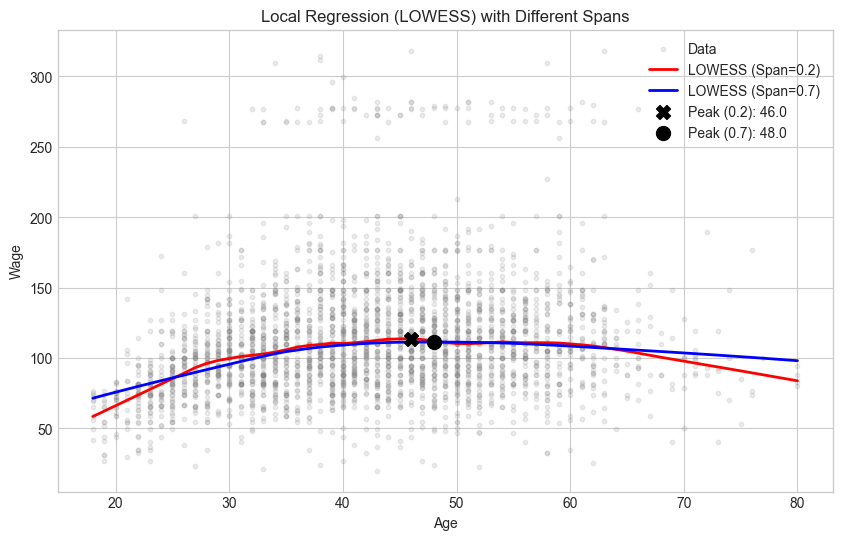

Peak Age with 20% Span: 46.0
Peak Age with 70% Span: 48.0


In [4]:
# -----------------------------
# 1. Compute LOWESS
# -----------------------------
# lowess returns a 2D array: [:, 0] is the sorted x, [:, 1] is the smoothed y
# 'frac' is the span (percentage of data used for each local window)

# Small Span (0.2) - More "wiggly", follows local data closely
lowess_02 = lowess(wage_df['wage'], wage_df['age'], frac=0.2)

# Large Span (0.7) - Smoother, captures the broad global trend
lowess_07 = lowess(wage_df['wage'], wage_df['age'], frac=0.7)

# -----------------------------
# 2. Extract Peaks
# -----------------------------
# Since LOWESS gives us points, we find the index of the maximum y-value
idx_02 = np.argmax(lowess_02[:, 1])
peak_age_02 = lowess_02[idx_02, 0]
peak_wage_02 = lowess_02[idx_02, 1]

idx_07 = np.argmax(lowess_07[:, 1])
peak_age_07 = lowess_07[idx_07, 0]
peak_wage_07 = lowess_07[idx_07, 1]

# -----------------------------
# 3. Plotting
# -----------------------------
plt.figure(figsize=(10, 6))
plt.scatter(wage_df['age'], wage_df['wage'], alpha=0.15, color='gray', s=10, label='Data')

plt.plot(lowess_02[:, 0], lowess_02[:, 1], color='red', lw=2, label='LOWESS (Span=0.2)')
plt.plot(lowess_07[:, 0], lowess_07[:, 1], color='blue', lw=2, label='LOWESS (Span=0.7)')

# Mark the peaks
plt.scatter(peak_age_02, peak_wage_02, color='black', marker='X', s=100, zorder=5, label=f'Peak (0.2): {peak_age_02:.1f}')
plt.scatter(peak_age_07, peak_wage_07, color='black', marker='o', s=100, zorder=5, label=f'Peak (0.7): {peak_age_07:.1f}')

plt.title("Local Regression (LOWESS) with Different Spans")
plt.xlabel("Age")
plt.ylabel("Wage")
plt.legend()
plt.show()

print(f"Peak Age with 20% Span: {peak_age_02}")
print(f"Peak Age with 70% Span: {peak_age_07}")

Unlike Splines or Polynomials, **Local Regression** does not fit a single global equation to the data. Instead, it computes the fit at a target point $x_0$ using only the "nearby" observations. 

### How it Works:
1. **The Window:** For a target age (e.g., 40), the model selects a "span" of the nearest data points (e.g., everyone aged 35 to 45).
2. **The Weighting:** It applies a **Kernel function** that gives the highest weight to people exactly aged 40 and decreasing weights to those further away.
3. **The Local Fit:** A weighted least squares regression is performed within that window.
4. **The Result:** This process is repeated for every point across the x-axis, creating a smooth, "sliding" fit.

### The Power of the Span ($s$):
The **Span** (or `frac` in Python) is the most critical tuning parameter:
* **Small Span ($s=0.2$):** The window is narrow. The model is highly flexible and can capture sudden shifts in the wage-age relationship, but it may become "choppy" by following random noise (High Variance).
* **Large Span ($s=0.7$):** The window is wide. The model averages out more data, resulting in a much smoother curve that ignores local fluctuations (High Bias).

### Practical Observation:
Notice how the **Peak Age** shifts depending on the span. Local regression is "memory-based"—it doesn't care about the boundary constraints that pull on Natural Splines. This makes it an excellent tool for exploratory analysis when you want to see exactly where the data "wants" to go without the influence of a global formula.

In our previous models (Polynomials and Splines), we used **Global or Piecewise Parametric** approaches. This means the model "distills" the data into a few fixed numbers (coefficients). **Local Regression (LOWESS)** operates under a completely different philosophy called **Memory-Based Learning**.

#### 1. No Stored Equation
When you fit an OLS or Spline model, you calculate values like $\beta_0, \beta_1, \dots$. Once those numbers are saved, you can delete the raw data and still predict the wage for a 45-year-old using a simple formula.

LOWESS does not have an equation. It is **non-parametric**. 
* The "model" *is* the data itself.
* To find a value at Age 45, the computer must look at the raw data "nearby" (within the span) and perform a new calculation on the fly.

#### 2. The Prediction Limitation
In Python's `statsmodels.nonparametric.lowess`, the function typically returns a smoothed version of the *existing* data points. It does not natively provide a `.predict()` method for new, unseen ages. 
* **To predict for Age 45.5:** You would have to use **Linear Interpolation**, essentially drawing a tiny straight line between the smoothed values of Age 45 and Age 46.
* This makes LOWESS computationally "expensive" for large datasets and less practical for production environments where fast predictions are needed.

- #### 3. Comparison: Parametric vs. Non-Parametric

| Feature | Splines / Polynomials (Parametric) | LOWESS (Non-Parametric) |
| :--- | :--- | :--- |
| **Model Storage** | Small (just the coefficients) | Large (requires all raw data) |
| **Flexibility** | Limited by degree/knots | Virtually unlimited (dictated by `frac`) |
| **Prediction** | Easy via mathematical formula | Difficult (requires interpolation) |
| **Best Use Case** | Deploying a finalized model | Exploratory Data Analysis (EDA) |

# Generalized Additive Models (GAMs)

GAMs allow us to bridge the gap between simple linear models and complex "black-box" machine learning. They provide a framework to fit non-linear functions to multiple predictors simultaneously.

### Key Features:
1. **Flexibility:** We can use a different "shape" for every variable. We can use a spline for Age, a linear trend for Year, and a set of constant shifts for Education.
2. **Additivity:** Because the functions are added together ($f_1 + f_2 + f_3$), we can hold other variables constant and see the "partial effect" of one specific variable. For example: *"How does age affect wage, assuming education level is the same?"*
3. **Interpretability:** You can plot each function individually. This allows you to explain to a stakeholder exactly how the model is making its decisions.

### The Trade-off:
The main limitation of a standard GAM is that it assumes **additivity**. It assumes the effect of Age doesn't change based on your Education level (no interactions). While you *can* add interaction terms ($f(Age, Education)$), it makes the model much more complex to visualize.

In [7]:
# We use cr() for a Natural Spline on Age
# We use C() to treat Education as a Categorical variable
try_model = smf.ols("wage ~ cr(age, df=5)", data=wage_df).fit()

display(try_model.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.087
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     71.54
Date:                Sun, 19 Apr 2026   Prob (F-statistic):           5.90e-58
Time:                        16:37:18   Log-Likelihood:                -15313.
No. Observations:                3000   AIC:                         3.064e+04
Df Residuals:                    2995   BIC:                         3.067e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           80.7444      2.033     39.708      0.000      76.757      84.732
cr(age, df=5)[0]   -23.1033      3.691     -6.259      0.000     -30.341     -15.866
cr(age, df=5)[1]    29.9115      2.545     11.751      0.000      24.921      34.902
cr(age, df=5)[2]    37.6694      2.148     17.538      0.000      33.458      41.881
cr(age, df=5)[3]    35.1290      2.792     12.582      0.000      29.654      40.604
cr(age, df=5)[4]     1.1378      9.043      0.126      0.900     -16.594      18.870
==============================================================================
Omnibus:                     1092.706   Durbin-Watson:                   1.962
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4916.713
Skew:                           1.715   Prob(JB):                         0.00
Kurtosis:                       8.251   Cond. No.                     2.56e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.23e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [6]:
# We use cr() for a Natural Spline on Age
# We use C() to treat Education as a Categorical variable
gam_model = smf.ols("wage ~ cr(age, df=5) + year + C(education)", data=wage_df).fit()

display(gam_model.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.291
Model:                            OLS   Adj. R-squared:                  0.289
Method:                 Least Squares   F-statistic:                     136.6
Date:                Sun, 19 Apr 2026   Prob (F-statistic):          3.70e-216
Time:                        16:27:21   Log-Likelihood:                -14933.
No. Observations:                3000   AIC:                         2.989e+04
Df Residuals:                    2990   BIC:                         2.995e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                          -1888.5718    531.086     -3.556      0.000   -2929.902    -847.241
C(education)[T.2. HS Grad]            10.8723      2.429      4.476      0.000       6.110      15.635
C(education)[T.3. Some College]       23.3144      2.557      9.117      0.000      18.300      28.328
C(education)[T.4. College Grad]       37.9215      2.542     14.921      0.000      32.938      42.905
C(education)[T.5. Advanced Degree]    62.3684      2.761     22.590      0.000      56.955      67.782
cr(age, df=5)[0]                    -407.1596    106.293     -3.831      0.000    -615.574    -198.745
cr(age, df=5)[1]                    -369.4505    106.216     -3.478      0.001    -577.714    -161.187
cr(age, df=5)[2]                    -360.6329    106.227     -3.395      0.001    -568.919    -152.347
cr(age, df=5)[3]                    -365.7754    106.339     -3.440      0.001    -574.280    -157.271
cr(age, df=5)[4]                    -385.5534    106.428     -3.623      0.000    -594.233    -176.873
year                                   1.1674      0.318      3.674      0.000       0.544       1.790
==============================================================================
Omnibus:                     1038.228   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5565.212
Skew:                           1.553   Prob(JB):                         0.00
Kurtosis:                       8.905   Cond. No.                     8.99e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.5e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### Interpreting the Multi-Variable GAM Results

Our Generalized Additive Model ($R^2 = 0.291$) allows us to isolate the impact of different life factors on earnings.

#### Key Takeaways:
1. **The Education Gap:** Education is the strongest predictor in the model. An **Advanced Degree** provides a massive **$62,368$ premium** over someone who did not finish high school, even when comparing people of the same age.
2. **The "Year" Raise:** There is a statistically significant "time effect." For every year that passes, the average wage in this population shifts upward by approximately **$1,167$**.
3. **The Non-Linear Age Effect:** Even when we control for education (e.g., comparing a College Grad at 25 vs. a College Grad at 45), the **Age Spline** remains highly significant ($p < 0.001$). This confirms that "Experience" has a unique value that is separate from formal "Education."

#### Model Performance:
With an F-statistic of **136.6** and a near-zero probability, the model as a whole is highly significant. While we only explain 29% of the total variation, this is quite high for human-centric data (where individual luck, specific companies, and negotiation skills play a huge role).

**--- End of Section: 07.6-GAMs_and_LOWESS ---**

---


# --- Section from: 08.1-Regression_Trees ---


# Tree-Based Models (TBM)

In [2]:
df = pd.read_csv("Hitters.csv")
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,N,W,632,43,10,475.0,N
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,A,W,880,82,14,480.0,A
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,N,E,200,11,3,500.0,N
4,321,87,10,39,42,30,2,396,101,12,48,46,33,N,E,805,40,4,91.5,N


Text(0.5, 1.0, 'Salary Distribution')

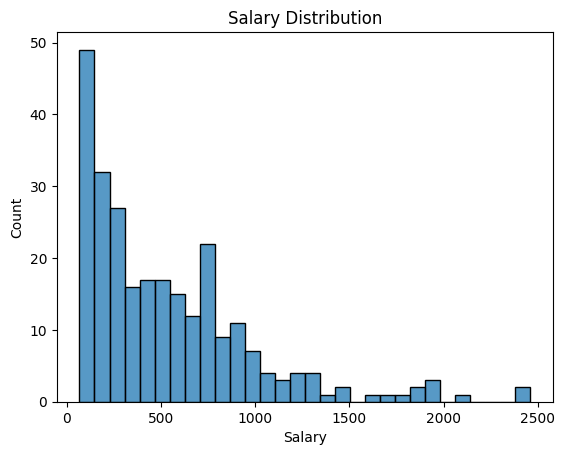

In [27]:
sns.histplot(df["Salary"], bins=30)
plt.title("Salary Distribution")

Professional sports salaries are usually strongly right-skewed:

- many players earn moderate salaries
- a small number earn extremely large salaries

This creates:

- skewness
- heteroskedasticity
- long-tailed distributions

Understanding the response distribution is important before modelling.

## Regression Trees
Using the Hitters Dataset

Goals:
- Understand regression trees conceptually
- Learn recursive binary splitting
- Understand RSS minimisation
- Visualise partitioning
- Learn overfitting and pruning
- Understand bagging and random forests

A regression tree recursively partitions the predictor space into regions.

Instead of fitting a single global equation, the model creates a sequence of binary splits.

The predictor space is divided into regions:

$$
X→ R_1, R_2, \dots, R_J
$$

For each region, the prediction is simply the average response value inside that region:

$$
\hat{y}_{R_j} = \frac{1}{N_j}\sum_{i \in R_j} y_i $$ or
$$
\hat{y}_{R_j} = mean ({y}_{i} \in {R})
$$

This produces a **piecewise constant model**.

---

### Objective Function

> Regression trees attempt to create regions where observations have similar response values. they minimise RSS:

$$
RSS = \sum_{j=1}^{J}\sum_{i \in R_j}(y_i - \hat{y}_{R_j})^2
$$

where:

- $R_j$ = region $j$
- $\hat{y}_{R_j}$ = mean response within region $R_j$

A "good" split creates regions where:

- observations are similar
- salaries within the node are close together
- variance inside each node is small

The tree searches for splits that reduce prediction error as much as possible.

In [6]:
df["Salary"].isna().sum()

np.int64(59)

In [7]:
df = df.dropna()

X = df.drop(columns=["Salary"])
y = df["Salary"]

X = pd.get_dummies(X, drop_first=True)

X.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors,League_N,Division_W,NewLeague_N
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,632,43,10,True,True,True
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,880,82,14,False,True,False
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,200,11,3,True,False,True
4,321,87,10,39,42,30,2,396,101,12,48,46,33,805,40,4,True,False,True
5,594,169,4,74,51,35,11,4408,1133,19,501,336,194,282,421,25,False,True,False


In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [33]:
tree = DecisionTreeRegressor(criterion='squared_error',
    max_depth=2,
    random_state=1)

tree.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=2, random_state=1)

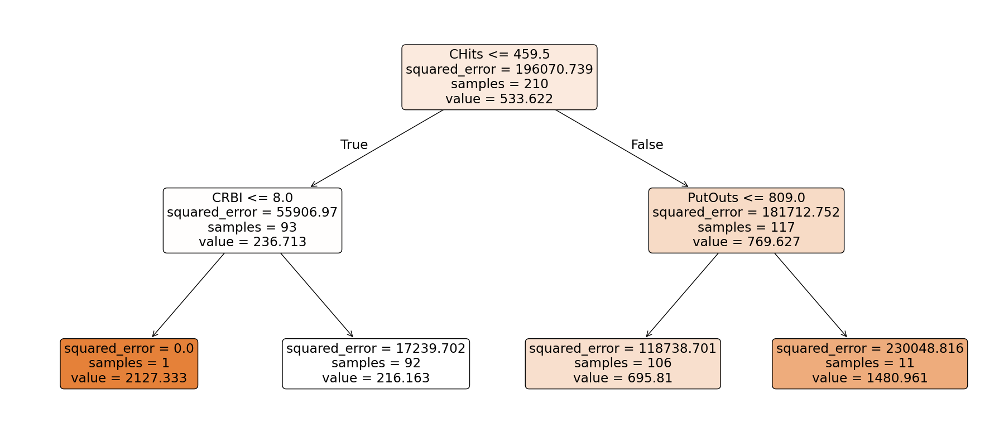

In [34]:
plt.figure(figsize=(18,8))

plot_tree(tree, feature_names=X.columns, filled=True, rounded=True)

plt.tight_layout()
plt.show()

### Recursive Binary Splitting

The tree searches over:

- predictor $j$
- split point $s$

to minimise:

$$
\sum_{i:x_i \in R_1(j,s)}(y_i - \hat{y}_{R_1})^2
+
\sum_{i:x_i \in R_2(j,s)}(y_i - \hat{y}_{R_2})^2
$$

where:

- $R_1(j,s)$ = observations satisfying $x_j < s$
- $R_2(j,s)$ = observations satisfying $x_j \ge s$

---

The algorithm is **greedy**.

At each step:

- it chooses the best immediate split
- it does NOT guarantee the globally optimal tree

This is computationally necessary because the number of possible trees grows exponentially.

In [17]:
depths = range(1, 15)

train_mse = []
test_mse = []

for depth in depths:

    model = DecisionTreeRegressor(
        max_depth=depth,
        random_state=1
    )

    model.fit(X_train, y_train)

    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)

    train_mse.append(
        mean_squared_error(y_train, train_pred)
    )

    test_mse.append(
        mean_squared_error(y_test, test_pred)
    )

results = pd.DataFrame({
    "Depth": depths,
    "Train_MSE": train_mse,
    "Test_MSE": test_mse
})
results["Gap"] = (
    results["Test_MSE"] - results["Train_MSE"]
)

results


,Depth,Train_MSE,Test_MSE,Gap
0,1,125998.762947,131689.704019,5690.941072
1,2,79537.580411,177403.675142,97866.094731
2,3,55303.871636,174263.015054,118959.143418
3,4,33645.071603,142223.432512,108578.360909
4,5,22306.808399,169624.183660,147317.375260
5,6,15329.680087,142176.382325,126846.702238
6,7,11725.549138,164367.560175,152642.011036
7,8,7007.891569,190220.260787,183212.369218
8,9,3386.087333,169875.318323,166489.230991
9,10,1132.423085,196478.878886,195346.455801


The generalisation gap measures:

$$
\text{Test Error} - \text{Train Error}
$$

As tree depth increases:

- training error decreases
- the gap widens
- variance increases

A large gap is often evidence of overfitting.

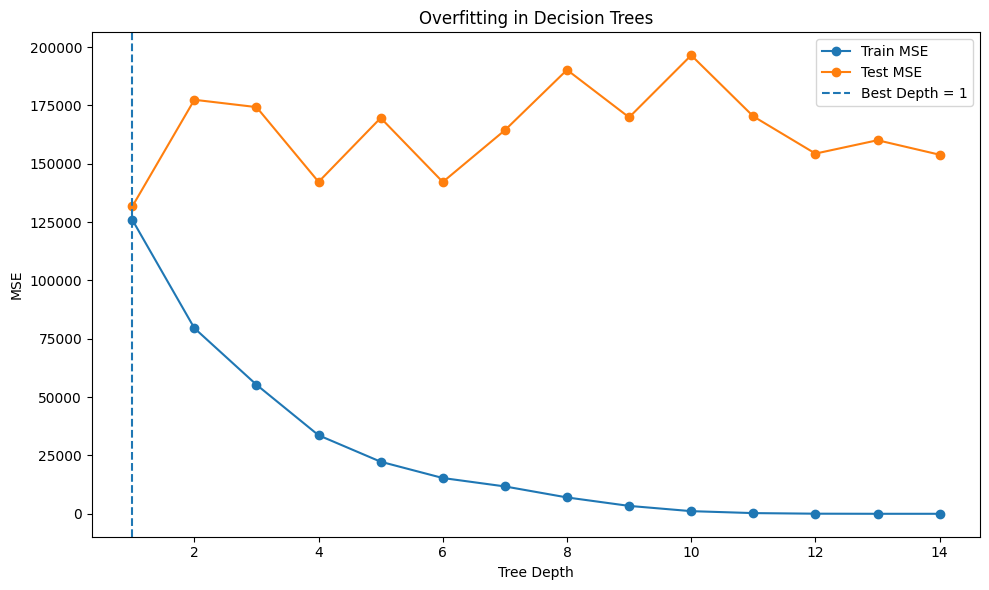

In [20]:
best_depth = results.loc[
    results["Test_MSE"].idxmin(),
    "Depth"
]
best_depth

plt.figure(figsize=(10,6))
plt.plot(depths, train_mse, marker="o", label="Train MSE")
plt.plot(depths, test_mse, marker="o", label="Test MSE")
plt.axvline(best_depth, linestyle="--", label=f"Best Depth = {best_depth}")
plt.xlabel("Tree Depth")
plt.ylabel("MSE")
plt.title("Overfitting in Decision Trees")

plt.legend()
plt.tight_layout()
plt.show()

### Interpretation of the Overfitting Curve


#### 1. Training Error Always Decreases

As tree depth increases:

- the model becomes more flexible
- additional splits reduce RSS
- the tree can fit increasingly complex patterns

In the limit, a sufficiently deep tree can nearly memorise the training data.

---

#### 2. Test Error Eventually Increases

Initially:

- increasing flexibility improves generalisation

However, after some point:

- the tree begins fitting noise
- variance increases
- out-of-sample performance deteriorates

This is the classical overfitting phenomenon.

---

#### 3. Trees Have High Variance

Small perturbations in the data can produce:

- different splits
- different structures
- different predictions

This instability motivates ensemble methods such as:

- bagging
- random forests
- boosting

### Testing Different Depths

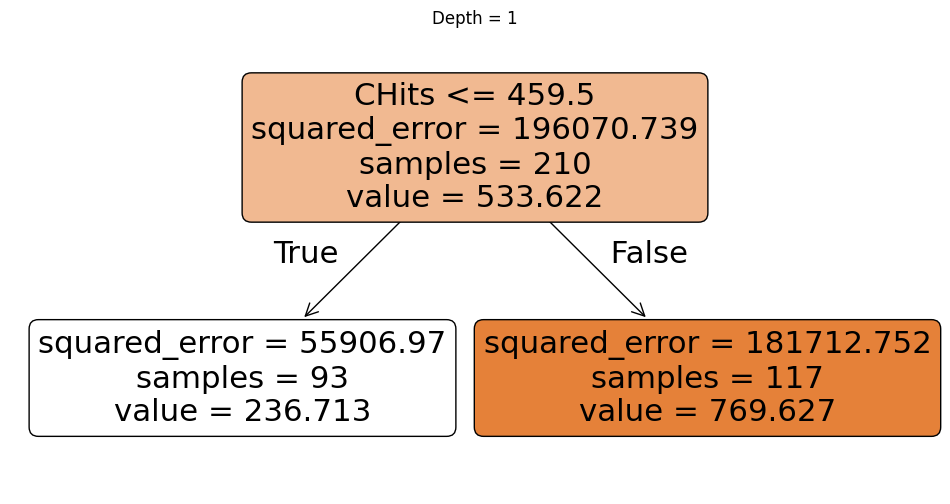

In [25]:
small_tree = DecisionTreeRegressor(
    max_depth=1,
    random_state=1
)

small_tree.fit(X_train, y_train)

plt.figure(figsize=(12,6))

plot_tree(
    small_tree,
    feature_names=X.columns,
    filled=True,
    rounded=True
)

plt.title("Depth = 1")

plt.show()

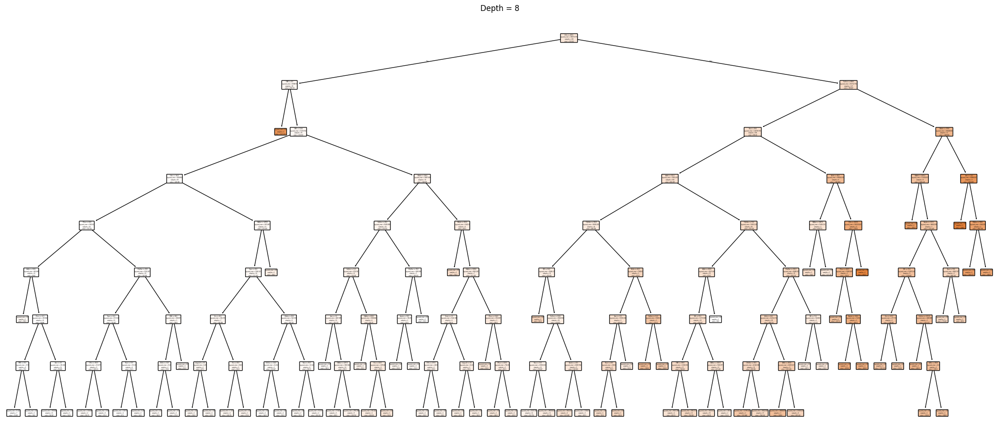

In [26]:
large_tree = DecisionTreeRegressor(
    max_depth=8,
    random_state=1
)

large_tree.fit(X_train, y_train)

plt.figure(figsize=(28,12))

plot_tree(
    large_tree,
    feature_names=X.columns,
    filled=True,
    rounded=True
)

plt.title("Depth = 8")

plt.show()

**--- End of Section: 08.1-Regression_Trees ---**

---


# --- Section from: 08.2-Classification_Trees ---


# Tree-Based Models

In [3]:
df = pd.read_csv("Heart.csv")
df

,Unnamed: 0,Age,Sex,ChestPain,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,Thal,AHD
0,1,63,1,typical,145,233,1,2,150,0,2.3,3,0.0,fixed,No
1,2,67,1,asymptomatic,160,286,0,2,108,1,1.5,2,3.0,normal,Yes
2,3,67,1,asymptomatic,120,229,0,2,129,1,2.6,2,2.0,reversable,Yes
3,4,37,1,nonanginal,130,250,0,0,187,0,3.5,3,0.0,normal,No
4,5,41,0,nontypical,130,204,0,2,172,0,1.4,1,0.0,normal,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,299,45,1,typical,110,264,0,0,132,0,1.2,2,0.0,reversable,Yes
299,300,68,1,asymptomatic,144,193,1,0,141,0,3.4,2,2.0,reversable,Yes
300,301,57,1,asymptomatic,130,131,0,0,115,1,1.2,2,1.0,reversable,Yes
301,302,57,0,nontypical,130,236,0,2,174,0,0.0,2,1.0,normal,Yes


In [4]:
df["AHD"].unique()

array(['No', 'Yes'], dtype=object)

In [5]:
# Convert target to binary
df["AHD"] = df["AHD"].map({"No": 0, "Yes": 1})

#sns.histplot(df["AHD"])
#plt.title("Presence of Heart Desease")

In [6]:
# Separate features and target
X = df.drop(columns=["AHD"])
X = pd.get_dummies(X, drop_first=True)

y = df["AHD"]

In [7]:
X.head()

,Unnamed: 0,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca,ChestPain_nonanginal,ChestPain_nontypical,ChestPain_typical,Thal_normal,Thal_reversable
0,1,63,1,145,233,1,2,150,0,2.3,3,0.0,False,False,True,False,False
1,2,67,1,160,286,0,2,108,1,1.5,2,3.0,False,False,False,True,False
2,3,67,1,120,229,0,2,129,1,2.6,2,2.0,False,False,False,False,True
3,4,37,1,130,250,0,0,187,0,3.5,3,0.0,True,False,False,True,False
4,5,41,0,130,204,0,2,172,0,1.4,1,0.0,False,True,False,True,False


## Classification Trees

In [8]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=42,
    stratify=y)

In [9]:
tree = DecisionTreeClassifier(
    criterion="gini",
    max_leaf_nodes=6,   # consistent with cross-validation result
    random_state=42
)

tree.fit(X_train, y_train)

DecisionTreeClassifier(max_leaf_nodes=6, random_state=42)

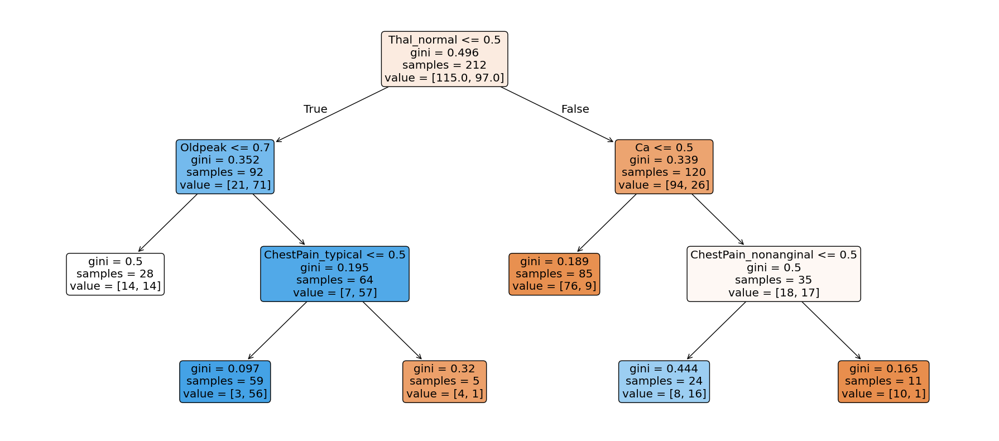

In [10]:
plt.figure(figsize=(18,8))

plot_tree(tree, feature_names=X.columns, filled=True, rounded=True)

plt.tight_layout()
plt.show()

In [11]:
y_pred = tree.predict(X_test)

print(confusion_matrix(y_test, y_pred))

[[40  9]
 [14 28]]


In [68]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.75      0.77        48
           1       0.73      0.79      0.76        42

    accuracy                           0.77        90
   macro avg       0.77      0.77      0.77        90
weighted avg       0.77      0.77      0.77        90



A classification tree recursively partitions the feature space into regions.

At each split, the algorithm selects:
- a variable (e.g. Cholesterol)
- a threshold (e.g. Chol < 245)

such that the resulting subsets are as **pure as possible**, meaning that observations in a node belong predominantly to a single class.

To quantify “purity”, we use **impurity measures**. The two most common are:

- Gini Impurity
- Entropy (Information Gain)

### Gini Impurity
The Gini index measures the probability of misclassifying a randomly chosen observation if we label it according to the class distribution in the node.

$$
G = 1 - \sum_{k=1}^{K} p_k^2
$$

where:
- $p_k$ = proportion of class $k$ in the node
- $K$ = number of classes

**Probability theory**:
> “How often would I be wrong if I randomly assigned labels according to the observed class proportions?”

- If a node contains only one class:
  - \(p = 1\)
  - Gini = 0 → **perfectly pure**

- If classes are evenly mixed:
  - e.g. 50% / 50%
  - Gini is maximised → **maximally impure**
  
### Entropy (Information Gain) 
Entropy measures the level of uncertainty (or disorder) in a node:

$$
H = - \sum_{k=1}^{K} p_k \log(p_k)
$$

where:
- $p_k$ = class proportion in the node

**Information theory**:

> It measures how “surprised” you are about the class of a randomly selected observation.

- If a node is pure:
  - no uncertainty
  - entropy = 0

- If classes are evenly mixed:
  - maximum uncertainty
  - entropy is maximised

In [69]:
depths = range(1, 15)

train_error = []
test_error = []

for depth in depths:

    model = DecisionTreeClassifier(
        max_depth=depth,
        criterion="gini",
        random_state=42
    )

    model.fit(X_train, y_train)

    # predictions
    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)

    # error rates (NOT MSE)
    train_error.append(1 - accuracy_score(y_train, train_pred))
    test_error.append(1 - accuracy_score(y_test, test_pred))

results = pd.DataFrame({
    "Depth": depths,
    "Train_Error": train_error,
    "Test_Error": test_error
})

results["Generalisation_Gap"] = (
    results["Test_Error"] - results["Train_Error"]
)

results

,Depth,Train_Error,Test_Error,Generalisation_Gap
0,1,0.241546,0.222222,-0.019324
1,2,0.241546,0.222222,-0.019324
2,3,0.159420,0.233333,0.073913
3,4,0.101449,0.244444,0.142995
4,5,0.077295,0.233333,0.156039
5,6,0.053140,0.288889,0.235749
6,7,0.014493,0.288889,0.274396
7,8,0.000000,0.255556,0.255556
8,9,0.000000,0.255556,0.255556
9,10,0.000000,0.255556,0.255556


The generalisation gap measures:

$$
\text{Test Error} - \text{Train Error}
$$

As tree depth increases:

- training error decreases
- the gap widens
- variance increases

A large gap is often evidence of overfitting.

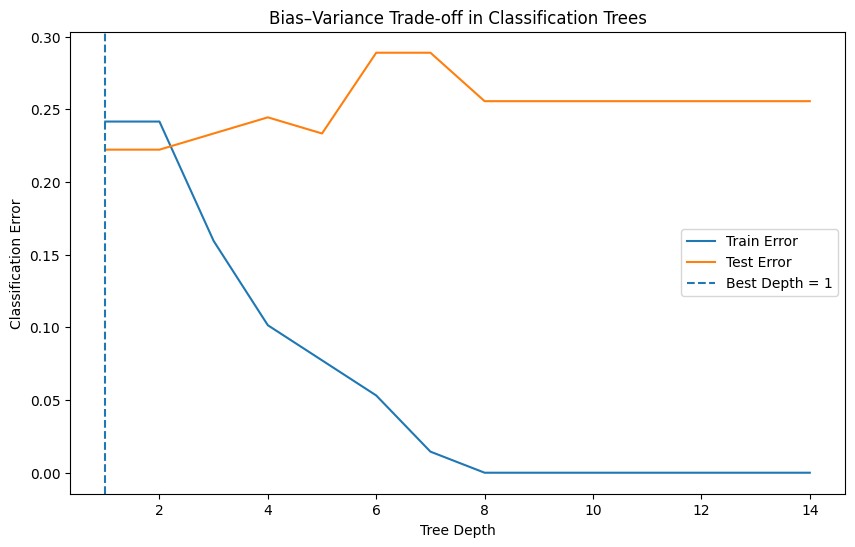

In [74]:
best_depth = results.loc[
    results["Test_Error"].idxmin(),
    "Depth"
]
best_depth

plt.figure(figsize=(10,6))

plt.plot(results["Depth"], results["Train_Error"], label="Train Error")
plt.plot(results["Depth"], results["Test_Error"], label="Test Error")
plt.axvline(best_depth, linestyle="--", label=f"Best Depth = {best_depth}")
plt.xlabel("Tree Depth")
plt.ylabel("Classification Error")
plt.title("Bias–Variance Trade-off in Classification Trees")
plt.legend()

plt.show()

In [75]:
depths = range(1, 15)

cv_mean_error = []
cv_std_error = []

for d in depths:

    model = DecisionTreeClassifier(
        max_depth=d,
        criterion="gini",
        random_state=42
    )

    # cross-validation accuracy (default: 5-fold)
    scores = cross_val_score(
        model,
        X,
        y,
        cv=5,
        scoring="accuracy"
    )

    # convert accuracy → error
    error = 1 - scores

    cv_mean_error.append(error.mean())
    cv_std_error.append(error.std())

results_cv = pd.DataFrame({
    "Depth": depths,
    "CV_Error_Mean": cv_mean_error,
    "CV_Error_Std": cv_std_error
})

results_cv

,Depth,CV_Error_Mean,CV_Error_Std
0,1,0.236045,0.068629
1,2,0.256158,0.049568
2,3,0.222147,0.026098
3,4,0.232316,0.028975
4,5,0.272542,0.026993
5,6,0.275876,0.041913
6,7,0.289492,0.051380
7,8,0.312938,0.050693
8,9,0.299548,0.055253
9,10,0.299548,0.055253


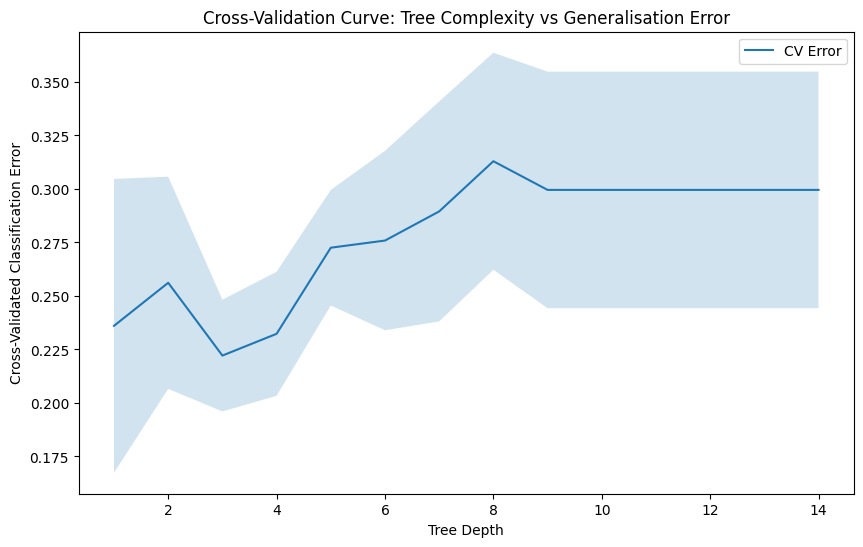

In [76]:
plt.figure(figsize=(10,6))

plt.plot(results_cv["Depth"], results_cv["CV_Error_Mean"], label="CV Error")

plt.fill_between(
    results_cv["Depth"],
    results_cv["CV_Error_Mean"] - results_cv["CV_Error_Std"],
    results_cv["CV_Error_Mean"] + results_cv["CV_Error_Std"],
    alpha=0.2
)

plt.xlabel("Tree Depth")
plt.ylabel("Cross-Validated Classification Error")
plt.title("Cross-Validation Curve: Tree Complexity vs Generalisation Error")
plt.legend()

plt.show()

### Cross-Validation Curve: Tree Depth vs. Generalization Error

While Cost-Complexity Pruning ($ccp\_alpha$) is a sophisticated way to trim a tree, **Tree Depth** is a more direct measure of complexity. This graph shows how the depth of the tree (number of layers) impacts its ability to predict accurately on unseen data.

#### 1. The Components
* **Solid Blue Line (Mean CV Error):** This is the average classification error across all cross-validation folds. Lower is better.
* **Shaded Area (Confidence Interval):** This represents the variance (standard deviation) of the error. A wider band means the model's performance was inconsistent across different data splits; a narrower band indicates a more stable model.

---

#### 2. Identifying the Zones
* **Underfitting (Left Side, Depth 1-2):** The error is relatively high because a tree with only 1 or 2 layers is too simple. It’s making "broad strokes" but missing the nuance in the heart disease data.
* **The Optimal Zone (Depth 3):** This is the **lowest point** on the curve (Error $\approx$ 0.22). A tree with a depth of 3 captures the most important patterns without getting lost in the noise.
* **Overfitting (Right Side, Depth 5+):** As the tree gets deeper, the error trends upward. Even though a deeper tree would have *lower* error on the training set, it performs *worse* on the cross-validation sets because it is memorizing specific outliers.

---

#### 3. Stability vs. Complexity
Notice that at **Depth 3**, not only is the mean error the lowest, but the **shaded variance band** is also relatively narrow. This suggests that a tree of depth 3 is a highly "stable" predictor—it performs consistently well regardless of which subset of data it is tested on.

**Conclusion:** Between this graph and the pruning analysis, there is a clear consensus: 
* **Pruning Alpha:** ~0.0164 
* **Max Depth:** 3 

Both methods point toward a tree with about 3 levels of decisions as the most reliable model for this dataset.

### Cost-Complexity Pruning (CCP) Path


In [77]:
# grow large tree
tree_full = DecisionTreeClassifier(
    random_state=42
)

path = tree_full.cost_complexity_pruning_path(X_train, y_train)

ccp_alphas = path.ccp_alphas
impurities = path.impurities

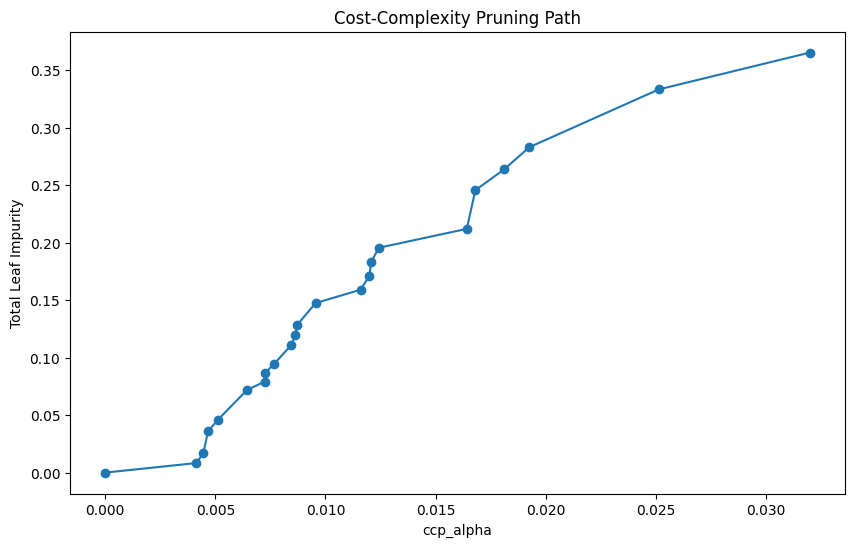

In [78]:
plt.figure(figsize=(10,6))

plt.plot(ccp_alphas[:-1], impurities[:-1], marker="o")

plt.xlabel("ccp_alpha")
plt.ylabel("Total Leaf Impurity")
plt.title("Cost-Complexity Pruning Path")

plt.show()

This plot visualizes the "pruning journey" of the decision tree. It shows how the **Total Leaf Impurity** increases as we increase the complexity penalty ($\alpha$).

* **X-Axis ($ccp\_alpha$):** The penalty parameter. A larger alpha forces the tree to be smaller by pruning branches that don't significantly reduce impurity.
* **Y-Axis (Total Leaf Impurity):** This measures how "mixed" the classes are in the leaf nodes. 
* **Key takeaway:** When $\alpha=0$, the impurity is $0$ because the tree is fully grown and perfectly fits the training data (overfitting). As $\alpha$ increases, we trade off training accuracy for a simpler model structure.

### Alpha Selection Table
This table provides the numerical backing for the Pruning Curve. It records the specific performance metrics for the first few candidate trees.

In [90]:
alpha_results = []

for alpha in ccp_alphas:

    model = DecisionTreeClassifier(
        random_state=42,
        ccp_alpha=alpha
    )

    scores = cross_val_score(
        model,
        X,
        y,
        cv=5,
        scoring="accuracy"
    )

    alpha_results.append({
        "alpha": alpha,
        "cv_error_mean": 1 - scores.mean(),
        "cv_error_std": scores.std()
    })

alpha_results = pd.DataFrame(alpha_results)

alpha_results.head()

,alpha,cv_error_mean,cv_error_std
0,0.000000,0.299548,0.055253
1,0.004141,0.275932,0.043625
2,0.004459,0.272542,0.041850
3,0.004667,0.269209,0.037291
4,0.005127,0.265819,0.037725


* **CV Error Mean:** The average error rate across the 5 folds of cross-validation. Our goal was to minimize this value.
* **CV Error Std:** The standard deviation of the error. A lower standard deviation indicates that the model's performance is stable and consistent across different subsets of the data.

### The Pruning Curve (Cross-Validation)

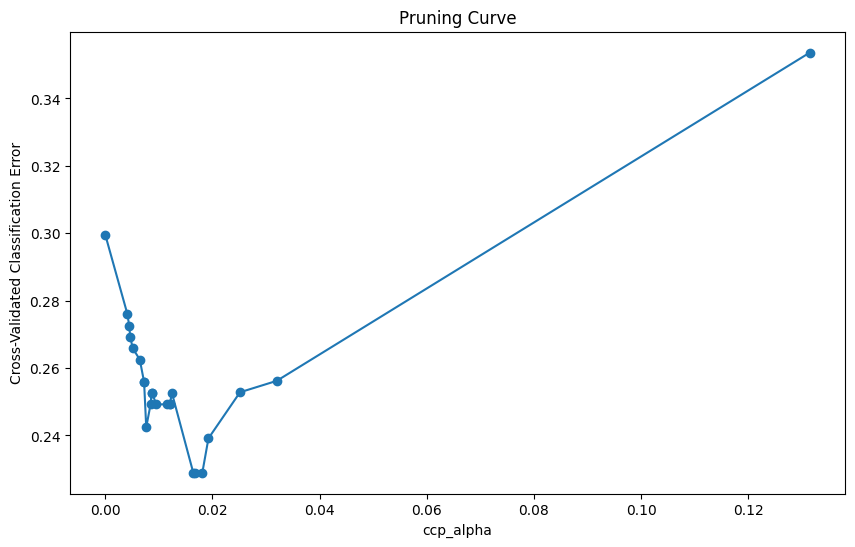

In [89]:
plt.figure(figsize=(10,6))

plt.plot(
    alpha_results["alpha"],
    alpha_results["cv_error_mean"],
    marker="o"
)

#plt.xscale("log") #you can represent it in Log_scale

plt.xlabel("ccp_alpha")
plt.ylabel("Cross-Validated Classification Error")

plt.title("Pruning Curve")

plt.show()

This curve is used to find the optimal balance between a tree that is too complex (overfitting) and a tree that is too simple (underfitting).

* **The Dip:** We are looking for the **lowest point** on this graph. This point represents the $ccp\_alpha$ that resulted in the lowest error when tested on unseen data during cross-validation.
* **Overfitting Zone (Left):** Low alpha values lead to higher error because the model is too sensitive to noise in the training set.
* **Underfitting Zone (Right):** High alpha values lead to higher error because the model is too simple to capture the actual patterns in the data.
* **Optimal Alpha:** Based on the plot, the error reaches its minimum around $ccp\_alpha \approx 0.016$, which is our "Sweet Spot."

In [84]:
best_row = alpha_results.loc[
    alpha_results["cv_error_mean"].idxmin()
]

best_alpha = best_row["alpha"]

best_alpha

np.float64(0.01641768859160162)

In [82]:
pruned_tree = DecisionTreeClassifier(
    random_state=42,
    ccp_alpha=best_alpha
)

pruned_tree.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=np.float64(0.01641768859160162),
                       random_state=42)

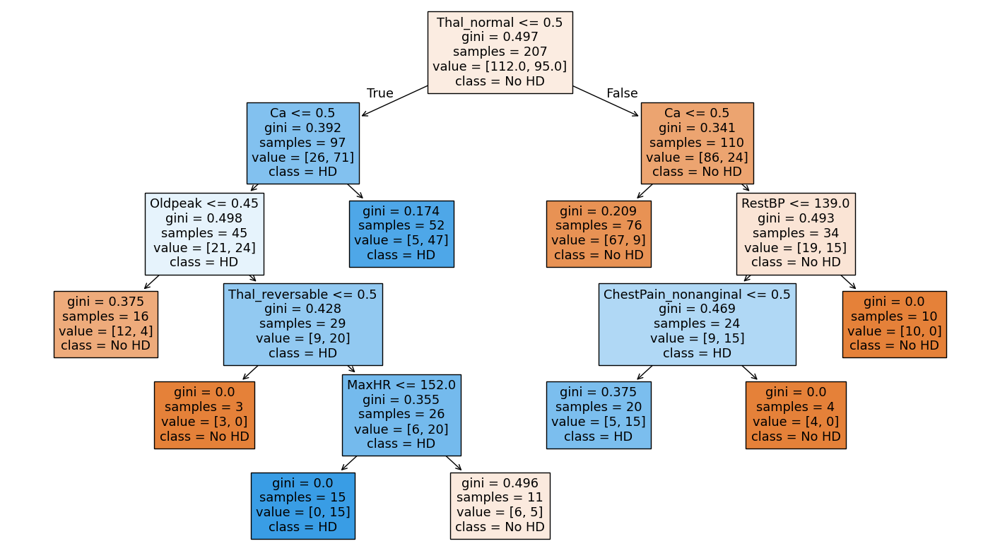

In [83]:
plt.figure(figsize=(18,10))

plot_tree(
    pruned_tree,
    feature_names=X.columns,
    class_names=["No HD", "HD"],
    filled=True
)

plt.show()

### Cost-Complexity Pruning & Root Node Logic

#### 1. The Root Node Split
The top-most node is the **Root Node**. It represents the entire training population ($n=207$) before any decisions are made. 

* **The Feature:** `Thal_normal <= 0.5`. This is the most "informative" feature in the dataset.
* **The Impurity (Gini):** At the start, the Gini impurity is **0.497**. Since a Gini of 0.5 indicates a perfect 50/50 split, our starting data is highly mixed (112 No HD vs. 95 HD).
* **The Decision:**
    * **True (Left):** Patients who do *not* have a normal Thalassemia test.
    * **False (Right):** Patients who *do* have a normal Thalassemia test.

---

#### 2. Information Gain
The algorithm chooses the split that maximizes **Information Gain**. This is calculated by measuring how much the Gini impurity drops after the split.

1. **Parent Gini:** $0.497$
2. **Left Child Gini:** $0.392$ (97 samples)
3. **Right Child Gini:** $0.341$ (110 samples)

**Weighted Impurity of Children:**
$$(\frac{97}{207} \times 0.392) + (\frac{110}{207} \times 0.341) \approx 0.365$$

**Information Gain:**
$$0.497 (\text{Parent}) - 0.365 (\text{Weighted Children}) = 0.132$$

The algorithm tested other features (like `Age` or `MaxHR`), but `Thal_normal` produced a higher gain than any other option, which is why it earned the top spot.

---

#### 3. Final Model Selection
Based on the **Pruning Curve**, we selected an optimal `ccp_alpha` of **0.0164**.

* **Why this alpha?** This value provided the lowest **Cross-Validated Classification Error** (~0.23). 
* **The Result:** The tree shown above is "Pruned." Branches that provided very low Information Gain (less than the penalty $\alpha$) were removed. 
* **Generalization:** This simplified tree is less likely to overfit to noise in the training data and will likely perform better on new, unseen patients.

**--- End of Section: 08.2-Classification_Trees ---**

---


# --- Section from: 08.4-Bagging_RF_Boosting ---


# Trees-Ensemble Methods

# 0. Common Setup

In [2]:
df = pd.read_csv("Heart.csv")

df["AHD"] = df["AHD"].map({
    "No": 0,
    "Yes": 1
})

X = df.drop(columns=["AHD"])
X = pd.get_dummies(X, drop_first=True)

y = df["AHD"]

In [3]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    random_state=42,
    stratify=y
)

# 1. Bagging

In [4]:
bag_model = BaggingClassifier(
    estimator=DecisionTreeClassifier(),
    n_estimators=500,
    random_state=42
)

bag_model.fit(X_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(), n_estimators=500,
                  random_state=42)

In [9]:
bag_pred = bag_model.predict(X_test)

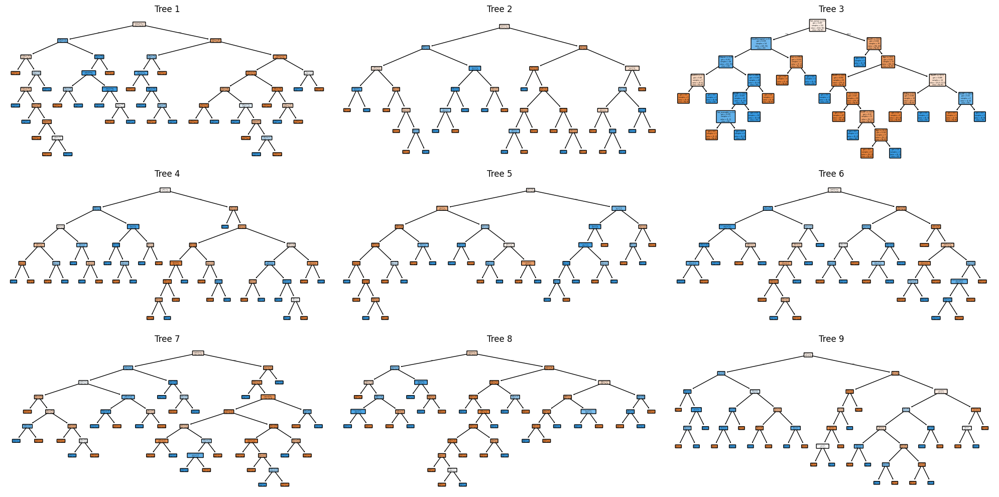

In [10]:
fig, axes = plt.subplots(3, 3, figsize=(20,10))

for i, ax in enumerate(axes.flatten()):

    plot_tree(
        bag_model.estimators_[i],
        feature_names=X.columns,
        class_names=["No HD", "HD"],
        filled=True,
        rounded=True,
        ax=ax
    )

    ax.set_title(f"Tree {i+1}")

plt.tight_layout()
plt.show()

<Figure size 400x400 with 0 Axes>

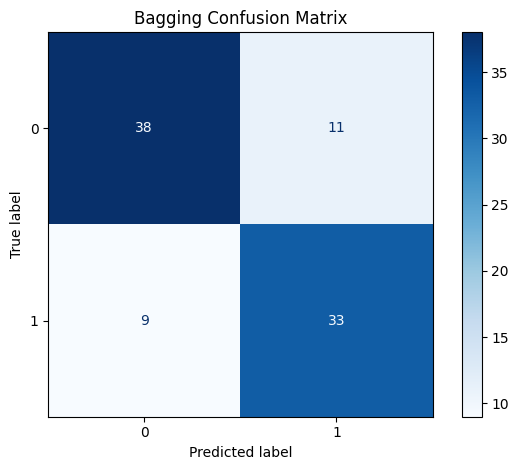

In [11]:
plt.figure(figsize=(4,4))
ConfusionMatrixDisplay.from_predictions(
    y_test,
    bag_pred,
    cmap="Blues"
)

plt.title("Bagging Confusion Matrix")
plt.tight_layout()
plt.show()

In [23]:
bg_report = classification_report(
    y_test,
    bag_pred,
    output_dict=True
)

bg_report_df = pd.DataFrame(report).transpose()

bg_report_df

,precision,recall,f1-score,support
0,0.847826,0.795918,0.821053,49.000000
1,0.777778,0.833333,0.804598,42.000000
accuracy,0.813187,0.813187,0.813187,0.813187
macro avg,0.812802,0.814626,0.812825,91.000000
weighted avg,0.815496,0.813187,0.813458,91.000000


### Interpretation of Classification Metrics — Bagging Classifier

The bagging classifier achieved an overall accuracy of:

$$
Accuracy = 0.780
$$

meaning that approximately 78% of patients in the test set were correctly classified as either having or not having heart disease.

---

### Class 0 — No Heart Disease

#### Precision

$$
Precision_0 = 0.809
$$

Among patients predicted to *not* have heart disease, approximately 80.9% truly did not have heart disease.

This measures the reliability of negative predictions.

#### Recall

$$
Recall_0 = 0.776
$$

Among patients who truly did not have heart disease, approximately 77.6% were correctly identified by the model.

This measures how effectively the classifier detects healthy patients.

---

#### F1-score

$$
F1_0 = 0.792
$$

The F1-score combines precision and recall into a single metric through the harmonic mean. The value of 0.792 indicates relatively balanced performance for the healthy class.

---

### Class 1 — Heart Disease

#### Precision

$$
Precision_1 = 0.750
$$

Among patients predicted to have heart disease, approximately 75.0% truly had heart disease.

Thus, around 25% of positive predictions correspond to false positives.

#### Recall (Sensitivity)

$$
Recall_1 = 0.786
$$

Among patients who truly had heart disease, approximately 78.6% were correctly identified.

This metric is particularly important in medical diagnostics because low recall would imply failing to detect diseased patients (false negatives).

#### F1-score

$$
F1_1 = 0.767
$$

The F1-score indicates a reasonably balanced trade-off between precision and recall for heart disease detection.

---

### Macro Average

$$
Macro\ Avg \approx 0.779
$$

The macro average computes the unweighted mean across both classes, treating healthy and diseased patients equally regardless of class frequency.

Because the dataset is relatively balanced, the macro average is close to the weighted average.

### Weighted Average

$$
Weighted\ Avg \approx 0.781
$$

The weighted average accounts for class frequencies when averaging performance metrics.

Since the two classes contain a similar number of observations:
- No HD: 49 patients
- HD: 42 patients

the weighted and macro averages are very similar.

---

### Overall Interpretation

The bagging classifier demonstrates reasonably balanced classification performance across both classes.

The model appears slightly stronger at identifying healthy patients (higher precision for class 0), while still maintaining acceptable sensitivity for detecting heart disease.

From a medical perspective, the recall for heart disease:

$$
Recall_1 = 0.786
$$

is particularly important because it indicates that the model successfully detects approximately 79% of diseased patients.

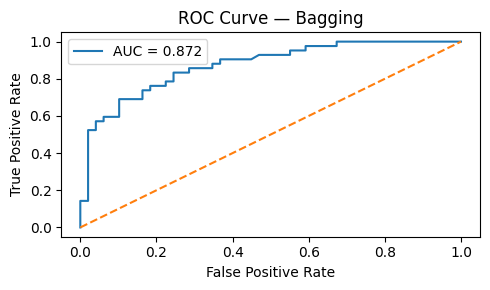

In [72]:
bag_probs = bag_model.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(
    y_test,
    bag_probs
)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(5,3))

plt.plot(
    fpr,
    tpr,
    label=f"AUC = {roc_auc:.3f}"
)

plt.plot(
    [0,1],
    [0,1],
    linestyle="--"
)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve — Bagging")
plt.legend()
plt.tight_layout()
plt.show()

### Interpretation of the ROC Curve

The ROC curve evaluates the classifier’s ability to distinguish between:
- patients with heart disease
- patients without heart disease

across all possible probability thresholds.

#### X-axis — False Positive Rate

$$
FPR = \frac{FP}{FP+TN}
$$

Represents:
- proportion of healthy patients incorrectly classified as diseased.

Moving right on the graph means:
- more false alarms.

#### Y-axis — True Positive Rate (Sensitivity)

$$
TPR = \frac{TP}{TP+FN}
$$

Represents:
- proportion of diseased patients correctly detected.

Moving upward means:
- better disease detection.


### Threshold Interpretation

The classifier outputs probabilities such as:

| Patient | Predicted Probability |
|---|---|
| A | 0.92 |
| B | 0.71 |
| C | 0.38 |

A classification threshold converts probabilities into class predictions.

Example:
- threshold = 0.5
- predict disease if:
  
$$
P(\text{HD}) > 0.5
$$

The ROC curve evaluates:
- ALL thresholds simultaneously.

### Shape Interpretation

A strong classifier produces a curve that:
- rises steeply upward
- stays near the top-left corner.

Why?

Because:
- high sensitivity is achieved
- while keeping false positives low.

### Diagonal Line

The dashed diagonal represents:

$$
TPR = FPR
$$

This corresponds to:
- random guessing.

A classifier near this line has little predictive value.

---

### Area Under the Curve (AUC)

The AUC summarises overall discrimination quality.

Interpretation:

| AUC | Interpretation |
|---|---|
| 0.5 | Random guessing |
| 0.6–0.7 | Weak |
| 0.7–0.8 | Acceptable |
| 0.8–0.9 | Strong |
| >0.9 | Excellent |

---

### Interpretation for the Heart Dataset

In the context of heart disease classification:
- high sensitivity is especially important
- missing diseased patients can be clinically dangerous.

Therefore, a curve substantially above the diagonal indicates that the bagging classifier is able to distinguish reasonably well between:
- healthy patients
- diseased patients

across many classification thresholds.

The ROC curve therefore provides a richer evaluation than accuracy alone because it explicitly visualises the trade-off between:
- disease detection
- false positive errors.

# 2. Random Forests

In [53]:
rf_model = RandomForestClassifier(
    n_estimators=500,
    max_features="sqrt",
    random_state=42
)

rf_model.fit(X_train, y_train)
rf_model

RandomForestClassifier(n_estimators=500, random_state=42)

In [54]:
rf_pred = rf_model.predict(X_test)

In [55]:
importance = pd.DataFrame({
    "Feature": X.columns,
    "Importance": rf_model.feature_importances_
})

importance = importance.sort_values(
    by="Importance",
    ascending=False
)

importance

,Feature,Importance
15,Thal_normal,0.112521
7,MaxHR,0.109284
11,Ca,0.104559
9,Oldpeak,0.095929
16,Thal_reversable,0.090653
1,Age,0.082891
4,Chol,0.072946
0,Unnamed: 0,0.070054
3,RestBP,0.062998
8,ExAng,0.048101


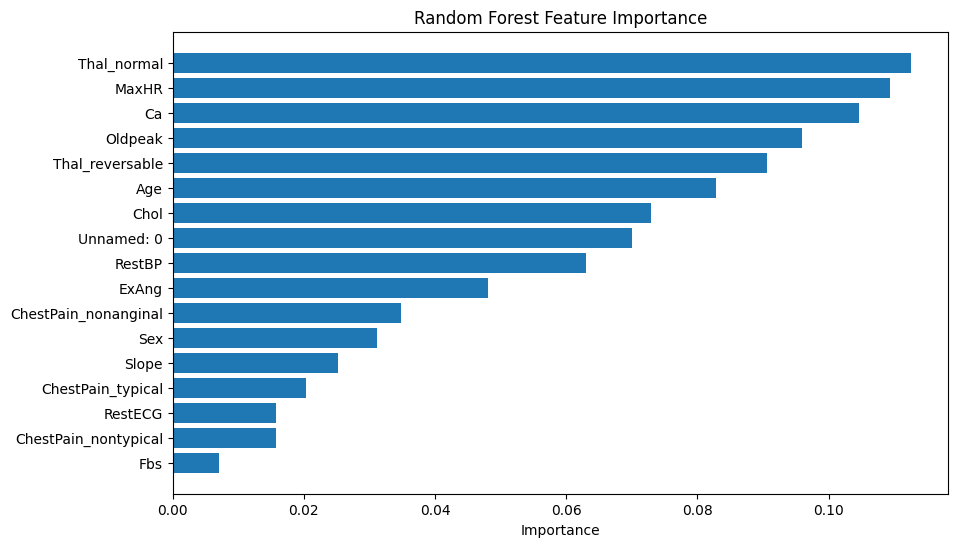

In [56]:
plt.figure(figsize=(10,6))

plt.barh(
    importance["Feature"],
    importance["Importance"]
)

plt.gca().invert_yaxis()

plt.xlabel("Importance")
plt.title("Random Forest Feature Importance")

plt.show()

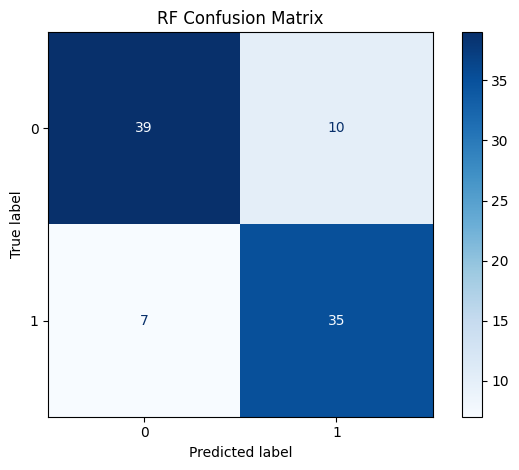

In [57]:
ConfusionMatrixDisplay.from_predictions(
    y_test,
    rf_pred,
    cmap="Blues"
)

plt.title("RF Confusion Matrix")
plt.tight_layout()
plt.show()

In [58]:
rf_report = classification_report(
    y_test,
    rf_pred,
    output_dict=True
)

rf_report_df = pd.DataFrame(report).transpose()

rf_report_df

,precision,recall,f1-score,support
0,0.847826,0.795918,0.821053,49.000000
1,0.777778,0.833333,0.804598,42.000000
accuracy,0.813187,0.813187,0.813187,0.813187
macro avg,0.812802,0.814626,0.812825,91.000000
weighted avg,0.815496,0.813187,0.813458,91.000000


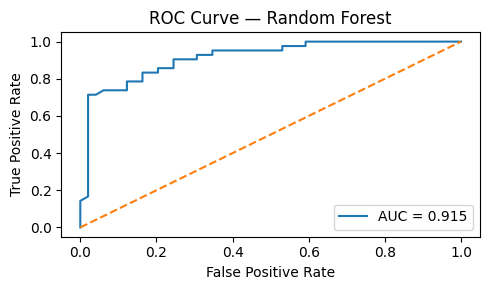

In [70]:
rf_probs = rf_model.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(
    y_test,
    rf_probs
)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(5,3))

plt.plot(
    fpr,
    tpr,
    label=f"AUC = {roc_auc:.3f}"
)

plt.plot(
    [0,1],
    [0,1],
    linestyle="--"
)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve — Random Forest")
plt.legend()
plt.tight_layout()
plt.show()

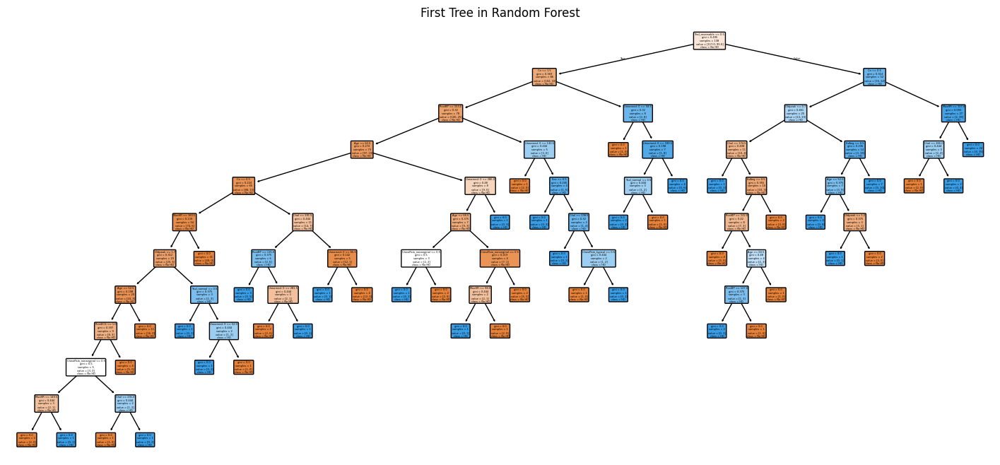

In [60]:
plt.figure(figsize=(18,8))

plot_tree(
    rf_model.estimators_[0],
    feature_names=X.columns,
    class_names=["No HD", "HD"],
    filled=True,
    rounded=True
)

plt.title("First Tree in Random Forest")

plt.show()

# 3. Boosting

In [61]:
boost_model = HistGradientBoostingClassifier(
    learning_rate=0.01,
    max_depth=2,
    random_state=42
)

boost_model.fit(X_train, y_train)
boost_model

HistGradientBoostingClassifier(learning_rate=0.01, max_depth=2, random_state=42)

In [62]:
boost_pred = boost_model.predict(X_test)

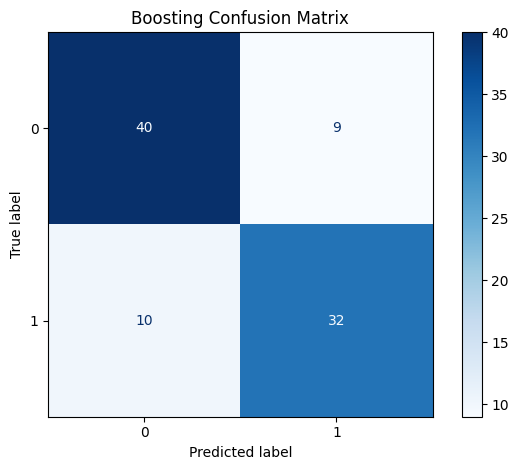

In [63]:
ConfusionMatrixDisplay.from_predictions(
    y_test,
    boost_pred,
    cmap="Blues"
)

plt.title("Boosting Confusion Matrix")
plt.tight_layout()
plt.show()

In [64]:
boost_report = classification_report(
    y_test,
    boost_pred,
    output_dict=True
)

boost_report_df = pd.DataFrame(report).transpose()

boost_report_df

,precision,recall,f1-score,support
0,0.847826,0.795918,0.821053,49.000000
1,0.777778,0.833333,0.804598,42.000000
accuracy,0.813187,0.813187,0.813187,0.813187
macro avg,0.812802,0.814626,0.812825,91.000000
weighted avg,0.815496,0.813187,0.813458,91.000000


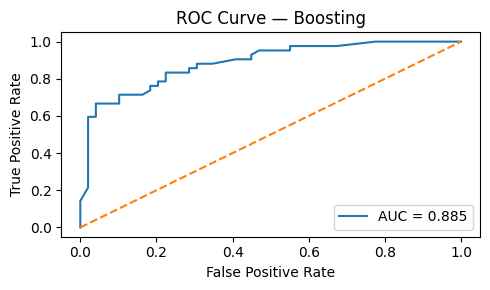

In [71]:
boost_probs = boost_model.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(
    y_test,
    boost_probs
)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(5,3))

plt.plot(
    fpr,
    tpr,
    label=f"AUC = {roc_auc:.3f}"
)

plt.plot(
    [0,1],
    [0,1],
    linestyle="--"
)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve — Boosting")
plt.legend()
plt.tight_layout()
plt.show()

# Model Comparison

In [66]:
comparison = pd.DataFrame({

    "Model": [
        "Bagging",
        "Random Forest",
        "Boosting"
    ],

    "Accuracy": [
        accuracy_score(y_test, bag_pred),
        accuracy_score(y_test, rf_pred),
        accuracy_score(y_test, boost_pred)
    ],

    "Precision": [
        precision_score(y_test, bag_pred),
        precision_score(y_test, rf_pred),
        precision_score(y_test, boost_pred)
    ],

    "Recall": [
        recall_score(y_test, bag_pred),
        recall_score(y_test, rf_pred),
        recall_score(y_test, boost_pred)
    ],

    "F1": [
        f1_score(y_test, bag_pred),
        f1_score(y_test, rf_pred),
        f1_score(y_test, boost_pred)
    ],

    "AUC": [
        roc_auc_score(y_test, bag_probs),
        roc_auc_score(y_test, rf_probs),
        roc_auc_score(y_test, boost_probs)
    ]
})

comparison

,Model,Accuracy,Precision,Recall,F1,AUC
0,Bagging,0.780220,0.750000,0.785714,0.767442,0.871963
1,Random Forest,0.813187,0.777778,0.833333,0.804598,0.914966
2,Boosting,0.791209,0.780488,0.761905,0.771084,0.884597


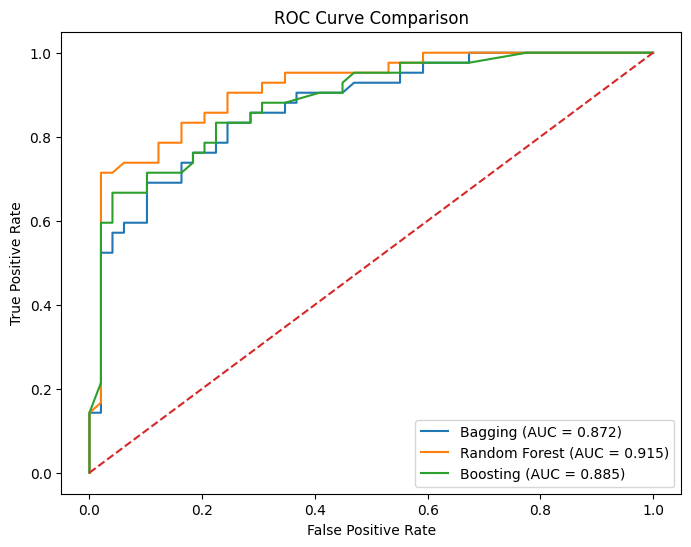

In [67]:
# Compute ROC curves
bag_fpr, bag_tpr, _ = roc_curve(y_test, bag_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
boost_fpr, boost_tpr, _ = roc_curve(y_test, boost_probs)

# Compute AUCs
bag_auc = auc(bag_fpr, bag_tpr)
rf_auc = auc(rf_fpr, rf_tpr)
boost_auc = auc(boost_fpr, boost_tpr)

# Plot
plt.figure(figsize=(8,6))

plt.plot(bag_fpr, bag_tpr,label=f"Bagging (AUC = {bag_auc:.3f})")

plt.plot(rf_fpr, rf_tpr, label=f"Random Forest (AUC = {rf_auc:.3f})")

plt.plot(boost_fpr, boost_tpr, label=f"Boosting (AUC = {boost_auc:.3f})")

# Random classifier reference
plt.plot([0,1], [0,1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison")
plt.legend()
plt.show()

# Annex - Tree Based Models explained

This annex provides a structured comparison of the main tree-based ensemble methods: bagging, random forests, boosting, and BART (Bayesian Additive Regression Trees). The focus is on their learning mechanisms, statistical properties, and practical implications.

---

## 1. Bagging (Bootstrap Aggregating)

### Core idea
Bagging constructs multiple decision trees independently using bootstrap resampling of the training data, then aggregates their predictions.

### Procedure
- Draw $B$ bootstrap samples from the training set
- Fit a full decision tree to each sample
- Aggregate predictions:
  - Regression: average
  - Classification: majority vote

### Statistical effect
- Primarily reduces **variance**
- Does not meaningfully reduce **bias**

### Key characteristic
- Trees are typically highly correlated because they are trained on similar data structures

### Strengths
- Simple and stable improvement over a single tree
- Reduces overfitting relative to a single deep tree

### Limitations
- Limited variance reduction due to correlated trees

---

## 2. Random Forest (RF)

### Core idea
Random Forest improves bagging by introducing additional randomness in feature selection at each split.

### Procedure
- Bootstrap sampling (as in bagging)
- At each split, consider only a random subset of predictors
- Aggregate predictions across trees

### Statistical effect
- Strong reduction in **variance**
- Slight increase in bias (typically negligible in practice)

### Key characteristic
- Decorrelates trees by limiting split-level feature access

### Strengths
- Robust, high-performing default model for tabular data
- Built-in feature importance measures

### Limitations
- Still not highly interpretable
- Limited extrapolation ability

---

## 3. Boosting

### Core idea
Boosting builds trees sequentially, where each tree corrects the errors of the current ensemble.

### Procedure (conceptual)
- Fit an initial weak tree
- Compute residual errors
- Fit subsequent trees to residuals
- Combine models as a weighted sum:
$$
f(x) = \sum_{m=1}^{M} \lambda \, T_m(x)
$$

### Statistical effect
- Strong reduction in **bias**
- Can reduce variance, but may overfit without regularisation

### Key characteristics
- Sequential dependence (non-parallel training)
- Focus on hard-to-predict observations

### Strengths
- Very high predictive accuracy on structured/tabular data
- Flexible function approximation

### Limitations
- Sensitive to hyperparameters
- Higher risk of overfitting compared to RF

---

## 4. BART (Bayesian Additive Regression Trees)

### Core idea
BART models the response as a sum of many small trees within a Bayesian framework.

### Model form
$$
y = \sum_{m=1}^{M} g_m(x) + \epsilon
$$

where each $g_m(x)$ is a small decision tree drawn from a prior.

### Procedure
- Specify priors over tree structures and leaf values
- Use MCMC to sample from the posterior distribution
- Aggregate predictions across sampled trees

### Statistical effect
- Simultaneously controls **bias and variance**
- Regularisation is induced via Bayesian priors

### Key characteristics
- Fully probabilistic model
- Produces posterior predictive distributions

### Strengths
- Provides uncertainty quantification
- Strong regularisation and stability
- Theoretically principled Bayesian framework

### Limitations
- Computationally intensive
- Less commonly used in industrial ML pipelines

---

## Comparative Summary

| Method          | Training Style | Main Objective       | Bias     | Variance | Tree Correlation | Interpretability | Key Strength |
|----------------|----------------|---------------------|----------|----------|------------------|------------------|--------------|
| Bagging        | Parallel       | Reduce variance     | Unchanged | ↓        | High             | Medium           | Simple variance reduction |
| Random Forest  | Parallel       | Reduce variance     | Slight ↑  | ↓↓       | Lower            | Medium           | Strong general-purpose model |
| Boosting       | Sequential     | Reduce bias         | ↓↓       | Mixed    | Not independent  | Low              | High predictive accuracy |
| BART           | Bayesian       | Full inference      | ↓↓       | ↓↓       | Controlled       | Medium-high      | Uncertainty quantification |

---

## Conceptual Unification

These methods can be understood along two axes:

### 1. Independence vs Dependence
- Bagging / Random Forest: independent models
- Boosting: dependent sequential corrections
- BART: dependent but probabilistically regularised

### 2. Bias–Variance Strategy
- Bagging / RF: variance reduction
- Boosting: bias reduction
- BART: joint bias–variance control via Bayesian priors

---

## Practical Guidance

- **Random Forest**: strong default for tabular prediction tasks
- **Boosting**: best predictive performance with tuning (e.g., gradient boosting frameworks)
- **Bagging**: baseline variance reduction, conceptually important
- **BART**: preferred when uncertainty quantification is required or Bayesian inference is desired

**--- End of Section: 08.4-Bagging_RF_Boosting ---**

---


# --- Section from: 09-SVM_full ---


# Support Vector Machine Models

# 0. Common Setup

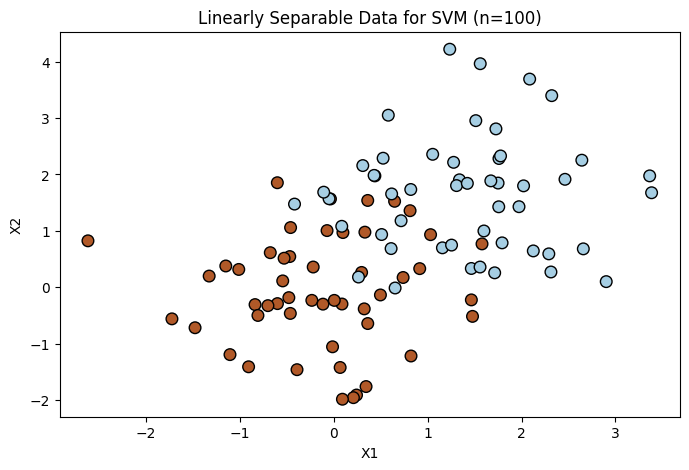

In [135]:
# 1. Generate 100 observations (50 for each class)
np.random.seed(42)
c = 100
X = np.random.randn(c, 2)

# 2. Update y to have 100 elements (50 of '1' and 50 of '-1')
y = np.repeat([1, -1], c/2) 

# 3. Shift the second class to create separation
X[y == -1] = X[y == -1] + 1.5  # Increased shift to 1.5 for clearer visual separation

# 4. Plotting
plt.figure(figsize=(8, 5))
plt.scatter(X[:,0], X[:,1], s=70, c=y, cmap=plt.cm.Paired, edgecolors='k')
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('Linearly Separable Data for SVM (n=100)')
plt.show()

# 1. Linear SVM Model

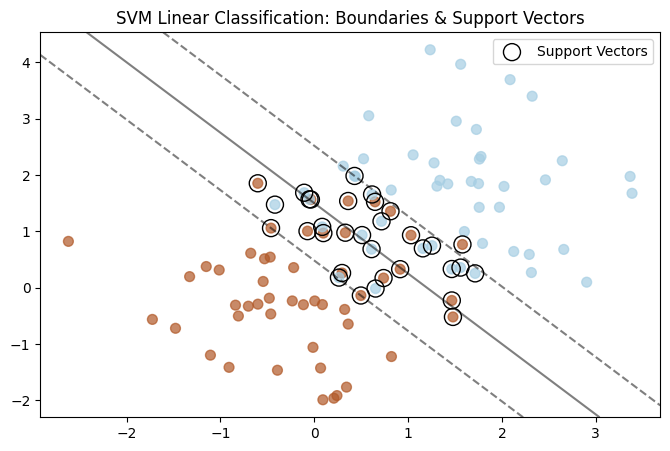

In [134]:
# 1. Fit the Linear SVM Model
# C=1.0 is the "Cost" parameter; higher C means less tolerance for misclassification
model = SVC(kernel='linear', C=1.0)
model.fit(X, y)

# 2. Setup the plot
plt.figure(figsize=(8, 5))
plt.scatter(X[:,0], X[:,1], s=50, c=y, cmap=plt.cm.Paired, alpha=0.7)
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# 3. Create a grid to evaluate the model
xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = model.decision_function(xy).reshape(XX.shape)

# 4. Plot Decision Boundary and Margins
# Level 0 is the boundary; Levels -1 and 1 are the margins
ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5,
           linestyles=['--', '-', '--'])

# 5. Highlight Support Vectors
# These are the specific points that define the position of the line
ax.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=150,
           linewidth=1, facecolors='none', edgecolors='k', label='Support Vectors')

plt.title("SVM Linear Classification: Boundaries & Support Vectors")
plt.legend()
plt.show()

In [140]:
# Helper function to plot SVM boundaries
def plot_svm(clf, X, y, ax=None, title="SVM Decision Boundary"):
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 5))
    
    # 1. Handle both GridSearchCV and standard SVC objects
    # If it's a grid search, we extract the best estimator
    model = clf.best_estimator_ if hasattr(clf, 'best_estimator_') else clf
    
    # 2. Plot the points
    ax.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap=plt.cm.Paired, alpha=0.7)
    
    # 3. Create higher-resolution grid
    xlim, ylim = ax.get_xlim(), ax.get_ylim()
    xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 100), 
                         np.linspace(ylim[0], ylim[1], 100))
    
    # 4. Evaluate decision function
    Z = model.decision_function(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    
    # 5. Plot boundary and margins
    ax.contour(xx, yy, Z, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])
    
    # 6. Highlight support vectors
    ax.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], 
               s=150, facecolors='none', edgecolors='k', linewidth=1.5, label='Support Vectors')
    
    ax.set_title(title)
    ax.legend()

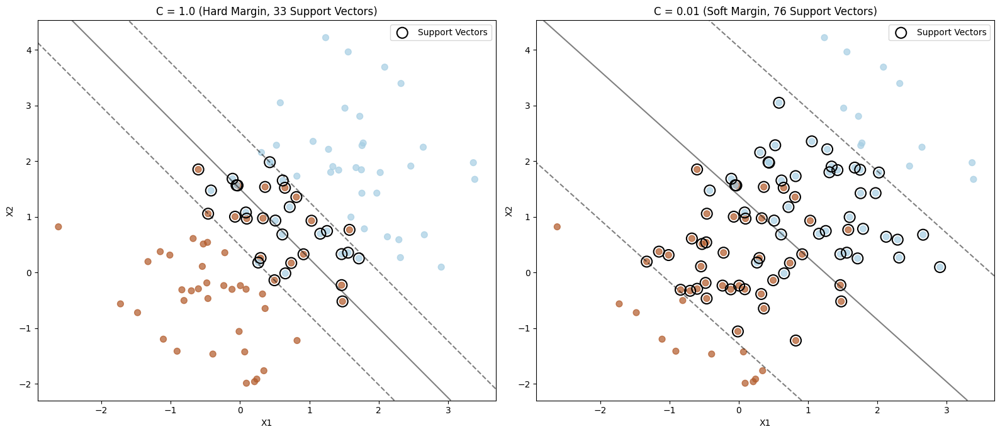

In [105]:
# Create a side-by-side comparison of different C values
plt.figure(figsize=(16, 7))

# --- Subplot 1: Large C (Harder Margin) ---
ax1 = plt.subplot(1, 2, 1)
# Fit the model with a LARGE C value
clf1 = SVC(kernel='linear', C=1.0)
clf1.fit(X, y)

# Use the hybrid function: plot_svm_ultimate(model, X, y, ax, title)
num_sv1 = len(clf1.support_vectors_)
plot_svm(clf1, X, y, ax=ax1, 
                  title=f'C = 1.0 (Hard Margin, {num_sv1} Support Vectors)')
ax1.set_xlabel('X1')
ax1.set_ylabel('X2')

# --- Subplot 2: Small C (Softer Margin) ---
ax2 = plt.subplot(1, 2, 2)
# Fit the model with a SMALL C value
clf2 = SVC(kernel='linear', C=0.01)
clf2.fit(X, y)

# Use the hybrid function again
num_sv2 = len(clf2.support_vectors_)
plot_svm(clf2, X, y, ax=ax2, 
                  title=f'C = 0.01 (Soft Margin, {num_sv2} Support Vectors)')
ax2.set_xlabel('X1')
ax2.set_ylabel('X2')

plt.tight_layout()
plt.show()

In [106]:
# Select the optimal C parameter by cross-validation
tuned_parameters = [{'C': [0.001, 0.01, 0.1, 1, 5, 10, 100]}]
clf = GridSearchCV(SVC(kernel='linear'), 
                   tuned_parameters, cv=10, scoring='accuracy', 
                   return_train_score=True)
clf.fit(X, y)

GridSearchCV(cv=10, estimator=SVC(kernel='linear'),
             param_grid=[{'C': [0.001, 0.01, 0.1, 1, 5, 10, 100]}],
             return_train_score=True, scoring='accuracy')

In [107]:
# Convert results to a dataframe for easy viewing
results_df = pd.DataFrame(clf.cv_results_)

# Focus on the most important columns
display(results_df[['param_C', 'mean_test_score', 'std_test_score', 'rank_test_score']])

# Get the absolute best parameters
print(f"Best C: {clf.best_params_}")
print(f"Best Accuracy: {clf.best_score_}")

,param_C,mean_test_score,std_test_score,rank_test_score
0,0.001,0.86,0.080000,3
1,0.010,0.89,0.083066,1
2,0.100,0.87,0.090000,2
3,1.000,0.86,0.101980,3
4,5.000,0.86,0.101980,3
5,10.000,0.86,0.101980,3
6,100.000,0.85,0.092195,7


Best C: {'C': 0.01}
Best Accuracy: 0.89


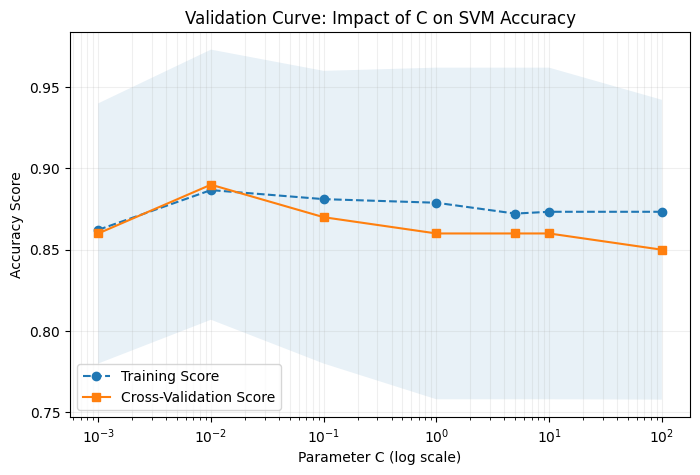

In [133]:
results = pd.DataFrame(clf.cv_results_)
param_c = results['param_C'].astype(float)
train_scores = results['mean_train_score']
test_scores = results['mean_test_score']
std_test = results['std_test_score']

# 2. Plotting
plt.figure(figsize=(8, 5))
plt.semilogx(param_c, train_scores, label='Training Score', marker='o', linestyle='--')
plt.semilogx(param_c, test_scores, label='Cross-Validation Score', marker='s')

# Add a shaded area for the standard deviation (shows consistency)
plt.fill_between(param_c, test_scores - std_test, test_scores + std_test, alpha=0.1)

plt.title("Validation Curve: Impact of C on SVM Accuracy")
plt.xlabel("Parameter C (log scale)")
plt.ylabel("Accuracy Score")
plt.grid(True, which="both", ls="-", alpha=0.2)
plt.legend(loc="best")
plt.show()

## Interpreting SVM Hyperparameter Tuning with GridSearchCV

### 1. Breakdown of the Process
When running `GridSearchCV(SVC(kernel='linear'), tuned_parameters, cv=10)`, the following occurs:

*   **10-Fold Cross-Validation (`cv=10`):** The dataset is split into 10 subsets. The model trains on 9 and validates on 1. This repeats 10 times for **each** value of $C$.
*   **Scoring:** The algorithm tracks which $C$ yields the highest **mean accuracy** across those 10 iterations.
*   **Search Space:** Since we provided 7 values for $C$, the grid search fits a total of **70 models** ($7 \text{ values} \times 10 \text{ folds}$).

---

### 2. The Bias-Variance Tradeoff (The $C$ Parameter)
The $C$ parameter acts as a "budget" for misclassifications. By searching from $0.001$ to $100$, we are testing the entire spectrum:

| $C$ Value | Margin Type | Risk | Behavior |
| :--- | :--- | :--- | :--- |
| **Low (0.001)** | **Soft Margin** | **Underfitting** | The margin is so wide it may ignore the actual data structure. |
| **High (100)** | **Hard Margin** | **Overfitting** | The model tries to perfectly classify every point, potentially capturing noise. |

One Small RecommendationSince you are using kernel='linear', the model is relatively simple. If your best $C$ ends up being the very edge of your grid (e.g., 0.001 or 100), it’s a good sign you should extend your search in that direction (e.g., try 0.0001 or 1000) to ensure you haven't missed the true peak performance.

---
### What this plot tells you:

*   **Underfitting Zone (Left side):** When $C$ is very small (e.g., $0.001$), the model is too "relaxed." Both training and validation scores will likely be low because the margin is so wide it ignores the actual data patterns.
*   **Overfitting Zone (Right side):** When $C$ is very high (e.g., $100$), you might see the **Training Score** continue to rise while the **Cross-Validation Score** flattens or drops. This means the model is memorizing noise in the training set.
*   **The "Sweet Spot":** The $C$ value where the Cross-Validation Score is at its peak. This is what your `clf.best_params_` will return.

Based on the Validation Curve:
*   **Optimal Parameter:** The best $C$ value is **0.01** ($10^{-2}$). At this value, the model achieves its highest cross-validation accuracy (~89%) and shows the least amount of overfitting.
*   **Soft vs. Hard Margin:** 
    *   For $C < 0.01$, the model is slightly **underfitting**, as both scores are lower.
    *   For $C > 0.01$, the model begins to **overfit**. The gap between the training score and validation score widens, meaning the model is becoming too complex and "memorizing" the training data rather than learning the general trend.
*   **Conclusion:** We should use `C=0.01` for our final model as it provides the most robust generalization.

---

### Pro-Tip for SVMs
Since the $C$ parameter varies by powers of 10, we use `plt.semilogx`. If your "best $C$" is sitting at the very end of your plot (like $100$), it's a signal to run the grid search again with even higher values (like $1000$ or $10000$) to see if the accuracy keeps improving!

In [136]:
# ==========================================
# 2. THE HOLD-OUT TEST SPLIT
# ==========================================
# We reserve 20% of data as the "Final Exam" (unseen by tuning)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y)

print(f"Train size: {len(X_train)} | Test size: {len(X_test)}")

Train size: 80 | Test size: 20


In [137]:
# ==========================================
# 3. HYPERPARAMETER TUNING (GridSearchCV)
# ==========================================
# Define the search space for C
param_grid = {'C': [0.001, 0.01, 0.1, 1, 5, 10, 100]}

# Setup Grid Search with 10-fold cross-validation
# This will perform 70 fits total (7 C-values * 10 folds)
grid_search = GridSearchCV(
    SVC(kernel='linear'), 
    param_grid, 
    cv=10, 
    scoring='accuracy', 
    return_train_score=True
)

grid_search.fit(X_train, y_train)

# Print tuning results
print(f"Best C Parameter: {grid_search.best_params_['C']}")
print(f"Best CV Accuracy: {grid_search.best_score_:.2%}")

Best C Parameter: 0.01
Best CV Accuracy: 87.50%



--- Performance on Final Test Set (Locked Data) ---
Test Accuracy: 90.00%

Confusion Matrix:


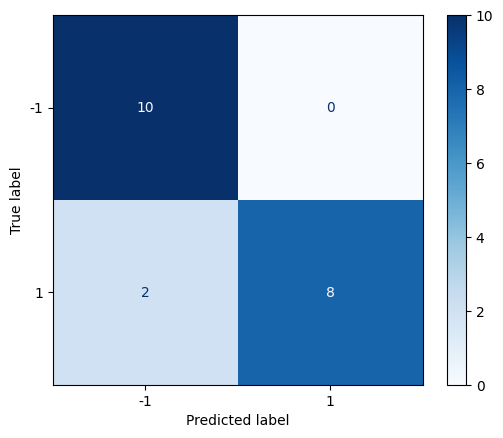


Full Report:


,precision,recall,f1-score,support
-1,0.833333,1.0,0.909091,10.0
1,1.000000,0.8,0.888889,10.0
accuracy,0.900000,0.9,0.900000,0.9
macro avg,0.916667,0.9,0.898990,20.0
weighted avg,0.916667,0.9,0.898990,20.0


In [138]:
# ==========================================
# 4. FINAL EVALUATION
# ==========================================
# Use the best model found by GridSearchCV to predict the test set
y_pred = grid_search.predict(X_test)

print("\n--- Performance on Final Test Set (Locked Data) ---")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred):.2%}")
print("\nConfusion Matrix:")
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='Blues')
plt.show()
print("\nFull Report:")
report = classification_report(y_test, y_pred, output_dict=True)
report = pd.DataFrame(report).transpose()
display(report)

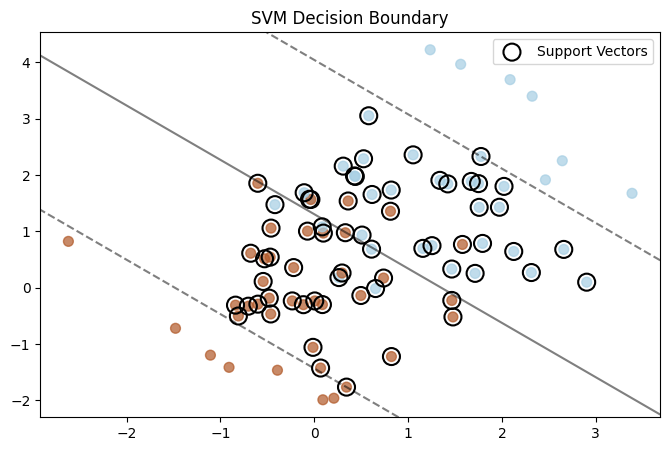

In [141]:
plot_svm(grid_search, X_train, y_train, ax=None, title="SVM Decision Boundary")

# 2. Binary Classification

The code creates a 2D dataset with 200 points. It shifts the first 100 points and the next 50 points in opposite directions to create overlapping clusters, then assigns labels (Class 1 and Class 2).2. Key Components & TransitionsThe RBF Kernel: Unlike a linear SVM, the RBF kernel allows the model to create circular or "blob-like" decision boundaries.The Gamma ($\gamma$) Parameter: Controls the "reach" of a single training point. High gamma leads to tight, wiggly boundaries (overfitting), while low gamma creates smoother curves.The C Parameter: The penalty for misclassification. High $C$ aims for a perfect fit on training data; low $C$ allows for a wider "street" (margin).

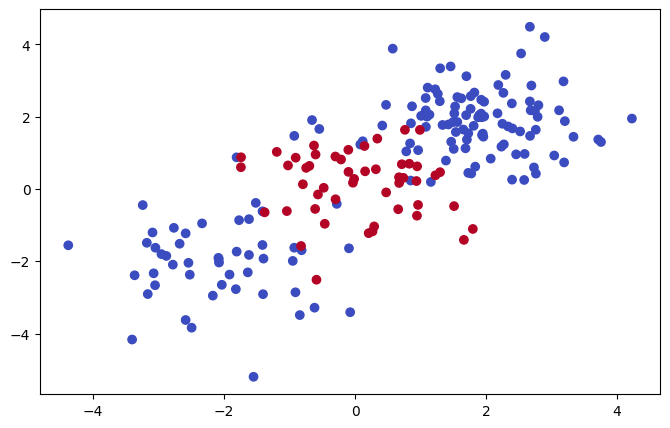

In [142]:
X = rng.standard_normal((200, 2))
X[:100] += 2
X[100:150] -= 2
y = np.array([1]*150+[2]*50)
# Plotting the data makes it clear that the class boundary is indeed nonlinear.
fig , ax = plt.subplots(figsize=(8,5))
ax.scatter(X[:,0], 
           X[:,1],
           c=y,
           cmap= 'coolwarm')

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.5, random_state=0)

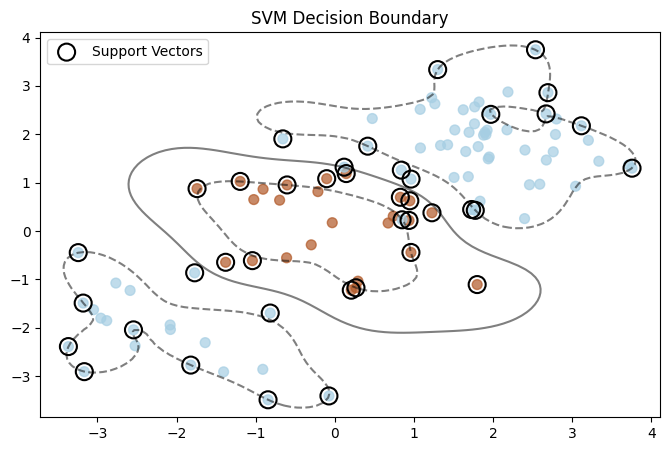

In [143]:
# 3. Fit and Plot (Example: High Penalty C)
svm_rbf = SVC(kernel="rbf", gamma=1, C=1).fit(X_train, y_train)
plot_svm(svm_rbf, X_train, y_train)

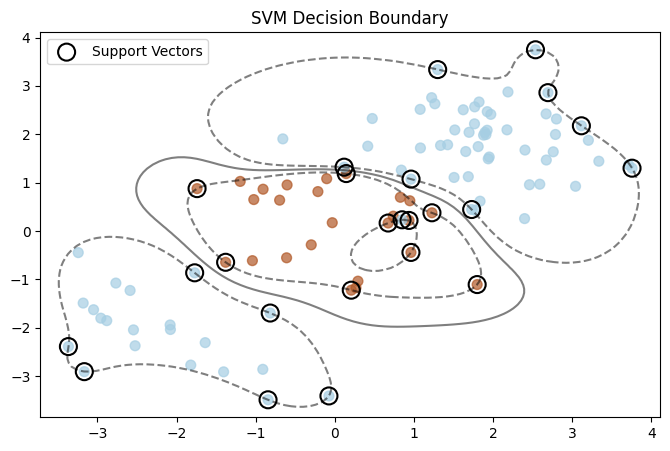

In [144]:
# larger C
svm_rbf = SVC(kernel="rbf", gamma=1, C=100).fit(X_train, y_train)
plot_svm(svm_rbf, X_train, y_train)

Best Params: {'C': 100, 'gamma': 0.5}


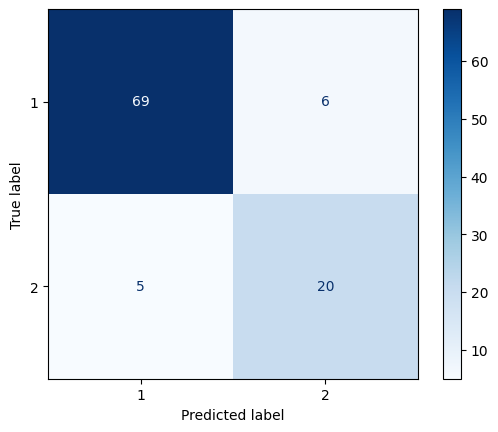

In [145]:
# 4. Hyperparameter Tuning
kfold = KFold(5, random_state=0, shuffle=True)
grid = GridSearchCV(
    SVC(kernel="rbf"),
    {'C': [0.1, 1, 10, 100, 1000], 'gamma': [0.5, 1, 2, 3, 4]},
    cv=kfold,
    scoring='accuracy'
).fit(X_train, y_train)

best_svm = grid.best_estimator_
print(f"Best Params: {grid.best_params_}")

# 5. Confusion Matrix (Replaces confusion_table)
ConfusionMatrixDisplay.from_estimator(best_svm, X_test, y_test,cmap='Blues')
plt.show()

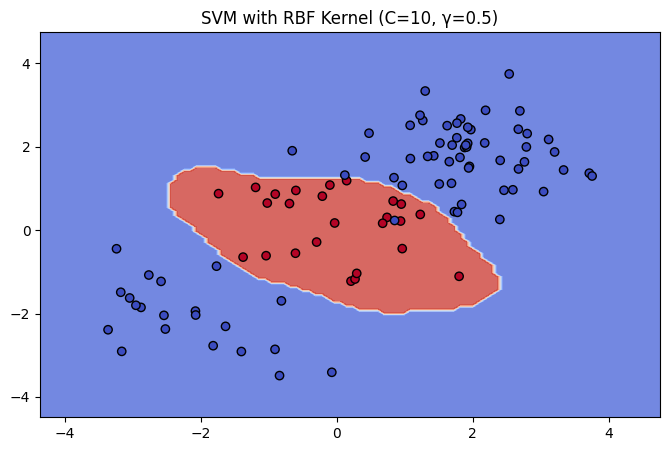

In [146]:
# 2. Create the plot
fig, ax = plt.subplots(figsize=(8, 5))

# Draw the decision regions (the shaded background)
DecisionBoundaryDisplay.from_estimator(
    svm_rbf,
    X_train,
    response_method="predict", # This tells it to color by class prediction
    cmap=plt.cm.coolwarm,      # Matches your previous color scheme
    alpha=0.8,                 # Transparency of the background
    ax=ax
)

# 3. Overlay the actual data points
ax.scatter(
    X_train[:, 0], 
    X_train[:, 1], 
    c=y_train, 
    cmap=plt.cm.coolwarm, 
    edgecolors="k"
)

ax.set_title("SVM with RBF Kernel (C=10, γ=0.5)")
plt.show()

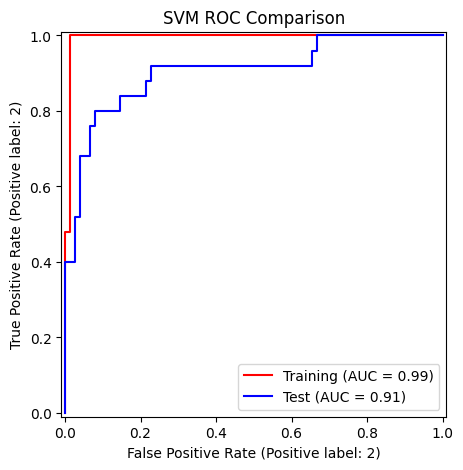

In [147]:
fig, ax = plt.subplots(figsize=(8,5))

# Plot Training ROC
RocCurveDisplay.from_estimator(
    best_svm, X_train, y_train, ax=ax, name='Training', color='r')

# Plot Test ROC on the same axes
RocCurveDisplay.from_estimator(
    best_svm, X_test, y_test, ax=ax, name='Test', color='b')

ax.set_title("SVM ROC Comparison")
plt.show()

# 3. Multiclass Classification
The complexity of the problem increases because you are moving from a binary classification (two classes) to a multiclass classification (three classes).

1. Adding a Third ClassThe code generates 50 new data points and stacks them onto your existing $X$ and $y$ arrays.
    - The Data: 50 new points are drawn from a standard normal distribution.
    - The Label: These points are assigned the label 0. (Your previous labels were 1 and 2).
    - The Shift: $X[y==0,1] += 2$ shifts these new "Class 0" points upward by 2 units on the y-axis.The Result: You now have three distinct (but likely overlapping) clusters of data.

2. Multi-Class Strategy: "One-vs-One" (OvO)
The parameter decision_function_shape='ovo' is the most important change here.
Since standard SVMs are mathematically designed to separate only two classes at a time, Scikit-Learn has to use a strategy to handle three classes. 
One-vs-One works as follows:
    - It trains a separate classifier for every possible pair of classes.
    - For 3 classes, it trains $3$ classifiers:Class 0 vs. Class 1Class 0 vs. Class 2Class 1 vs. Class 2
    - Voting: When predicting a new point, all three classifiers "vote," and the class with the most wins is chosen.3.

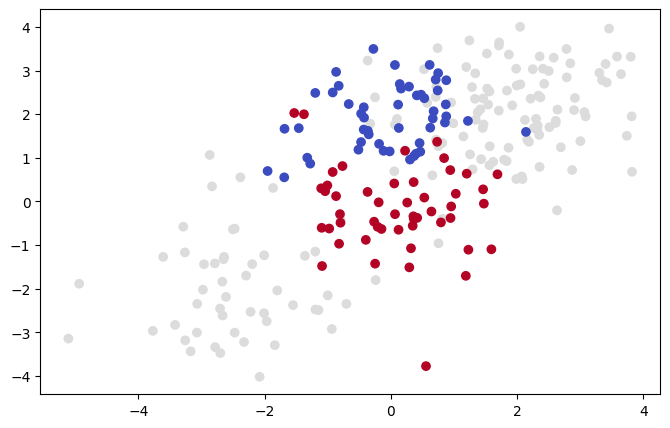

In [148]:
# 1. Setup the initial 2-class data (Resetting so X and y don't grow infinitely)
rng = np.random.default_rng(0)
X_base = rng.standard_normal((200, 2))
X_base[:100] += 2
X_base[100:150] -= 2
y_base = np.array([1]*150 + [2]*50)

# 2. Add the 3rd class
rng_new = np.random.default_rng(42)
X_new = rng_new.standard_normal((50, 2))
y_new = np.array([0]*50)
X_new[:, 1] += 2  # Shift the new points up on the Y-axis

# Combine base data with new class
X = np.vstack([X_base, X_new])
y = np.hstack([y_base, y_new])
fig , ax = plt.subplots(figsize=(8,5))
ax.scatter(X[:,0], X[:,1], c=y, cmap= 'coolwarm')

In [150]:
# 1. Split the data to ensure we have an "unseen" test set
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42)

# 2. Define the parameter grid
# We use logarithmic scales (0.1, 1, 10...) because SVM sensitivity 
# often changes exponentially.
param_grid = {
    'C': [0.1, 1, 10, 100, 1000],
    'gamma': [0.01, 0.1, 1, 5, 10],
    'decision_function_shape': ['ovo'] # Keeping our multiclass strategy
}

# 3. Setup the Grid Search
grid_search = GridSearchCV(
    SVC(kernel='rbf'), 
    param_grid, 
    cv=5,                # 5-fold cross-validation
    scoring='accuracy', 
    verbose=1            # Shows progress
)

# 4. Run the search
grid_search.fit(X_train, y_train)

# 5. Results
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best CV Accuracy: {grid_search.best_score_:.2f}")

# 6. Evaluate on the final held-out test set
final_model = grid_search.best_estimator_
test_acc = final_model.score(X_test, y_test)
print(f"Final Test Accuracy: {test_acc:.2f}")

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best Parameters: {'C': 1, 'decision_function_shape': 'ovo', 'gamma': 0.1}
Best CV Accuracy: 0.82
Final Test Accuracy: 0.87


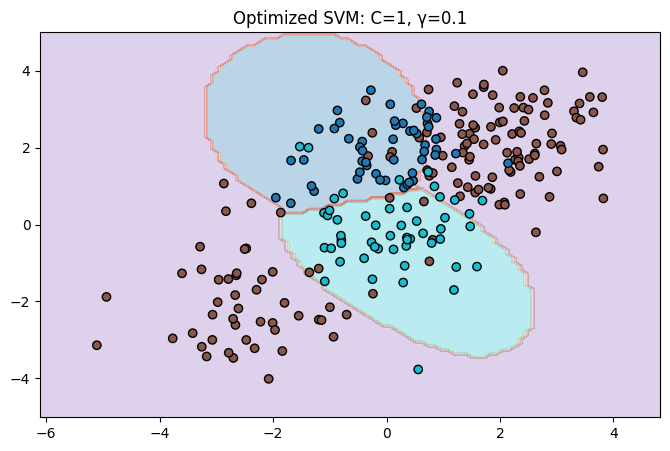

In [159]:
fig, ax = plt.subplots(figsize=(8, 5))
DecisionBoundaryDisplay.from_estimator(
    final_model, X, response_method="predict", cmap='tab10', alpha=0.3, ax=ax
)
ax.scatter(X[:, 0], X[:, 1], c=y, cmap='tab10', edgecolors='k')
ax.set_title(f"Optimized SVM: C={grid_search.best_params_['C']}, γ={grid_search.best_params_['gamma']}")
plt.show()

## Multiclass SVM Strategies: OvO vs. OvR

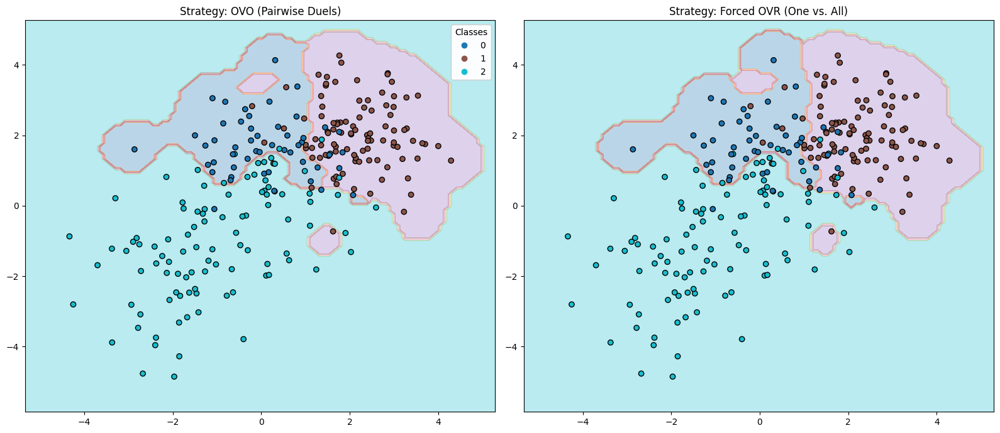

In [160]:
from sklearn.multiclass import OneVsRestClassifier

# 1. SETUP DATA (Standard 3-class setup)
rng = np.random.default_rng(123)
# Class 1 & 2
X = rng.standard_normal((200, 2))
X[:100] += 2
X[100:150] -= 2
y = np.array([1]*100 + [2]*100) # Balanced for simplicity

# Adding Class 0
X_new = rng.standard_normal((50, 2))
X_new[:, 1] += 2 
X = np.vstack([X, X_new])
y = np.hstack([y, [0]*50])

# 2. DEFINE MODELS
# Strategy A: Standard OvO (Built into SVC)
# High gamma makes boundaries "wiggly" so differences are easier to spot
model_ovo = SVC(kernel="rbf", C=10, gamma=2, decision_function_shape='ovo')

# Strategy B: Forced OvR (Truly training 3 separate models)
model_ovr_forced = OneVsRestClassifier(SVC(kernel="rbf", C=10, gamma=2))

# 3. FIT MODELS
model_ovo.fit(X, y)
model_ovr_forced.fit(X, y)

# 4. VISUAL COMPARISON
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
models = [model_ovo, model_ovr_forced]
titles = ["Strategy: OVO (Pairwise Duels)", "Strategy: Forced OVR (One vs. All)"]

for i, model in enumerate(models):
    # Plot decision regions
    DecisionBoundaryDisplay.from_estimator(
        model, 
        X, 
        ax=axes[i], 
        response_method="predict", 
        cmap='tab10', 
        alpha=0.3
    )
    
    # Plot data points
    scatter = axes[i].scatter(X[:, 0], X[:, 1], c=y, cmap='tab10', edgecolors='k')
    axes[i].set_title(titles[i])
    
    # Add legend to the first plot
    if i == 0:
        legend = axes[i].legend(*scatter.legend_elements(), title="Classes")
        axes[i].add_artist(legend)

plt.tight_layout()
plt.show()

*Since Support Vector Machines (SVMs) are natively binary classifiers, they use two primary strategies to handle datasets with more than two classes.*

---

### 1. One-vs-One (OvO)
**The "Round-Robin Tournament" Approach**

* **How it works:** The algorithm trains a separate classifier for **every possible pair** of classes.
* **Math:** For $K$ classes, it creates $\frac{K(K-1)}{2}$ models.
    * *Example (3 Classes):* 0 vs 1, 1 vs 2, 0 vs 2.
* **Decision Rule:** Each model "votes" for a winner. The class with the most votes across all models wins.
* **Best for:** SVMs specifically. Because SVMs scale poorly with data size ($O(n^3)$), training many small models on subsets of data is often faster than one large model.
* **Pros:** Robust against imbalanced data; boundaries between two classes are not distorted by other classes.

---

### 2. One-vs-Rest (OvR / One-vs-All)
**The "Me vs. The World" Approach**

* **How it works:** The algorithm trains **one classifier per class**, comparing that class against all other classes combined.
* **Math:** For $K$ classes, it creates exactly $K$ models.
    * *Example (3 Classes):* 0 vs [1 & 2], 1 vs [0 & 2], 2 vs [0 & 1].
* **Decision Rule:** It calculates a "confidence score" (distance from the boundary) for each class. The class with the highest score wins.
* **Best for:** Most other algorithms (Logistic Regression, etc.) where training on the full dataset is efficient.
* **Pros:** Fewer models to store and faster prediction time for a high number of classes.

---

### Comparison Table

| Feature | One-vs-One (OvO) | One-vs-Rest (OvR) |
| :--- | :--- | :--- |
| **Number of Models** | High ($\approx K^2/2$) | Low ($K$) |
| **Training Speed** | Fast for SVM (small subsets) | Slow for SVM (full dataset) |
| **Prediction Speed** | Slower (checks more models) | Faster (checks fewer models) |
| **Boundary Focus** | Local (only cares about the pair) | Global (cares about the whole distribution) |
| **Scikit-Learn Default** | `SVC` (via LibSVM) | `LinearSVC` / `OneVsRestClassifier` |

> **Note:** In Scikit-Learn's `SVC`, even if you set `decision_function_shape='ovr'`, it still trains **OvO** models internally. It simply reformats the output scores to look like OvR. To get a true OvR training process, use the `OneVsRestClassifier` wrapper.

# Annex - theory

### Starting Point: The Linear Classifier

A linear Support Vector Machine (SVM) predicts using:

$$
f(x) = \beta^T x + \beta_0
$$

where:

- $x$ = observation/features
- $beta$ = weight vector
- $beta_0$= intercept

At first glance, the classifier appears to depend directly on:

- the coordinates of $x$
- the vector $beta$

### The SVM Optimization Problem

The SVM chooses the separating hyperplane by solving:

$$
\min_{\beta} \|\beta\|^2
$$

subject to classification constraints.

- small $\|\beta\|$  $\rightarrow$ large margin
- classification constraints  $\rightarrow$ separate the classes correctly

So the optimization searches for the "best" separating direction $\beta$.

---

The crucial **geometrical** observation is:

> The only directions that matter are directions generated by the training observations themselves.

Why?

Because the optimization constraints involve only the training data:

$$
x_1, x_2, \dots, x_n
$$
There is no information outside the span of the data.

Therefore:

> The optimal solution must live inside the **span** of the training observations.

---
The span of the training observations is:

$$
\text{Span}(x_1,\dots,x_n)
=
\left\{
\sum_{i=1}^n \alpha_i x_i
\right\}
$$

This means:

> Any useful separating direction can be written as a weighted combination of the training observations.

Therefore the optimal solution satisfies:

$$
\beta = \sum_{i=1}^n \alpha_i x_i
$$

This is one of the most important results in SVM theory.

### Orthogonal Components

Suppose we decompose:

$$
\beta = \beta_{\parallel} + \beta_{\perp}
$$

where:

- $\beta_{\parallel}$ lies in the span of the data
- $\beta_{\perp}$ is orthogonal to every training observation

Meaning:

$$
\beta_{\perp}^T x_i = 0
\quad \forall i
$$
Then:

$$
\beta^T x_i
=
(\beta_{\parallel} + \beta_{\perp})^T x_i
$$

$$
=
\beta_{\parallel}^T x_i
+
\beta_{\perp}^T x_i
$$

Since:

$$
\beta_{\perp}^T x_i = 0
$$

we obtain:

$$
\beta^T x_i
=
\beta_{\parallel}^T x_i
$$

Therefore:

> The orthogonal component has absolutely no effect on classification.

However, it still increases the norm:

$$
\|\beta\|^2
=
\|\beta_{\parallel}\|^2
+
\|\beta_{\perp}\|^2
$$

So:

- it worsens the optimization objective
- provides no classification benefit

Therefore the optimizer always eliminates it:

$$
\beta_{\perp}=0
$$

---

Since:

$$
\beta = \sum_i \alpha_i x_i
$$

we can substitute this into the classifier.

Original classifier:

$$
f(x)=\beta^T x+\beta_0
$$

Substitute \(\beta\):

$$
f(x)
=
\left(
\sum_i \alpha_i x_i
\right)^T x
+
\beta_0
$$

Using distributivity:

$$
f(x)
=
\sum_i \alpha_i (x_i^T x)
+
\beta_0
$$

Now notice carefully:

> The classifier depends only on inner products between observations.

Specifically:

$$
x_i^T x
$$

---
### Foundation of Kernels

Once the classifier depends only on inner products, we can replace:

$$
x_i^T x
$$

with a kernel function:

$$
K(x_i,x)
$$
where:

$$
K(x_i,x)
=
\langle \phi(x_i), \phi(x) \rangle
$$

This replacement is called:

> the kernel trick

---

The optimization never truly needed:

- explicit coordinates
- explicit feature vectors

It only required:

- geometric relationships between observations

Inner products encode geometry because they contain information about:

- angles
- lengths
- similarity

Therefore replacing inner products with kernels effectively changes:

> the geometry of the feature space itself.

---

The **SVM optimization** can be rewritten from:

- **Primal Form**

$$
\text{optimize } \beta
$$

to:

- **Dual Form**

$$
\text{optimize coefficients } \alpha_i
$$

In the dual formulation:

- only inner products appear
- kernels can replace those inner products directly

This is why kernels arise naturally in SVMs.

---

The key insight is:

> The optimal separating hyperplane can always be expressed entirely as combinations of training observations.

Therefore:

- only similarities between observations matter
- kernels define those similarities
- nonlinear boundaries become possible without explicitly constructing high-dimensional feature spaces

This is the mathematical foundation of kernel methods.

## Numerical Example — Why the SVM Solution Lies in the Span of the Data

We now work through a complete numerical example showing:

1. how to decompose a vector into:
   - a component inside the span of the data
   - an orthogonal component

2. why the orthogonal component is useless for SVM classification

---

### Step 1 — Define the Training Data

Let:

$$
x_1 =
\begin{pmatrix}
1\\
2\\
3
\end{pmatrix}
,
\qquad
x_2 =
\begin{pmatrix}
2\\
3\\
4
\end{pmatrix}
$$

The span of the data is:

$$
\text{Span}(x_1,x_2)
$$

meaning:

$$
\left\{
a x_1 + b x_2
\right\}
$$

for arbitrary scalars \(a,b\).

Geometrically:

> the training data generates a plane in \(\mathbb R^3\).

---

### Step 2 — Find a Vector Orthogonal to the Span

We want a vector:

$$
u =
\begin{pmatrix}
a\\
b\\
c
\end{pmatrix}
$$

such that:

$$
u^T x_1 = 0
$$

and

$$
u^T x_2 = 0
$$

---

#### Orthogonality with \(x_1\)

$$
a + 2b + 3c = 0
$$

---

#### Orthogonality with \(x_2\)

$$
2a + 3b + 4c = 0
$$

---

### Step 3 — Solve the System

From the first equation:

$$
a = -2b - 3c
$$

Substitute into the second equation:

$$
2(-2b-3c)+3b+4c=0
$$

$$
-4b-6c+3b+4c=0
$$

$$
-b-2c=0
$$

$$
b=-2c
$$

Substitute back:

$$
a=-2(-2c)-3c
$$

$$
a=4c-3c=c
$$

Thus:

$$
u=
\begin{pmatrix}
c\\
-2c\\
c
\end{pmatrix}
$$

Choose \(c=1\):

$$
u=
\begin{pmatrix}
1\\
-2\\
1
\end{pmatrix}
$$

This vector is orthogonal to the entire span of the data.

---

### Step 4 — Verify Orthogonality

Check with \(x_1\):

$$
(1,-2,1)\cdot(1,2,3)
$$

$$
=1-4+3
$$

$$
=0
$$

---

Check with \(x_2\):

$$
(1,-2,1)\cdot(2,3,4)
$$

$$
=2-6+4
$$

$$
=0
$$

So:

$$
u \perp x_1
\qquad
u \perp x_2
$$

---

### Step 5 — Choose an Arbitrary Vector β

Now choose:

$$
\beta=
\begin{pmatrix}
8\\
7\\
9
\end{pmatrix}
$$

We want to decompose:

$$
\beta
=
\beta_{\parallel}
+
\beta_{\perp}
$$

where:

- \( \beta_{\parallel} \) lies in the span of the data
- \( \beta_{\perp} \) is orthogonal to the span

---

### Step 6 — Compute the Orthogonal Component

The orthogonal projection formula gives:

$$
\beta_{\perp}
=
\frac{\beta^T u}{u^T u}u
$$

---

#### Compute the Numerator

$$
\beta^T u
=
(8,7,9)\cdot(1,-2,1)
$$

$$
=8-14+9
$$

$$
=3
$$

---

#### Compute the Denominator

$$
u^T u
=
1^2+(-2)^2+1^2
$$

$$
=1+4+1
$$

$$
=6
$$

---

#### Compute the Projection

$$
\beta_{\perp}
=
\frac{3}{6}u
$$

$$
=
\frac12
\begin{pmatrix}
1\\
-2\\
1
\end{pmatrix}
$$

Therefore:

$$
\beta_{\perp}
=
\begin{pmatrix}
0.5\\
-1\\
0.5
\end{pmatrix}
$$

---

### Step 7 — Compute the Parallel Component

Now subtract:

$$
\beta_{\parallel}
=
\beta-\beta_{\perp}
$$

$$
=
\begin{pmatrix}
8\\
7\\
9
\end{pmatrix}
-
\begin{pmatrix}
0.5\\
-1\\
0.5
\end{pmatrix}
$$

$$
=
\begin{pmatrix}
7.5\\
8\\
8.5
\end{pmatrix}
$$

---

### Step 8 — Verify that $\beta_{\parallel}$ Lies in the Span

We now check whether:

$$
\beta_{\parallel}
=
a x_1+b x_2
$$

for some \(a,b\).

So solve:

$$
a
\begin{pmatrix}
1\\
2\\
3
\end{pmatrix}
+
b
\begin{pmatrix}
2\\
3\\
4
\end{pmatrix}
=
\begin{pmatrix}
7.5\\
8\\
8.5
\end{pmatrix}
$$

This gives:

$$
a+2b=7.5
$$

$$
2a+3b=8
$$

From the first equation:

$$
a=7.5-2b
$$

Substitute:

$$
2(7.5-2b)+3b=8
$$

$$
15-4b+3b=8
$$

$$
-b=-7
$$

$$
b=7
$$

Then:

$$
a=7.5-14
$$

$$
a=-6.5
$$

Thus:

$$
\beta_{\parallel}
=
-6.5x_1+7x_2
$$

which confirms that it lies inside the span of the training observations.

---

### Step 9 — Verify Orthogonality

Check:

$$
\beta_{\parallel}^T \beta_{\perp}
$$

$$
=
(7.5,8,8.5)\cdot(0.5,-1,0.5)
$$

$$
=3.75-8+4.25
$$

$$
=0
$$

Therefore:

$$
\beta_{\parallel}
\perp
\beta_{\perp}
$$

---

### Step 10 — Why This Matters for SVMs

Recall the classifier:

$$
f(x)=\beta^T x+\beta_0
$$

Suppose:

$$
\beta
=
\beta_{\parallel}
+
\beta_{\perp}
$$

Then:

$$
\beta^T x_i
=
\beta_{\parallel}^T x_i
+
\beta_{\perp}^T x_i
$$

But:

$$
\beta_{\perp}^T x_i = 0
$$

for every training observation.

Therefore:

$$
\beta^T x_i
=
\beta_{\parallel}^T x_i
$$

This means:

> the orthogonal component has absolutely no effect on classification.

However, it still increases the norm:

$$
\|\beta\|^2
=
\|\beta_{\parallel}\|^2
+
\|\beta_{\perp}\|^2
$$

So the orthogonal component:

- worsens the optimization objective
- provides zero classification benefit

Therefore the SVM optimizer always removes it.

---

### Final Conclusion

The optimal SVM solution always lies inside the span of the training observations:

$$
\beta
=
\sum_{i=1}^n \alpha_i x_i
$$

Substituting this into the classifier gives:

$$
f(x)
=
\sum_i \alpha_i (x_i^T x)+\beta_0
$$

Therefore:

> the classifier depends only on inner products between observations.

This is the mathematical foundation that makes kernels possible.

**--- End of Section: 09-SVM_full ---**

---


# --- Section from: 11.3-Survival_and_KM ---


# Survival Analysis: Kaplan–Meier and Log-Rank Test

## Setup

In [2]:
np.random.seed(42)

n = 100

# Simulate true survival times
true_time = np.random.exponential(scale=12, size=n)

# Simulate censoring times
censor_time = np.random.uniform(5, 20, size=n)

# Observed time
time = np.minimum(true_time, censor_time)

# Event indicator
event = (true_time <= censor_time).astype(int)

# Build dataframe
df = pd.DataFrame({
    "true_time": true_time,
    "censor_time": censor_time,
    "time": time,
    "event": event
})

df.head()

,true_time,censor_time,time,event
0,5.631217,5.471438,5.471438,0
1,36.121457,14.546156,14.546156,0
2,15.800948,9.715340,9.715340,0
3,10.955311,12.628560,10.955311,1
4,2.035498,18.613497,2.035498,1


In [3]:
print(df.shape)

print("\nDeaths:")
print((df["event"] == 1).sum())

print("\nCensored:")
print((df["event"] == 0).sum())

(100, 4)

Deaths:
65

Censored:
35


In [4]:
kmf = KaplanMeierFitter()

kmf.fit(
    durations=df["time"],
    event_observed=df["event"]
)

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 100 total observations, 35 right-censored observations>

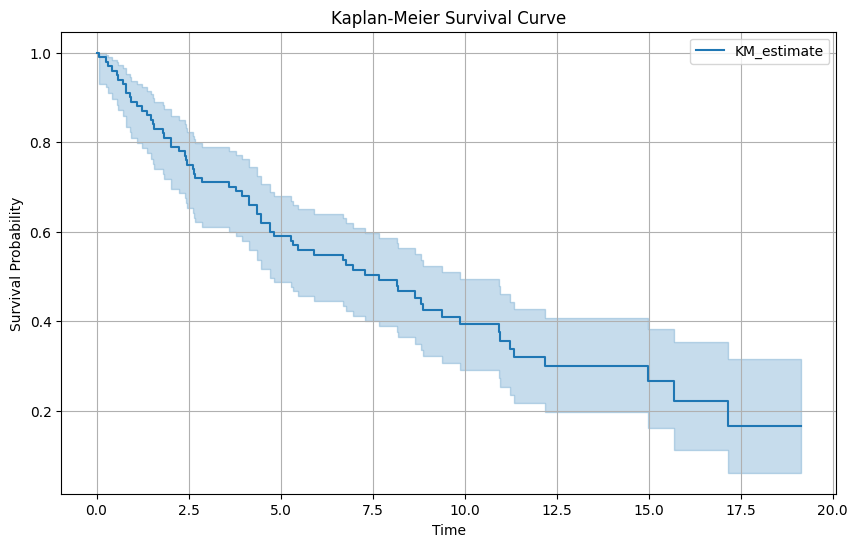

In [5]:
plt.figure(figsize=(10, 6))

kmf.plot_survival_function()

plt.title("Kaplan-Meier Survival Curve")
plt.xlabel("Time")
plt.ylabel("Survival Probability")

plt.grid(True)
plt.show()

In [7]:
# assign groups
group = np.random.choice(["Control", "Treatment"], size=n)

true_time_adj = true_time.copy()

true_time_adj[group == "Treatment"] *= 1.3  # Treatment improves survival

time = np.minimum(true_time_adj, censor_time)
event = (true_time_adj <= censor_time).astype(int)

In [8]:
df = pd.DataFrame({
    "time": time,
    "event": event,
    "group": group
})

df.head()

,time,event,group
0,5.471438,0,Treatment
1,14.546156,0,Treatment
2,9.715340,0,Control
3,10.955311,1,Control
4,2.646148,1,Treatment


In [9]:
df.groupby("group")["event"].mean()

group
Control      0.711111
Treatment    0.545455
Name: event, dtype: float64

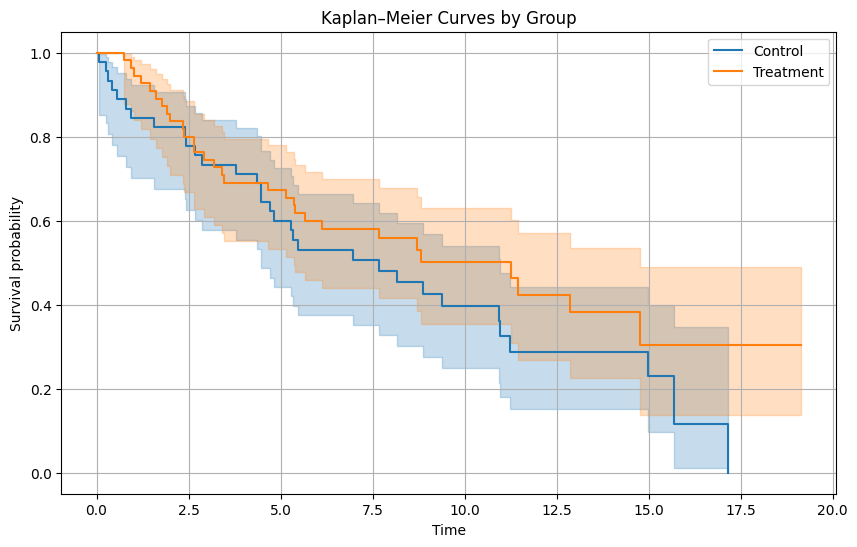

In [10]:
kmf = KaplanMeierFitter()

plt.figure(figsize=(10,6))

for g in ["Control", "Treatment"]:
    kmf.fit(df[df["group"] == g]["time"],
            df[df["group"] == g]["event"],
            label=g)
    kmf.plot_survival_function()

plt.title("Kaplan–Meier Curves by Group")
plt.xlabel("Time")
plt.ylabel("Survival probability")
plt.grid(True)
plt.show()

In [11]:
control = df[df["group"] == "Control"]
treatment = df[df["group"] == "Treatment"]

result = logrank_test(
    control["time"],
    treatment["time"],
    event_observed_A=control["event"],
    event_observed_B=treatment["event"]
)

result.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           1.82 0.18      2.50

### Interpretation of Results - evidence against $H_0$

A useful way to re-express p-values is through the transformation:

$$
-\log_2(p)
$$

This makes differences in small p-values easier to visualize.

| -log | p-value | Strength of evidence |
|----|----|----|
| 0 | 1.00 | None |
| 2 | 0.25 | Weak evidence |
| 3.3 | 0.10 | Mild evidence |
| 4.3 | 0.05 | Conventional significance threshold |
| 10+ | <0.01 | Very strong evidence |

- Larger values of $-\log_2(p)$ indicate stronger evidence against the null hypothesis.
- Values around 4.3 correspond to the classical 5% significance level.
- Very large values indicate extremely small p-values and strong evidence of an effect.

In this case, we fail to reject the null hypothesis.
> There is no statistically significant evidence that the two survival curves differ.


## 1. Survival Analysis Setup

In survival analysis, the response variable is a **time-to-event** outcome.

We observe:

- $T$: true event time (unknown for censored cases)
- $Y$: observed time
- $\delta$: event indicator

$$
Y = \min(T, C)
$$

$$
\delta =
\begin{cases}
1 & \text{if event observed (death/failure)} \\
0 & \text{if censored}
\end{cases}
$$

---
## 2. Censoring

Censoring occurs when the event is not fully observed.

In right censoring:

$$
T > Y
$$

We only know that survival exceeds the observed time.

---

## 3. Survival Function

The main object of interest is:

$$
S(t) = P(T > t)
$$

This represents the probability of surviving beyond time $t$.

---

## 4. Kaplan–Meier Estimator

The Kaplan–Meier estimator provides a non-parametric estimate of the survival function.

At each event time $t_i$:

- $n_i$: number at risk just before $t_i$
- $d_i$: number of events at $t_i$

The estimator is:

$$
\hat{S}(t) = \prod_{t_i \leq t} \left(1 - \frac{d_i}{n_i}\right)
$$

---
### Interpretation

- Survival decreases only at observed event times
- Censoring reduces the risk set but does not directly reduce survival
- The curve is a step function

---

## 5. Risk Set Intuition

At each time point:

- individuals still under observation form the risk set
- only those contribute to possible events

Censored observations:
- contribute information only up to censoring time
- then leave the risk set

---

## 6. Log-Rank Test: Motivation

After estimating survival curves, we often want to test:

> Do two groups have different survival experiences?

Examples:
- treatment vs control
- male vs female
- different medical procedures

---

We formalize:

$$
H_0: S_1(t) = S_2(t) \quad \forall t
$$

$$
H_1: S_1(t) \neq S_2(t) \ \text{for some } t
$$

---

## 7. Key Idea of Log-Rank Test

At each event time:

> Compare observed vs expected number of events under the assumption of equal survival.

Then aggregate across time.

---

## 8. Notation

At each event time $t_i$:

| Symbol | Meaning |
|--------|--------|
| $n_{1i}, n_{2i}$ | number at risk in each group |
| $d_{1i}, d_{2i}$ | observed deaths |
| $n_i$ | total at risk |
| $d_i$ | total deaths |

---

## 9. Expected Events Under $H_0$

Under equal survival, deaths are distributed proportionally:

$$
E_{1i} = d_i \cdot \frac{n_{1i}}{n_i}
$$

$$
E_{2i} = d_i \cdot \frac{n_{2i}}{n_i}
$$

Interpretation:

> expected deaths = risk-weighted allocation of observed events

---

## 10. Test Statistic

Define total observed and expected events:

$$
O_1 = \sum_i d_{1i}, \quad E_1 = \sum_i E_{1i}
$$

Then:

$$
Z = \frac{O_1 - E_1}{\sqrt{\mathrm{Var}(O_1 - E_1)}}
$$

---

### Null Distribution

Under $H_0$:

$$
Z \sim \mathcal{N}(0,1)
$$

Equivalently:

$$
Z^2 \sim \chi^2_1
$$

---

## 11. Interpretation

- If $O_1 > E_1$: group 1 has **better survival**
- If $O_1 < E_1$: group 1 has **worse survival**

Decision rule:

- small p-value → reject $H_0$
- large p-value → no evidence of difference

---

## 12. Relationship to Kaplan–Meier

| Method | Purpose |
|--------|--------|
| Kaplan–Meier | estimate survival curves |
| Log-Rank Test | compare survival curves statistically |

**--- End of Section: 11.3-Survival_and_KM ---**

---


# --- Section from: 11.5-Cox_Hazards_Model ---


# Cox Model

- 1 Log-rank test $\rightarrow$ Non-parametric comparison of survival curves
    - You have two or more groups (e.g., Men vs. Women) and want to know: "Are these survival curves significantly different, or is this gap just random noise?"How it works: It is non-parametric. At every single distinct time point where a death occurs, it calculates the expected number of deaths in each group if the survival rates were completely identical, and compares it to the observed deaths. It aggregates these across the whole timeline to generate a $p$-value.
- 2: Cox model $\rightarrow$ Parametric regression on hazard ratios
    - The log-rank test only lets you compare distinct groups (like Sex). But what if you want to evaluate a continuous variable like Gross Tumor Volume (gtv), or look at all predictors simultaneously? You need a regression model.How it works: It evaluates the Hazard Ratio (HR). If a covariate has an HR of 1.5, it means a patient with that characteristic is $50\%$ more likely to experience the event (death) at any given moment compared to a baseline patient. It is "parametric" regarding the covariates because it assumes their effect on risk is a fixed, constant multiplier over time.
- 3: Cox score test $\rightarrow$ Log-rank test in regression form
    - To prove that the Log-Rank test and the Cox Regression model are fundamentally parts of the same mathematical family.How it works: If you run a Cox regression model with only one binary covariate (e.g., Sex), and you test whether that covariate's coefficient is significantly different from zero using a mathematical check called the Score Test, the math works out to be exactly identical to running a traditional Log-Rank test. It's the mathematical bridge showing that a group comparison is just a simplified version of a regression.

| Concept       | Meaning                                                       |
| ------------- | ------------------------------------------------------------- |
| Kaplan–Meier  | estimates survival probabilities over time                    |
| Log-rank test | compares observed vs expected deaths                          |
| Cox model     | assigns risk scores so observed death ordering is most likely |


## Cox Proportional Hazards Model (Brain Cancer Data)

In [10]:
df = pd.read_csv("BrainCancer.csv")
df

,sex,diagnosis,loc,ki,gtv,stereo,status,time
0,Female,Meningioma,Infratentorial,90,6.11,SRS,0,57.64
1,Male,HG glioma,Supratentorial,90,19.35,SRT,1,8.98
2,Female,Meningioma,Infratentorial,70,7.95,SRS,0,26.46
3,Female,LG glioma,Supratentorial,80,7.61,SRT,1,47.80
4,Male,HG glioma,Supratentorial,90,5.06,SRT,1,6.30
...,...,...,...,...,...,...,...,...
83,Male,HG glioma,Supratentorial,80,0.16,SRT,1,20.69
84,Male,HG glioma,Supratentorial,80,19.81,SRT,1,6.39
85,Male,Meningioma,Supratentorial,90,2.50,SRT,0,32.82
86,Male,Meningioma,Supratentorial,90,2.02,SRS,0,42.07


In [11]:
# encode categorical variables
df_dummy = pd.get_dummies(df, columns=["sex", "diagnosis", "loc", "stereo"], drop_first=True)

df_dummy.head()

,ki,gtv,status,time,sex_Male,diagnosis_LG glioma,diagnosis_Meningioma,diagnosis_Other,loc_Supratentorial,stereo_SRT
0,90,6.11,0,57.64,False,False,True,False,False,False
1,90,19.35,1,8.98,True,False,False,False,True,True
2,70,7.95,0,26.46,False,False,True,False,False,False
3,80,7.61,1,47.80,False,True,False,False,True,True
4,90,5.06,1,6.30,True,False,False,False,True,True


In [12]:
cph = CoxPHFitter()
cph.fit(df_dummy, duration_col="time", event_col="status")

cph.print_summary()

<lifelines.CoxPHFitter: fitted with 88 total observations, 53 right-censored observations>
             duration col = 'time'
                event col = 'status'
      baseline estimation = breslow
   number of observations = 88
number of events observed = 35
   partial log-likelihood = -118.41
         time fit was run = 2026-05-16 10:44:24 UTC

---
                      coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                             
ki                   -0.06      0.94      0.02           -0.09           -0.02                0.91                0.98
gtv                   0.04      1.04      0.02           -0.01            0.08                0.99                1.08
sex_Male              0.10      1.10      0.36           -0.61            0.80                0.54                2.24
diagnosis_LG glioma  -1.09      0.34      0.57           -2.22            0.03                0.11                1.03
diagnosis_Meningioma -2.08      0.12      0.45           -2.97           -1.19                0.05                0.30
diagnosis_Other      -1.24      0.29      0.63           -2.46           -0.01                0.09                0.99
loc_Supratentorial    0.38      1.46      0.70           -0.99            1.74                0.37                5.72
stereo_SRT            0.14      1.15      0.60           -1.03            1.31                0.36                3.71

                      cmp to     z      p  -log2(p)
covariate                                          
ki                      0.00 -3.16 <0.005      9.32
gtv                     0.00  1.59   0.11      3.17
sex_Male                0.00  0.27   0.79      0.35
diagnosis_LG glioma     0.00 -1.90   0.06      4.13
diagnosis_Meningioma    0.00 -4.59 <0.005     17.78
diagnosis_Other         0.00 -1.97   0.05      4.37
loc_Supratentorial      0.00  0.54   0.59      0.76
stereo_SRT              0.00  0.23   0.82      0.29
---
Concordance = 0.79
Partial AIC = 252.82
log-likelihood ratio test = 39.47 on 8 df
-log2(p) of ll-ratio test = 17.93

### 1. Model Overview

We fit a Cox proportional hazards model with:

- **Number of observations:** 88  
- **Number of events:** 35  
- **Baseline hazard estimation:** Breslow method  

The model estimates how clinical and demographic covariates affect the **instantaneous hazard of death**.

---

### 2. Global Model Fit

#### Likelihood ratio test

$$
\chi^2(8) = 39.47, \quad p < 0.001
$$

This indicates:

> The covariates jointly provide strong explanatory power for survival.

#### Concordance index

- **Concordance = 0.79**

Interpretation:

> In 79% of randomly chosen pairs, the model correctly orders survival times.

This indicates **strong predictive discrimination**.

---

### 3. Key Significant Predictors

#### (A) Karnofsky Index (ki)

| Quantity | Value |
|---|---|
| Coefficient | -0.06 |
| Hazard Ratio | 0.94 |
| p-value | < 0.005 |

Interpretation:

$$
HR = e^{-0.06} \approx 0.94
$$

> Each one-unit increase in Karnofsky index is associated with a **6% reduction in hazard**, holding all other variables fixed.

This is a **strong and statistically significant protective effect**.

#### (B) Tumor Type (Diagnosis)

##### LG glioma
- HR = 0.34, p ≈ 0.06 (borderline)

##### Meningioma
- HR = 0.12, p < 0.005 (**strong effect**)

##### Other
- HR = 0.29, p ≈ 0.05 (marginal)

Interpretation:

> Compared to the reference diagnosis group, all listed tumor types show **substantially lower hazard**, especially meningioma, which has the strongest protective association.

---

### 4. Non-significant Predictors

#### (A) Tumor volume (gtv)

- HR = 1.04
- p = 0.11

Interpretation:

> Slight positive association with hazard, but not statistically significant at the 5% level.


#### (B) Sex (Male)

- HR = 1.10
- p = 0.79

Interpretation:

> No evidence of a meaningful difference in survival between males and females after adjustment for other covariates.

#### (C) Location (Supratentorial)

- HR = 1.46
- p = 0.59

Interpretation:

> No statistically significant association with hazard.

#### (D) Stereotactic method (SRT)

- HR = 1.15
- p = 0.82

Interpretation:

> No evidence that treatment method (SRS vs SRT) affects survival in this adjusted model.

### 5. Overall Interpretation

The model suggests:

- Strong protective effect of **higher Karnofsky index**
- Strong differences across **tumor diagnosis categories**
- Weak or no evidence for effects of:
  - sex
  - tumor volume (marginal)
  - location
  - treatment type (SRS vs SRT)

> The Cox proportional hazards model indicates that functional status (Karnofsky index) and tumor diagnosis are the primary determinants of survival in this dataset. The model demonstrates strong predictive performance (concordance = 0.79) and a statistically significant overall fit (p < 0.001), while most demographic and treatment-related covariates do not show significant adjusted effects.

### Model Analysis: Cox-Predicted Survival Curves by Diagnosis

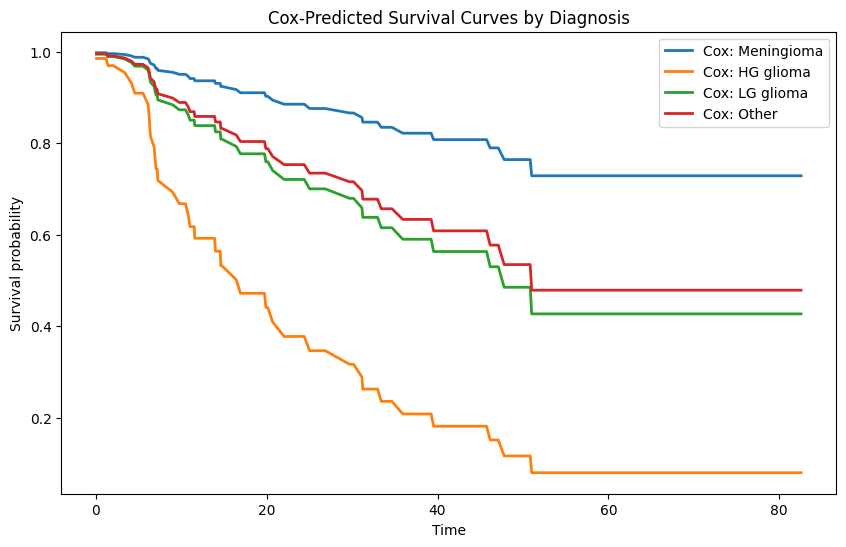

In [58]:
plt.figure(figsize=(10,6))

diagnoses = df["diagnosis"].str.strip().dropna().unique()

for g in diagnoses:
    profile = make_profile(g)
    
    surv = cph.predict_survival_function(profile)
    
    plt.plot(
        surv.index,
        surv.values.flatten(),
        linewidth=2,
        label=f"Cox: {g}"
    )

plt.title("Cox-Predicted Survival Curves by Diagnosis")
plt.xlabel("Time")
plt.ylabel("Survival probability")
plt.legend()
plt.show()

This note isolates the semi-parametric **Cox Proportional Hazards (CPH)** regression curves. It displays the model's predictions for each diagnostic cohort when continuous and demographic variables are adjusted and held constant at their dataset averages.

#### Underlying Mathematical Mechanics

The Cox Proportional Hazards model separates time-dependent risk from covariate-dependent risk using the following hazard function formula:

$$h(t \mid X) = h_0(t) \cdot e^{\beta_1 X_1 + \beta_2 X_2 + \dots + \beta_p X_p}$$

Where:
* $h_0(t)$ = The shared, non-parametric **baseline hazard function** that represents the underlying "clock" of risk over time.
* $e^{\beta X}$ = The parametric component representing the **Hazard Ratio (HR)** for a specific profile, which acts as a scaling multiplier.

##### Visual Properties of Semi-Parametric Curves:
* **The Shared Heartbeat:** Notice that every single curve takes a step downward at the exact same time points. They share a single, underlying, baseline risk clock $h_0(t)$ estimated from the entire dataset. 
* **Proportional Constraints:** Because the hazard ratio ($e^\beta$) is a constant multiplier that does not depend on time, the curves are mathematically restricted from crossing, converging, or showing group-specific timing features. They are locked into a fixed vertical hierarchy.

---

#### Model Interpretations & Covariate Control

In this specific visualization, all other model covariates are held constant at their mean values (e.g., Gross Tumor Volume `gtv` is set to the dataset average, Karnofsky index `ki` is set to average, and baseline sex is fixed). This allows us to isolate the pure predicted impact of **Diagnosis**:

* **Cox: Meningioma (Blue Curve):** Assigned the lowest hazard ratio multiplier by the model, shifting the shared baseline hazard to the highest position on the survival probability axis.
* **Cox: Other (Red Curve) & Cox: LG Glioma (Green Curve):** The model views these two diagnoses as carrying almost identical risk. Because their calculated $\beta$ coefficients are highly similar, their curves track nearly parallel and on top of each other throughout the timeline.
* **Cox: HG Glioma (Orange Curve):** Assigned a massive hazard ratio multiplier ($e^\beta \gg 1.0$). This dramatically scales up the baseline hazard, compressing its predicted survival curve downward toward the bottom of the axis.

---

> The Cox-Predicted plot represents an idealized, smoothed mathematical representation of risk based on the **Proportional Hazards Assumption**. By comparing this plot to the empirical Kaplan-Meier curves, an engineer or statistician can immediately spot model limitations. 
> For instance, while the raw data shows **LG Glioma** (Green) and **Other** (Red) separating wildly after Month 30, this plot shows them locked together forever. This over-smoothing occurs because a single Cox model forces all groups to conform to the average behavior of the dataset, trading group-specific nuances for general statistical power and multi-variable adjustment capabilities.

## Forest Plot

In [59]:
# extract summary table from lifelines model
summary = cph.summary.copy()

# keep only relevant columns
forest_df = summary[[
    "exp(coef)",
    "exp(coef) lower 95%",
    "exp(coef) upper 95%"
]]

forest_df = forest_df.sort_values("exp(coef)")

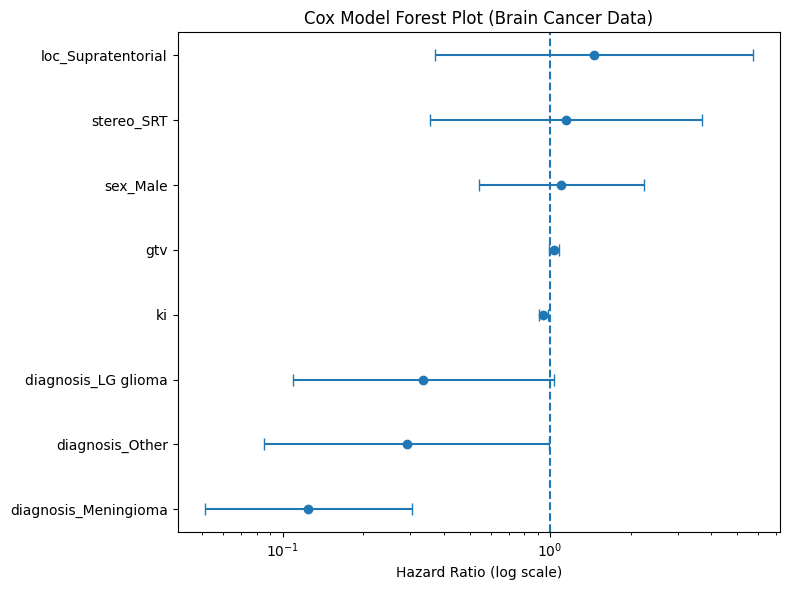

In [60]:
plt.figure(figsize=(8,6))

y_labels = forest_df.index
x = forest_df["exp(coef)"]
xerr_low = x - forest_df["exp(coef) lower 95%"]
xerr_high = forest_df["exp(coef) upper 95%"] - x

plt.errorbar(
    x,
    range(len(x)),
    xerr=[xerr_low, xerr_high],
    fmt='o',
    capsize=4
)

plt.yticks(range(len(x)), y_labels)
plt.axvline(1, linestyle="--")
plt.xscale("log")

plt.xlabel("Hazard Ratio (log scale)")
plt.title("Cox Model Forest Plot (Brain Cancer Data)")
plt.tight_layout()
plt.show()

A **Forest Plot** is the standard visual tool used in survival analysis to display the coefficients of a Cox Proportional Hazards regression model. Instead of looking at a raw text table of coefficients ($\beta$), this plot visualizes the estimated **Hazard Ratios (HR)** along with their **95% Confidence Intervals (CI)**.

To interpret any variable on this plot, you must look at three structural elements: **The Null Line, the Point Estimate, and the Error Bars.**

#### The Null Line ($\text{HR} = 1.0$)
The vertical dashed line at $1.0$ is the baseline of "no statistical difference."
* **$\text{HR} = 1.0$**: The covariate has absolutely zero effect on the risk of death.
* **$\text{HR} > 1.0$ (Right of the line)**: Increased risk. Exposure to this variable accelerates the event rate (shorter survival time).
* **$\text{HR} < 1.0$ (Left of the line)**: Decreased risk / Protective effect. This variable is associated with a lower risk of death (longer survival time).

#### 🔵 The Point Estimate (The Dot)
The solid blue dot represents the calculated Hazard Ratio ($e^{\beta}$) for that specific covariate. This is the most likely mathematical effect size given your data.

#### The Error Bars (Horizontal Whiskers)
The horizontal lines spanning out from each dot represent the **95% Confidence Interval**.
* **Statistical Significance Test:** If an error bar **crosses the vertical dashed line at 1.0**, the variable is **not statistically significant** ($p > 0.05$). It means the data cannot confidently rule out that the true effect size is actually zero.
* **If it does not cross 1.0**, the variable is a statistically significant predictor of survival ($p < 0.05$).

⚠️ **Note on the Scale:** The x-axis uses a **Logarithmic Scale** ($\log_{10}$ or natural log layout). This is mathematically necessary because Hazard Ratios are multiplicative geometric factors (e.g., an HR of $0.1$ is the exact inverse magnitude of an HR of $10.0$, so they deserve equal visual distance from $1.0$).

---
Let's break down the predictors from the `BrainCancer` model based on their visual placement:

#### Non-Significant Predictors (Crosses the Null Line)
* **`loc_Supratentorial`**: The error bars heavily overlap $1.0$. Tumor location (above vs. below the tentorium) does not show a statistically reliable impact on survival.
* **`stereo_SRT`**: This compares fractionated stereotactic radiotherapy (SRT) against the baseline method (SRS). Because the whiskers cross $1.0$, we cannot claim one stereotactic method performs better than the other in this sample.
* **`sex_Male`**: Being male sits slightly right of the line, but its confidence interval comfortably crosses $1.0$, meaning sex is not a significant driver of mortality here.

#### Significant Continuous Variables (Tight Whisker Profiles)
* **`gtv` (Gross Tumor Volume)**: The dot sits just to the *right* of $1.0$, and the error bars are incredibly tight and do not touch $1.0$. **Interpretation:** As tumor volume increases by 1 cubic centimeter, the risk of death significantly increases.
* **`ki` (Karnofsky Index)**: The dot sits just to the *left* of $1.0$ with a very narrow, significant interval. **Interpretation:** The Karnofsky Index measures a patient's functional status/well-being (higher score = better functional health). Because $\text{HR} < 1.0$, higher performance status acts as a significant protective factor, reducing the daily hazard rate.

#### Significant Categorical Predictors (The Diagnosis Reference Group)
Notice that **`diagnosis_HG glioma`** is completely missing from the y-axis. That is because it was omitted during dummy encoding (`drop_first=True`) and serves as the baseline **Reference Category** that all other diagnoses are being actively measured against.

Compared against High-Grade (HG) Gliomas:
* **`diagnosis_Meningioma`**: Sits far to the left ($\text{HR} \approx 0.12$). It is highly significant. Patients with Meningiomas have roughly an $88\%$ lower risk of death at any given time point compared to HG Glioma patients.
* **`diagnosis_Other` & `diagnosis_LG glioma`**: Both sit significantly to the left of $1.0$. This demonstrates that Low-Grade Gliomas and "Other" classifications carry a significantly lower hazard rate than aggressive High-Grade tumors.

---
> The forest plot reveals that **Tumor Diagnosis** is the most powerful predictor of survival, where all other diagnoses exhibit a massive, statistically significant protective survival effect when compared directly against the high-risk baseline of **High-Grade Gliomas**. Beyond tumor classification, a patient's baseline physical functionality (**`ki`**, protective) and physical tumor size (**`gtv`**, hazardous) are the only other significant drivers of survival variance. Demographic features (`sex`) and treatment methods (`stereo`) do not show significant impacts.

## Empirical Analysis: Kaplan-Meier Survival Curves by Diagnosis

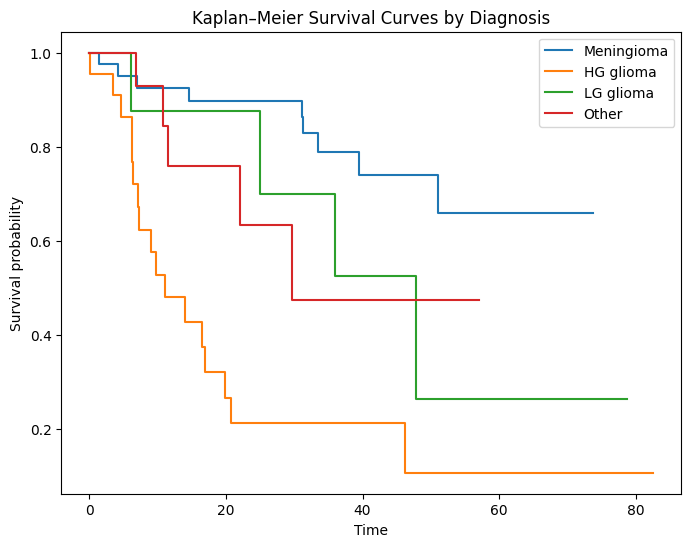

In [61]:
# safety cleanup (important even if data looks clean)
df["diagnosis"] = df["diagnosis"].str.strip()

kmf = KaplanMeierFitter()

plt.figure(figsize=(8,6))

for g in df["diagnosis"].dropna().unique():
    mask = df["diagnosis"] == g
    
    # safety check (THIS fixes your error)
    if mask.sum() == 0:
        continue
    
    kmf.fit(
        durations=df.loc[mask, "time"].astype(float),
        event_observed=df.loc[mask, "status"].astype(int),
        label=g
    )
    kmf.plot(ci_show=False)

plt.title("Kaplan–Meier Survival Curves by Diagnosis")
plt.xlabel("Time")
plt.ylabel("Survival probability")
plt.show()

This note analyzes the non-parametric **Kaplan-Meier (KM)** estimation of survival probabilities stratified purely by diagnostic category, reflecting the empirical, raw data profiles without covariate adjustments.

#### Underlying Mathematical Mechanics

The Kaplan-Meier estimator is a non-parametric statistic used to estimate the survival function $S(t)$ from lifetime data. It computes the probability of surviving past a distinct time point $t_i$ using the product of conditional probabilities:

$$S(t) = \prod_{t_i \le t} \left(1 - \frac{d_i}{n_i}\right)$$

Where:
* $d_i$ = The number of distinct events (deaths) occurring at time point $t_i$.
* $n_i$ = The total number of individuals surviving and remaining **at risk** just prior to time $t_i$.

##### Visual Properties of Non-Parametric Curves:
* **True Empirical Steps:** The lines change vertical level **only** at the precise timestamp a patient within that specific group passes away. If there are no deaths in a group over a long period, its curve remains completely flat.
* **Censoring Representation:** Patients who drop out or remain alive at the end of the study (censored data) do not cause a downward step; instead, they are dropped from the denominator ($n_i$) for subsequent risk calculations.
* **Independence:** Each diagnostic group's curve is calculated completely independently of the other groups.

---

#### Clinical Profiling of Diagnostic Groups

The raw empirical step functions illuminate distinct survival profiles and disease behaviors:

* **High-Grade (HG) Glioma (Orange Curve):** Demonstrates an aggressive, immediate risk profile. The curve drops steeply from the first month, with more than half of the cohort passing away before Month 15 ($S(t) < 0.5$). It stabilizes late near a $10\%$ survival floor.
* **Meningioma (Blue Curve):** Exhibits the most favorable clinical trajectory. Deaths are sparse and evenly distributed, with approximately $65\%$ of patients surviving past the 70-month mark. 
* **Low-Grade (LG) Glioma (Green Curve):** Displays a highly unique, delayed risk pattern. It tracks identically to the benign Meningioma cohort for the first 24 months, showing near $90\%$ survival. However, around Month 48, it suffers a severe, sudden drop down to the $26\%$ mark, suggesting a late-stage progression or recurrence threshold typical of low-grade tumors.
* **Other (Red Curve):** Shows intermediate, early volatility that flattens completely into a stable survival plateau of roughly $48\%$ after Month 30.

---

> The Kaplan-Meier plot is the fundamental starting point of survival analysis because it shows the untampered reality of the data. The stark structural differences between groups—such as the delayed cliff-drop in **LG Glioma** versus the constant step-downs of **HG Glioma**—serve as a vital warning sign that a standard regression model assuming a constant, proportional hazard ratio over time may fail to capture the true underlying epidemiology.

## Model Comparison: Kaplan-Meier vs. Cox Proportional Hazards

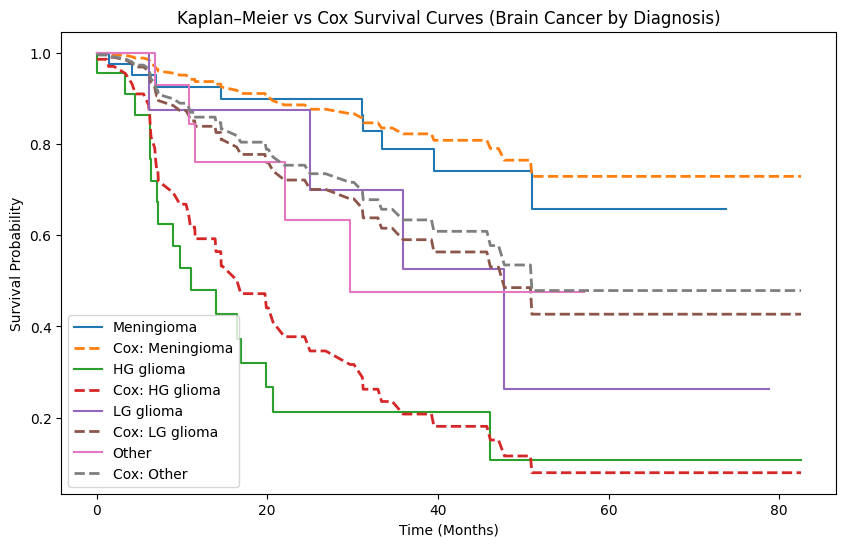

In [76]:
# --- 1. Clean Design Matrix Creation ---
# Keep it clean: directly map dummy variables and drop 'status' simultaneously
df_model = pd.get_dummies(
    df.rename(columns={"status": "event"}), 
    columns=["sex", "diagnosis", "loc", "stereo"], 
    drop_first=True
)

# --- 2. Fit Cox Model ---
cph = CoxPHFitter().fit(df_model, duration_col="time", event_col="event")

# --- 3. Plotting Setup ---
fig, ax = plt.subplots(figsize=(10, 6))
kmf = KaplanMeierFitter()
diagnoses = df["diagnosis"].dropna().unique()

# --- 4. Foolproof Curves Generation ---
for g in diagnoses:
    # A. Plot Kaplan-Meier (Solid lines)
    mask = df["diagnosis"] == g
    kmf.fit(df.loc[mask, "time"], df.loc[mask, "status"], label=g)
    kmf.plot_survival_function(ax=ax, ci_show=False)
    
    # B. Build Profile & Plot Cox (Dashed lines)
    profile = df_model.drop(columns=["time", "event"]).mean().to_frame().T
    
    # Set background baseline profile assumptions
    profile[["sex_Male", "stereo_SRT"]] = 0
    profile["loc_Supratentorial"] = 1
    
    # Reset all diagnosis dummies to 0, then switch ONLY the current group to 1
    diag_cols = [c for c in profile.columns if "diagnosis_" in c]
    profile[diag_cols] = 0
    if f"diagnosis_{g}" in profile.columns:
        profile[f"diagnosis_{g}"] = 1
        
    # Get the survival curve DataFrame
    surv_df = cph.predict_survival_function(profile)
    
    # FIX: Extract the raw index (Time) and values, then use native ax.plot
    # This completely bypasses pandas' naming quirks and locks in your custom label.
    ax.plot(
        surv_df.index, 
        surv_df.values.flatten(), 
        ls="--", 
        lw=2, 
        label=f"Cox: {g}"
    )

# --- 5. Final Polishing ---
ax.set(
    title="Kaplan–Meier vs Cox Survival Curves (Brain Cancer by Diagnosis)",
    xlabel="Time (Months)",
    ylabel="Survival Probability"
)
ax.legend()
plt.show()

This analysis evaluates the baseline survival curve estimation using the `BrainCancer` dataset, directly comparing the non-parametric **Kaplan-Meier (KM)** empirical curves against the semi-parametric **Cox Proportional Hazards (CPH)** regression curves across different diagnostic groups.

---

### 1. The Core Geometric & Theoretical Differences

| Feature | Kaplan-Meier (Solid Lines) | Cox Proportional Hazards (Dashed Lines) |
| :--- | :--- | :--- |
| **Model Type** | Non-Parametric | Semi-Parametric |
| **Independence** | Evaluated completely independently per group. | Unified model; groups share information via a baseline hazard. |
| **Step Behavior** | Steps occur *only* when an event happens **within that specific group**. | Steps occur **simultaneously across all groups** whenever *any* event occurs. |
| **Mathematical Constraint** | No structural constraints; purely data-driven. | Constrained to be strictly parallel in log-hazard space. |

#### Visual Mechanics:
* **The Jagged Steps (KM):** The solid empirical lines don't care what neighboring cohorts are doing. If no one in the `Other` group dies for a 20-month stretch, its survival curve remains perfectly flat, regardless of volatility in the `HG glioma` group.
* **The Shared "Heartbeat" (Cox):** The dashed lines move in perfect, rhythmic synchronization. This happens because the Cox model isolates a single, shared global **baseline hazard function** $h_0(t)$. It then applies a fixed, time-invariant multiplier - the **Hazard Ratio** ($e^{\beta}$) - to scale this baseline curve up or down for each specific diagnosis. 

---

### 2. Clinical Interpretation of Tumor Severity

Plotting empirical KM curves alongside fitted Cox curves is an industry-standard graphical method to evaluate if the **Proportional Hazards (PH) assumption** holds up. If the assumption is valid, the dashed lines should closely track their solid counterparts.

#### 🔴 High-Grade (HG) Glioma (Green Solid vs. Red Dashed)
* **The Clinical Reality:** This represents the most aggressive tumor type in the study. The empirical KM data (solid green line) plummets rapidly, dropping below a $30\%$ survival probability before Month 20.
* **The Cox Model Fit:** The Cox model (red dashed line) tracks this group **exceptionally well**. Because it successfully captures the steep, early drop-off, the proportional hazards framework is highly effective for this specific high-risk profile.

#### 🟠 Meningioma (Blue Solid vs. Orange Dashed)
* **The Clinical Reality:** As a typically benign or slow-growing tumor, Meningioma has a highly favorable prognosis. The empirical data (solid blue line) remains elevated throughout the study duration.
* **The Cox Model Fit:** The orange dashed line sits visibly *above* the solid blue line across almost the entire timeline. Because the Cox model calculates a single global baseline hazard scaled by a multiplier, the presence of the highly aggressive HG Glioma group distorts the baseline curve. As a result, the model systematically **overestimates** the survival probability for Meningioma patients.

#### 🟣 Low-Grade (LG) Glioma (Purple Solid vs. Brown Dashed)
* **The Clinical Reality:** The empirical data (solid purple line) reveals a distinct, non-linear risk profile. Survival remains high (near $90\%$) for the first 35 months, followed by a massive, delayed structural drop around Month 48.
* **The Cox Model Fit:** The Cox model (brown dashed line) completely fails to capture this delayed hazard. Constrained to assume a continuous, proportional risk from Month 0, it **underestimates survival during the first 3 years** and drastically **overestimates survival after Month 50**.

---

### 3. Methodological Takeaways

* **Baseline Hazard Distortion:** When a dataset contains cohorts with extreme differences in risk (e.g., benign Meningiomas vs. highly aggressive HG Gliomas), the shared baseline hazard $h_0(t)$ gets heavily pulled toward the high-event groups. 
* **Violation of Proportionality:** The delayed mortality drop in LG Gliomas is a classic example of a time-dependent effect. The risk relative to other groups changes over time, breaking the core assumption that hazard ratios must remain constant ($\beta$ is fixed across $t$).

### 4. Diagnostic Conclusion
> The corrected visualization demonstrates that a single standard Cox Proportional Hazards model struggles to accommodate the diverse clinical trajectories present in these diagnoses. 
> 
> While it models the aggressive **HG Glioma** path accurately, the strict assumption of proportionality forces it to over-smooth the other cohorts. It fails to account for the prolonged early survival of **LG Glioma** (delayed risk) and overestimates the survival of **Meningioma** due to baseline hazard distortion. In production or clinical reporting, this visual misfit signals that you should consider using **stratified Cox models** (giving each diagnosis its own baseline hazard) or **time-varying coefficients** ($\beta(t)$) to capture the true epidemiological behavior.

**--- End of Section: 11.5-Cox_Hazards_Model ---**

---


# --- Section from: 12.2-K_Clustering ---


# K-Means Clustering

In [3]:
np.random.seed(2)

# First cluster
X1 = np.random.normal(size=(25, 2))

# Second cluster with mean shift
X2 = np.random.normal(loc=3, size=(25, 2))

# Combine into one dataset
X = np.vstack([X1, X2])

# True labels (for comparison only)
true_labels = np.array([0]*25 + [1]*25)

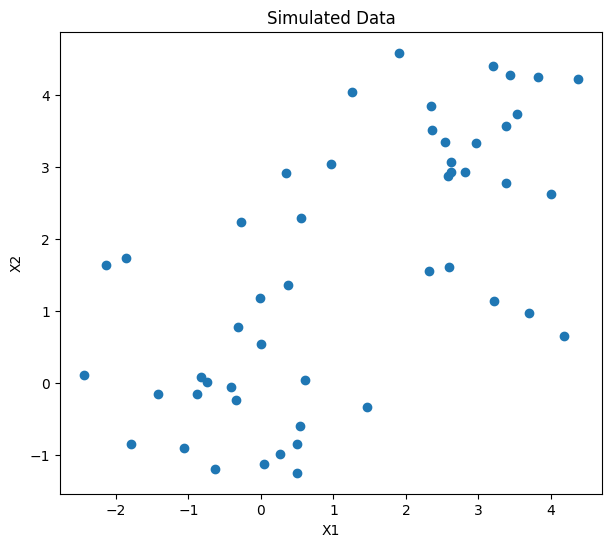

In [4]:
plt.figure(figsize=(7, 6))

plt.scatter(X[:, 0], X[:, 1])

plt.xlabel("X1")
plt.ylabel("X2")
plt.title("Simulated Data")

plt.show()

In [5]:
kmeans = KMeans(
    n_clusters=2,
    n_init=20,
    random_state=2
)

kmeans.fit(X)

,n_clusters,2
,init,'k-means++'
,n_init,20
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,2
,copy_x,True
,algorithm,'lloyd'


In [6]:
cluster_labels = kmeans.labels_

In [7]:
centers = kmeans.cluster_centers_
print(centers)

[[-0.45293017  0.04331098]
 [ 2.72997495  3.01836148]]


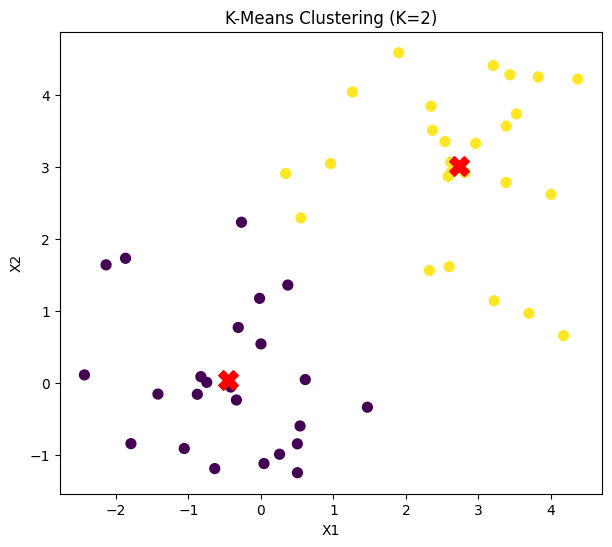

In [8]:
plt.figure(figsize=(7, 6))

plt.scatter(
    X[:, 0],
    X[:, 1],
    c=cluster_labels,
    cmap="viridis",
    s=50
)

# Plot centroids
plt.scatter(
    centers[:, 0],
    centers[:, 1],
    c="red",
    s=200,
    marker="X"
)

plt.xlabel("X1")
plt.ylabel("X2")
plt.title("K-Means Clustering (K=2)")

plt.show()

In [9]:
pd.crosstab(cluster_labels, true_labels)

col_0,0,1
row_0,,
0,24,0
1,1,25


## 1. Optimization Problem

K-means clustering minimizes the **within-cluster sum of squares (WCSS)**:

$$
\sum_{k=1}^{K}
\sum_{i \in C_k}
\|x_i - \mu_k\|^2
$$

where:

- $C_k$ = set of observations belonging to cluster $k$
- $\mu_k$ = centroid (mean vector) of cluster $k$

---

## 2. Geometric Meaning

K-means attempts to:

- make observations close to their assigned centroid
- produce compact, spherical clusters
- minimize within-cluster variability

Because squared Euclidean distance is used, observations far from the centroid are penalized heavily.

---

## 3. The K-Means Algorithm

The algorithm proceeds iteratively.

---

### Step 1 — Initialize Centroids

Choose $K$ initial centroids randomly.

These are initial guesses for the cluster centers.

---

### Step 2 — Assignment Step

Assign each observation to the nearest centroid:

$$
\text{cluster}(x_i)
=
\arg\min_k
\|x_i - \mu_k\|^2
$$

This partitions the data into $K$ clusters.

---

### Step 3 — Update Step

Recompute each centroid using the mean of the observations assigned to that cluster:

$$
\mu_k
=
\frac{1}{|C_k|}
\sum_{i \in C_k} x_i
$$

where:

- $|C_k|$ = number of observations in cluster $k$

---

### Step 4 — Repeat

Repeat:

1. assignment step
2. update step

until convergence.

Typically convergence occurs when:
- cluster assignments stop changing, or
- centroid movement becomes negligible.

---

## 4. Why `n_init=20` Matters

K-means depends heavily on initialization.

Different random starting centroids can produce:
- different local minima
- different cluster assignments

Therefore:

```python
n_init=20
```

means:

- run K-means 20 separate times
- use different random initializations
- keep the solution with the lowest objective value

This is extremely important in practice because K-means optimization is non-convex.

---

## 5. Conceptual Difference vs Hierarchical Clustering

| K-Means | Hierarchical Clustering |
|---|---|
| Must choose $K$ beforehand | No need to specify $K$ initially |
| Optimizes an objective function | Greedy merging procedure |
| Produces a flat partition | Produces a hierarchy |
| Assumes compact spherical clusters | More flexible cluster shapes |
| Sensitive to initialization | Deterministic (given linkage rule) |

---

## 6. Importance of Scaling

K-means uses Euclidean distance:

$$
d(x_i, x_j)
=
\sqrt{
\sum_{p=1}^{P}
(x_{ip}-x_{jp})^2
}
$$

Therefore variables with larger numerical scales dominate the distance calculation.

## 7. Standardization

To avoid scale dominance, variables are often standardized:

$$
z
=
\frac{x - \mu}{\sigma}
$$

where:
- $\mu$ = variable mean
- $\sigma$ = variable standard deviation

After standardization:
- mean becomes 0
- variance becomes 1

This ensures variables contribute more equally to Euclidean distance.

---

## 8. Standardization in Python

```python
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)
```

---

## 9. Deep Geometric Interpretation

Without scaling, K-means minimizes:

$$
\sum_{k=1}^{K}
\sum_{i \in C_k}
\sum_{j=1}^{p}
(x_{ij} - \mu_{kj})^2
$$

Variables with larger variance automatically contribute more to the objective function.

Therefore scaling changes:
- the geometry of the feature space
- the optimization landscape
- the resulting clusters themselves

---

## 10. Connection to PCA

This is the same issue encountered in PCA.

Without standardization:
- high-variance variables dominate principal components

Therefore both:
- PCA
- K-means

are highly sensitive to feature scale because both fundamentally rely on Euclidean geometry.

# Inertia (Within-Cluster Sum of Squares)

In [15]:
inertias = []

K_range = range(1, 11)

for K in K_range:
    kmeans = KMeans(
        n_clusters=K,
        n_init=20,
        random_state=2
    )
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)

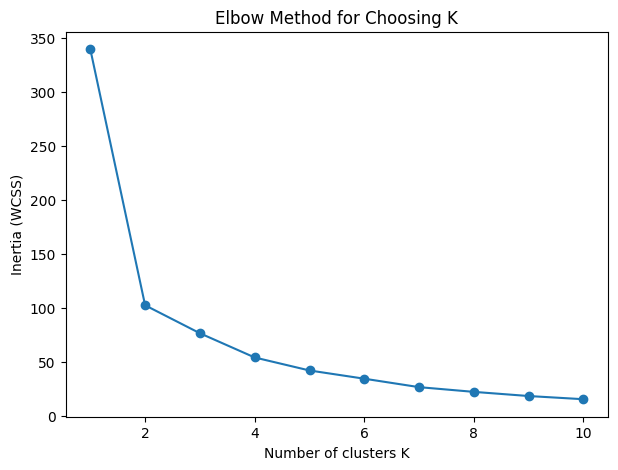

In [16]:
plt.figure(figsize=(7,5))
plt.plot(K_range, inertias, marker='o')
plt.xlabel("Number of clusters K")
plt.ylabel("Inertia (WCSS)")
plt.title("Elbow Method for Choosing K")
plt.show()

In K-means clustering, the fundamental quantity being minimized is the **inertia**, also called the **within-cluster sum of squares (WCSS)**.

## Definition

For a clustering into $K$ clusters $C_1, \dots, C_K$, inertia is defined as:

$$
\text{Inertia} =
\sum_{k=1}^{K}
\sum_{i \in C_k}
\|x_i - \mu_k\|^2
$$

where:
- $x_i$ is an observation
- $\mu_k$ is the centroid of cluster $k$
- $C_k$ is the set of observations assigned to cluster $k$

---

## Interpretation

Inertia measures:

> the total squared distance between each point and its assigned cluster center.

So it quantifies **cluster compactness**:

- low inertia → points are close to their centroids → tight clusters
- high inertia → points are spread out → loose clusters

---

## Key Properties

### 1. Always decreases with $K$
As the number of clusters increases:

- clusters become smaller
- centroids better fit local structure
- therefore inertia decreases

Formally:
$$
\text{Inertia}(K+1) \leq \text{Inertia}(K)
$$

---

### 2. Extreme cases

- $K = 1$: all points in one cluster → maximum inertia
- $K = n$: each point is its own cluster → inertia = 0

---

## Role in Model Selection (Elbow Method)

Plotting inertia against $K$ typically yields a decreasing curve.

The **elbow point** is where the marginal gain in reducing inertia starts diminishing:

> This is often used as a heuristic for choosing $K$.

---

## Limitation

> Inertia always improves with larger $K$, so it does not penalize model complexity. This makes it insufficient as a standalone criterion for selecting the number of clusters.

# Silhouette Score — Cluster Quality via Separation vs Cohesion

In [17]:
sil_scores = []

K_range = range(2, 11)  # silhouette undefined for K=1

for K in K_range:
    kmeans = KMeans(
        n_clusters=K,
        n_init=20,
        random_state=2
    )
    labels = kmeans.fit_predict(X)
    score = silhouette_score(X, labels)
    sil_scores.append(score)

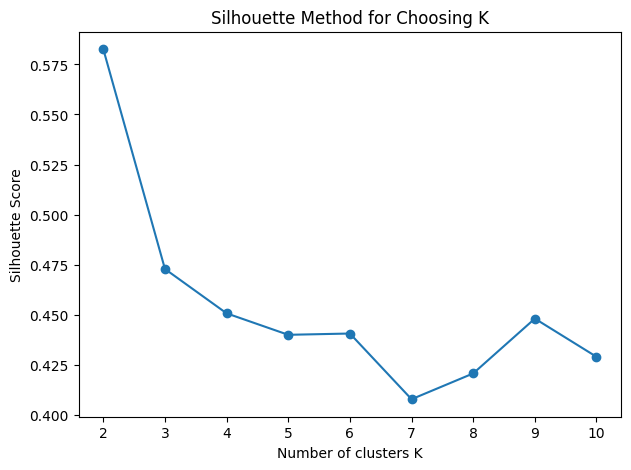

In [18]:
plt.figure(figsize=(7,5))
plt.plot(K_range, sil_scores, marker='o')
plt.xlabel("Number of clusters K")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Method for Choosing K")
plt.show()

The silhouette score evaluates how well each observation fits within its assigned cluster compared to other clusters.

It combines **within-cluster cohesion** and **between-cluster separation**.

---

For each observation $i$, define:

### 1. Cohesion (within-cluster distance)
$$
a(i) = \frac{1}{|C_i| - 1} \sum_{j \in C_i, j \neq i} d(i, j)
$$

This measures the **average distance from point \(i\) to all other points in its own cluster**.

---

### 2. Separation (nearest other cluster distance)
$$
b(i) = \min_{k \neq C_i} \frac{1}{|C_k|} \sum_{j \in C_k} d(i, j)
$$

This measures the **average distance from point \(i\) to the closest other cluster**.

---

### 3. Silhouette value

$$
s(i) = \frac{b(i) - a(i)}{\max(a(i), b(i))}
$$

---

## Interpretation

The silhouette score lies in:

$$
-1 \leq s(i) \leq 1
$$

### Meaning:

- $s(i) \approx 1$: well-clustered (far from other clusters, close to own)
- $s(i) \approx 0$: on cluster boundary
- $s(i) < 0$: likely misclassified

---

## Overall silhouette score

The global score is the average over all observations:

$$
S = \frac{1}{n} \sum_{i=1}^n s(i)
$$

---

## Interpretation at dataset level

- High silhouette score → well-separated, compact clusters
- Low silhouette score → overlapping or poorly defined clusters

---

## Strengths

- Captures both **cohesion and separation**
- Provides a single interpretable metric
- Useful for comparing different values of $K$

---

## Limitations

- Assumes meaningful distance geometry (Euclidean structure)
- Can fail for:
  - non-convex clusters
  - clusters with unequal density
  - high-dimensional noisy data

# Additional K-Means Diagnostics and Interpretation Tools

This section introduces three complementary tools for analysing K-means clustering beyond simple fitting: the **Gap Statistic**, **Voronoi decision regions**, and **cluster profiling**. Together, they provide insight into model selection, geometric structure, and statistical interpretation of clusters.

## Gap Statistic — Model-Based Choice of $K$

The Gap Statistic provides a principled way to select the number of clusters by comparing observed clustering performance to that expected under a null (no structure) reference distribution.

For a given $K$, define:

$$
\text{Gap}(K) = \log(W_K^{\text{null}}) - \log(W_K^{\text{real}})
$$

where:
- $W_K^{\text{real}}$: within-cluster sum of squares (inertia) on the observed data
- $W_K^{\text{null}}$: expected inertia under uniformly distributed data

#### Interpretation

- Large Gap value → strong evidence of cluster structure
- Small Gap value → clustering similar to random noise
- The optimal $K$ is typically where the Gap is maximised


In [19]:
def gap_statistic(X, K, B=10):
    km = KMeans(n_clusters=K, n_init=20, random_state=2)
    km.fit(X)
    W_real = km.inertia_

    n, d = X.shape
    W_rand = []

    for b in range(B):
        X_rand = np.random.uniform(X.min(axis=0), X.max(axis=0), size=(n, d))
        km_rand = KMeans(n_clusters=K, n_init=10, random_state=b)
        km_rand.fit(X_rand)
        W_rand.append(km_rand.inertia_)

    W_rand = np.mean(W_rand)

    return np.log(W_rand) - np.log(W_real)

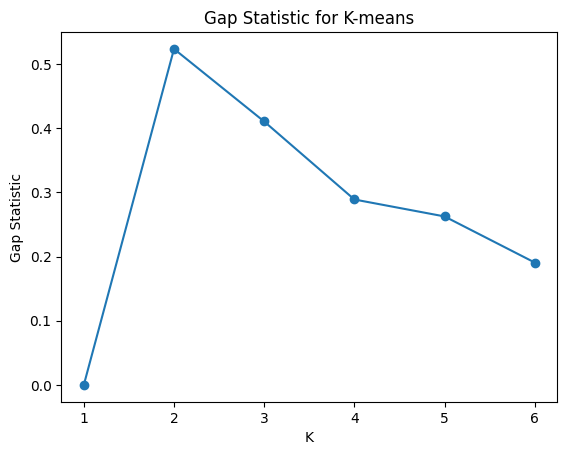

In [20]:
K_range = range(1, 7)
gaps = []

for K in K_range:
    if K == 1:
        gaps.append(0)  # undefined baseline
    else:
        gaps.append(gap_statistic(X, K))

plt.plot(K_range, gaps, marker='o')
plt.xlabel("K")
plt.ylabel("Gap Statistic")
plt.title("Gap Statistic for K-means")
plt.show()

# Voronoi Decision Regions (K-means geometry)

In [22]:
kmeans = KMeans(
    n_clusters=2,
    n_init=20,
    random_state=2
)

kmeans.fit(X)

,n_clusters,2
,init,'k-means++'
,n_init,20
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,2
,copy_x,True
,algorithm,'lloyd'


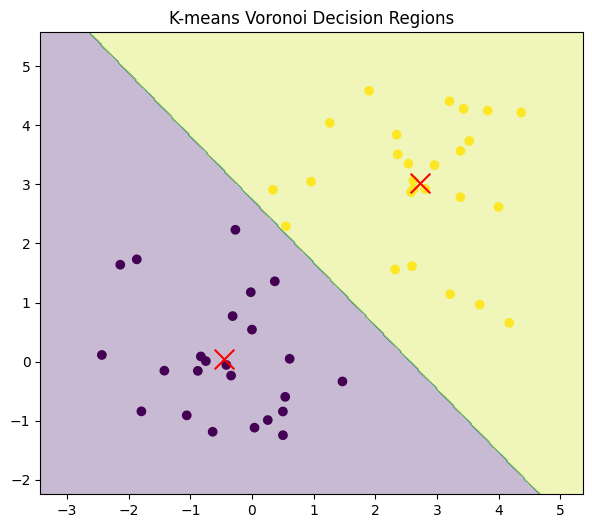

In [23]:
h = 0.02

x_min, x_max = X[:,0].min()-1, X[:,0].max()+1
y_min, y_max = X[:,1].min()-1, X[:,1].max()+1

xx, yy = np.meshgrid(
    np.arange(x_min, x_max, h),
    np.arange(y_min, y_max, h)
)

Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(7,6))
plt.contourf(xx, yy, Z, alpha=0.3)
plt.scatter(X[:,0], X[:,1], c=kmeans.labels_)
plt.scatter(kmeans.cluster_centers_[:,0],
            kmeans.cluster_centers_[:,1],
            c='red', marker='x', s=200)

plt.title("K-means Voronoi Decision Regions")
plt.show()

## Key property

Each observation is assigned according to:

$$
\text{cluster}(x_i) = \arg\min_k \|x_i - \mu_k\|^2
$$

This induces a partition of the space into convex regions.

---

## Geometric interpretation

- Each centroid defines a region of influence
- Boundaries between clusters are linear hyperplanes
- The space is fully partitioned into Voronoi cells


# Cluster Profiling

In [24]:
kmeans = KMeans(n_clusters=2, n_init=20, random_state=2)
labels = kmeans.fit_predict(X)

In [25]:
df = pd.DataFrame(X, columns=["x1", "x2"])
df["cluster"] = labels

In [27]:
summary_mean = df.groupby("cluster").mean()
summary_std = df.groupby("cluster").std()

display(summary_mean)
display(summary_std)

,x1,x2
cluster,,
0,-0.452930,0.043311
1,2.729975,3.018361


,x1,x2
cluster,,
0,0.974125,0.995059
1,1.057935,1.097387


For each cluster $k$, compute:

- Mean:
$$
\bar{x}_k = \frac{1}{|C_k|} \sum_{i \in C_k} x_i
$$

- Standard deviation (within-cluster variability)

- Cluster size:
$$
|C_k|
$$

---

## Interpretation

Cluster profiling transforms unsupervised learning into a descriptive statistical analysis:

- cluster centroids represent typical observations
- within-cluster variance measures homogeneity
- cluster sizes indicate prevalence of each group


**--- End of Section: 12.2-K_Clustering ---**

---


# --- Section from: 12.4-Hierarchical_Clustering ---


# PCA and Hierarchical Clustering

# NCI60 Gene Expression Data

We consider the NCI60 dataset, which consists of gene expression measurements for cancer cell lines.

- Number of observations: $n = 64$ cell lines  
- Number of variables: $p = 6830$ genes  

Thus, each observation is a point in a high-dimensional space:

$$
x_i \in \mathbb{R}^{6830}
$$

Each cell line also has an associated cancer type label. However, these labels are **not used in the analysis**, since both PCA and clustering are unsupervised methods.

The goal is:

> To investigate whether the intrinsic structure of gene expression data aligns with known cancer types.

In [12]:
df = pd.read_csv("NCI60labs.csv")
df.head()

,label
0,CNS
1,CNS
2,CNS
3,RENAL
4,BREAST


In [17]:
X = np.load("NCI60data.npy")
X

array([[ 0.3     ,  1.18    ,  0.55    , ...,  0.28    , -0.34    ,
        -1.93    ],
       [ 0.679961,  1.289961,  0.169961, ..., -0.770039, -0.390039,
        -2.000039],
       [ 0.94    , -0.04    , -0.17    , ..., -0.12    , -0.41    ,
         0.      ],
       ...,
       [ 0.21    , -0.62    , -0.15    , ...,  0.16    ,  2.03    ,
         3.94    ],
       [-0.05    ,  0.14    , -0.09    , ..., -0.49    ,  0.01    ,
        -1.72    ],
       [ 0.35    , -0.27    ,  0.02    , ...,  0.29    , -0.15    ,
         1.21    ]], shape=(64, 6830))

In [18]:
X.mean(), X.std()

(np.float64(0.02014832940996537), np.float64(0.7946184828947368))

In [21]:
labels = df["label"].values
print(labels[:5])

['CNS' 'CNS' 'CNS' 'RENAL' 'BREAST']


In [22]:
pca = PCA()
nci_scores = pca.fit_transform(X)

## 1. Principal Component Analysis (PCA)

PCA finds orthogonal directions of maximal variance in the data.

Each principal component is defined as:

$$
z_{ik} = x_i^T \phi_k
$$

where:
- $\phi_k$ is the $k$-th principal component direction
- $z_{ik}$ is the score of observation $i$ on component $k$

PCA solves:

$$
\max_{\phi} \mathrm{Var}(X\phi)
$$

subject to orthogonality constraints.

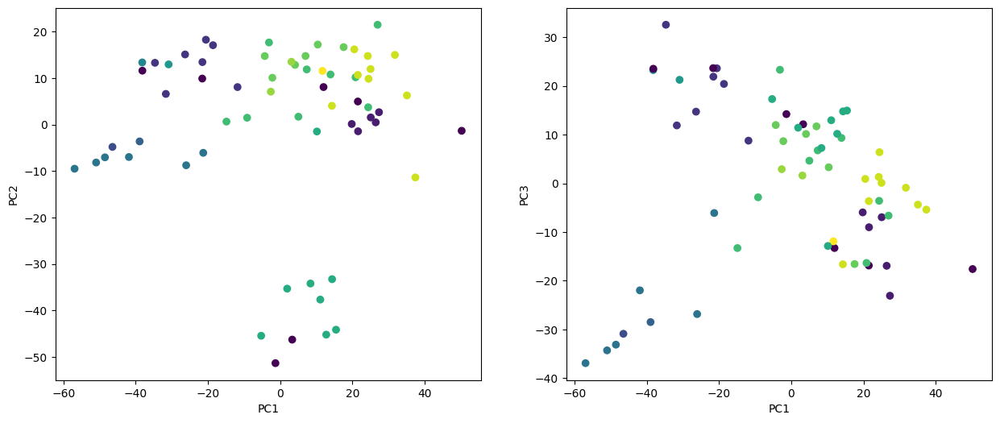

In [24]:
# map cancer labels to integers for coloring
cancer_types = list(np.unique(labels))
nci_groups = np.array([cancer_types.index(lab) for lab in labels])

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

axes[0].scatter(nci_scores[:, 0], nci_scores[:, 1], c=nci_groups)
axes[0].set_xlabel("PC1")
axes[0].set_ylabel("PC2")

axes[1].scatter(nci_scores[:, 0], nci_scores[:, 2], c=nci_groups)
axes[1].set_xlabel("PC1")
axes[1].set_ylabel("PC3")

plt.show()

## Interpretation of PCA Plot

Each point represents a cancer cell line projected into a low-dimensional space.

- PC1 captures the largest variation in gene expression
- PC2 and PC3 capture subsequent orthogonal variation

Although PCA is unsupervised, we use color (cancer type) only for interpretation.

If cancer types form clusters in this space, it suggests:

> cancer type is a major source of variation in gene expression.

## 2. Proportion of Variance Explained (PVE)

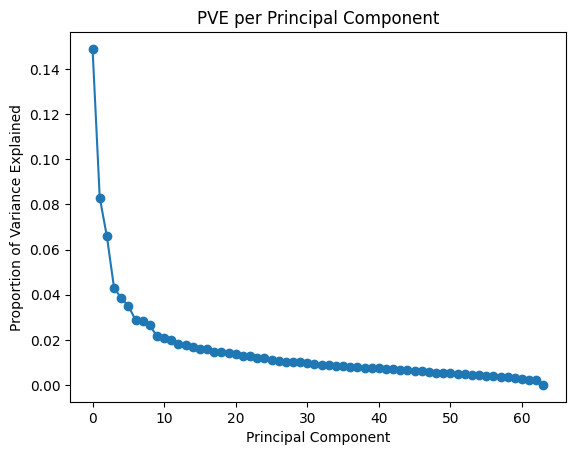

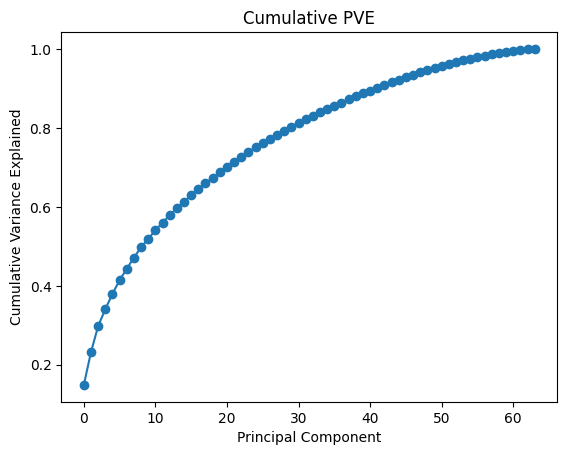

In [25]:
pve = pca.explained_variance_ratio_
cumulative_pve = np.cumsum(pve)

plt.figure()
plt.plot(pve, marker='o')
plt.title("PVE per Principal Component")
plt.xlabel("Principal Component")
plt.ylabel("Proportion of Variance Explained")
plt.show()

plt.figure()
plt.plot(cumulative_pve, marker='o')
plt.title("Cumulative PVE")
plt.xlabel("Principal Component")
plt.ylabel("Cumulative Variance Explained")
plt.show()

Each principal component explains a fraction of total variance:

$$
\text{PVE}_k = \frac{\lambda_k}{\sum_j \lambda_j}
$$

The cumulative PVE indicates how many components are needed to capture most of the structure in the data.

In high-dimensional genomic data, often a small number of components captures a meaningful fraction of variation.

## 3. Hierarchical Clustering

In [30]:
from scipy.cluster.hierarchy import dendrogram, linkage

Z_complete = linkage(X, method="complete", metric="euclidean")
Z_average  = linkage(X, method="average", metric="euclidean")
Z_single   = linkage(X, method="single", metric="euclidean")

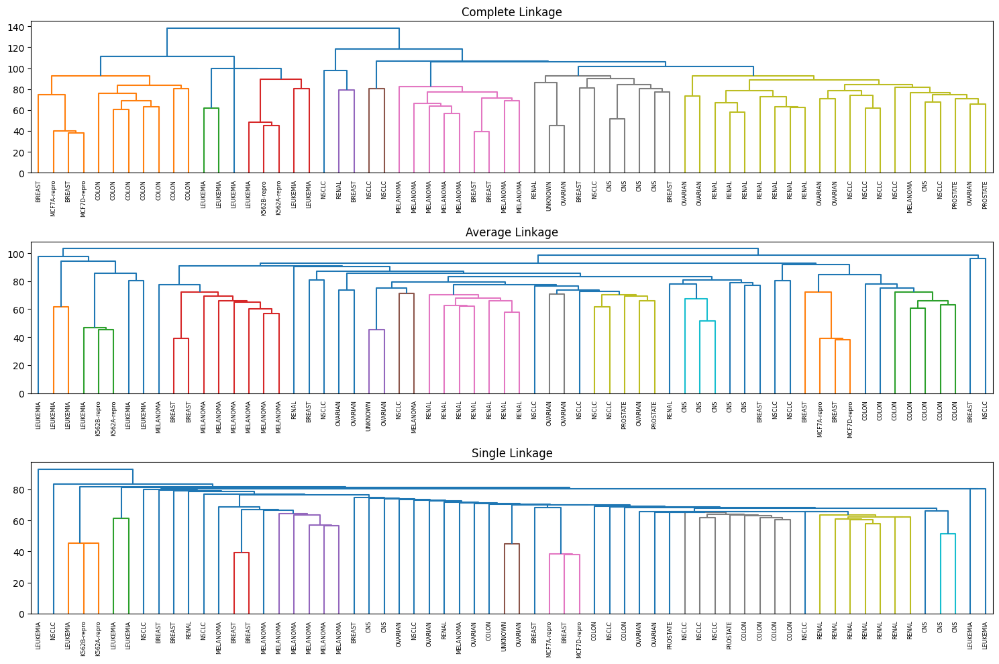

In [31]:
plt.figure(figsize=(15,10))

plt.subplot(3,1,1)
dendrogram(Z_complete, labels=labels)
plt.title("Complete Linkage")

plt.subplot(3,1,2)
dendrogram(Z_average, labels=labels)
plt.title("Average Linkage")

plt.subplot(3,1,3)
dendrogram(Z_single, labels=labels)
plt.title("Single Linkage")

plt.tight_layout()
plt.show()

### Linkage Criteria in Hierarchical Clustering

In agglomerative hierarchical clustering, we iteratively merge clusters based on a **linkage function**, which defines the distance between clusters.

Let:
- $A, B$ be clusters  
- $d(x_i, x_j)$ be a base distance (e.g. Euclidean distance)  
- $D(A,B)$ be the cluster-to-cluster distance  

Different linkage choices define different clustering geometries.

---

### 1. Single Linkage (Minimum Distance)

$$
D(A,B) = \min_{x \in A, \, y \in B} d(x,y)
$$

Clusters are merged if **any pair of points (one from each cluster) is close**.

- Captures connectivity between points
- Produces chain-like clusters (chaining effect)
- Can recover non-convex shapes

#### Pros
- Works well for irregular / manifold structures
- Sensitive to local structure

#### Cons
- Very sensitive to noise and outliers
- Can create long, thin clusters

---

### 2. Complete Linkage (Maximum Distance)

$$
D(A,B) = \max_{x \in A, \, y \in B} d(x,y)
$$

Clusters are merged only if **all points are close to each other**.

- Controls cluster diameter
- Encourages compact clusters

#### Pros
- Produces well-separated clusters
- Reduces chaining effect

#### Cons
- Sensitive to outliers
- Can split elongated clusters

---

### 3. Average Linkage (UPGMA)

$$
D(A,B) = \frac{1}{|A||B|} \sum_{x \in A} \sum_{y \in B} d(x,y)
$$

Distance is the **average pairwise distance between clusters**.

- Intermediate between single and complete linkage
- Balances cohesion and separation

#### Pros
- More robust than single linkage
- Less sensitive to outliers than complete linkage

#### Cons
- Can blur cluster boundaries when overlap exists

---

### 4. Centroid Linkage

$$
D(A,B) = d(\mu_A, \mu_B)
$$
where $\mu_A$ is the centroid of cluster $A$

Clusters are compared using only their **centroid locations**.

- Clusters evolve via centroid movement
- Can produce dendrogram inversions (non-monotonic merges)

#### Pros
- Simple and intuitive
- Computationally efficient

#### Cons
- Can behave inconsistently in hierarchy construction
- Sensitive to cluster shape distortion

---

### 5. Ward’s Method (Minimum Variance)

Ward’s method merges clusters that minimize the increase in within-cluster variance:

$$
D(A,B) = \frac{|A||B|}{|A|+|B|} \|\mu_A - \mu_B\|^2
$$

Clusters are merged if they cause the **smallest increase in total within-cluster sum of squares (SSE)**.

- Strongly favors compact, spherical clusters
- Closely related to k-means objective

#### Pros
- Very stable and widely effective
- Produces well-balanced clusters
- Often best default for Euclidean data

#### Cons
- Assumes Euclidean geometry
- Poor for non-spherical clusters

---

| Method | Criterion | Cluster Shape Bias | Robustness | Best Use Case |
|--------|----------|--------------------|-------------|---------------|
| Single | Minimum distance | Chain / non-convex | Low | Manifold-like structures |
| Complete | Maximum distance | Compact clusters | Medium | Well-separated clusters |
| Average | Mean distance | Balanced | Medium-high | General-purpose clustering |
| Centroid | Distance between means | Spherical | Medium | Gaussian-like clusters |
| Ward | Variance increase | Compact / spherical | High | Default for Euclidean data |

Each linkage defines a different notion of “cluster similarity”:

- Single linkage → connectivity
- Complete linkage → diameter control
- Average linkage → overall cohesion
- Centroid linkage → location similarity
- Ward’s method → variance minimization

# Test for K=4 Clusters

In [36]:
from scipy.cluster.hierarchy import cut_tree

# Cut tree into 4 clusters (Complete linkage)
hc_cut_4 = cut_tree(Z_complete, n_clusters=4).reshape(-1)

hc_clusters = pd.Series(hc_cut_4, name="HC_Complete")

In [37]:
pd.crosstab(labels, hc_clusters)

HC_Complete,0,1,2,3
label,,,,
BREAST,4,1,0,2
CNS,5,0,0,0
COLON,0,0,0,7
K562A-repro,0,0,1,0
K562B-repro,0,0,1,0
LEUKEMIA,0,0,6,0
MCF7A-repro,0,0,0,1
MCF7D-repro,0,0,0,1
MELANOMA,8,0,0,0


In [38]:
# linkage distances (sorted automatically in Z)
heights = Z_complete[:, 2]

# compute jumps between consecutive merges
gaps = np.diff(heights)

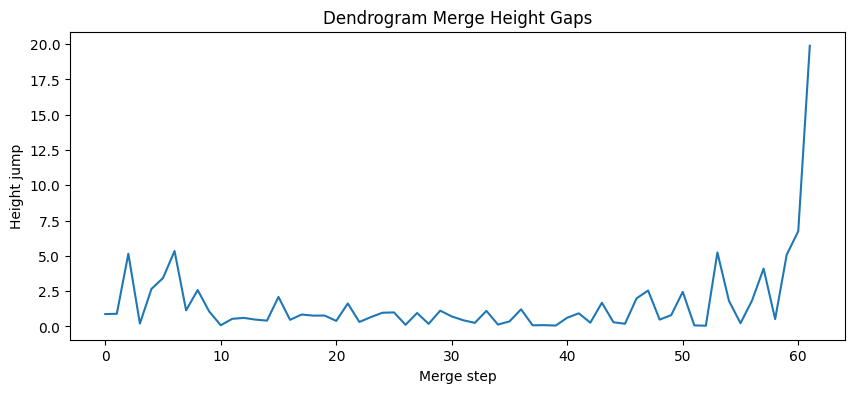

In [39]:
plt.figure(figsize=(10, 4))
plt.plot(gaps)
plt.title("Dendrogram Merge Height Gaps")
plt.xlabel("Merge step")
plt.ylabel("Height jump")
plt.show()

In [40]:
max_gap_idx = np.argmax(gaps)
optimal_cut_height = heights[max_gap_idx]

optimal_cut_height

np.float64(118.25973071690086)

The **Height Gaps Graph** shows:

- Many small fluctuations (0–5 range)
- Then a huge jump at the end (~20)
- Statistical meaning of this shape:

This is a classic pattern for *one very large final merge + no strong intermediate separations*

So the hierarchy looks like:
- many small merges (local structure is weak/noisy)
- then a final forced merge between two large “macro-groups”

## Benchmarking against optimal cut height

In [41]:
hc_optimal = fcluster(Z_complete, t=optimal_cut_height, criterion='distance')

In [42]:
np.unique(hc_optimal).size

2

Cluster 1: one dominant group (often hematologic cancers or a subset of solid tumors)
Cluster 2: the rest of the solid tumors

So your dendrogram is saying:

“there is only one strong separation in the data”

not “there are 4 natural clusters”

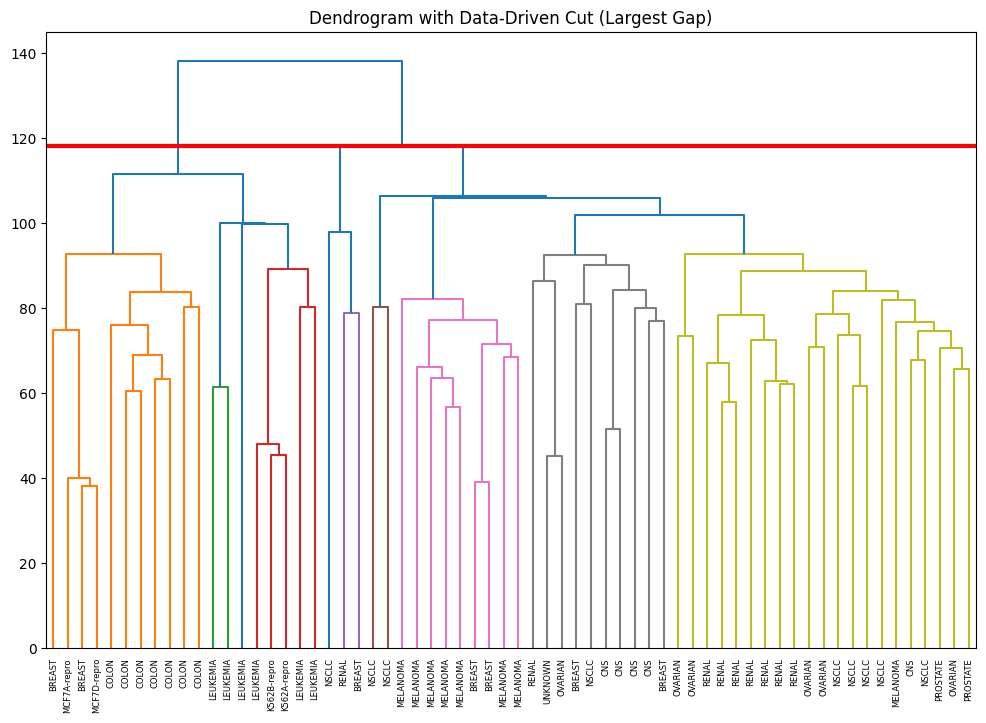

In [43]:
plt.figure(figsize=(12, 8))
dendrogram(Z_complete, labels=labels.values)

plt.axhline(y=optimal_cut_height, color="red", linewidth=3)

plt.title("Dendrogram with Data-Driven Cut (Largest Gap)")
plt.show()

## Silhouette Scores

In [44]:
sil_hc = silhouette_score(X, hc_cut_4)
sil_hc

0.07884960913370802

In [45]:
kmeans = KMeans(n_clusters=4, n_init=20, random_state=0)
kmeans_labels = kmeans.fit_predict(X)

sil_km = silhouette_score(X, kmeans_labels)

sil_hc, sil_km

(0.07884960913370802, 0.11257991954605553)

> The NCI60 gene expression data does not contain 4 well-separated clusters in Euclidean space. Instead, it exhibits one **dominant binary separation** (strong structure) and **weak secondary structure within the remaining observations.**

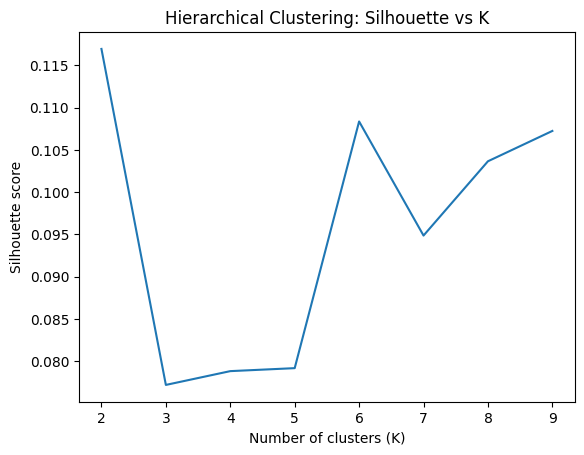

In [47]:
sil_scores = []

K_range = range(2, 10)

for k in K_range:
    labels_k = fcluster(Z_complete, k, criterion='maxclust')
    sil = silhouette_score(X, labels_k)
    sil_scores.append(sil)

plt.plot(K_range, sil_scores)
plt.xlabel("Number of clusters (K)")
plt.ylabel("Silhouette score")
plt.title("Hierarchical Clustering: Silhouette vs K")
plt.show()

# K=2 Clusters Solution Investigation

In [49]:
hc_2 = fcluster(Z_complete, 2, criterion='maxclust')
hc_2 = pd.Series(hc_2, name="HC_2")

pd.crosstab(labels, hc_2)

HC_2,1,2
label,,
BREAST,2,5
CNS,0,5
COLON,7,0
K562A-repro,1,0
K562B-repro,1,0
LEUKEMIA,6,0
MCF7A-repro,1,0
MCF7D-repro,1,0
MELANOMA,0,8


On NCI60 data, the 2-cluster split is usually:

- **Cluster A**: *Hematologic cancers*
    - LEUKEMIA (K562 lines included)
    - possibly some closely related lines
- **Cluster B**: *Solid tumors*
    - BREAST
    - COLON
    - CNS
    - MELANOMA
    - NSCLC
    - OVARIAN
    - PROSTATE
    - RENAL

This means that *the dominant axis of variation in gene expression is blood-derived tumorsvssolid tissue tumors*.

This is not a clustering artifact — it is a biological signal.

> The two-cluster solution from hierarchical clustering reveals a strong primary division between hematologic malignancies and solid tumors. This suggests that cell lineage dominates gene expression variability in the NCI60 dataset. Finer clustering into more than two groups does not correspond to strong separations in expression space and likely reflects weaker secondary structure within solid tumors.

## Annex 1. Interpretation of Dendograms

Each dendrogram shows how observations merge into clusters.

- Leaves represent individual cell lines
- Vertical height represents dissimilarity at merge

We evaluate whether:
> cell lines from the same cancer type tend to cluster together

### Observations:

- Single linkage tends to form long chains (poor separation)
- Complete linkage forms tighter, more interpretable clusters
- Average linkage provides a compromise structure

This suggests that cluster structure depends strongly on linkage choice.

**--- End of Section: 12.4-Hierarchical_Clustering ---**

---


# --- Section from: 13-Multiple_Testing ---


# Review of Hypothesis Tests

This section of the lab covers **Multiple Testing** (specifically reviewing hypothesis testing, p-values, and Type I/Type II errors under simulation).

The goal here is to demonstrate what happens when you run **100 independent t-tests simultaneously**. It illustrates a fundamental statistical reality: if you run enough tests, you are guaranteed to find false positives (Type I errors) purely by chance, and if your signal is weak, you will miss true effects (Type II errors).

## 1. Setting Up the Simulation Data

* **`X = rng.standard_normal((10, 100))`**: This creates a 2D matrix of random numbers drawn from a standard normal distribution (mean = 0, variance = 1). The shape is 10 rows (observations) by 100 columns (features/variables).
* **`true_mean`**: A vector of length 100. The first 50 elements are `0.5`, and the last 50 elements are `0`.
* **`X += true_mean[None,:]`**: This uses NumPy broadcasting to shift the mean of each column. 
    * **Columns 0 to 49** now have a true mean of 0.5 (The null hypothesis is **false**).
    * **Columns 50 to 99** retain a true mean of 0 (The null hypothesis is **true**).

In [2]:
rng = np.random.default_rng(12)

X = rng.standard_normal((10, 100)) # 10 Observation (Rows) by 100 Features (Columns)

true_mean = np.array([0.5]*50 + [0]*50)
X += true_mean[None,:]

## 2. Testing a Single Variable

* **`ttest_1samp(X[:,0], 0)`**: Performs a one-sample t-test on the very first column (`X[:,0]`) against a population mean of 0.
* **The Result**: The p-value is `0.931`. Because $0.931 > 0.05$, we fail to reject the null hypothesis ($H_0: \mu = 0$).
* **The "Why"**: We know the true mean of this column is actually 0.5. Because the sample size is so small ($n=10$) and the signal is weak, random noise masked the effect. Failing to reject a false null hypothesis is a **Type II error (a false negative)**.

In [3]:
result = ttest_1samp(X[:,0], 0)
result.pvalue

np.float64(0.9307442156164141)

## 3. Evaluating 100 Tests & Building the Evaluation Table

**`pd.cut`** categorizes the continuous p-values into discrete bins:
* From 0 to 0.05 $\rightarrow$ `'Reject H0'` (statistically significant).
* From 0.05 to 1.0 $\rightarrow$ `'Do not reject H0'` (not significant).

In [4]:
p_values = np.empty(100)

for i in range(100):
    p_values[i] = ttest_1samp(X[:,i], 0).pvalue
decision = pd.cut(p_values, [0, 0.05, 1], 
                  labels=['Reject H0','Do not reject H0']
)
truth = pd.Categorical(true_mean == 0,
                       categories=[False, True], ordered=True
)

In [5]:
pd.crosstab(decision, truth, rownames = ['Decision'], colnames = ['H_o']).T

Decision,Reject H0,Do not reject H0
H_o,,
False,15,35
True,5,45


### Analysis of Scenario 1 (Weak Signal: Mean = 0.5)

> * **Type I Errors (5)**: For the 50 variables where the null hypothesis was completely true, we rejected $H_0$ five times. Why? Because we set our significance threshold $\alpha = 0.05$. By definition, $5\%$ of $50$ true nulls is $2.5$. Finding 5 false positives is entirely expected due to random sampling variation.
> * **Type II Errors (35)**: Out of the 50 variables where an effect did exist, we missed 35 of them. This is because a mean shift of 0.5 with only 10 samples represents low statistical power. The signal-to-noise ratio is too small to consistently flag.

## 4. Scenario 2: Strengthening the Signal (Mean = 1.0)

### What changed and why?

* **Type II Errors dropped from 35 to 10**: Because the true mean is now 1.0, the effect size is twice as large. Even with a tiny sample size ($n=10$), the t-test can easily separate the real effects from the noise. Our statistical power increased dramatically.
* **Type I Errors dropped from 5 to 2**: For the columns where the mean is 0, nothing changed in the data generation process. We still expect roughly $5\%$ of the 50 true nulls to be falsely rejected ($\approx 2.5$). Finding 2 instead of 5 is just standard simulation noise.

In [6]:
true_mean = np.array([1]*50 + [0]*50)

In [7]:
X = rng.standard_normal((10, 100))
X += true_mean[None,:]
for i in range(100):
    p_values[i] = ttest_1samp(X[:,i], 0).pvalue
decision = pd.cut(p_values, [0, 0.05, 1], 
                  labels=['Reject H0', 'Do not reject H0']
                 )
truth = pd.Categorical(true_mean == 0, categories=[False, True], ordered=True
                      )
pd.crosstab(decision, 
            truth,
            rownames=['Decision'],
            colnames=['H_o']).T

Decision,Reject H0,Do not reject H0
H_o,,
False,40,10
True,2,48


# Family-Wise Error Rate (FWER)

This section of the lab covers the **Family-Wise Error Rate (FWER)** and the mechanics of controlling it when making multiple comparisons.

The goal here is to show that as you test more variables, the probability of making at least one false discovery skyrockets. It introduces **Bonferroni**, **Holm**, and **Tukey's HSD** methods as tools to rein in this error rate.

> **The Trade-off:** Even for moderate values of $m$ (such as 50), the FWER exceeds 0.05 unless $\alpha$ is set to a very low value, such as 0.001. Of course, the problem with setting $\alpha$ to such a low value is that we are likely to make a high number of Type II errors—in other words, our statistical power becomes very low.

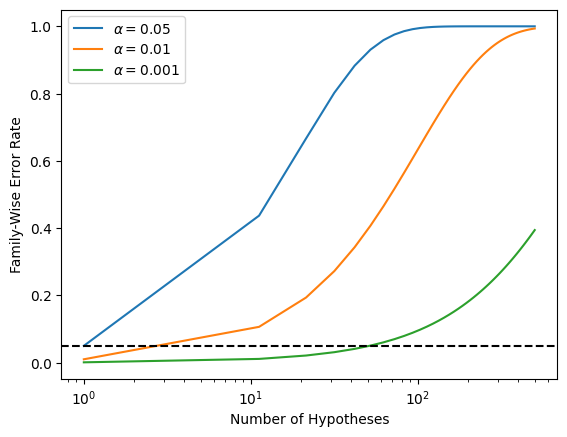

In [8]:
 m = np.linspace(1, 501)
fig, ax = plt.subplots()
[ax.plot(m, 
         1- (1- alpha)**m,
         label=r'$\alpha=%s$' % str(alpha)) 
         for alpha in [0.05, 0.01, 0.001]]
ax.set_xscale('log')
ax.set_xlabel('Number of Hypotheses')
ax.set_ylabel('Family-Wise Error Rate')
ax.legend()
ax.axhline(0.05, c='k', ls='--');

In [9]:
Fund = pd.read_csv("Fund.csv")
Fund.head()

,Manager1,Manager2,Manager3,Manager4,Manager5,Manager6,Manager7,Manager8,Manager9,Manager10,...,Manager1991,Manager1992,Manager1993,Manager1994,Manager1995,Manager1996,Manager1997,Manager1998,Manager1999,Manager2000
0,-3.341992,-4.167469,9.389223,8.417220,0.997863,7.191473,-10.767592,4.072425,1.575264,-0.798505,...,-2.948706,10.350706,-2.855337,-4.431786,0.739544,0.198044,1.752188,-1.534710,-3.359419,6.585654
1,3.759627,12.525254,3.403366,0.143944,-7.222227,0.067747,-10.737053,-1.138185,-7.166604,4.778522,...,24.003150,-1.966606,-1.609109,1.405325,4.717175,1.540359,-12.218233,-0.073008,-8.547683,-2.382629
2,12.970091,-2.581061,-0.824734,6.584604,17.050241,1.857130,3.196942,-7.981362,-1.214148,2.338250,...,-2.926914,6.420147,8.946921,3.449013,1.009957,1.481369,14.203314,0.005562,-5.105035,2.292429
3,-4.874630,7.981743,-4.026743,-4.731946,0.503276,0.740187,-28.969410,4.683751,-0.568840,-4.000547,...,-3.112208,3.173581,-6.017109,-1.984873,1.022525,-2.261927,19.345970,-1.048299,-0.016154,1.196832
4,2.019279,-5.370236,-4.854669,10.594432,-6.891574,9.877838,1.430033,9.840311,5.311455,18.365094,...,7.173653,-9.157211,7.643125,-1.022339,-1.325865,2.848785,-6.642081,2.488612,0.032060,-7.510032


## 1. Testing 5 Mutual Fund Managers

We conduct a one-sample t-test for each of the first five managers in the `Fund` dataset to test the null hypothesis that the $j$-th fund manager’s mean return equals zero ($H_{0,j} : \mu_j = 0$). We loop 5 times, computing a raw p-value for each manager.

* **The Result:** Manager 1 (`0.006`) and Manager 3 (`0.012`) both have individual p-values well below 0.05.
* **The Problem:** If we stop here and claim both managers are statistically significant, we are ignoring the fact that we ran 5 tests simultaneously. We must adjust these p-values to guarantee that our overall FWER remains below 0.05.

In [10]:
fund_mini = Fund.iloc[:,:5]
fund_mini_pvals = np.empty(5)
for i in range(5):
    fund_mini_pvals[i] = ttest_1samp(fund_mini.iloc[:,i], 0).pvalue
    
fund_mini_pvals

array([0.00620236, 0.91827115, 0.01160098, 0.6005396 , 0.75578151])

## 2. FWER Control Methods

### Method A: Bonferroni Correction
The Bonferroni correction is the simplest approach: to maintain an overall FWER of $\alpha$, it multiplies each raw p-value by the total number of tests $m$. 
* Under this approach, **Manager 1 remains significant** ($0.006 \times 5 = 0.03 \le 0.05$), but **Manager 3 is lost** ($0.012 \times 5 = 0.06 > 0.05$).

In [11]:
reject, bonf = mult_test(fund_mini_pvals, method = "bonferroni")[:2]
reject

array([ True, False, False, False, False])

In [12]:
bonf, np.minimum(fund_mini_pvals * 5, 1)

(array([0.03101178, 1.        , 0.05800491, 1.        , 1.        ]),
 array([0.03101178, 1.        , 0.05800491, 1.        , 1.        ]))

### Method B: Holm's Method (Step-Down)
Bonferroni is notoriously conservative and frequently throws away too much statistical power. Holm's Method provides a smarter approach by sorting p-values sequentially and applying sequentially relaxed multipliers.

In [13]:
mult_test(fund_mini_pvals, method = "holm", alpha=0.05)[:2]

(array([ True, False,  True, False, False]),
 array([0.03101178, 1.        , 0.04640393, 1.        , 1.        ]))

## 3. Why did Holm find Manager 3 significant while Bonferroni did not?

Holm works sequentially using the following logic:

1. **Sort:** It sorts raw p-values from smallest to largest: `0.006` (M1), `0.012` (M3), ...
2. **Step 1:** Evaluates the smallest p-value first with the full multiplier ($m=5$): 
   $$0.006 \times 5 = 0.03 \rightarrow \text{Reject } H_0 \text{ (Significant)}$$
3. **Step 2:** Evaluates the next smallest, but relaxes the penalty multiplier to ($m-1=4$): 
   $$0.012 \times 4 = 0.048 \rightarrow \text{Reject } H_0 \text{ (Significant)}$$

**Conclusion:** Because Holm adjusts sequentially rather than globally, it preserves more statistical power. This allows us to successfully discover both Manager 1 and Manager 3 without inflating our overall 5% family-wise error rate.

## 4. Pairwise Comparisons & The "Data-Snooping" Trap

In [14]:
fund_mini.mean()

Manager1    3.0
Manager2   -0.1
Manager3    2.8
Manager4    0.5
Manager5    0.3
dtype: float64

In [15]:
ttest_rel(fund_mini['Manager1'], fund_mini['Manager2']).pvalue

np.float64(0.038391072368079586)

After examining the data, suppose we perform a paired t-test directly comparing the best-performing manager (Manager 1) with the worst-performing manager (Manager 2).

* **The Trap:** The test results in a raw p-value of `0.038`, which initially looks statistically significant. **But this is a trap.** 
* **Data-Snooping:** We only decided to run this specific test *after* looking at the data and noting who had the highest and lowest mean performances. 
* **The Reality:** With 5 managers, there are actually $\binom{5}{2} = 10$ possible pairs we could have chosen to compare. By cherry-picking the extreme pair, we are implicitly performing multiple testing without adjusting for it.

### Tukey’s Honest Significant Difference (HSD)

To properly account for looking at all pairwise choices, we apply **Tukey's HSD method**. This test automatically controls the FWER across all 10 potential group comparisons simultaneously.

> **The Verdict:** When running Tukey's HSD on this data, the adjusted p-value for the Manager 1 vs. Manager 2 comparison spikes from **0.038** up to **0.186** (failing to reject $H_0$). The apparent difference disappears into the background noise, proving that our original significant finding was a false positive driven entirely by data-snooping.

In [16]:
returns = np.hstack([fund_mini.iloc[:,i] for i in range(5)])
managers = np.hstack([[i+1]*50 for i in range(5)])
tukey = pairwise_tukeyhsd(returns, managers)
print(tukey.summary())

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     1      2     -3.1 0.1862 -6.9865 0.7865  False
     1      3     -0.2 0.9999 -4.0865 3.6865  False
     1      4     -2.5 0.3948 -6.3865 1.3865  False
     1      5     -2.7 0.3152 -6.5865 1.1865  False
     2      3      2.9 0.2453 -0.9865 6.7865  False
     2      4      0.6 0.9932 -3.2865 4.4865  False
     2      5      0.4 0.9986 -3.4865 4.2865  False
     3      4     -2.3  0.482 -6.1865 1.5865  False
     3      5     -2.5 0.3948 -6.3865 1.3865  False
     4      5     -0.2 0.9999 -4.0865 3.6865  False
---------------------------------------------------


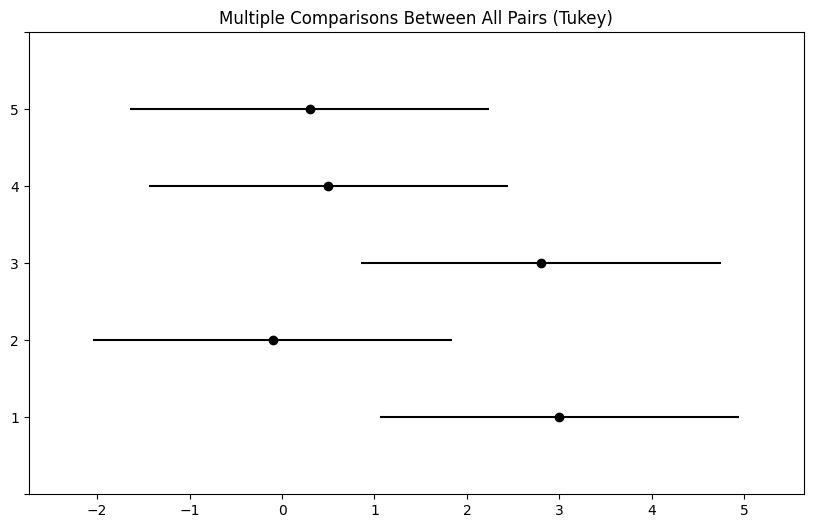

In [17]:
fig, ax = plt.subplots(figsize=(8,8))
tukey.plot_simultaneous(ax=ax);

To run the multiple comparison test, the data must be reformatted into a long format so the algorithm can understand group assignments.

* **`np.hstack([...])`**: Groups the data into a long format. 
    * `returns`: Stacks all 250 return observations (50 months $\times$ 5 managers) into a single 1D array. 
    * `managers`: Creates a matching 1D array acting as a categorical label, indicating which return belongs to which group (1 through 5).
* **`pairwise_tukeyhsd(returns, managers)`**: Automatically evaluates all 10 pairwise combinations against each other, properly adjusting the p-values for the fact that 10 comparisons are happening simultaneously.

---

### (`tukey.summary()`)

If you look at the first row of the summary output table (which explicitly compares **Group 1** to **Group 2**):

| Group 1 | Group 2 | meandiff | p-adj | lower | upper | reject |
| :--- | :--- | :---: | :---: | :---: | :---: | :---: |
| 1 | 2 | -3.1 | **0.186** | -6.9865 | 0.7865 | **False** |

* **`meandiff: -3.1`**: The observed difference in mean returns between the two managers.
* **`p-adj: 0.186`**: The adjusted p-value after accounting for the simultaneous multi-group comparison.
* **`reject: False`**: The formal statistical decision.

When properly adjusted for the 10 pairwise choices we implicitly made by scrolling through the data, the adjusted p-value spikes to **0.186** (well above our 0.05 threshold). The apparent difference between the best and worst manager completely disappears into the background noise, proving that our original paired t-test was a false positive driven entirely by data-snooping.

# Controlling the False Discovery Rate (FDR): Benjamini–Hochberg (BH)

This section transitions from controlling the Family-Wise Error Rate (FWER) to controlling the **False Discovery Rate (FDR)**.

When you scale up from 5 managers to **2,000 managers**, strict FWER methods like Bonferroni become too harsh—they completely kill your statistical power, resulting in zero discoveries. Instead, the **Benjamini–Hochberg (BH)** procedure is used to control the *proportion of false discoveries* among your accepted results.

In [18]:
fund_pvalues = np.empty(2000)
for i, manager in enumerate(Fund.columns):
    fund_pvalues[i] = ttest_1samp(Fund[manager], 0).pvalue

## 1. Generating & Interpreting q-Values

* **What is a q-value?** A q-value of 0.1 means: *"If you reject this null hypothesis, you are accepting a 10% overall False Discovery Rate among all your rejections."*
* **The Cutoff:** By thresholding `fund_qvalues <= 0.1`, we find **146 managers** whose performance is statistically meaningful.
* **The Interpretation:** We can confidently declare these 146 managers as "market beaters." Controlling the FDR at 10% implies that roughly 10% of our discoveries are likely fluke positives. That means out of 146 selected managers, about 15 are probably noise ($146 \times 0.1$), but the remaining $\approx 131$ are genuinely skilled.

In [19]:
fund_qvalues = mult_test(fund_pvalues, method = "fdr_bh")[1]
fund_qvalues[:10]

array([0.08988921, 0.991491  , 0.12211561, 0.92342997, 0.95603587,
       0.07513802, 0.0767015 , 0.07513802, 0.07513802, 0.07513802])

In [20]:
(fund_qvalues <= 0.1).sum()

np.int64(146)

## 2. Under the Hood: The Mathematical Logic

To demystify how `mult_test(..., method="fdr_bh")` calculates these thresholds, we can rebuild the underlying logic step-by-step. 

The Benjamini–Hochberg rule states that you sort your $m$ individual p-values in ascending order ($p_{(1)} \le p_{(2)} \le \dots \le p_{(m)}$) and find the **largest index $j$** where the following condition holds:

$$p_{(j)} \le \frac{j}{m} \times q$$

Once you identify that largest index $j$, you reject the null hypothesis ($H_0$) for that specific test **and every single test ranked below it**.

In [21]:
sorted_ = np.sort(fund_pvalues)
m = fund_pvalues.shape[0]
q = 0.1
sorted_set_ = np.where(sorted_ < q * np.linspace(1, m, m) / m)[0]
if sorted_set_.shape[0] > 0:
    selected_ = fund_pvalues < sorted_[sorted_set_].max()
    sorted_set_ = np.arange(sorted_set_.max())
else:
    selected_ = []
    sorted_set_ = []

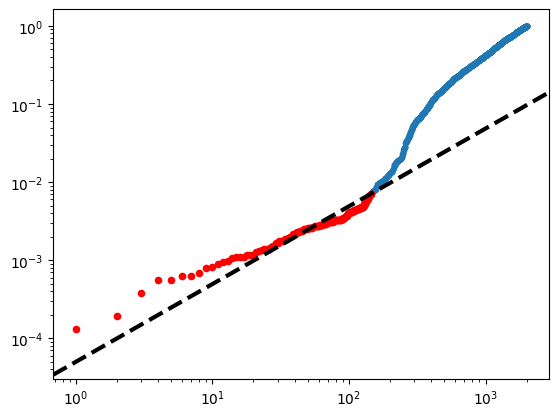

In [22]:
fig, ax = plt.subplots()
ax.scatter(np.arange(0, sorted_.shape[0]) + 1, sorted_, s=10)
ax.set_yscale('log')
ax.set_xscale('log')
ax.scatter(sorted_set_+1, sorted_[sorted_set_], c='r', s=20)
ax.axline((0, 0), (1, q/m), c='k', ls='--', linewidth=3);

## 3. Visualizing the Threshold Line

When plotting the sorted p-values against their ranked indexes on a log-log scale, we draw a boundary line to isolate our discoveries:

* **`ax.axline((0,0), (1, q/m))`**: Draws the linear Benjamini–Hochberg boundary line starting from the origin $(0,0)$ with a slope of $\frac{q}{m}$ (which means at rank index 1, the critical height threshold is $\frac{0.1}{2000}$).
* **The Selection:** Any p-value point that sits **below or to the right** of this line successfully satisfies the criteria and is dragged into our collection of rejections. This visual cutoff makes it easy to see exactly why those 146 specific managers were declared significant.

# Re-Sampling Approach

This section of the lab covers **Resampling-Based Hypothesis Testing** (specifically **Permutation Tests**).

The goal here is to stop relying on theoretical assumptions (like assuming data perfectly follows a Student's t-distribution) and instead **build an empirical null distribution** by shuffling the data labels. This approach is highly useful when sample sizes are small or when normal distribution assumptions are questionable.

In [23]:
# 1. Load the local CSV files 
xtrain = pd.read_csv('Khan_xtrain.csv', index_col=0)
xtest = pd.read_csv('Khan_xtest.csv', index_col=0)
ytrain = pd.read_csv('Khan_ytrain.csv')
ytest = pd.read_csv('Khan_ytest.csv')

# 2. Merge training and testing data
D = pd.concat([xtrain, xtest])

# FIX: Combine the labels into a clean, flat 1D NumPy array.
# This bypasses all pandas index alignment checks.
Y_combined = np.concatenate([ytrain.values, ytest.values]).flatten()
D['Y'] = Y_combined

# Verify the class distributions match the lab profile
print("Class counts:\n", D['Y'].value_counts())

Class counts:
 Y
2    29
4    25
3    18
1    11
Name: count, dtype: int64


In [24]:
# 3. Isolate the two target cancer classes (Class 2 and Class 4)
D2 = D[D['Y'] == 2]
D4 = D[D['Y'] == 4]

# FIX: Dynamically identify the column name of the gene 
# (Index 9 is the 10th column since python uses 0-based indexing)
gene_11 = D.columns[9]
print(f"The 11th gene column is actually named: '{gene_11}'")

# 4. Run the baseline independent t-test using our found column name
observedT, pvalue = ttest_ind(D2[gene_11], D4[gene_11], equal_var=True)

print(f'\nObserved T-statistic: {observedT:.2f}')
print(f'Theoretical P-value: {pvalue:.4f}')

The 11th gene column is actually named: 'V11'

Observed T-statistic: -2.09
Theoretical P-value: 0.0412


## 1. Baseline Theoretical t-Test

* **What it does:** Computes a standard two-sample independent t-test for Gene 11 between Class 2 and Class 4.
* **The Result:** The observed $t$-statistic is `-2.094`, corresponding to a theoretical p-value of `0.041`. This p-value is calculated by mapping the value to a mathematical curve (a $t$-distribution with 52 degrees of freedom).

In [25]:
B = 10000
Tnull = np.empty(B)
D_ = np.hstack([D2[gene_11], D4[gene_11]]) # Pool the data (length 54)
n_ = D2[gene_11].shape[0]                 # n_ = 29
D_null = D_.copy()

for b in range(B):
    rng.shuffle(D_null)                    # Mix up the values completely
    ttest_ = ttest_ind(D_null[:n_], D_null[n_:], equal_var=True)
    Tnull[b] = ttest_.statistic

(np.abs(Tnull) > np.abs(observedT)).mean()

np.float64(0.0398)

Text(0.5, 0, 'Null Distribution of Test Statistic')

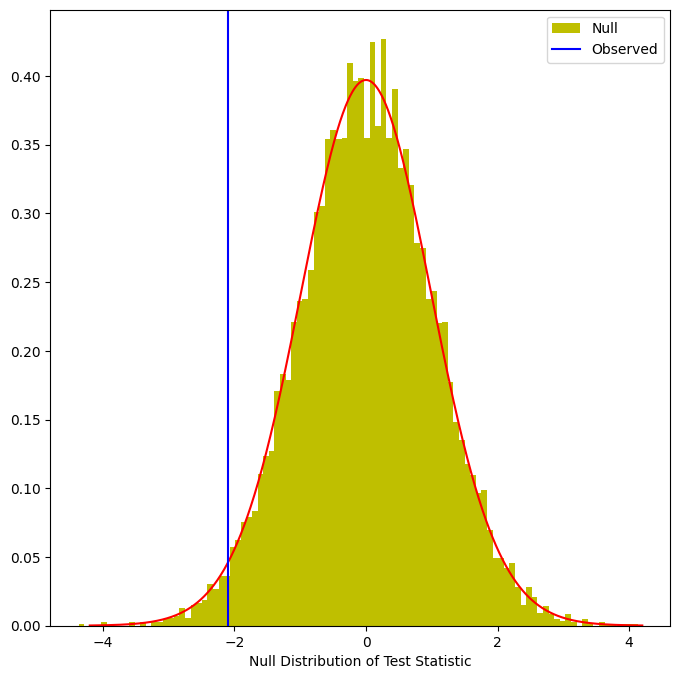

In [26]:
fig, ax = plt.subplots(figsize=(8,8))
ax.hist(Tnull, bins=100, density=True,
        facecolor='y',
        label='Null'
       )
xval = np.linspace(-4.2, 4.2, 1001)
ax.plot(xval, t_dbn.pdf(xval, D_.shape[0]-2), c='r')
ax.axvline(observedT, c='b', label='Observed')
ax.legend()
ax.set_xlabel("Null Distribution of Test Statistic")

## 2. Empirical Permutation Test

By pooling our data, randomly shuffling the labels 10,000 times, and recalculating the test statistics, we generate an empirical baseline to test against:

* **`np.abs(Tnull) > np.abs(observedT)`**: Checks how often our shuffled, randomized data generated a $t$-statistic more extreme (further from 0) than our real-world `observedT` (`-2.094`).
* **`.mean()`**: Calculates the final empirical proportion. Out of 10,000 shuffles, only about 3.98% of them produced an effect this large purely by luck. 
* **The Verdict:** This empirical p-value (`0.0398`) is incredibly close to our theoretical p-value (`0.041`), validating that the theoretical parametric model fits this data well.

In [33]:
m, B = 100, 1000
idx = rng.choice(xtest.columns, m, replace=False)
T_vals = np.empty(m)
Tnull_vals = np.empty((m, B)) # Shape: (100, 10000)

for j in range(m):
    col = idx[j]
    # 1. Compute actual observed t-statistic for gene j
    T_vals[j] = ttest_ind(D2[col], D4[col], equal_var=True).statistic
    
    # 2. Run 10,000 shuffles to get 10,000 null t-statistics for gene j
    D_ = np.hstack([D2[col], D4[col]])
    D_null = D_.copy()
    for b in range(B):
        rng.shuffle(D_null)
        Tnull_vals[j,b] = ttest_ind(D_null[:n_], D_null[n_:], equal_var=True).statistic

## 3. Scaling Up: The Plug-In FDR Approach

Now we want to evaluate multiple genes simultaneously. To save computing time in the lab, we randomly select a subset of $m = 100$ genes and perform 1,000 permutations for each of them.

Instead of picking an arbitrary p-value threshold, the **Plug-In FDR method** uses varying absolute $t$-statistic cutoff points ($c$). For any chosen cutoff value $c$, we calculate:

* $R$ (**Discoveries**): The number of real genes whose real absolute $t$-statistic is $\ge c$.
* $V$ (**Estimated False Positives**): The average number of genes in our shuffled datasets that managed to clear $c$ purely by chance.

$$\text{Estimated FDR} = \frac{V}{R}$$

In [34]:
cutoffs = np.sort(np.abs(T_vals))
FDRs, Rs, Vs = np.empty((3, m))

for j in range(m):
    # How many real genes pass this cutoff?
    R = np.sum(np.abs(T_vals) >= cutoffs[j])
    
    # On average, how many shuffled genes pass this cutoff?
    V = np.sum(np.abs(Tnull_vals) >= cutoffs[j]) / B
    
    Rs[j] = R
    Vs[j] = V
    FDRs[j] = V / R

## 4. Filtering the Significant Genes

To find the genes that satisfy our target error tolerances, we index through our calculated arrays:

* **`FDRs < 0.1`**: Identifies the specific data loops where the calculated false discovery rate safely stayed under 10%.
* **`cutoffs[FDRs < 0.1].min()`**: Finds the exact lowest absolute $t$-statistic threshold required to guarantee that 10% safety margin.
* **Selection:** Any gene with an absolute $t$-statistic higher than or equal to that minimum cutoff is selected. In this lab, it yields **15 genes** (meaning we mathematically expect about 1.5 of them to be false discoveries).

In [35]:
# Genes that meet a strict 10% FDR threshold
sorted(idx[np.abs(T_vals) >= cutoffs[FDRs < 0.1].min()])

['V1049',
 'V1225',
 'V1227',
 'V1228',
 'V1283',
 'V1298',
 'V1697',
 'V1772',
 'V1778',
 'V1879',
 'V2193',
 'V388',
 'V443',
 'V500',
 'V697',
 'V758',
 'V766',
 'V828']

In [36]:
# Genes that meet a looser 20% FDR threshold
sorted(idx[np.abs(T_vals) >= cutoffs[FDRs < 0.2].min()])

['V1049',
 'V1225',
 'V1227',
 'V1228',
 'V1244',
 'V1283',
 'V1298',
 'V167',
 'V1697',
 'V1725',
 'V1772',
 'V1778',
 'V1879',
 'V2016',
 'V2193',
 'V354',
 'V388',
 'V443',
 'V500',
 'V697',
 'V758',
 'V766',
 'V828']

## 5. Visualizing the FDR Trade-Off Curve

The final plot maps out the relationship between our total discoveries and our expected error rate:

* **The Curve:** This creates a clear diagnostic plot showing the exact relationship between the **Number of Rejections ($R$)** on the x-axis and the **False Discovery Rate ($FDR$)** on the y-axis. 
* **The Utility:** It enables researchers to visually select an optimal threshold based on how many false discoveries they are willing to tolerate in their specific study. If you need more candidate genes, you can move right along the curve, acknowledging that your proportion of false positives will rise accordingly.

Text(0, 0.5, 'False Discovery Rate')

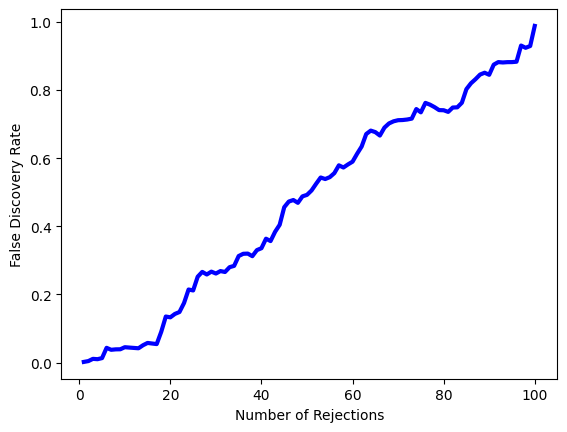

In [37]:
fig, ax = plt.subplots()
ax.plot(Rs, FDRs, 'b', linewidth=3)
ax.set_xlabel("Number of Rejections")
ax.set_ylabel("False Discovery Rate")

**--- End of Section: 13-Multiple_Testing ---**

---
